In [1]:
%pylab inline
%config InlineBackend.figure_format = 'retina'

import net3d_v10_6 as n3
import igraph as ig
import os
import json
from scipy.special import erf

jlo= lambda s: json.load(open(s,'r'))
rs = lambda n,l: sqrt(4*sqrt(2)/pi/3*4)*n**(1./3)*l**(-.5)

se = lambda s : float(s.split('th-r')[1].split('-segs')[0])
sd = lambda s,a : int(s.split('.json')[0].split('-'+a)[1].split('-')[0])


Populating the interactive namespace from numpy and matplotlib


In [2]:
sf = lambda s,a : float(s.split('.json')[0].split('-'+a)[1].split('-')[0])


In [3]:
mom = lambda A,p: (A*p).sum()/p.sum()
sig = lambda A,p: sqrt(mom(A**2,p)-mom(A,p)**2)

A1 = lambda a,b: 9*b + sqrt(3)*abs(-4*a**3 + 27*b**2)**(1./2)*(1j)**sign(-4*a**3 + 27*b**2)
so = lambda x,a: (8*2**(1./3)*3**(2./3)*a + 12**(1./3)*x**(2./3)*\
             (1 + sqrt(3)*1j)**2)/(12*x**(1./3)*(1 + sqrt(3)*1j))
so1 = lambda a,b: so(A1(a,b),a)

def rho_c(N,L,k):
    al,c = 4*2**.5/pi, 3./4 
    a = c/al*N**(-2./3)*L
    b = k**(3./2)/(3*al)
    return real(so1(a,b))

# Poisson for ER
pk = lambda k,l : (l/(k+1.))**(k+.5)*exp(-l+k+1.)/sqrt(2*pi*l)
sigmoid = lambda x: .5*(1+tanh(x/2.))

In [4]:
mom2 = lambda A,p: (A*p).sum()#/p.sum()
sig2 = lambda A,p: sqrt(mom2(A**2,p)-mom2(A,p)**2)


In [5]:
N,m = 1500,3.
x = arange(m,N)
p = 2 * m**2*x**-3.
mom2(x**(3./2),p),sig2(x**(3./2),p)

(21.729124297416345, 162.70785216844155)

In [6]:
N*m, .5*mom2(x**(2./2),p),sig2(x**(3./2),p)

(4500.0, 3.5484046011895938, 162.70785216844155)

In [7]:
def rho_c01(N,L,net='BA'):
    m = float(L)/N
    x = arange(ceil(m)+0.,N)
    if net=='BA':
        p = 2 * m**2*x**-3.
    elif net=='ER':
        p = pk(x,m)
    else:
        return None
    al,c = 4*2**.5/pi, 3./4 
    a = c/al*N**(-2./3)*L #mom2(x,p)*N/2.
    b = 1*N*mom2(x**(3./2),p)/(3*al)/2
    return real(so1(a,b))

In [8]:
def rho_c_1(N,L,p=lambda x:x**-3.):
    x = arange(1.,N)
    
    al,c = 4*2**.5/pi, 3./4
    a = c/al*N**(-2./3)*L
    ar = x**(3./2)/(3*al), p(x)
    b = L*mom(*ar)
    return real(so1(a,b))

def rho_c_2(N,L,p=lambda x:x**-3.):
    x = arange(1.,N)
    
    al,c = 4*2**.5/pi, 3./4
    a = L*mom(c/al*N**(-2./3)*x, p(x))
    # print L*mom(x,p(x))
    b = L*mom(x**(3./2)/(3*al), p(x))
    return real(so1(a,b))

def rho_c_3(N,L,k):
    al,c = 4*2**.5/pi, 3./4 
    a = c/al*N**(-2./3)*k/2
    b = k**(3./2)/(3*al)
    return real(so1(a,b))

def rho_c_4(N,L,k):
    al,c = 4*2**.5/pi, 3./4 
    a = c/al*N**(-2./3)*L
    b = N*k**(3./2)/(3*al)
    return real(so1(a,b))

def rho_c_5(N,L,p=lambda x:x**-3.):
    x = arange(1.,N)
    
    al,c = 4*2**.5/pi, 3./4
    a = c/al*N**(-2./3)*L
    ar = x**(3./2)/(3*al), p(x)
    b = 1*mom(*ar)
    return real(so1(a,b))

def rho_c_6(N,L,k):
    al,c = 4*2**.5/pi, 3./4 
    a = c/al*N**(-2./3)*k
    b = 1*k**(3./2)/(3*al)
    return real(so1(a,b))

def rho_c_7(N,L,p=lambda x:x**-3.):
    # summed over nodes, averaged over distribution in the end.
    x = arange(1.,N)
    
    al,c = 4*2**.5/pi, 3./4
    ar = c/al*N**(-2./3)*x*N, p(x)
    a = mom(*ar)
    ar = x**(3./2)/(3*al), p(x)
    b = 1*mom(*ar)
    return real(so1(a,b))

def rho_c_8(N,L,k):
    al,c = 4*2**.5/pi, 3./4 
    a = c/al*N**(-2./3)*k*N
    b = 1*k**(3./2)/(3*al)
    return real(so1(a,b))

def rho_c00(N,L,k):
    al,c = 4*2**.5/pi, 3./4 
    a = c/al*N**(-2./3)*L
    b = k**(3./2)/(3*al)
    return real(so1(a,b))

In [9]:
n,m = 100,390
v = []
for m in 100*arange(2,15,2):
    la = m/n
    x = arange(1,n)# linspace(.1, 20,150)
    # mom(x,pk(x,la))
    ar = 1/rho_c(n,m,x), pk(x,la)
    ar3 = 1/rho_c_3(n,m,x),pk(x,la)
    ar4 = 1/rho_c_4(n,m,x),pk(x,la)
    ar6 = 1/rho_c_6(n,m,x),pk(x,la)
    ar8 = 1/rho_c_8(n,m,x), pk(x,la)
    s1 = 1/ rho_c_1(n,m, lambda x0: pk(x0,la))
    s2 = 1/ rho_c_2(n,m, lambda x0: pk(x0,la))
    s5 = 1/ rho_c_5(n,m, lambda x0: pk(x0,la))
    s7 = 1/ rho_c_7(n,m, lambda x0: pk(x0,la))
    s01 = 1/ rho_c01(n,m,'ER')#, lambda x0: pk(x0,la))
    
    #s2, mom(*ar3), sig(*ar3),mom(*ar4)/2, sig(*ar4),mom(*ar6), sig(*ar6)
    v += [[m, rs(n,m), s01, mom(*ar8) , sig(*ar8), s7,s5, mom(*ar) , sig(*ar)]]
    print ('%d: '+'%.2g, '*(len(v[-1])-1)) %(tuple(v[-1]))
v = array(v)

200: 0.51, 1.2, 0.55, 0.15, 0.49, 0.54, 0.54, 0.063, 
400: 0.36, 0.89, 0.41, 0.12, 0.37, 0.37, 0.38, 0.016, 
600: 0.29, 0.74, 0.33, 0.088, 0.31, 0.31, 0.31, 0.0087, 
800: 0.25, 0.65, 0.28, 0.063, 0.26, 0.26, 0.26, 0.0062, 
1000: 0.23, 0.58, 0.25, 0.047, 0.24, 0.24, 0.24, 0.0049, 
1200: 0.21, 0.54, 0.22, 0.037, 0.22, 0.22, 0.22, 0.004, 
1400: 0.19, 0.5, 0.21, 0.031, 0.2, 0.2, 0.2, 0.0034, 


/home/nidami/tf_gpu/local/lib/python2.7/site-packages/matplotlib/cbook/deprecation.py:107: MatplotlibDeprecationWarning: cycling among columns of inputs with non-matching shapes is deprecated.
  warnings.warn(message, mplDeprecation, stacklevel=1)


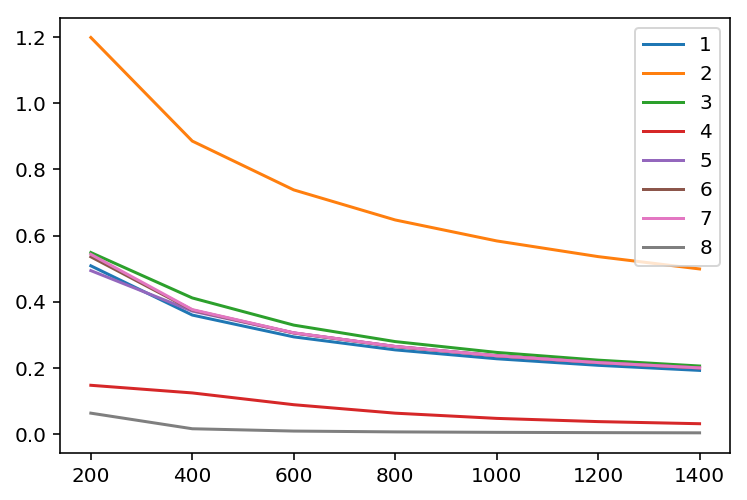

In [10]:
plot(v.T[[0]*3].T, v.T[range(1,len(v[-1]))].T, )

legend(range(1,len(v[-1])))

# __!!either make netRads unweighted, or figure out why the sizes are too big!!__ 

# __1)__ !! Links sved with __Thickness = 0.1__!!!! must be changed to 1, when unweighted, thickness must be absolute thickness 
# __2)__ Node radii always weighted!! 

# __!!!! Changed ct to $r_M/\Delta L$ from $r_M^2/\Delta L$ __

In [11]:
llen = lambda x,m: norm(gradient(x)[m],axis=-1).sum(-1)

def get_curv6(lnk,ep=1e-3):
    #lnk = net.links.points.reshape((len(net.edg),net.links.segs,net.pts.shape[-1]))
    dl = gradient(lnk)[1][:,1:-1]
    ddl = gradient(dl)[1]
    l0 = llen(lnk,1)[:,newaxis]/lnk.shape[1] 
    cur0 = 2*norm(cross(dl,ddl))/(norm(dl)**3+(.1*l0)**3) #maximum(mag(dl)**3,ep)#
    return cur0.mean(-1)#sqrt((cur0**2).mean(-1))

def get_lc3(fnam):
    net = json.load(open( fnam,'r'))
    lnk = array([v['points'] for k,v in net['links'].iteritems()])
    n = len(net['nodes']['positions'])
    l = len(lnk)
    #rc = rs(n,l)
    return net['info']['links']['thickness'],llen(lnk,1).sum(),llen(lnk[:,[0,-1]],1).sum()\
            ,get_curv6(lnk).sum(), #wiza(net)

def get_vars3(nam = 'Lat',pth = '../../output/phase-101817/',
              w = 1000, ep=0.1, fx = False, fil = ''):
    t = {k:[] for k in ['th','t','v','a1','a2','lz','lz0','cur','l', 'ka','wz','nam']}
    ii = 0
    f = ('-fixed' if fx else '')
    ff = lambda x:(('-fixed' in x)  if fx else not ('-fixed' in x))
    l=sorted([i for i in os.listdir(pth) \
              if (nam+'-' in i) and ('-th' in i) and ('.json' in i) and ff(i) ])
    if len(l)<1:
        print "No Files found!!"
        return None
    print pth,

    for i in l:
        print ii,i, ;ii += 1
        s= i[:-5]
        #print s
        try:
            tv = loadtxt(pth+s+'-tv.txt')#'BA-4-n70-L137-th-r0.871-segs30-ka0.115-tv.txt') #
        except IOError:
            print "!!! not found..."
            continue
        # measure gradient
        th,lz,lz0,cur = get_lc3(pth+i) 
#         if (lz/lz0 > 1.5) and (th<1): #wz/th >1:
#             print "!!! Large Oscillations, skipping..."
#             continue
        t['th'] += [th]
        t['t'] += [tv[-1,0]]
        t['v'] += [tv[-1,1]]
        t['lz'] += [lz]
        t['lz0'] += [lz0]
        t['cur'] += [cur]
        t['l'] += [len(tv)]
        t['ka'] += [float(i.split('-ka')[1].split(f+'.json')[0])]
        t['nam'] += [i]

    for k in t:
        t[k] = array(t[k])
    return t#{k:t[k][idx] for k in t}

    
def shade(data,falpha = .3, **kw):
    plot(*data.T[:2], **kw)
    y1 = data[:,1]+ data[:,2]
    y2 = maximum(1e-8, data[:,1]- data[:,2])
    k1 = ({'facecolor':kw['c']} if 'c' in kw else {})
    fill_between(data[:,0], y1,y2,alpha = falpha,**k1 )
    xscale('log')
    
def bin_dat1(th,l, n=30,scale='log'):
    bb = {}
    mx = (th.min(),th.max())
    dx = log10(mx[1]/mx[0])/n
    #print dx
    for i in zip(th,l):
        k = int(log10(i[0])/dx)
        bb.setdefault(k ,[])
        bb[k] += [i[1]]
    return array([[10**(k*dx), ]+(lms(bb[k]) if scale=='log' else [mean(bb[k]),std(bb[k])] ) for k in sorted(bb)])
    #exp(mean(log(bb[k]))),exp(std(log(bb[k])))
lms = lambda x: [exp(mean(log(x))), exp(std(log(x)))]


In [12]:
def get_rc(k):
    n,m = (sd(k,'n'),sd(k,'L') ) 
#     lth = stats[k]
#     gr = gradient(log(lth.T[-1]))/gradient(log(lth.T[0]))
#     th = lth.T[0]
    la = ceil( m/float(n))
    x = arange(1.,n)
    if k.split('-')[0]=='ER':
        p = pk(x,la)
    elif k.split('-')[0]=='BA':
        p = x**-3
    else: raise ValueError
    ar = 1/rho_c(n,m,x), p 
    return mom(*ar), sig(*ar)
    

def trans_region(k, y1=0, y2=5, alpha=.3,scaled=True):
    rc ,si = get_rc(k)
    si = sqrt(2)/log(s)
    r0 = log(rc)
    c = ('orange' if 'ER' in k else 'blue')
    fill_between(exp([r0-3*si,r0+3*si])/(rc if scaled else 1), [y1]*2, [y2]*2, alpha = alpha , facecolor=c)


In [13]:
mt = mpl.colors.TABLEAU_COLORS

In [14]:
# pth = '../../output/phase-101817/'
# pth = '../../output/phase-032418/'
# pth = '../../output/phase-finite-032418/'
# pth1 = '../../output/phase-finite-032718/'
# pth = '../../output/phase-finite-032718/'
# pth = '../../output/phase-finite-032818/' # good!!!

# pth = '../../output/phase-finite-032818-1/'
# pth = '../../output/phase-finite-040418/'
# pth = '../../output/phase-finite-032918/'
pth = '../../output/phase-finite-040518/'
# pth = '../../output/phase-finite-042518/'

# pth = '../../output/phase-finite-042518/kA-2/'
# pth = '../../output/phase-finite-042518/kA-3/'
# pth = '../../output/phase-finite-042518/kA-4/'

# pth = '../../output/phase-finite-042518/POW/'

l_full = os.listdir(pth) #[i for i in os.listdir(pth) if '-segs15' in i]
#l_full

In [15]:
[i for i in l_full if 'seg' not in i and 'txt' not in i]

['ER-0-n100-L3799.json',
 'ER-1-n100-L579.json',
 'ER-0-n42-L51.json',
 'ER-1-n96-L197.json',
 'BA-0-n50-L97.json',
 'Lat-0-n500-L1309.json',
 'Lat-0-n600-L1580.json',
 'ER-0-n50-L949.json',
 'ER-0-n97-L197.json',
 'BA-0-n200-L397.json',
 'BA-0-n100-L197.json',
 'ER-0-n76-L99.json',
 'ER-1-n200-L594.json',
 'ER-1-n100-L764.json',
 'ER-0-n161-L202.json',
 'Lat-0-n700-L1860.json',
 'Lat-0-n300-L760.json',
 'BA-0-n50-L595.json',
 'BA-0-n100-L2322.json',
 'ER-0-n100-L1390.json',
 'ER-1-n200-L790.json',
 'ER-0-n50-L632.json',
 'ER-0-n50-L348.json',
 'ER-1-n100-L1295.json',
 'ER-0-n200-L824.json',
 'ER-1-n200-L985.json',
 'ER-0-n50-L595.json',
 'ER-0-n100-L2554.json',
 'old',
 'ER-0-n50-L1159.json',
 'ER-1-n95-L196.json',
 'ER-0-n100-L2322.json',
 'ER-1-n198-L397.json',
 'ER-0-n200-L790.json',
 'ER-0-n197-L397.json',
 'ER-1-n100-L390.json',
 'BA-0-n50-L949.json',
 'BA-0-n50-L1159.json',
 'ER-0-n50-L97.json',
 'ER-0-n50-L907.json',
 'ER-1-n200-L1179.json',
 'ER-1-n100-L1122.json',
 'ER-1-n100

In [16]:
lf = {} 
for k in l_full:
    if 'th-r' not in k or '-tv.txt' in k:continue
#     if 'fixed' in k: continue
#     if 'BA-' not in k: continue 
    k0 = k.split('-th-r')[0] +('-fixed' if 'fixed' in k else '')
    lf.setdefault(k0,[])
    lf[k0] += [k]
lf.keys()

['Lat-0-n500-L1309',
 'ER-0-n97-L197-fixed',
 'ER-1-n198-L397',
 'BA-0-n100-L197',
 'Lat-0-n600-L1580',
 'ER-0-n197-L397',
 'BA-0-n50-L1159',
 'ER-1-n96-L197',
 'Lat-0-n700-L1860',
 'ER-0-n50-L1159',
 'ER-0-n200-L790',
 'BA-0-n50-L595',
 'BA-0-n100-L197-fixed',
 'ER-1-n200-L594',
 'Lat-0-n150-L359',
 'BA-0-n200-L397-fixed',
 'Lat-0-n400-L1030',
 'ER-0-n50-L348',
 'ER-0-n50-L595',
 'ER-1-n100-L945',
 'ER-1-n200-L790',
 'BA-0-n50-L949',
 'ER-0-n197-L397-fixed',
 'ER-0-n97-L197',
 'ER-0-n50-L97',
 'BA-0-n200-L397',
 'ER-0-n50-L97-fixed',
 'ER-1-n100-L1122',
 'ER-1-n100-L764',
 'BA-0-n200-L790',
 'Lat-0-n300-L760',
 'ER-1-n100-L579',
 'BA-0-n50-L97',
 'BA-0-n50-L97-fixed',
 'ER-1-n100-L390']

In [17]:
# mkdir ../../output/phase-finite-032818/

In [18]:
# pth1 = '../../output/phase-finite-032818/'
# lc = [i for i in os.listdir(pth) if 'th-r' not in i and '.txt' not in i]
# for i in lc:
#     os.system('cp '+pth+i+' '+pth1+i)

In [19]:
#os.listdir(pth1)

When the gradient is steep, forces are consistent. We usually avoid steep gradients by making the time steps smaller, because $dx \propto F$ and so large forces result in large movements. 
But what about when the lengths keeps moving either up or down? If the rate is not slowing down, we could speed up by _increasing_ time steps. To check if rates are consistent, we can basically look at the second derivative, or compare rates at the beginning and end of the window. 
We want the steps to get larger is the gradient is very steep

# make everything scale independent 

In [20]:
lf.keys()

['Lat-0-n500-L1309',
 'ER-0-n97-L197-fixed',
 'ER-1-n198-L397',
 'BA-0-n100-L197',
 'Lat-0-n600-L1580',
 'ER-0-n197-L397',
 'BA-0-n50-L1159',
 'ER-1-n96-L197',
 'Lat-0-n700-L1860',
 'ER-0-n50-L1159',
 'ER-0-n200-L790',
 'BA-0-n50-L595',
 'BA-0-n100-L197-fixed',
 'ER-1-n200-L594',
 'Lat-0-n150-L359',
 'BA-0-n200-L397-fixed',
 'Lat-0-n400-L1030',
 'ER-0-n50-L348',
 'ER-0-n50-L595',
 'ER-1-n100-L945',
 'ER-1-n200-L790',
 'BA-0-n50-L949',
 'ER-0-n197-L397-fixed',
 'ER-0-n97-L197',
 'ER-0-n50-L97',
 'BA-0-n200-L397',
 'ER-0-n50-L97-fixed',
 'ER-1-n100-L1122',
 'ER-1-n100-L764',
 'BA-0-n200-L790',
 'Lat-0-n300-L760',
 'ER-1-n100-L579',
 'BA-0-n50-L97',
 'BA-0-n50-L97-fixed',
 'ER-1-n100-L390']

In [21]:
stats ={}
done = []

In [53]:
lab = {}
for k1,l1 in lf.iteritems(): 
#     if k1 in done:
#     if k1 != 'BA-0-n200-L790':#'BA-0-n50-L97': 
#         continue
    lth = []
#     if 'BA' not in k1: continue
#     if k1 != 'BA-1-n100-L197': continue
    print k1
#     try:
    for i in l1:
        try:
#         print i 
            net = jlo(pth+i)
            ll = [(norm(gradient(v['points'])[0],axis=-1)**2).sum() for k,v in net['links'].iteritems()]
            #ll = [(norm(gradient(v['points'])[0],axis=-1)**2).sum() for k,v in net['links'].iteritems()]
    #         ll2 = [norm(v['points']) for k,v in net['links'].iteritems()]

            tv = loadtxt(pth+i.split('.json')[0]+'-tv.txt')
    #         loglog(*tv.T)
    #         show()
            ka = net['info']['links']['k']/ net['info']['nodes']['amplitude']* sf(i,'th-r')
    
            lth += [[net['info']['links']['thickness'], sum(ll),]+ tv[-1].tolist()+[ka]] #, sum(ll2)
#     except ValueError: 
        except IOError:
            print "Error loading: ", i
            #continue
            
    lth = array(lth)
    lth = lth[argsort(lth[:,0])]
    stats[k1] = lth
    done += [k1]
    
    i = l1[-1]
#     ka = net['info']['links']['k']/ net['info']['links']['amplitude']* max(sf(i,'th-r'),1.)
    ka = net['info']['links']['k']/ net['info']['nodes']['amplitude']* sf(i,'th-r')
    
    # ka = sf(i,'ka')*max(sf(i,'th-r'),1.)
    lab[k1] = 'k/A=%.1g'%(ka)

Lat-0-n500-L1309
ER-0-n97-L197-fixed
ER-1-n198-L397
BA-0-n100-L197
Lat-0-n600-L1580
ER-0-n197-L397
BA-0-n50-L1159
ER-1-n96-L197
Lat-0-n700-L1860
ER-0-n50-L1159
ER-0-n200-L790
BA-0-n50-L595
BA-0-n100-L197-fixed
ER-1-n200-L594
Lat-0-n150-L359
BA-0-n200-L397-fixed
Lat-0-n400-L1030
ER-0-n50-L348
ER-0-n50-L595
ER-1-n100-L945
ER-1-n200-L790
BA-0-n50-L949
ER-0-n197-L397-fixed
ER-0-n97-L197
ER-0-n50-L97
BA-0-n200-L397
ER-0-n50-L97-fixed
ER-1-n100-L1122
ER-1-n100-L764
BA-0-n200-L790
Lat-0-n300-L760
ER-1-n100-L579
BA-0-n50-L97
BA-0-n50-L97-fixed
ER-1-n100-L390


In [52]:
lab

{'BA-0-n100-L197': 'k/A=0.1',
 'BA-0-n100-L197-fixed': 'k/A=0.1',
 'BA-0-n200-L397': 'k/A=0.1',
 'BA-0-n200-L397-fixed': 'k/A=0.1',
 'BA-0-n200-L790': 'k/A=0.1',
 'BA-0-n50-L1159': 'k/A=0.005',
 'BA-0-n50-L595': 'k/A=0.005',
 'BA-0-n50-L949': 'k/A=0.005',
 'BA-0-n50-L97': 'k/A=0.005',
 'BA-0-n50-L97-fixed': 'k/A=0.005',
 'ER-0-n197-L397': 'k/A=0.1',
 'ER-0-n197-L397-fixed': 'k/A=0.1',
 'ER-0-n200-L790': 'k/A=0.1',
 'ER-0-n50-L1159': 'k/A=0.005',
 'ER-0-n50-L348': 'k/A=0.005',
 'ER-0-n50-L595': 'k/A=0.005',
 'ER-0-n50-L97': 'k/A=0.005',
 'ER-0-n50-L97-fixed': 'k/A=0.005',
 'ER-0-n97-L197': 'k/A=0.1',
 'ER-0-n97-L197-fixed': 'k/A=0.1',
 'ER-1-n100-L1122': 'k/A=0.005',
 'ER-1-n100-L390': 'k/A=0.01',
 'ER-1-n100-L579': 'k/A=0.01',
 'ER-1-n100-L764': 'k/A=0.01',
 'ER-1-n100-L945': 'k/A=0.005',
 'ER-1-n198-L397': 'k/A=0.01',
 'ER-1-n200-L594': 'k/A=0.005',
 'ER-1-n200-L790': 'k/A=0.005',
 'ER-1-n96-L197': 'k/A=0.01',
 'Lat-0-n150-L359': 'k/A=0.1',
 'Lat-0-n300-L760': 'k/A=0.1',
 'Lat-0-n400-

/home/nidami/tf_gpu/local/lib/python2.7/site-packages/matplotlib/cbook/deprecation.py:107: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  warnings.warn(message, mplDeprecation, stacklevel=1)


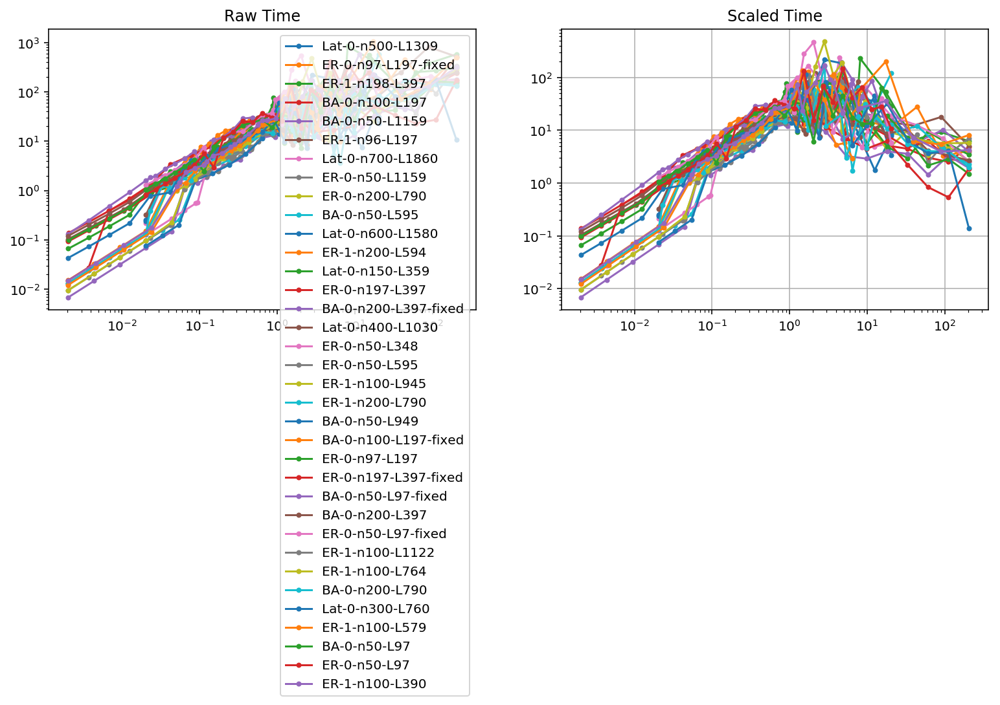

In [24]:
figure(figsize=(13,4))
for k,lth in stats.iteritems(): 
    r_c = rs(sd(k,'n'),sd(k,'L'))
    s = maximum(net['info']['nodes']['radius']**1,lth.T[0]**1)# / lth.T[1]
    t = lth.T[-2] #/ s
    subplot(121)
    title('Raw Time')
    loglog(lth.T[0]/r_c,t, marker='.', label = k)
    legend()
    subplot(122)
    title('Scaled Time')
    loglog(lth.T[0]/r_c,t/s, marker='.', label = k)
    #legend()
    grid()
#     xscale('log')
#     yscale('log')
    
# legend()

In [25]:
sorted(lf.keys())

['BA-0-n100-L197',
 'BA-0-n100-L197-fixed',
 'BA-0-n200-L397',
 'BA-0-n200-L397-fixed',
 'BA-0-n200-L790',
 'BA-0-n50-L1159',
 'BA-0-n50-L595',
 'BA-0-n50-L949',
 'BA-0-n50-L97',
 'BA-0-n50-L97-fixed',
 'ER-0-n197-L397',
 'ER-0-n197-L397-fixed',
 'ER-0-n200-L790',
 'ER-0-n50-L1159',
 'ER-0-n50-L348',
 'ER-0-n50-L595',
 'ER-0-n50-L97',
 'ER-0-n50-L97-fixed',
 'ER-0-n97-L197',
 'ER-0-n97-L197-fixed',
 'ER-1-n100-L1122',
 'ER-1-n100-L390',
 'ER-1-n100-L579',
 'ER-1-n100-L764',
 'ER-1-n100-L945',
 'ER-1-n198-L397',
 'ER-1-n200-L594',
 'ER-1-n200-L790',
 'ER-1-n96-L197',
 'Lat-0-n150-L359',
 'Lat-0-n300-L760',
 'Lat-0-n400-L1030',
 'Lat-0-n500-L1309',
 'Lat-0-n600-L1580',
 'Lat-0-n700-L1860']

In [56]:
lab

{'BA-0-n100-L197': 'k/A=0.1',
 'BA-0-n100-L197-fixed': 'k/A=0.1',
 'BA-0-n200-L397': 'k/A=0.1',
 'BA-0-n200-L397-fixed': 'k/A=0.1',
 'BA-0-n200-L790': 'k/A=0.1',
 'BA-0-n50-L1159': 'k/A=0.005',
 'BA-0-n50-L595': 'k/A=0.005',
 'BA-0-n50-L949': 'k/A=0.005',
 'BA-0-n50-L97': 'k/A=0.005',
 'BA-0-n50-L97-fixed': 'k/A=0.005',
 'ER-0-n197-L397': 'k/A=0.1',
 'ER-0-n197-L397-fixed': 'k/A=0.1',
 'ER-0-n200-L790': 'k/A=0.1',
 'ER-0-n50-L1159': 'k/A=0.005',
 'ER-0-n50-L348': 'k/A=0.005',
 'ER-0-n50-L595': 'k/A=0.005',
 'ER-0-n50-L97': 'k/A=0.005',
 'ER-0-n50-L97-fixed': 'k/A=0.005',
 'ER-0-n97-L197': 'k/A=0.1',
 'ER-0-n97-L197-fixed': 'k/A=0.1',
 'ER-1-n100-L1122': 'k/A=0.005',
 'ER-1-n100-L390': 'k/A=0.01',
 'ER-1-n100-L579': 'k/A=0.01',
 'ER-1-n100-L764': 'k/A=0.01',
 'ER-1-n100-L945': 'k/A=0.005',
 'ER-1-n198-L397': 'k/A=0.01',
 'ER-1-n200-L594': 'k/A=0.005',
 'ER-1-n200-L790': 'k/A=0.005',
 'ER-1-n96-L197': 'k/A=0.01',
 'Lat-0-n150-L359': 'k/A=0.1',
 'Lat-0-n300-L760': 'k/A=0.1',
 'Lat-0-n400-

In [57]:
bal = {int(log10(float(lab[k][4:]))):k for k,v in lab.items()}
sorted(bal)

[-2, -1]

Loose (with tol/4 mean override in check_convergence) checking POW=2,3,4,6


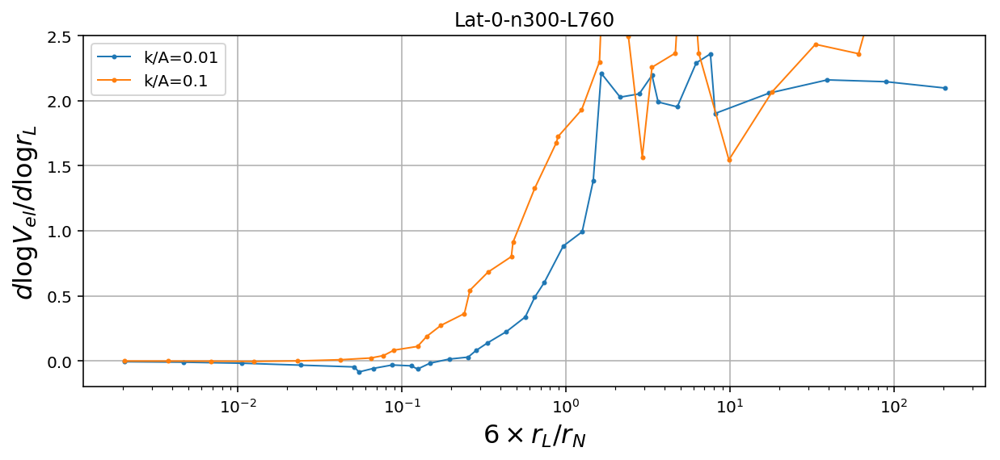

In [58]:
r = linspace(-10,10)
fig = figure(figsize=(10,4))
fig.subplots_adjust(wspace=0)

a = 1.
md = {'BA':[10000,1],'ER':[10000,1],'Lat':[10000,1]}
nd = {'BA':[10000,1],'ER':[10000,1],'Lat':[10000,1]}
s = ['k/A=%.1g' %(10**(-2+i)) for i in range(4)]
# lab = {k: s[i] for i,k in enumerate(sorted(lf.keys()))}
bal = {int(log10(float(lab[k][4:]))):k for k,v in lab.items()}

# for k in sorted(stats):
for ak in sorted (bal):
    k = bal[ak]
#     if 'Lat' not in k: continue
    if 'fixed' in k: continue
#     if k == 'BA-0-n50-L97': continue
#     if k == 'ER-0-n50-L97': continue

#     if k == 'BA-0-n50-L595': continue
#     if k == 'ER-0-n50-L595': continue

    c = (mt['tab:blue'] if 'BA' in k else mt['tab:orange'])
    n,m = (sd(k,'n'),sd(k,'L') ) 
    md[k.split('-')[0]][0] = min(m,md[k.split('-')[0]][0])
    md[k.split('-')[0]][1] = max(m,md[k.split('-')[0]][1])
    nd[k.split('-')[0]][0] = min(n,nd[k.split('-')[0]][0])
    nd[k.split('-')[0]][1] = max(n,nd[k.split('-')[0]][1])
    
    
    lth = stats[k]
    gr = gradient(log(lth.T[1]))/gradient(log(lth.T[0]))
    th = lth.T[0]+0.
#     print k
    la = m/n
    x = arange(1.,n)# linspace(.1, 20,150)
    # mom(x,pk(x,la))
    ar = 1/rho_c(n,m,x), (pk(x,la) if 'ER-' in k else (x**-3 if 'BA-' in k else exp(-x**2)))# x**-3 #pk(x,la)
    m0,r0,s = mom(*ar), rs(n,m), sig(*ar)
#     print ('%d: '+'%.2g, '*3) %(m, m0,r0,s)
    r1 = log(th)
#     subplot(121)
#     plot(th/(1./6),gr,'.-',ms=4,lw = 1, alpha = a,label=lab[k])
#     plot(th/(r0/sqrt(4*sqrt(2)/pi/3*4)),gr,'.-',ms=4,lw = 1, alpha = a,label=lab[k])
    plot(th/(r0),gr,'.-',ms=4,lw = 1, alpha = a,label=lab[k])
    
title(k)
# plot(th, 2*sigmoid(log(th/.166)*2),'k--', label = r'1')
th = logspace(log10(th.min()), log10(th.max()))
# plot(th/1., 1+erf(log(th)),'k--', label = r'$1+erf[log(r_L/r_N)]$')
# plot(th/1., 1+erf(log(th)*2),'g--', label = r'$2-2/(1+(r)^2)$')
# plot(th/(1./6), 2*(1-1/(1+(1*th)**2)),'k--', label = r'$2-2/(1+(r)^2)$')
# plot(th/(1./6), 2*(1-1/(1+(1*th)**6)),'k--', label = r'$2-2/(1+(6r)^2)$')
grid()
xscale('log')
xlabel(r'$6\times r_L/r_N$',fontsize=16)
ylabel(r'${d \log V_{el} }/{d\log r_L}$',fontsize=16 )
legend()
ylim(-.2,2.5)
print "Loose (with tol/4 mean override in check_convergence) checking POW=2,3,4,6"

Loose (with tol/4 mean override in check_convergence) checking POW=2,3,4,6


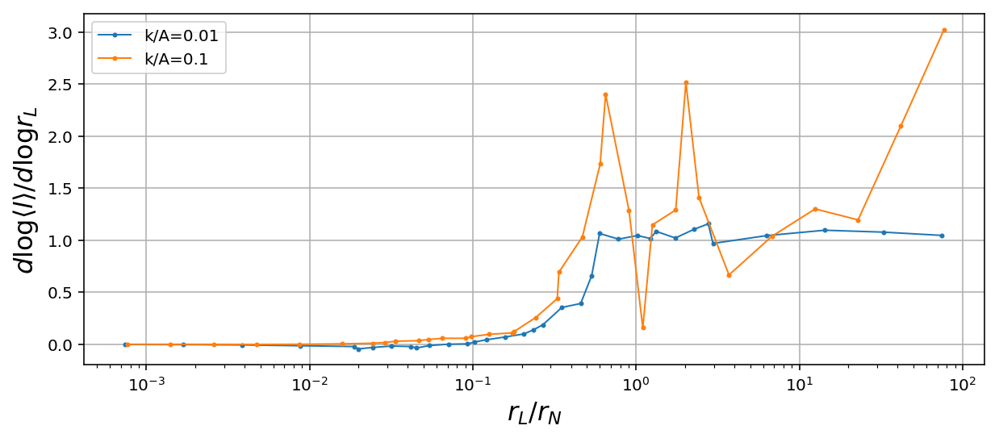

In [54]:
r = linspace(-10,10)
fig = figure(figsize=(10,4))
fig.subplots_adjust(wspace=0)

a = 1.

bal = {int(log10(float(lab[k][4:]))):k for k,v in lab.items()}

# for k in sorted(stats):
for ak in sorted (bal):
    k = bal[ak]
#     if 'Lat' not in k: continue
    if 'fixed' in k: continue
#     if k == 'BA-0-n50-L97': continue
#     if k == 'ER-0-n50-L97': continue

#     if k == 'BA-0-n50-L595': continue
#     if k == 'ER-0-n50-L595': continue

    c = (mt['tab:blue'] if 'BA' in k else mt['tab:orange'])
    n,m = (sd(k,'n'),sd(k,'L') ) 
    
    
    lth = stats[k]
    gr = gradient(log(lth.T[3]))/gradient(log(lth.T[0]))
    th = lth.T[0]
#     print k
    la = m/n
    x = arange(1.,n)# linspace(.1, 20,150)
    # mom(x,pk(x,la))
    ar = 1/rho_c(n,m,x), (pk(x,la) if 'ER-' in k else (x**-3 if 'BA-' in k else exp(-x**2)))# x**-3 #pk(x,la)
    m0,r0,s = mom(*ar), rs(n,m), sig(*ar)
#     print ('%d: '+'%.2g, '*3) %(m, m0,r0,s)
    r1 = log(th)
#     subplot(121)
    plot(th,gr,'.-',ms=4,lw = 1, alpha = a,label=lab[k])
    

# plot(th, 2*sigmoid(log(th/.166)*2),'k--', label = r'1')

# plot(th/(1./6), 2*(1-1/(1+(6*th)**2)),'k--', label = r'$2-2/(1+r^2)$')
grid()
xscale('log')
xlabel(r'$r_L/r_N$',fontsize=16)
ylabel(r'${d \log\langle l \rangle }/{d\log r_L}$',fontsize=16 )
legend()
# ylim(-.1,3.5)
print "Loose (with tol/4 mean override in check_convergence) checking POW=2,3,4,6"

In [713]:
jjjdjjdj

NameError: name 'jjjdjjdj' is not defined

strict (no mean override in check_convergence) checking POWn=2,3,4,6


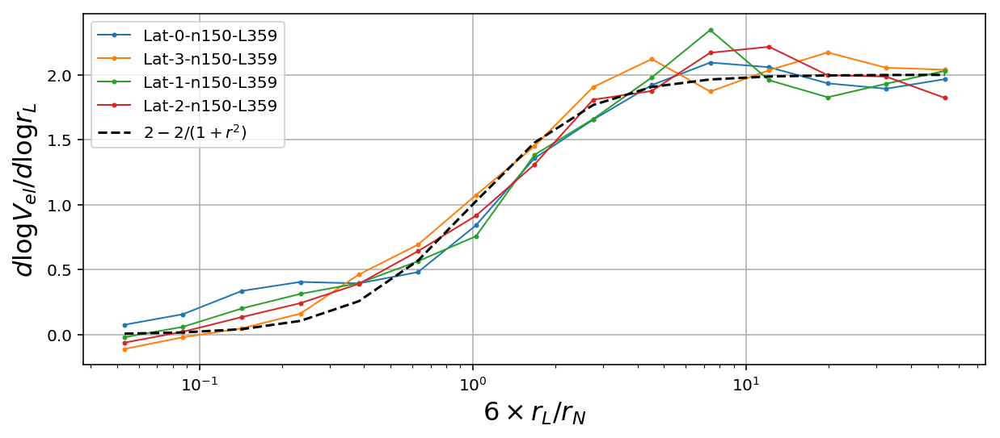

In [75]:
r = linspace(-10,10)
fig = figure(figsize=(10,4))
fig.subplots_adjust(wspace=0)

a = 1.
md = {'BA':[10000,1],'ER':[10000,1],'Lat':[10000,1]}
nd = {'BA':[10000,1],'ER':[10000,1],'Lat':[10000,1]}

for k in stats:
    if 'Lat' not in k: continue
    if 'fixed' in k: continue
#     if k == 'BA-0-n50-L97': continue
#     if k == 'ER-0-n50-L97': continue

#     if k == 'BA-0-n50-L595': continue
#     if k == 'ER-0-n50-L595': continue

    c = (mt['tab:blue'] if 'BA' in k else mt['tab:orange'])
    n,m = (sd(k,'n'),sd(k,'L') ) 
    md[k.split('-')[0]][0] = min(m,md[k.split('-')[0]][0])
    md[k.split('-')[0]][1] = max(m,md[k.split('-')[0]][1])
    nd[k.split('-')[0]][0] = min(n,nd[k.split('-')[0]][0])
    nd[k.split('-')[0]][1] = max(n,nd[k.split('-')[0]][1])
    
    
    lth = stats[k]
    gr = gradient(log(lth.T[1]))/gradient(log(lth.T[0]))
    th = lth.T[0]
#     print k
    la = m/n
    x = arange(1.,n)# linspace(.1, 20,150)
    # mom(x,pk(x,la))
    ar = 1/rho_c(n,m,x), (pk(x,la) if 'ER-' in k else (x**-3 if 'BA-' in k else exp(-x**2)))# x**-3 #pk(x,la)
    m0,r0,s = mom(*ar), rs(n,m), sig(*ar)
#     print ('%d: '+'%.2g, '*3) %(m, m0,r0,s)
    r1 = log(th)
#     subplot(121)
    plot(th/(1./6),gr,'.-',ms=4,lw = 1, alpha = a,label=k)
    

# plot(th, 2*sigmoid(log(th/.166)*2),'k--', label = r'1')

plot(th/(1./6), 2*(1-1/(1+(6*th)**2)),'k--', label = r'$2-2/(1+r^2)$')
grid()
xscale('log')
xlabel(r'$6\times r_L/r_N$',fontsize=16)
ylabel(r'${d \log V_{el} }/{d\log r_L}$',fontsize=16 )
legend()
# ylim(-.1,3.5)
print "strict (no mean override in check_convergence) checking POWn=2,3,4,6"

In [65]:
#mpl.colors.TABLEAU_COLORS

In [66]:
#mpl.colors.cnames

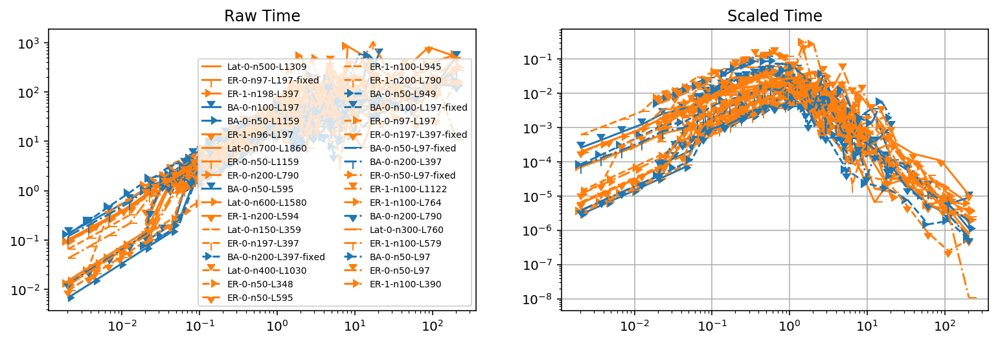

In [61]:
figure(figsize=(13,4))
ii = 0
#mc = mpl.colors.cnames
mt = mpl.colors.TABLEAU_COLORS
#c = [mc['aqua'],mc['beige']]
ls = ['-','--','-.']
for k,lth in stats.iteritems(): 
    c = (mt['tab:blue'] if 'BA' in k else mt['tab:orange'])

    r_c = rs(sd(k,'n'),sd(k,'L'))
    s = lth.T[1] # maximum(net['info']['nodes']['radius'],lth.T[0])**1 #  / lth.T[1]
    t = lth.T[2] #/ s
    subplot(121)
    title('Raw Time')
    loglog(lth.T[0]/r_c,t, marker=(2*ii+1) % 12, ls=ls[ii/12], c=c, label = k)
    subplot(122)
    title('Scaled Time')
    loglog(lth.T[0]/r_c,t/s, marker=(2*ii+1) %12, ls=ls[ii/12] , c=c, label = k)
    #legend()
    grid()
    ii+=1
#     xscale('log')
#     yscale('log')
    
subplot(121)
legend(fontsize = 7,ncol=2)


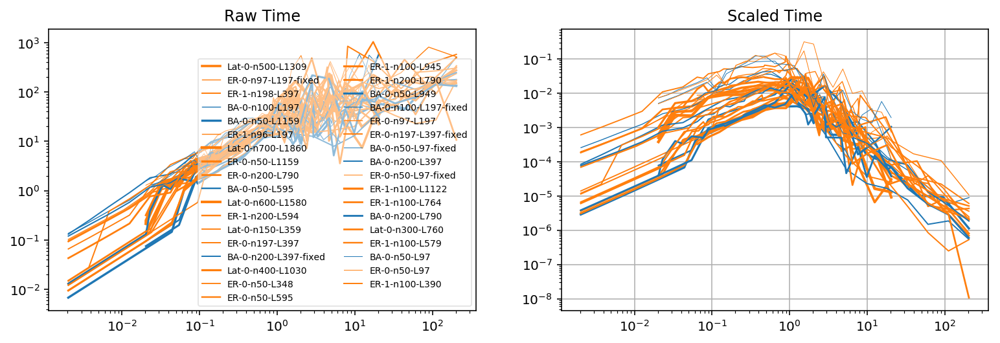

In [60]:
figure(figsize=(13,4))
ii = 0
#mc = mpl.colors.cnames
mt = mpl.colors.TABLEAU_COLORS
#c = [mc['aqua'],mc['beige']]
ls = ['-','--','-.']
for k,lth in stats.iteritems(): 
    c = (mt['tab:blue'] if 'BA' in k else mt['tab:orange'])
    n,m = sd(k,'n'),sd(k,'L')
    r_c = rs(n,m)
    s = lth.T[1] # maximum(net['info']['nodes']['radius'],lth.T[0])**1 #  / lth.T[1]
    t = lth.T[2] #/ s
    subplot(121)
    title('Raw Time')
    loglog(lth.T[0]/r_c,t, lw= sqrt(m)/20, c=c, label = k)
    subplot(122)
    title('Scaled Time')
    loglog(lth.T[0]/r_c,t/s, lw= sqrt(m)/20 , c=c, label = k)
    #legend()
    grid()
    ii+=1
#     xscale('log')
#     yscale('log')
    
subplot(121)
legend(fontsize = 7,ncol=2, framealpha = .5)


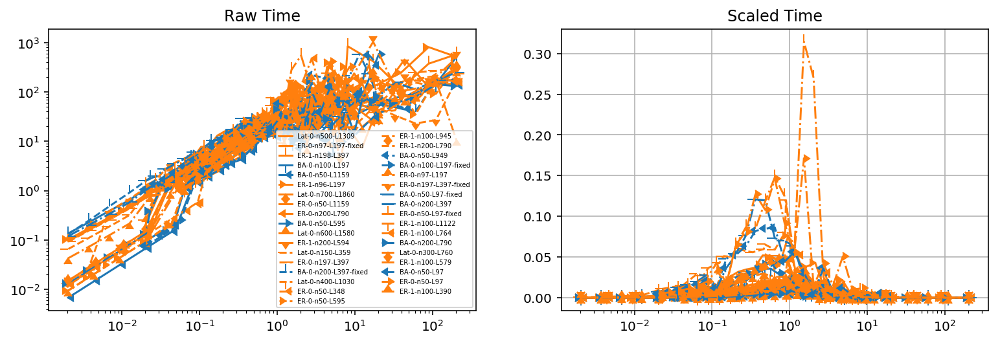

In [37]:
figure(figsize=(13,4))
ii = 0
#mc = mpl.colors.cnames
mt = mpl.colors.TABLEAU_COLORS
#c = [mc['aqua'],mc['beige']]
for k,lth in stats.iteritems(): 
    c = (mt['tab:blue'] if 'BA' in k else mt['tab:orange'])

    r_c = rs(sd(k,'n'),sd(k,'L'))
    s = lth.T[1] # maximum(net['info']['nodes']['radius'],lth.T[0])**1 #  / lth.T[1]
    t = lth.T[-2] #/ s
    subplot(121)
    title('Raw Time')
    loglog(lth.T[0]/r_c,t,  marker=ii %12, ls=ls[ii/12], c=c, label = k)
    subplot(122)
    title('Scaled Time')
    plot(lth.T[0]/r_c,t/s, marker=ii %12, ls=ls[ii/12], c=c, label = k)
    #legend()
    grid()
    ii+=1
    xscale('log')
#     yscale('log')
subplot(121)    
legend(fontsize = 5,ncol=2)
    

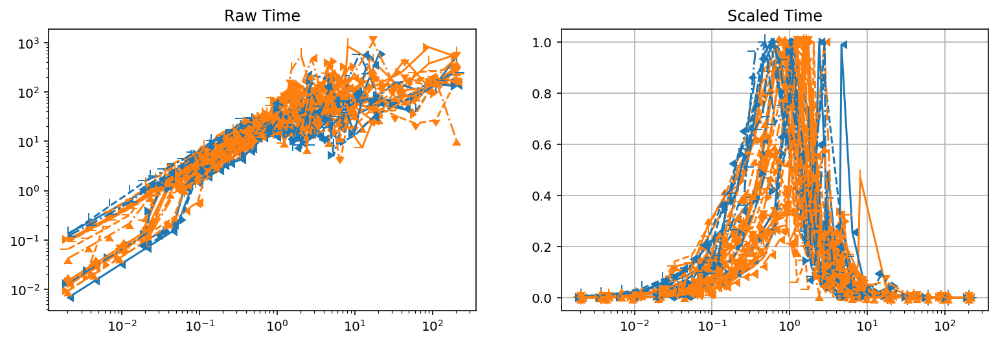

In [62]:
figure(figsize=(13,4))
ii = 0
#mc = mpl.colors.cnames
mt = mpl.colors.TABLEAU_COLORS
#c = [mc['aqua'],mc['beige']]
for k,lth in stats.iteritems(): 
    c = (mt['tab:blue'] if 'BA' in k else mt['tab:orange'])

    r_c = rs(sd(k,'n'),sd(k,'L'))
    s = lth.T[3]**2 # maximum(net['info']['nodes']['radius'],lth.T[0])**1 #  / lth.T[1]
    t = lth.T[2] #/ s
    subplot(121)
    title('Raw Time')
    loglog(lth.T[0]/r_c,t,  marker=ii %12, ls=ls[ii/12], c=c, label = k)
#     legend()
    subplot(122)
    title('Scaled Time')
    t1 = t/s
    plot(lth.T[0]/r_c, t1/t1.max(), marker=ii %12, ls=ls[ii/12], c=c, label = k)
    #legend()
    grid(1)
    ii+=1
    xscale('log')
#     yscale('log')
    
# legend()

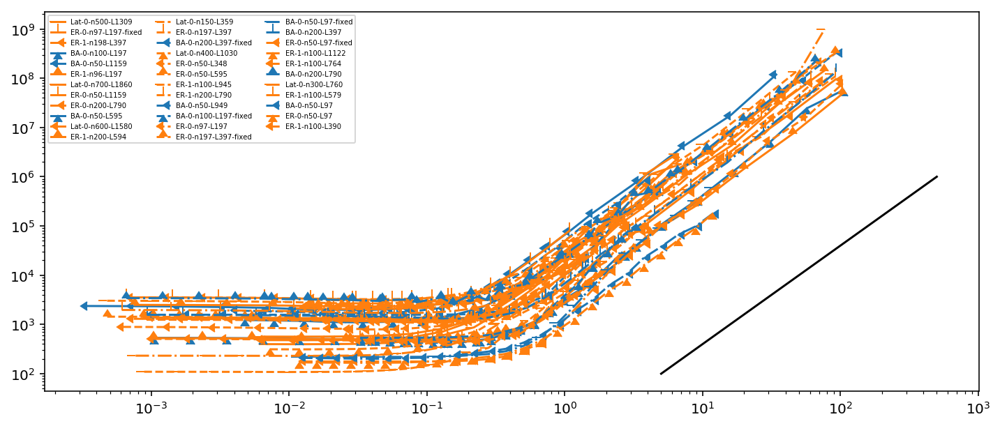

In [63]:
figure(figsize= (12,5))
ii = 0
for k,lth in stats.iteritems(): 
    c = (mt['tab:blue'] if 'BA' in k else mt['tab:orange'])
    r_c = 1#rs(sd(k,'n'),sd(k,'L'))
    loglog(lth.T[0]/r_c,lth.T[1],#/lth.T[1][0], 
           marker=(2*ii) %12, ls=ls[ii/12],c=c, label = k)
    
#     loglog(lth.T[0]/r_c,gradient(lth.T[1])/gradient(lth.T[0]/r_c), marker=ii,c=c)
    xscale('log')
    ii +=1
    
legend(fontsize=5,ncol=3)
x = array([1,100])

plot(5*x,(1e1*x)**2,'k')

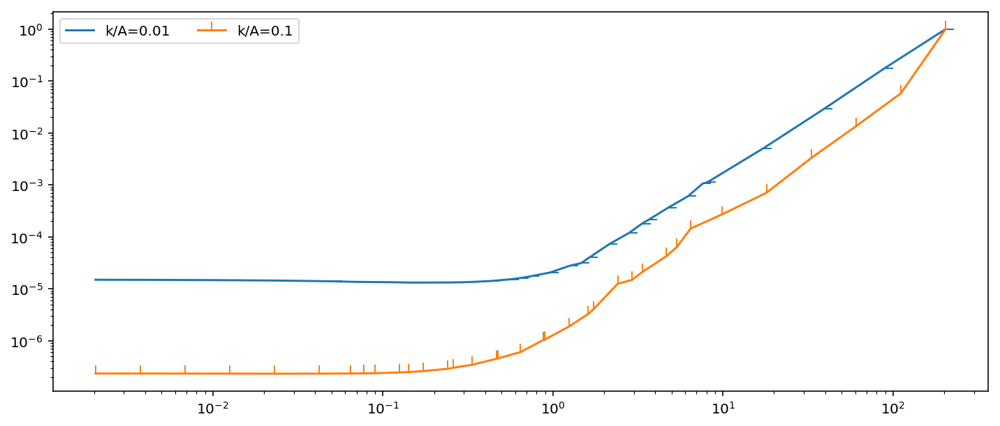

In [64]:
figure(figsize= (12,5))
ii = 0
# for k,lth in stats.iteritems(): 
for ak in sorted (bal):
    k = bal[ak]
    lth = stats[k]
    c = (mt['tab:blue'] if 'BA' in k else mt['tab:orange'])
    r_c = rs(sd(k,'n'),sd(k,'L'))
    loglog(lth.T[0]/r_c,lth.T[1]/lth.T[1][-1],#/lth.T[1][0], 
           marker=(1*ii+1) %12, ls=ls[ii/12], label = lab[k]) # ,c=c
    
#     loglog(lth.T[0]/r_c,gradient(lth.T[1])/gradient(lth.T[0]/r_c), marker=ii,c=c)
    xscale('log')
    ii +=1
    
legend(fontsize=10,ncol=3)
x = array([1,100])

# plot(5*x,(1e1*x)**2,'k')

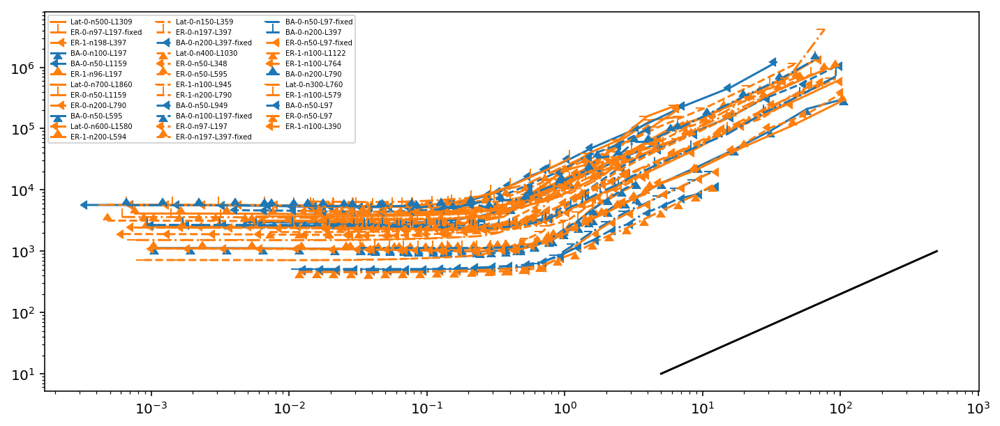

In [67]:
figure(figsize= (12,5))
ii = 0
for k,lth in stats.iteritems(): 
    c = (mt['tab:blue'] if 'BA' in k else mt['tab:orange'])
    r_c = 1#rs(sd(k,'n'),sd(k,'L'))
    loglog(lth.T[0]/r_c,lth.T[3],#/lth.T[1][0], 
           marker=(2*ii) %12, ls=ls[ii/12],c=c, label = k)
    
#     loglog(lth.T[0]/r_c,gradient(lth.T[1])/gradient(lth.T[0]/r_c), marker=ii,c=c)
    xscale('log')
    ii +=1
    
legend(fontsize=5,ncol=3)
x = array([1,100])

plot(5*x,(1e1*x)**1,'k')

In [738]:
1/sqrt((lth[:,-1]/ maximum(1, lth[:,0])).mean()/m)

0.4248006503604642

Loose (with tol/4 mean override in check_convergence) checking POW=2,3,4,6


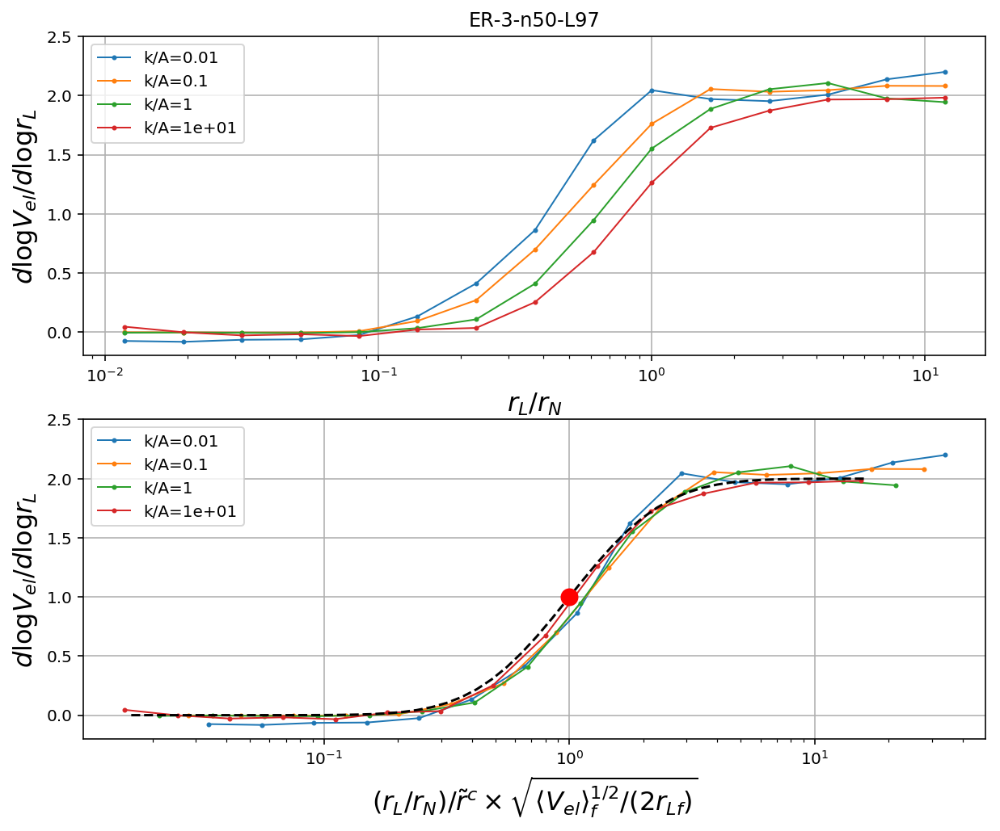

In [744]:
r = linspace(-10,10)
fig = figure(figsize=(10,8))
fig.subplots_adjust(wspace=0)

a = 1.
# lab = {k: s[i] for i,k in enumerate(sorted(lf.keys()))}
bal = {int(log10(float(lab[k][4:]))):k for k,v in lab.items()}

# for k in sorted(stats):
for ak in sorted (bal):
    if ak < -2: continue
    k = bal[ak]
#     if 'Lat' not in k: continue
    if 'fixed' in k: continue
#     if k == 'BA-0-n50-L97': continue
#     if k == 'ER-0-n50-L97': continue

#     if k == 'BA-0-n50-L595': continue
#     if k == 'ER-0-n50-L595': continue

    c = (mt['tab:blue'] if 'BA' in k else mt['tab:orange'])
    n,m = (sd(k,'n'),sd(k,'L') ) 
    
    lth = stats[k]
    gr = gradient(log(lth.T[1]))/gradient(log(lth.T[0]))
    th = lth.T[0]+0.
#     print k
    la = m/n
    x = arange(1.,n)# linspace(.1, 20,150)
    # mom(x,pk(x,la))
    ar = 1/rho_c(n,m,x), (pk(x,la) if 'ER-' in k else (x**-3 if 'BA-' in k else exp(-x**2)))# x**-3 #pk(x,la)
    m0,r0,s = mom(*ar), rs(n,m), sig(*ar)
#     print ('%d: '+'%.2g, '*3) %(m, m0,r0,s)
    r1 = log(th)
    subplot(211)
#     plot(th/(1./6),gr,'.-',ms=4,lw = 1, alpha = a,label=lab[k])
#     plot(th/(r0/sqrt(4*sqrt(2)/pi/3*4)),gr,'.-',ms=4,lw = 1, alpha = a,label=lab[k])
    plot(th/(1),gr,'.-',ms=4,lw = 1, alpha = a,label=lab[k])
    subplot(212)
#     plot(th/1*(lth[-1,-1]/lth[-1,0]/m/2)**.5,gr,'.-',ms=4,lw = 1, alpha = a,label=lab[k])
#     r0 = .66
    plot(th/r0*((lth[-1,1]/m)**.5/lth[-1,0]/2)**.5,gr,'.-',ms=4,lw = 1, alpha = a,label=lab[k])

subplot(211)
title(k)
# plot(th, 2*sigmoid(log(th/.166)*2),'k--', label = r'1')
th = logspace(log10(th.min()), log10(th.max()))*(lth[-1,-1]/lth[-1,0]/m/2)**.5
# plot(th/1., 1+erf(log(th)),'k--', label = r'$1+erf[log(r_L/r_N)]$')
grid()
xscale('log')
xlabel(r'$r_L/r_N$',fontsize=16)
ylabel(r'${d \log V_{el} }/{d\log r_L}$',fontsize=16 )
legend()
ylim(-.2,2.5)

subplot(212)
legend()
ylim(-.2,2.5)
xscale('log')
grid()
plot(th/1., 1+erf(log(th)),'k--', label = r'$1+erf[log(r_L/r_N)]$')

xlabel(r'$(r_L/r_N)/\tilde{r}^c\times \sqrt{\langle V_{el} \rangle_f^{1/2} /(2r_{Lf})}$',fontsize=16)
ylabel(r'${d \log V_{el} }/{d\log r_L}$',fontsize=16 )
plot([1],[1],'ro', ms = 10)
print "Loose (with tol/4 mean override in check_convergence) checking POW=2,3,4,6"

Loose (with tol/4 mean override in check_convergence) checking POW=2,3,4,6


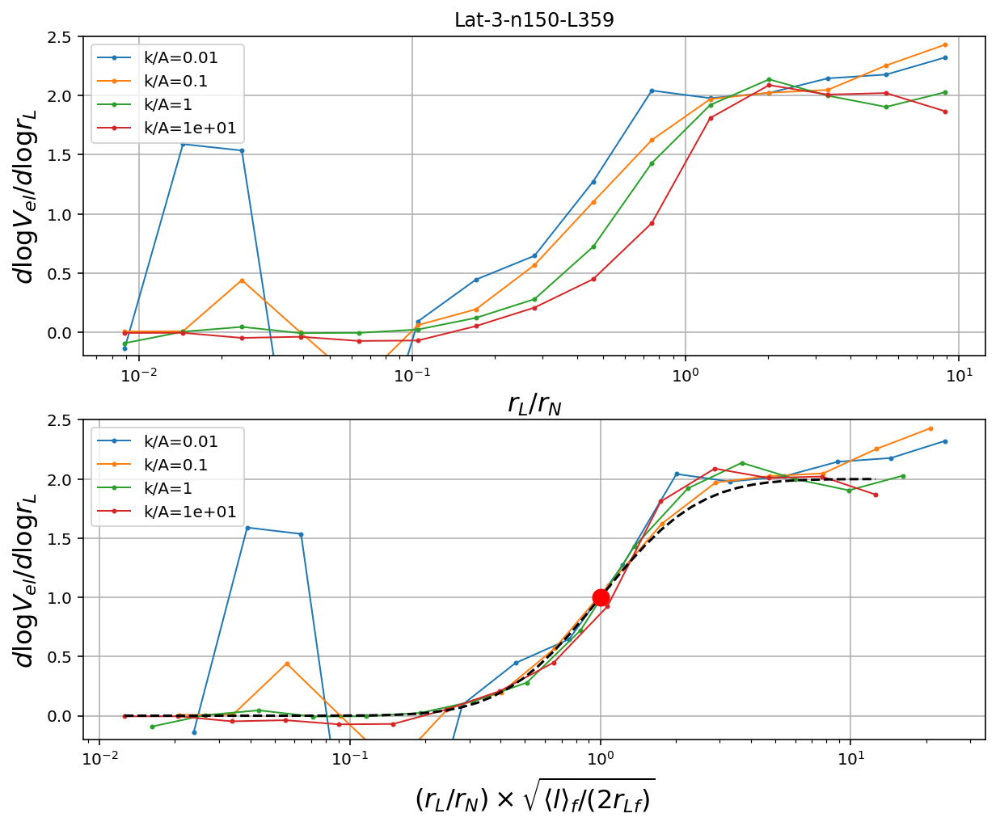

In [671]:
r = linspace(-10,10)
fig = figure(figsize=(10,8))
fig.subplots_adjust(wspace=0)

a = 1.
# lab = {k: s[i] for i,k in enumerate(sorted(lf.keys()))}
bal = {int(log10(float(lab[k][4:]))):k for k,v in lab.items()}

# for k in sorted(stats):
for ak in sorted (bal):
    k = bal[ak]
#     if 'Lat' not in k: continue
    if 'fixed' in k: continue
#     if k == 'BA-0-n50-L97': continue
#     if k == 'ER-0-n50-L97': continue

#     if k == 'BA-0-n50-L595': continue
#     if k == 'ER-0-n50-L595': continue

    c = (mt['tab:blue'] if 'BA' in k else mt['tab:orange'])
    n,m = (sd(k,'n'),sd(k,'L') ) 
    
    lth = stats[k]
    gr = gradient(log(lth.T[1]))/gradient(log(lth.T[0]))
    th = lth.T[0]+0.
#     print k
    la = m/n
    x = arange(1.,n)# linspace(.1, 20,150)
    # mom(x,pk(x,la))
    ar = 1/rho_c(n,m,x), (pk(x,la) if 'ER-' in k else (x**-3 if 'BA-' in k else exp(-x**2)))# x**-3 #pk(x,la)
    m0,r0,s = mom(*ar), rs(n,m), sig(*ar)
#     print ('%d: '+'%.2g, '*3) %(m, m0,r0,s)
    r1 = log(th)
    subplot(211)
#     plot(th/(1./6),gr,'.-',ms=4,lw = 1, alpha = a,label=lab[k])
#     plot(th/(r0/sqrt(4*sqrt(2)/pi/3*4)),gr,'.-',ms=4,lw = 1, alpha = a,label=lab[k])
    plot(th/(1),gr,'.-',ms=4,lw = 1, alpha = a,label=lab[k])
    subplot(212)
    plot(th/1*(lth[-1,-1]/lth[-1,0]/m/2)**.5,gr,'.-',ms=4,lw = 1, alpha = a,label=lab[k])
#     plot(th/.66*((lth[-1,1]/m)**.5/lth[-1,0]/2)**.5,gr,'.-',ms=4,lw = 1, alpha = a,label=lab[k])

subplot(211)
title(k)
# plot(th, 2*sigmoid(log(th/.166)*2),'k--', label = r'1')
th = logspace(log10(th.min()), log10(th.max()))*(lth[-1,-1]/lth[-1,0]/m/2)**.5
# plot(th/1., 1+erf(log(th)),'k--', label = r'$1+erf[log(r_L/r_N)]$')
grid()
xscale('log')
xlabel(r'$r_L/r_N$',fontsize=16)
ylabel(r'${d \log V_{el} }/{d\log r_L}$',fontsize=16 )
legend()
ylim(-.2,2.5)

subplot(212)
legend()
ylim(-.2,2.5)
xscale('log')
grid()
plot(th/1., 1+erf(log(th)),'k--', label = r'$1+erf[log(r_L/r_N)]$')

xlabel(r'$(r_L/r_N)\times \sqrt{\langle l \rangle_f /(2r_{Lf})}$',fontsize=16)
ylabel(r'${d \log V_{el} }/{d\log r_L}$',fontsize=16 )
plot([1],[1],'ro', ms = 10)
print "Loose (with tol/4 mean override in check_convergence) checking POW=2,3,4,6"

In [611]:
r0

0.5795880121187017

In [633]:
a = lth[-1,-1]/lth[-1,0]/m/2
a,sqrt(a)/r0, 

(3.858282744790756, 3.3890473074085112)

In [639]:
r0/sqrt(a)

0.29506817382394873

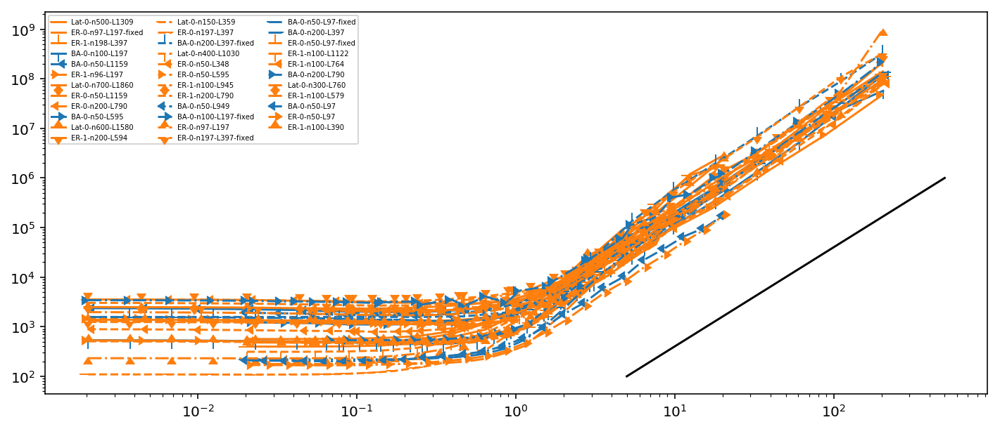

In [32]:
figure(figsize= (12,5))
ii = 0
for k,lth in stats.iteritems(): 
    c = (mt['tab:blue'] if 'BA' in k else mt['tab:orange'])
    r_c = rs(sd(k,'n'),sd(k,'L'))
    loglog(lth.T[0]/r_c,lth.T[1],#/lth.T[1][0], 
           marker=ii %12, ls=ls[ii/12],c=c, label = k)
    
#     loglog(lth.T[0]/r_c,gradient(lth.T[1])/gradient(lth.T[0]/r_c), marker=ii,c=c)
    xscale('log')
    ii +=1
    
legend(fontsize=5,ncol=3)
x = array([1,100])

plot(5*x,(1e1*x)**2,'k')

In [71]:
er1[:,-1]

array([0.01, 0.01, 0.01, 0.01, 0.01, 0.01, 0.01, 0.01, 0.01, 0.01, 0.01,
       0.01, 0.01, 0.01, 0.01, 0.01, 0.01, 0.01, 0.01, 0.01, 0.01, 0.01,
       0.01, 0.01, 0.01, 0.01, 0.01, 0.01, 0.01, 0.01, 0.01, 0.01, 0.01,
       0.01, 0.01])

In [73]:
sqrt(-log(4*0.01)),sqrt(4*sqrt(2)/pi/3*4)

(1.7941225779941015, 1.549465556168411)

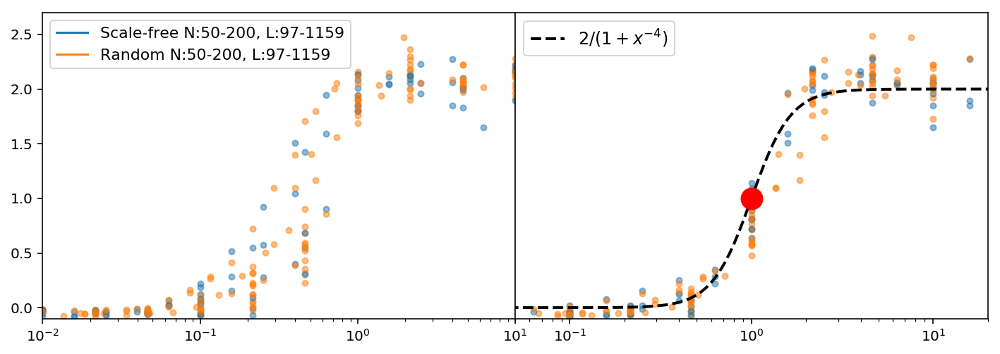

In [74]:
fig = figure(figsize=(12,4))
fig.subplots_adjust(wspace=0)
nn = 15#65
s=1
lw = .00
fa = .00
ms = 8
mx = 1e-2,1e1
kw = {'falpha' : fa, 'marker' : '.', 'lw' : lw, 'ms':ms, 'alpha':.5 }

kw1 = {'falpha' : fa, 'marker' : '.', 'lw' : lw, 'ms':ms, 'alpha':.5 }

md = {'BA':[10000,1],'ER':[10000,1]}
nd = {'BA':[10000,1],'ER':[10000,1]}


for k in stats:
    if 'Lat' in k: continue
    if 'fixed' in k: continue
    n,m = (sd(k,'n'),sd(k,'L') ) 
    md[k[:2]][0] = min(m,md[k[:2]][0])
    md[k[:2]][1] = max(m,md[k[:2]][1])
    nd[k[:2]][0] = min(n,nd[k[:2]][0])
    nd[k[:2]][1] = max(n,nd[k[:2]][1])
    
    er1 = stats[k]
    kw.update({'c': (mt['tab:blue'] if 'BA' in k else mt['tab:orange'])})
    kw1.update({'c': (mt['tab:blue'] if 'BA' in k else mt['tab:orange'])})
    subplot(121)
    c0 = sqrt(-log(4*0.01))/sqrt(4*sqrt(2)/pi/3*4)
    gr = gradient(log(er1.T[[0,s]]))[1]
    ber = bin_dat1(er1[:,0]*c0, gr[1]/gr[0],n=nn,scale='lin')
    shade(ber, **kw)
    subplot(122)
    r_c = rs(sd(k,'n'),sd(k,'L'))
    gr = gradient(log(er1.T[[0,s]]))[1]
    ber = bin_dat1(er1[:,0]/r_c*c0, gr[1]/gr[0],n=nn,scale='lin')
    shade(ber, **kw1)


r = logspace(-2,2,150)

subplot(121)
plot([1],[1],'-', c=mt['tab:blue'], 
     label = 'Scale-free N:%d-%d'%tuple(nd['BA'])+', L:%d-%d'%tuple(md['BA']))
plot([1],[1],'-', c=mt['tab:orange'], 
     label = 'Random N:%d-%d'%tuple(nd['ER'])+', L:%d-%d'%tuple(md['ER']))

legend(fontsize=11)

xscale('log')
# yscale('log')
# legend()
xlim(*mx)
ylim(-.1,2.7)
subplot(122)
xscale('log')
# legend(loc=2)
xlim(5e-2,2e1)
ylim(-.1,2.7)
plot(r,2/(1+1/r**4), 'k--', lw = 2,label = r'$2/\left(1+x^{-4}\right)$')
plot([1],[1],'ro',ms=15)
yticks([])
legend(fontsize=12)

In [78]:
#net['info']
# A = (2r_N)^3 A_N ==> y = sqrt(-log(k/(2*A))) = sqrt(-log(ka/2)) 
ka = 0.01
sqrt(-log(ka/2)), sqrt(-log(0.1/2))

(2.301807413001365, 1.7308183826022854)

In [79]:
xi = 1.
k,A,An = .1,1.*xi,10.*xi
sqrt(-log(2*xi*k/A)), sqrt(-log(k/An/4))


(1.2686362411795196, 2.4477468306808166)

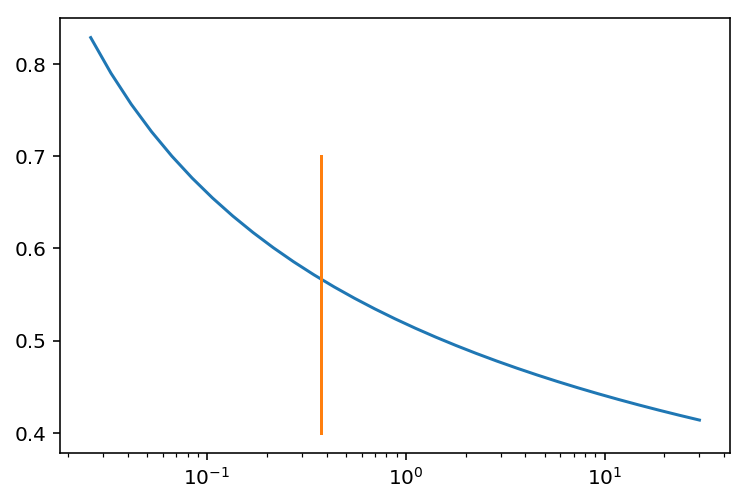

In [91]:
xi = 1.*th[15:-4]
k,A,An = .1,1.*xi,10.*xi
c0 = sqrt(-log(2*xi*k/A))/sqrt(-log(k/An/4))
plot(xi, c0)
xscale('log')
# yscale('log')
plot([r0,r0],[.4,.7])

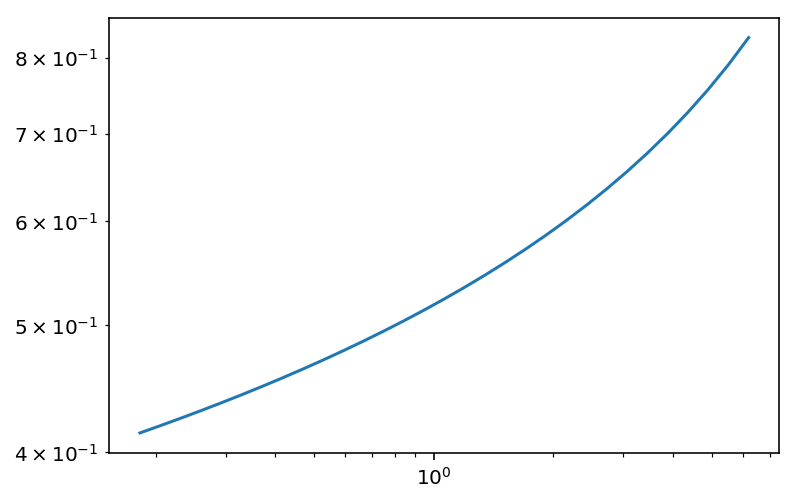

In [93]:
loglog(xi**-.5, c0)


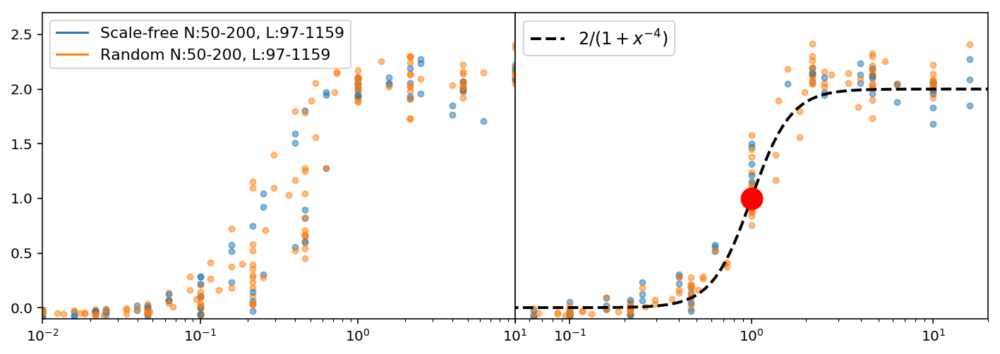

In [48]:
fig = figure(figsize=(12,4))
fig.subplots_adjust(wspace=0)
nn = 15#65
s=1
lw = .00
fa = .00
ms = 8
mx = 1e-2,1e1
kw = {'falpha' : fa, 'marker' : '.', 'lw' : lw, 'ms':ms, 'alpha':.5 }

kw1 = {'falpha' : fa, 'marker' : '.', 'lw' : lw, 'ms':ms, 'alpha':.5 }

md = {'BA':[10000,1],'ER':[10000,1]}
nd = {'BA':[10000,1],'ER':[10000,1]}


for k in stats:
    if 'Lat' in k: continue
    if 'fixed' in k: continue
    n,m = (sd(k,'n'),sd(k,'L') ) 
    md[k[:2]][0] = min(m,md[k[:2]][0])
    md[k[:2]][1] = max(m,md[k[:2]][1])
    nd[k[:2]][0] = min(n,nd[k[:2]][0])
    nd[k[:2]][1] = max(n,nd[k[:2]][1])
    
    er1 = stats[k]
    kw.update({'c': (mt['tab:blue'] if 'BA' in k else mt['tab:orange'])})
    kw1.update({'c': (mt['tab:blue'] if 'BA' in k else mt['tab:orange'])})
    subplot(121)
    gr = gradient(log(er1.T[[0,s]]))[1]
    ber = bin_dat1(er1[:,0]*.91, gr[1]/gr[0],n=nn,scale='lin')
    shade(ber, **kw)
    subplot(122)
    r_c = rs(sd(k,'n'),sd(k,'L'))
    gr = gradient(log(er1.T[[0,s]]))[1]
    ber = bin_dat1(er1[:,0]/r_c*.91, gr[1]/gr[0],n=nn,scale='lin')
    shade(ber, **kw1)


r = logspace(-2,2,150)

subplot(121)
plot([1],[1],'-', c=mt['tab:blue'], 
     label = 'Scale-free N:%d-%d'%tuple(nd['BA'])+', L:%d-%d'%tuple(md['BA']))
plot([1],[1],'-', c=mt['tab:orange'], 
     label = 'Random N:%d-%d'%tuple(nd['ER'])+', L:%d-%d'%tuple(md['ER']))

legend(fontsize=11)

xscale('log')
# yscale('log')
# legend()
xlim(*mx)
ylim(-.1,2.7)
subplot(122)
xscale('log')
# legend(loc=2)
xlim(5e-2,2e1)
ylim(-.1,2.7)
plot(r,2/(1+1/r**4), 'k--', lw = 2,label = r'$2/\left(1+x^{-4}\right)$')
plot([1],[1],'ro',ms=15)
yticks([])
legend(fontsize=12)

In [49]:
sqrt(.91)

0.9539392014169457

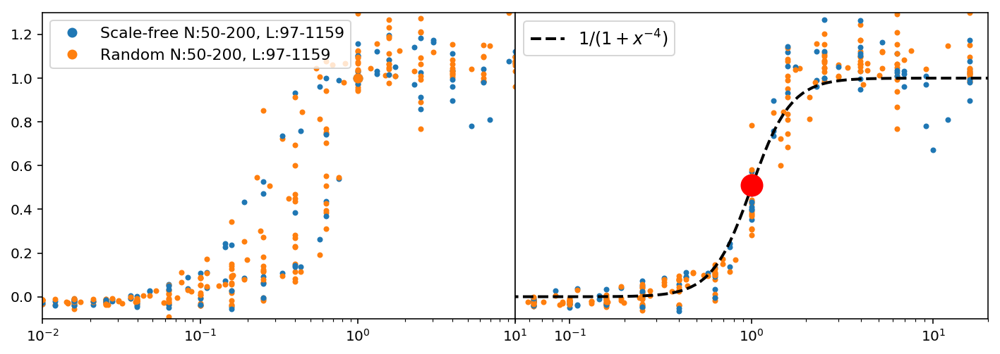

In [50]:
fig = figure(figsize=(12,4))
fig.subplots_adjust(wspace=0)
nn = 25#65
s=-1
lw = .00
fa = .00
ms = 6
mx = 1e-2,1e1
kw = {'falpha' : fa, 'marker' : '.', 'lw' : lw, 'ms':ms}

kw1 = {'falpha' : fa, 'marker' : '.', 'lw' : lw, 'ms':ms}

md = {'BA':[10000,1],'ER':[10000,1]}
nd = {'BA':[10000,1],'ER':[10000,1]}


for k in stats:
    if 'Lat' in k: continue
    if 'fixed' in k: continue
    n,m = (sd(k,'n'),sd(k,'L') ) 
    md[k[:2]][0] = min(m,md[k[:2]][0])
    md[k[:2]][1] = max(m,md[k[:2]][1])
    nd[k[:2]][0] = min(n,nd[k[:2]][0])
    nd[k[:2]][1] = max(n,nd[k[:2]][1])
    
    er1 = stats[k]
    kw.update({'c': (mt['tab:blue'] if 'BA' in k else mt['tab:orange'])})
    kw1.update({'c': (mt['tab:blue'] if 'BA' in k else mt['tab:orange'])})
    subplot(121)
    gr = gradient(log(er1.T[[0,s]]))[1]
    ber = bin_dat1(er1[:,0]*sqrt(.91), gr[1]/gr[0],n=nn,scale='lin')
    shade(ber, **kw)
    subplot(122)
    r_c = rs(sd(k,'n'),sd(k,'L'))
    gr = gradient(log(er1.T[[0,s]]))[1]
    ber = bin_dat1(er1[:,0]/r_c*sqrt(.91), gr[1]/gr[0],n=nn,scale='lin')
    shade(ber, **kw1)


r = logspace(-2,2,150)

subplot(121)
plot([1],[1],'o', c=mt['tab:blue'], 
     label = 'Scale-free N:%d-%d'%tuple(nd['BA'])+', L:%d-%d'%tuple(md['BA']))
plot([1],[1],'o', c=mt['tab:orange'], 
     label = 'Random N:%d-%d'%tuple(nd['ER'])+', L:%d-%d'%tuple(md['ER']))

legend(fontsize=11)

xscale('log')
# yscale('log')
# legend()
xlim(*mx)
ylim(-.1,1.3)
subplot(122)
xscale('log')
# legend(loc=2)
xlim(5e-2,2e1)
ylim(-.1,1.3)
plot(r,1/(1+1/r**4), 'k--', lw = 2,label = r'$1/\left(1+x^{-4}\right)$')
plot([1],[.51],'ro',ms=15)
yticks([])
legend(fontsize=12)

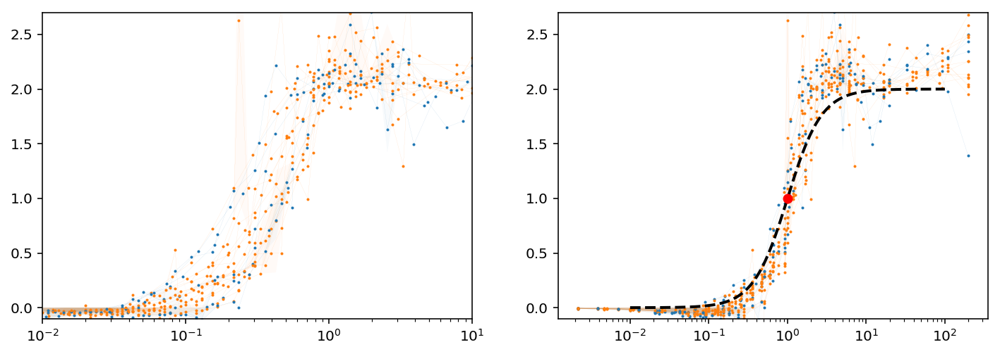

In [27]:
n = 135
s=1
lw = .03
fa = .03
mx = 1e-2,1e1
kw = {'falpha' : fa, 'marker' : '.', 'lw' : lw, 'ms':2}

kw1 = {'falpha' : fa, 'marker' : '.', 'lw' : lw, 'ms':2}
figure(figsize=(12,4))

for k in stats:
    if 'Lat' in k: continue
    if 'fixed' in k: continue
    er1 = stats[k]
    kw.update({'label' : k,'c': (mt['tab:blue'] if 'BA' in k else mt['tab:orange'])})
    kw1.update({'label' : k,'c': (mt['tab:blue'] if 'BA' in k else mt['tab:orange'])})
    subplot(121)
    gr = gradient(log(er1.T[[0,s]]))[1]
    ber = bin_dat1(er1[:,0], gr[1]/gr[0],n=n,scale='lin')
    shade(ber, **kw)
    subplot(122)
    r_c = rs(sd(k,'n'),sd(k,'L'))
    gr = gradient(log(er1.T[[0,s]]))[1]
    ber = bin_dat1(er1[:,0]/r_c, gr[1]/gr[0],n=n,scale='lin')
    shade(ber, **kw1)


r = logspace(-2,2,150)

subplot(121)
xscale('log')
# yscale('log')
# legend()
xlim(*mx)
ylim(-.1,2.7)
subplot(122)
xscale('log')
# legend(loc=2)
# xlim(1e-3,1e3)
ylim(-.1,2.7)
plot(r,2/(1+1/r**2), 'k--', lw = 2,label = r'$2\left(1+{r_L^2}/{r^2_N}\right)^{-1}$')
plot([1],[1],'ro')


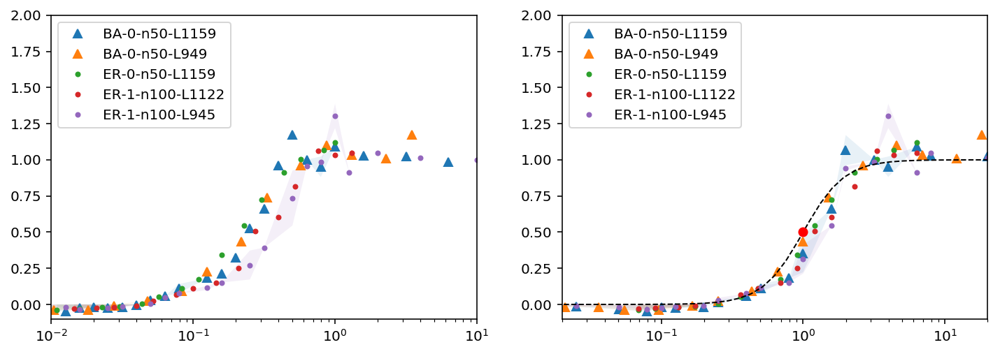

In [90]:
n = 50
s=-1
lw = .0
mx = 1e-2,1e1
ac = sqrt(4*sqrt(2)/pi/3*4)
figure(figsize=(12,4))
for k in sorted(stats):
    if 'Lat-' in k: continue
    if sd(k,'L') < 800: continue
    er1 = stats[k]
    mk = ('.' if 'ER-' in k else '^')
    subplot(121)
    gr = gradient(log(er1.T[[0,s]]))[1]
    ber = bin_dat1(er1[:,0], gr[1]/gr[0],n=n,scale='lin')
    shade(ber, falpha = .1,label = k, marker = mk, lw = lw)
    subplot(122)
    r_c = rs(sd(k,'n'),sd(k,'L'))
    gr = gradient(log(er1.T[[0,s]]))[1]
    ber = bin_dat1(er1[:,0]/r_c, gr[1]/gr[0],n=n,scale='lin')
    shade(ber, falpha = .1,label = k, marker = mk, lw = lw)


subplot(121)
xscale('log')
# yscale('log')
legend()
xlim(*mx)
ylim(-.1,2)
subplot(122)
xscale('log')
legend(loc=2)
xlim(2e-2,2e1)
ylim(-.1,2)
r= logspace(-2,2)
plot(r,1/(1+1/r**3), 'k--', lw = 1,label = r'$2\left(1+{r_L^2}/{r^2_N}\right)^{-1}$')
plot([1],[.5],'ro')


Text(0.5,0,'$(r_L/r_N)/\\tilde{r}_c$')

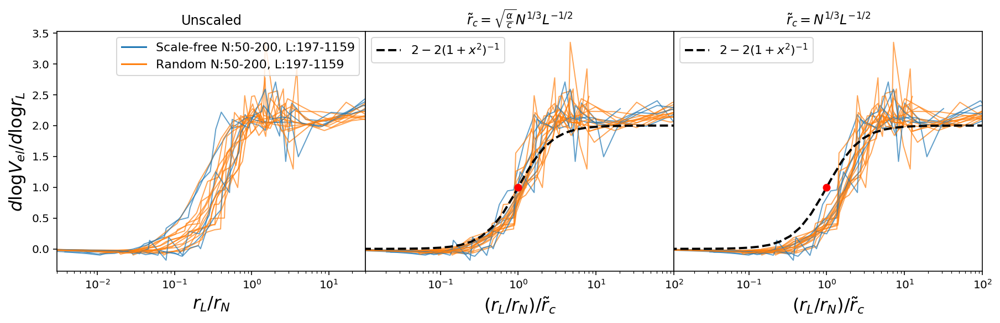

In [96]:
r = linspace(-10,10)
fig = figure(figsize=(15,4))
fig.subplots_adjust(wspace=0)

a = .7
ac = sqrt(4*sqrt(2)/pi/3*4)

for k in stats:
    if 'Lat' in k: continue
    if 'fixed' in k: continue
    if k == 'BA-0-n50-L97': continue
    if k == 'ER-0-n50-L97': continue

    if k == 'BA-0-n50-L595': continue
    if k == 'ER-0-n50-L595': continue

    c = (mt['tab:blue'] if 'BA' in k else mt['tab:orange'])
    
    n,m = (sd(k,'n'),sd(k,'L') ) 
    md[k[:2]][0] = min(m,md[k[:2]][0])
    md[k[:2]][1] = max(m,md[k[:2]][1])
    nd[k[:2]][0] = min(n,nd[k[:2]][0])
    nd[k[:2]][1] = max(n,nd[k[:2]][1])
    
    lth = stats[k]
    gr = gradient(log(lth.T[1]))/gradient(log(lth.T[0]))
    th = lth.T[0]
#     print k
    la = m/n
    x = arange(1.,n)# linspace(.1, 20,150)
    # mom(x,pk(x,la))
    ar = 1/rho_c(n,m,x), (pk(x,la) if 'ER-' in k else \
                          (x**-3 if 'BA-' in k else exp(-x**2)))# x**-3 #pk(x,la)
    m0,r0,s = mom(*ar), rs(n,m), sig(*ar)
#     print ('%d: '+'%.2g, '*3) %(m, m0,r0,s)
    r1 = log(th)
    subplot(131)
    plot(th,gr,'-',ms=4,c=c,lw=1,alpha = a)
    subplot(132)
    #plot(-(r1-log(m0))*log(s),2*sigmoid( -log(s)*(r1-log(m0))))
#     plot(exp(-(r1-log(m0))*log(s)),gr,'-',ms=4,label = k[5:])
#     plot(exp(-log(s)*(r1-log(m0))),gr,'-',ms=4,c=c,lw=1,alpha = a)#label = k[5:],)
    plot(th/(r0),gr,'-',ms=4,c=c,lw=1,alpha = a)#label = k[5:],)
    subplot(133)
    #plot(exp((r1-log(m0))),gr,'-',ms=4,c=c,lw=1,alpha = a)#label = k[5:],)
    #plot(th/m0,gr,'-',ms=4,c=c,lw=1,alpha = a)#label = k[5:],)
    plot(th/(r0/ac),gr,'-',ms=4,c=c,lw=1,alpha = a)#label = k[5:],)
#   
#   
#     show()
#ylim(-0.01,3)


r = logspace(-10,10,150)

subplot(131)
# plot(r,(erf(log(r/3e-1)/1)+1)/1, 'k--', lw = 1)
# plot([3e-1],[1],'ro')
plot([1],[1],'-', c=mt['tab:blue'], 
     label = 'Scale-free N:%d-%d'%tuple(nd['BA'])+', L:%d-%d'%tuple(md['BA']))
plot([1],[1],'-', c=mt['tab:orange'], 
     label = 'Random N:%d-%d'%tuple(nd['ER'])+', L:%d-%d'%tuple(md['ER']))

legend(fontsize=11)
ylabel(r'$d\log V_{el}/d\log r_L$',fontsize=16)

xlim(3e-3,3e1)

xscale('log')
# xlim(-4,4)

title('Unscaled')
xlabel(r'$r_L/r_N$',fontsize=16)

subplot(132)
xscale('log')
# xlim(-10,10)
# plot(r,(erf(log(r)/4)+1)*1, 'k--', lw = 1)
# plot(r,(erf(log(r)/1)+1)*1, 'k--', lw = 1)

plot(r,2-2/(1+r**2), 'k--', lw = 2,label= r'$2-2\left(1+x^{2}\right)^{-1}$')
plot([1],[1],'ro')
# plot(r,(erf(log(r)/1)+1)/2, 'k--', lw = 2)
# xlim(5e-7,5e7)
xlim(1.1e-2,1e2)
yticks([])
title(r'$\tilde{r}_c =\sqrt{\frac{\alpha}{c}}N^{1/3}L^{-1/2} $')
legend(fontsize=11)
xlabel(r'$(r_L/r_N)/\tilde{r}_c$',fontsize=16)

subplot(133)
# plot(r,(erf(log(r)/1)+1)*1, 'k--', lw = 1)
plot(r,2-2/(1+r**2), 'k--', lw = 2,label= r'$2-2\left(1+x^{2}\right)^{-1}$')
plot([1],[1],'ro')

xscale('log')
xlim(1.1e-2,1e2)
yticks([])
title(r'$\tilde{r}_c =N^{1/3}L^{-1/2} $')
legend(fontsize=11)
xlabel(r'$(r_L/r_N)/\tilde{r}_c$',fontsize=16)


([], <a list of 0 Text yticklabel objects>)

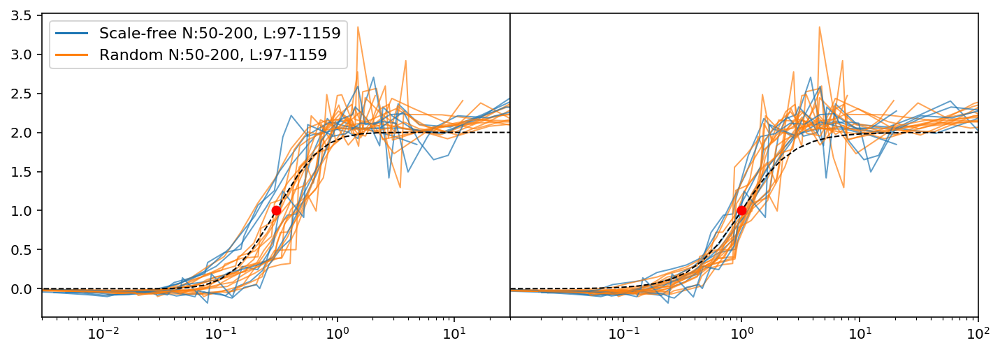

In [33]:
r = linspace(-10,10)
fig = figure(figsize=(12,4))
fig.subplots_adjust(wspace=0)

a = .7
md = {'BA':[10000,1],'ER':[10000,1]}
nd = {'BA':[10000,1],'ER':[10000,1]}
for k in stats:
    if 'Lat' in k: continue
    if 'fixed' in k: continue
#     if k == 'BA-0-n50-L97': continue
#     if k == 'ER-0-n50-L97': continue

#     if k == 'BA-0-n50-L595': continue
    if k == 'ER-0-n50-L595': continue

    c = (mt['tab:blue'] if 'BA' in k else mt['tab:orange'])
    
    n,m = (sd(k,'n'),sd(k,'L') ) 
    md[k[:2]][0] = min(m,md[k[:2]][0])
    md[k[:2]][1] = max(m,md[k[:2]][1])
    nd[k[:2]][0] = min(n,nd[k[:2]][0])
    nd[k[:2]][1] = max(n,nd[k[:2]][1])
    
    lth = stats[k]
    gr = gradient(log(lth.T[1]))/gradient(log(lth.T[0]))
    th = lth.T[0]
    #print k
    la = m/n
    x = arange(1.,n)# linspace(.1, 20,150)
    # mom(x,pk(x,la))
    ar = 1/rho_c(n,m,x), (pk(x,la) if 'ER-' in k else (x**(-3.) if 'BA-' in k else exp(-x**2)))# x**-3 #pk(x,la)
    m0,r0,s = mom(*ar), rs(n,m), sig(*ar)
    m1 = 1/rho_c_2(n,m, 
        lambda x: (pk(x,la)))# if 'ER-' in k else (x**(-3.) if 'BA-' in k else exp(-x**2))))
    
#     print ('%d: '+'%.2g, '*3) %(m, m0,r0,s)
    r1 = log(th)
    subplot(121)
    plot(th,gr,'-',ms=4,c=c,lw=1,alpha = a)
    subplot(122)
    #plot(-(r1-log(m0))*log(s),2*sigmoid( -log(s)*(r1-log(m0))))
#     plot(exp(-(r1-log(m0))*log(s**1)),gr,'-',ms=4,label = k[5:],c=c,lw=1,alpha = a)
#     plot(s**(-1*(r1-log(m0))),gr,'-',ms=4,c=c,lw=1,alpha = a)#label = k[5:],)
#     subplot(133)
    plot(exp((r1-log(m0))),gr,'-',ms=4,c=c,lw=1,alpha = a)#label = k[5:],)
#   
#     show()
#ylim(-0.01,3)


r = logspace(-10,10,150)

subplot(121)
plot(r,(erf(log(r/3e-1)/1)+1)/1, 'k--', lw = 1)
plot([3e-1],[1],'ro')
xlim(3e-3,3e1)

xscale('log')
# xlim(-4,4)
# subplot(132)
# xscale('log')
# # xlim(-10,10)
# plot(r,(erf(log(r)/4)+1)*1, 'k--', lw = 1)
# plot([1],[1],'ro')
# # plot(r,(erf(log(r)/1)+1)/2, 'k--', lw = 2)
# xlim(5e-7,5e7)

# yticks([])
plot([1],[1],'-', c=mt['tab:blue'], label = 'Scale-free N:%d-%d'%tuple(nd['BA'])+', L:%d-%d'%tuple(md['BA']))
plot([1],[1],'-', c=mt['tab:orange'], label = 'Random N:%d-%d'%tuple(nd['ER'])+', L:%d-%d'%tuple(md['ER']))
legend(fontsize=11)
subplot(122)
# plot(r,(erf(log(r)/1)+1)*1, 'k--', lw = 1,label = r'erf$(\log(r_L/r_N))$')
plot(r,2/(1+1/r**2), 'k--', lw = 1,label = r'$2\left(1+{r_L^2}/{r^2_N}\right)^{-1}$')
plot([1],[1],'ro')
# legend(fontsize=11)

xscale('log')
xlim(1.1e-2,1e2)
# xlim(1.1e-6,1e6)

yticks([])

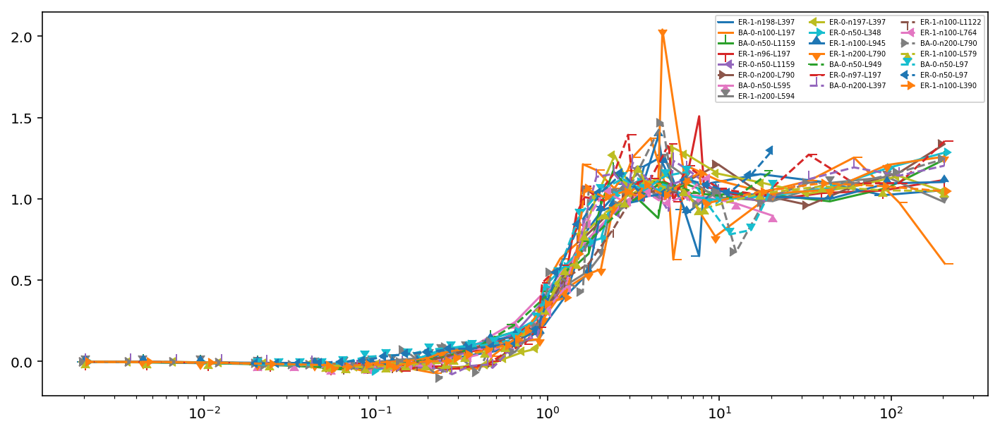

In [34]:
figure(figsize= (12,5))
ii = 0
th = []
d2F = []
for k,lth in stats.iteritems(): 
    if 'Lat' in k:continue
    if 'fixed' in k: continue
#     if k == 'BA-0-n50-L97': continue
#     if k == 'ER-0-n50-L97': continue
#     if k == 'BA-0-n50-L595': continue
    if k == 'ER-0-n50-L595': continue

    c = (mt['tab:blue'] if 'BA' in k else mt['tab:orange'])
    r_c = rs(sd(k,'n'),sd(k,'L'))
    df = gradient(log(lth.T[-1]))#/lth.T[1]
    T = lth.T[0]
    dT = gradient(log(T))#/lth.T[0]
    d2f = df/dT#T*gradient(1*df/dT)/dT #lth.T[0]*gradient(df/dT)#/dT
    th += T.tolist()
    d2F += d2f.tolist()
    plot(lth.T[0]/r_c,d2f, 
         marker=ii %12, 
         ls=ls[ii/12],label = k)
    xscale('log')
    ii +=1
    
legend(fontsize=5,ncol=3)
x = array([1,100])

th = array(th)
d2F = array(d2F)
# plot(5*x,1e1*x,'k')

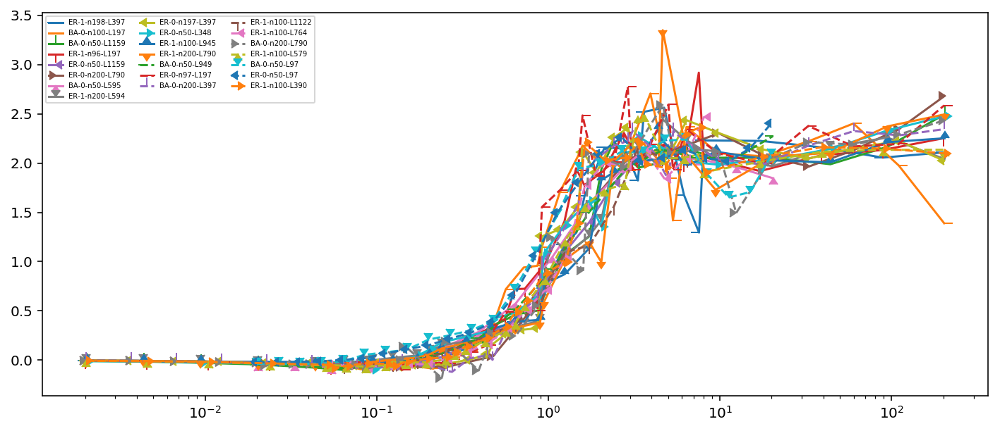

In [35]:
figure(figsize= (12,5))
ii = 0
th = []
th0 = []
d2F = []
for k,lth in stats.iteritems(): 
    if 'Lat' in k:continue
    if 'fixed' in k: continue
#     if k == 'BA-0-n50-L97': continue
#     if k == 'ER-0-n50-L97': continue
#     if k == 'BA-0-n50-L595': continue
    if k == 'ER-0-n50-L595': continue

    c = (mt['tab:blue'] if 'BA' in k else mt['tab:orange'])
    n,m = (sd(k,'n'),sd(k,'L') ) 
    ar = 1/rho_c(n,m,x), (pk(x,la) if 'ER-' in k else (x**(-3.) if 'BA-' in k else exp(-x**2)))# x**-3 #pk(x,la)
    m0,r0,s = mom(*ar), rs(n,m), sig(*ar)
#     print ('%d: '+'%.2g, '*3) %(m, m0,r0,s)
    r1 = log(th)
    
    r_c = m0 #rs(sd(k,'n'),sd(k,'L'))
    df = gradient(log(lth.T[1]))#/lth.T[1]
    T = lth.T[0]
    dT = gradient(log(T))#/lth.T[0]
    d2f = df/dT#/lth.T[1]#T*gradient(1*df/dT)/dT #lth.T[0]*gradient(df/dT)#/dT
    th += (T/r_c).tolist()
    th0 += (T).tolist()
    d2F += d2f.tolist()
    plot(lth.T[0]/r_c,d2f, 
         marker=ii %12, 
         ls=ls[ii/12],label = k)
    xscale('log')
    ii +=1
    
legend(fontsize=5,ncol=3)
x = array([1,100])

th = array(th)
th0 = array(th0)
d2F = array(d2F)
# plot(5*x,1e1*x,'k')

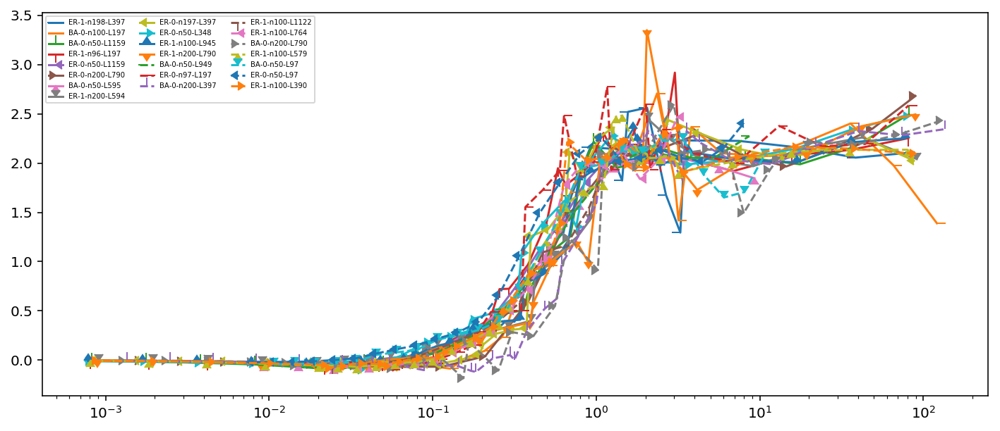

In [36]:


########  888888



figure(figsize= (12,5))
ii = 0
th = []
th0 = []
d2F = []
for k,lth in stats.iteritems(): 
    if 'Lat' in k:continue
    if 'fixed' in k: continue
#     if k == 'BA-0-n50-L97': continue
#     if k == 'ER-0-n50-L97': continue
#     if k == 'BA-0-n50-L595': continue
    if k == 'ER-0-n50-L595': continue

    c = (mt['tab:blue'] if 'BA' in k else mt['tab:orange'])
    n,m = (sd(k,'n'),sd(k,'L') ) 
    ar = 1/ rho_c (n,m,x), (pk(x,la) if 'ER-' in k else (x**(-3.) if 'BA-' in k else exp(-x**2)))# x**-3 #pk(x,la)
    m0,r0,s = mom(*ar), rs(n,m), sig(*ar)
    s01 = 1/ rho_c01(n,m,k[:2])
#     print ('%d: '+'%.2g, '*4) %(m,r0,s01, m0,s)
    r1 = log(th)
    
    r_c = s01 #r0 #m0 #rs(sd(k,'n'),sd(k,'L'))
    df = gradient(log(lth.T[1]))#/lth.T[1]
    T = lth.T[0]
    dT = gradient(log(T))#/lth.T[0]
    d2f = df/dT#/lth.T[1]#T*gradient(1*df/dT)/dT #lth.T[0]*gradient(df/dT)#/dT
    th += (T/r_c).tolist()
    th0 += (T).tolist()
    d2F += d2f.tolist()
    plot(lth.T[0]/r_c,d2f, 
         marker=ii %12, 
         ls=ls[ii/12],label = k)
    xscale('log')
    ii +=1
    
legend(fontsize=5,ncol=3)
x = array([1,100])

th = array(th)
th0 = array(th0)
d2F = array(d2F)
# plot(5*x,1e1*x,'k')

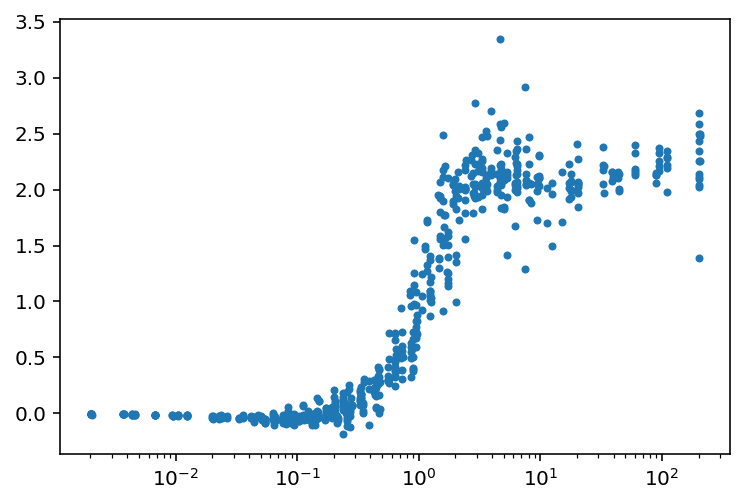

In [298]:
plot(th,d2F, '.')
xscale('log')

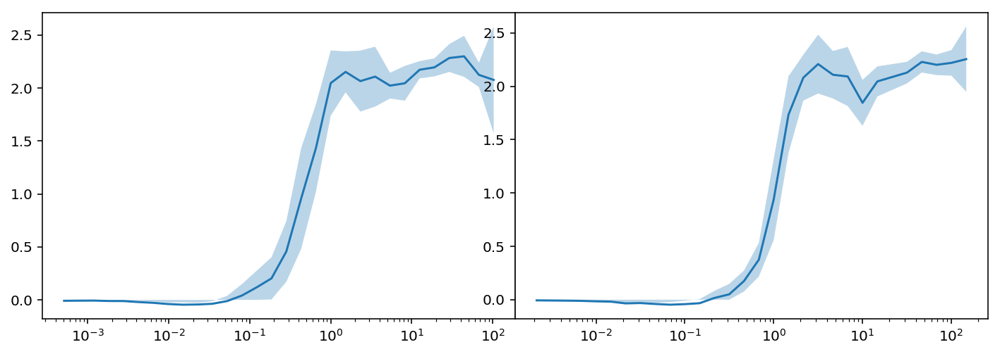

In [299]:
fig = figure(figsize=(12,4))
fig.subplots_adjust(wspace=0)

subplot(121)
shade(bin_dat1(th0,d2F, scale='lin'))
xscale('log')
subplot(122)
shade(bin_dat1(th,d2F, scale='lin'))
xscale('log')

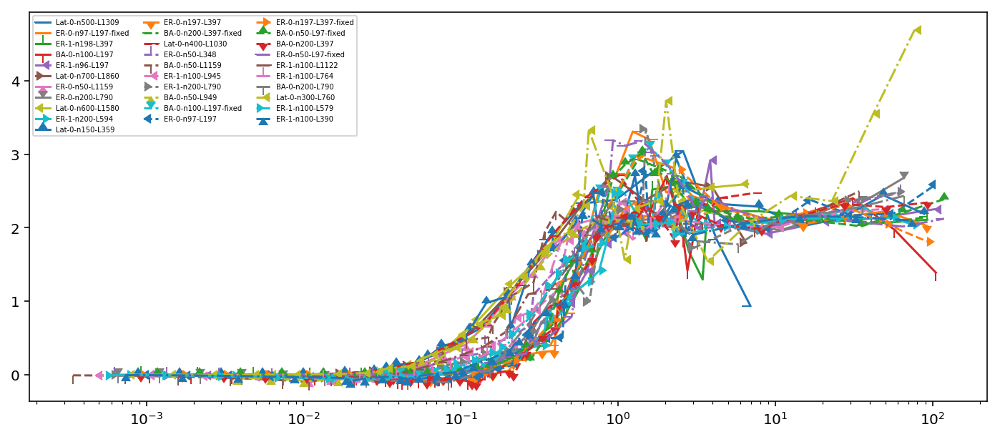

In [227]:
figure(figsize= (12,5))
ii = 0
for k,lth in stats.iteritems(): 
#     if 'BA' in k:continue
    if k == 'BA-0-n50-L97': continue
    if k == 'ER-0-n50-L97': continue
    if k == 'BA-0-n50-L595': continue
    if k == 'ER-0-n50-L595': continue

    c = (mt['tab:blue'] if 'BA' in k else mt['tab:orange'])
    r_c = 1 #rs(sd(k,'n'),sd(k,'L'))
    plot(lth.T[0]/r_c,gradient(log(lth.T[1]))/gradient(log(lth.T[0]/r_c)), 
         marker=ii %12, 
         ls=ls[ii/12],label = k)
    xscale('log')
    ii +=1
    
legend(fontsize=5,ncol=3)
x = array([1,100])

# plot(5*x,1e1*x,'k')

([], <a list of 0 Text yticklabel objects>)

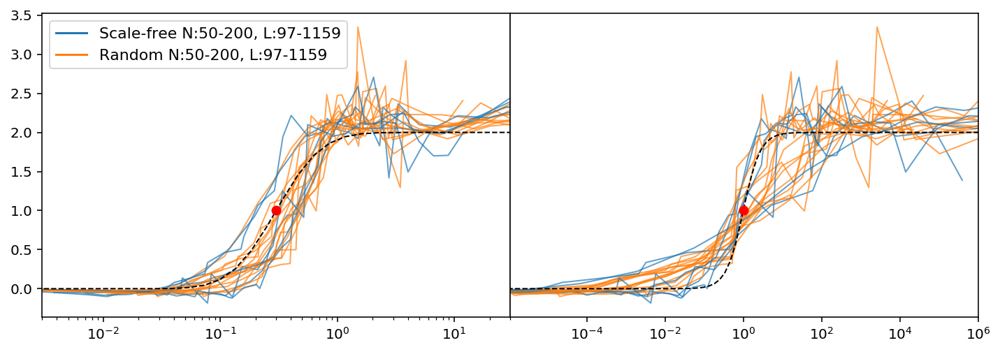

In [324]:
r = linspace(-10,10)
fig = figure(figsize=(12,4))
fig.subplots_adjust(wspace=0)

a = .7
md = {'BA':[10000,1],'ER':[10000,1]}
nd = {'BA':[10000,1],'ER':[10000,1]}
for k in stats:
    if 'Lat' in k: continue
    if 'fixed' in k: continue
#     if k == 'BA-0-n50-L97': continue
#     if k == 'ER-0-n50-L97': continue

    if k == 'BA-0-n50-L595': continue
    if k == 'ER-0-n50-L595': continue

    c = (mt['tab:blue'] if 'BA' in k else mt['tab:orange'])
    
    n,m = (sd(k,'n'),sd(k,'L') ) 
    md[k[:2]][0] = min(m,md[k[:2]][0])
    md[k[:2]][1] = max(m,md[k[:2]][1])
    nd[k[:2]][0] = min(n,nd[k[:2]][0])
    nd[k[:2]][1] = max(n,nd[k[:2]][1])
    
    lth = stats[k]
    gr = gradient(log(lth.T[1]))/gradient(log(lth.T[0]))
    th = lth.T[0]
    #print k
    la = m/n
    x = arange(1.,n)# linspace(.1, 20,150)
    # mom(x,pk(x,la))
    ar = 1/rho_c(n,m,x), (pk(x,la) if 'ER-' in k else (x**(-3.) if 'BA-' in k else exp(-x**2)))# x**-3 #pk(x,la)
    m0,r0,s = mom(*ar), rs(n,m), sig(*ar)
#     print ('%d: '+'%.2g, '*3) %(m, m0,r0,s)
    r1 = log(th)
    subplot(121)
    plot(th,gr,'-',ms=4,c=c,lw=1,alpha = a)
    subplot(122)
    #plot(-(r1-log(m0))*log(s),2*sigmoid( -log(s)*(r1-log(m0))))
    plot(exp(-(r1-log(m0))*log(s**1)),gr,'-',ms=4,label = k[5:],c=c,lw=1,alpha = a)
#     plot(s**(-1*(r1-log(m0))),gr,'-',ms=4,c=c,lw=1,alpha = a)#label = k[5:],)
#     subplot(133)
#     plot(exp((r1-log(m0))),gr,'-',ms=4,c=c,lw=1,alpha = a)#label = k[5:],)
#   
#     show()
#ylim(-0.01,3)


r = logspace(-10,10,150)

subplot(121)
plot(r,(erf(log(r/3e-1)/1)+1)/1, 'k--', lw = 1)
plot([3e-1],[1],'ro')
xlim(3e-3,3e1)

xscale('log')
# xlim(-4,4)
# subplot(132)
# xscale('log')
# # xlim(-10,10)
# plot(r,(erf(log(r)/4)+1)*1, 'k--', lw = 1)
# plot([1],[1],'ro')
# # plot(r,(erf(log(r)/1)+1)/2, 'k--', lw = 2)
# xlim(5e-7,5e7)

# yticks([])
plot([1],[1],'-', c=mt['tab:blue'], label = 'Scale-free N:%d-%d'%tuple(nd['BA'])+', L:%d-%d'%tuple(md['BA']))
plot([1],[1],'-', c=mt['tab:orange'], label = 'Random N:%d-%d'%tuple(nd['ER'])+', L:%d-%d'%tuple(md['ER']))
legend(fontsize=11)
subplot(122)
# plot(r,(erf(log(r)/1)+1)*1, 'k--', lw = 1,label = r'erf$(\log(r_L/r_N))$')
plot(r,2/(1+1/r**2), 'k--', lw = 1,label = r'$2\left(1+{r_L^2}/{r^2_N}\right)^{-1}$')
plot([1],[1],'ro')
# legend(fontsize=11)

xscale('log')
# xlim(1.1e-2,1e2)
xlim(1.1e-6,1e6)

yticks([])

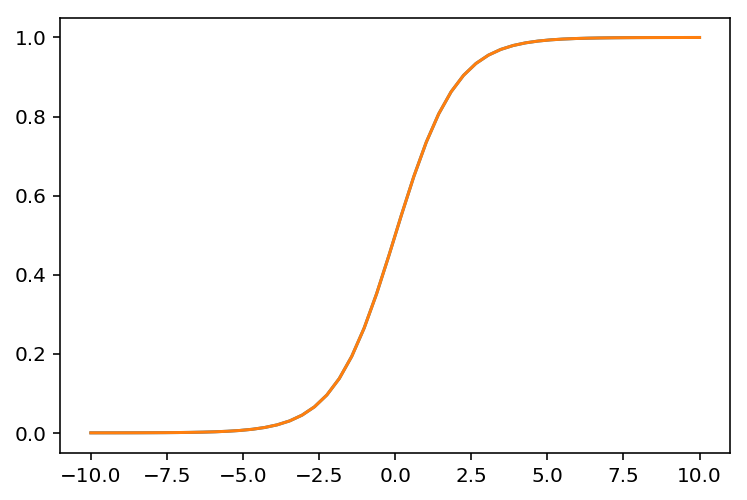

In [322]:
x = linspace(-10,10)
plot(x,sigmoid(x))
plot(x,1/(1+exp(-x)))

([], <a list of 0 Text yticklabel objects>)

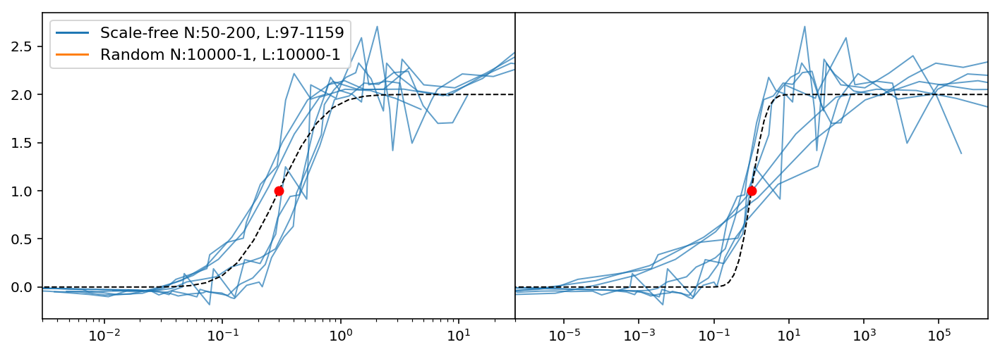

In [416]:
r = linspace(-10,10)
fig = figure(figsize=(12,4))
fig.subplots_adjust(wspace=0)

a = .7
md = {'BA':[10000,1],'ER':[10000,1]}
nd = {'BA':[10000,1],'ER':[10000,1]}
for k in stats:
    if 'Lat' in k: continue
    if 'fixed' in k: continue
    if 'ER' in k:continue
#     if k == 'BA-0-n50-L97': continue
#     if k == 'ER-0-n50-L97': continue

#     if k == 'BA-0-n50-L595': continue
    if k == 'ER-0-n50-L595': continue

    c = (mt['tab:blue'] if 'BA' in k else mt['tab:orange'])
    
    n,m = (sd(k,'n'),sd(k,'L') ) 
    md[k[:2]][0] = min(m,md[k[:2]][0])
    md[k[:2]][1] = max(m,md[k[:2]][1])
    nd[k[:2]][0] = min(n,nd[k[:2]][0])
    nd[k[:2]][1] = max(n,nd[k[:2]][1])
    
    lth = stats[k]
    gr = gradient(log(lth.T[1]))/gradient(log(lth.T[0]))
    th = lth.T[0]
    #print k
    la = m/n
    x = arange(1.,n)# linspace(.1, 20,150)
    # mom(x,pk(x,la))
    ar = 1/rho_c(n,m,x), x**(-3.)#(pk(x,la) if 'ER-' in k else (x**(-3.) if 'BA-' in k else exp(-x**2)))# x**-3 #pk(x,la)
    m0,r0,s = mom(*ar), rs(n,m), sig(*ar)
#     print ('%d: '+'%.2g, '*3) %(m, m0,r0,s)
    r1 = log(th)
    subplot(121)
    plot(th,gr,'-',ms=4,c=c,lw=1,alpha = a)
    subplot(122)
    #plot(-(r1-log(m0))*log(s),2*sigmoid( -log(s)*(r1-log(m0))))
#     plot(exp(-(r1-log(m0))*log(s)),gr,'-',ms=4,label = k[5:],c=c,lw=1,alpha = a)
    plot(exp(-log(s)*(r1-log(m0))),gr,'-',ms=4,c=c,lw=1,alpha = a)#label = k[5:],)
    
#     r2 = (log(th)-log(m0))*(-log(s**1))
#     plot( exp(r2),gr,'-',ms=4,label = k[5:],c=c,lw=1,alpha = a)
    r = linspace(min((r2)),max((r2)))
#     plot(exp(r),2*sigmoid(r))



r = logspace(-10,10,150)

subplot(121)
plot(r,(erf(log(r/3e-1)/1)+1)/1, 'k--', lw = 1)
plot([3e-1],[1],'ro')
xlim(3e-3,3e1)

xscale('log')

# yticks([])
plot([1],[1],'-', c=mt['tab:blue'], label = 'Scale-free N:%d-%d'%tuple(nd['BA'])+', L:%d-%d'%tuple(md['BA']))
plot([1],[1],'-', c=mt['tab:orange'], label = 'Random N:%d-%d'%tuple(nd['ER'])+', L:%d-%d'%tuple(md['ER']))
legend(fontsize=11)
subplot(122)
plot(r,(erf(log(r)/1)+1)*1, 'k--', lw = 1,label = r'erf$(\log(r_L/r_N))$')
# plot(r,2/(1+1/r**2), 'k--', lw = 1,label = r'$2\left(1+{r_L^2}/{r^2_N}\right)^{-1}$')
plot([1],[1],'ro')
# legend(fontsize=11)

xscale('log')
# xlim(1.1e-2,1e2)
xlim(.5e-6,2e6)

yticks([])

BA-0-n100-L197
197: 0.53, 0.33, 0.087, 
BA-0-n200-L397
397: 0.47, 0.29, 0.062, 
BA-0-n200-L790
790: 0.33, 0.21, 0.022, 
BA-0-n50-L1159
1159: 0.17, 0.11, 0.00057, 
BA-0-n50-L595
595: 0.23, 0.15, 0.0068, 
BA-0-n50-L949
949: 0.19, 0.12, 0.0012, 
BA-0-n50-L97
97: 0.61, 0.37, 0.13, 


(1e-07, 10000000.0)

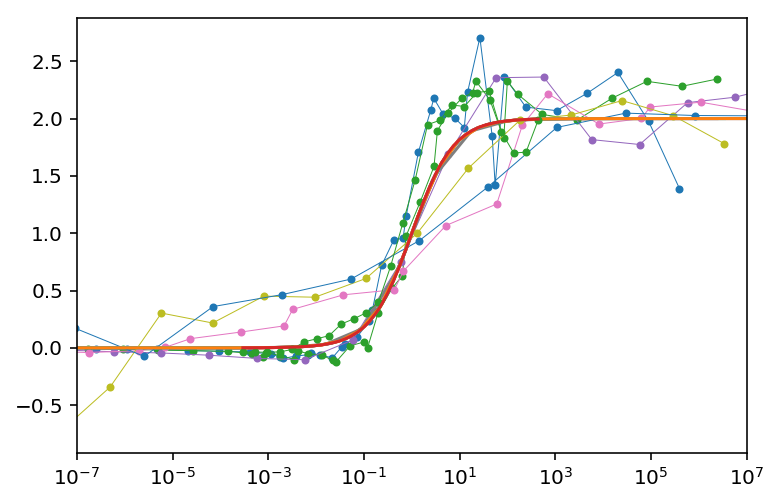

In [216]:
r = linspace(-6,6)
for k in sorted(stats):
    if 'BA' not in k: continue
#     if '197' in k: continue
    if 'fixed' in k: continue
    n,m = (sd(k,'n'),sd(k,'L') ) 
    lth = stats[k]
    gr = gradient(log(lth.T[1]))/gradient(log(lth.T[0]))
    th = lth.T[0]
    print k
    la = m/n*1
    x = arange(1,n)# linspace(.1, 20,150)
    # mom(x,pk(x,la))
    ar = 1/rho_c(n,m,x), x**(-3.) # pk(x,la)
    m0,r0,s = mom(*ar), rs(n,m), sig(*ar)
    print ('%d: '+'%.2g, '*3) %(m, m0,r0,s)
    #plot(log(th),gr,'.',lw=.5)
    #plot(r,2*sigmoid( -(r-log(m0))*log(s)))
    r1 = -(log(th)-log(m0))*log(s)
    plot( exp(r1),gr,'.-',lw=.5)
    r = linspace(min((r1)),max((r1)))
    plot(exp(r),2*sigmoid(r))

xscale('log')
xlim(1e-7,1e7)

(-0.1, 3.5)

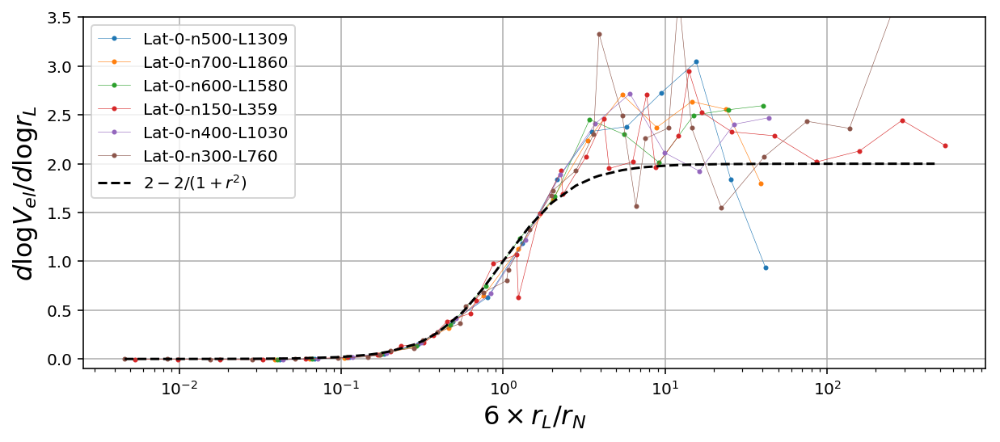

In [23]:
r = linspace(-10,10)
fig = figure(figsize=(10,4))
fig.subplots_adjust(wspace=0)

a = 1.
md = {'BA':[10000,1],'ER':[10000,1],'Lat':[10000,1]}
nd = {'BA':[10000,1],'ER':[10000,1],'Lat':[10000,1]}

for k in stats:
    if 'Lat' not in k: continue
#     if 'fixed' in k: continue
#     if k == 'BA-0-n50-L97': continue
#     if k == 'ER-0-n50-L97': continue

#     if k == 'BA-0-n50-L595': continue
#     if k == 'ER-0-n50-L595': continue

    c = (mt['tab:blue'] if 'BA' in k else mt['tab:orange'])
    n,m = (sd(k,'n'),sd(k,'L') ) 
    md[k.split('-')[0]][0] = min(m,md[k.split('-')[0]][0])
    md[k.split('-')[0]][1] = max(m,md[k.split('-')[0]][1])
    nd[k.split('-')[0]][0] = min(n,nd[k.split('-')[0]][0])
    nd[k.split('-')[0]][1] = max(n,nd[k.split('-')[0]][1])
    
    
    lth = stats[k]
    gr = gradient(log(lth.T[1]))/gradient(log(lth.T[0]))
    th = lth.T[0]
#     print k
    la = m/n
    x = arange(1.,n)# linspace(.1, 20,150)
    # mom(x,pk(x,la))
    ar = 1/rho_c(n,m,x), (pk(x,la) if 'ER-' in k else (x**-3 if 'BA-' in k else exp(-x**2)))# x**-3 #pk(x,la)
    m0,r0,s = mom(*ar), rs(n,m), sig(*ar)
#     print ('%d: '+'%.2g, '*3) %(m, m0,r0,s)
    r1 = log(th)
#     subplot(121)
    plot(th/(1./6),gr,'.-',ms=4,lw = .3, alpha = a,label=k)
    

# plot(th, 2*sigmoid(log(th/.166)*2),'k--', label = r'1')

plot(th/(1./6), 2*(1-1/(1+(6*th)**2)),'k--', label = r'$2-2/(1+r^2)$')
grid()
xscale('log')
xlabel(r'$6\times r_L/r_N$',fontsize=16)
ylabel(r'${d \log V_{el} }/{d\log r_L}$',fontsize=16 )
legend()
ylim(-.1,3.5)

(-0.1, 2.5)

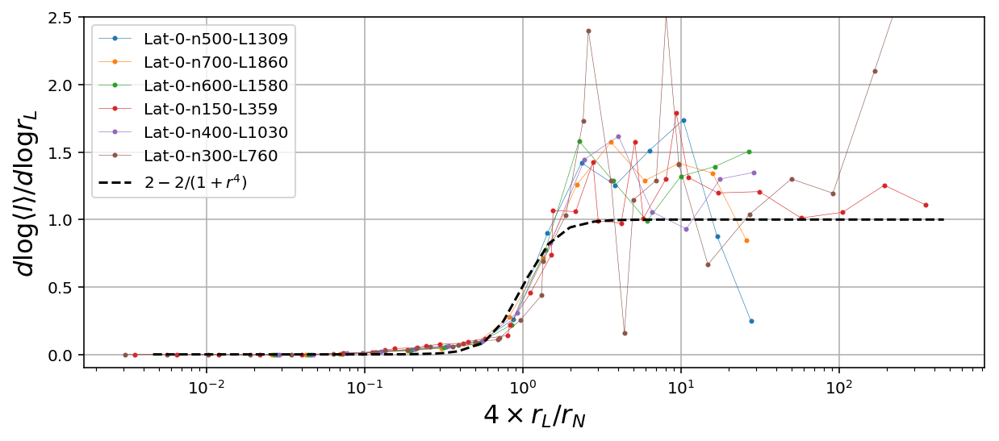

In [154]:
r = linspace(-10,10)
fig = figure(figsize=(10,4))
fig.subplots_adjust(wspace=0)

a = 1.

for k in stats:
    if 'Lat' not in k: continue
#     if 'fixed' in k: continue
#     if k == 'BA-0-n50-L97': continue
#     if k == 'ER-0-n50-L97': continue

#     if k == 'BA-0-n50-L595': continue
#     if k == 'ER-0-n50-L595': continue

    c = (mt['tab:blue'] if 'BA' in k else mt['tab:orange'])
    n,m = (sd(k,'n'),sd(k,'L') ) 
    
    lth = stats[k]
    gr = gradient(log(lth.T[-1]))/gradient(log(lth.T[0]))
    th = lth.T[0]
#     print k
    la = m/n
    x = arange(1.,n)# linspace(.1, 20,150)
    # mom(x,pk(x,la))
    ar = 1/rho_c(n,m,x), (pk(x,la) if 'ER-' in k else (x**-3 if 'BA-' in k else exp(-x**2)))# x**-3 #pk(x,la)
    m0,r0,s = mom(*ar), rs(n,m), sig(*ar)
#     print ('%d: '+'%.2g, '*3) %(m, m0,r0,s)
    r1 = log(th)
#     subplot(121)
    plot(th/(1./4.),gr,'.-',ms=4,lw = .3, alpha = a,label=k)
    

# plot(th, 2*sigmoid(log(th/.166)*2),'k--', label = r'1')

plot(th/(1./6), 1*(1-1/(1+(6*th)**4)),'k--', label = r'$2-2/(1+r^4)$')
grid()
xscale('log')
xlabel(r'$4\times r_L/r_N$',fontsize=16)
ylabel(r'${d \log\langle l \rangle }/{d\log r_L}$',fontsize=16 )
legend()
ylim(-.1,2.5)

In [105]:
1/.166

6.024096385542168

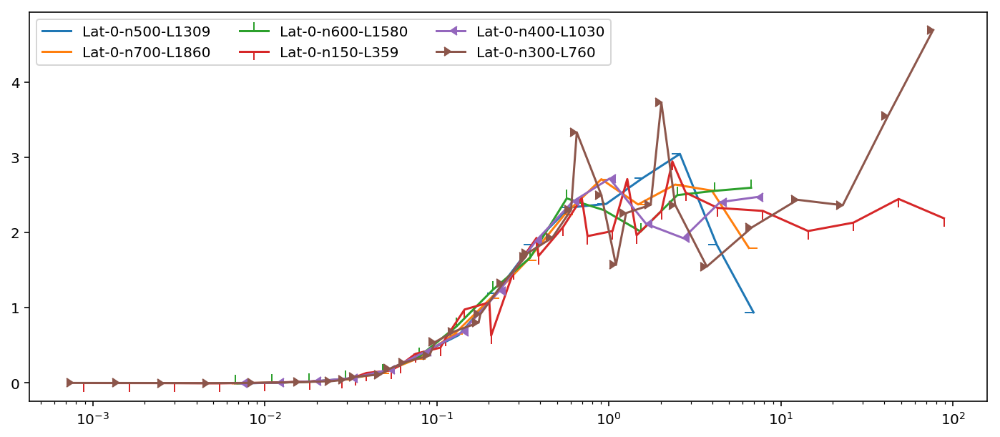

In [47]:


########  888888



figure(figsize= (12,5))
ii = 0
th = []
th0 = []
d2F = []
for k,lth in stats.iteritems(): 
    if 'Lat' not in k:continue
    if 'fixed' in k: continue
#     if k == 'BA-0-n50-L97': continue
#     if k == 'ER-0-n50-L97': continue
#     if k == 'BA-0-n50-L595': continue
#     if k == 'ER-0-n50-L595': continue

    c = (mt['tab:blue'] if 'BA' in k else mt['tab:orange'])
    n,m = (sd(k,'n'),sd(k,'L') ) 
#     ar = 1/ rho_c (n,m,x), (pk(x,la) if 'ER-' in k else (x**(-3.) if 'BA-' in k else exp(-x**2)))# x**-3 #pk(x,la)
#     m0,r0,s = mom(*ar), rs(n,m), sig(*ar)
    s01 = 1.#/ rho_c01(n,m,k[:2])
#     print ('%d: '+'%.2g, '*4) %(m,r0,s01, m0,s)
    r1 = log(th)
    
    r_c = s01 #r0 #m0 #rs(sd(k,'n'),sd(k,'L'))
    df = gradient(log(lth.T[1]))#/lth.T[1]
    T = lth.T[0]
    dT = gradient(log(T))#/lth.T[0]
    d2f = df/dT#/lth.T[1]#T*gradient(1*df/dT)/dT #lth.T[0]*gradient(df/dT)#/dT
    th += (T/r_c).tolist()
    th0 += (T).tolist()
    d2F += d2f.tolist()
    plot(lth.T[0]/r_c,d2f, 
         marker=ii %12, 
         ls=ls[ii/12],label = k)
    xscale('log')
    ii +=1
    
legend(fontsize=10,ncol=3)
x = array([1,100])

th = array(th)
th0 = array(th0)
d2F = array(d2F)
# plot(5*x,1e1*x,'k')

In [63]:
r_c

1.0

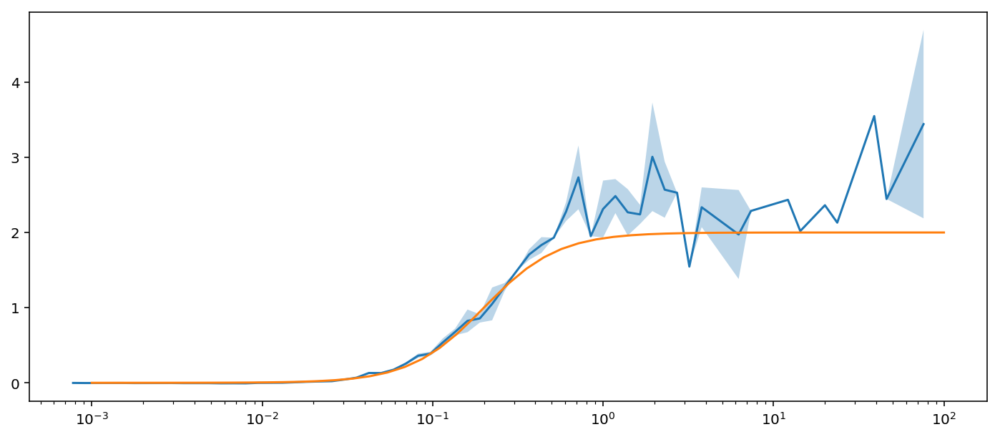

In [62]:
fig = figure(figsize=(12,5))
fig.subplots_adjust(wspace=0)
r = logspace(-3,2)

# subplot(121)
shade(bin_dat1(th0,d2F,n=70, scale='lin'))
xscale('log')
plot(r, 2*sigmoid(log(r/.2)*2))

# subplot(122)
# shade(bin_dat1(th,d2F, scale='lin'))
# xscale('log')

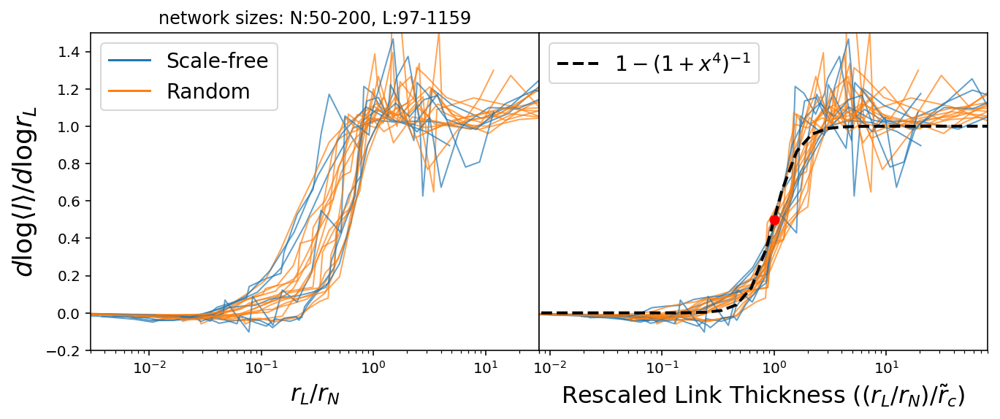

In [334]:
r = linspace(-10,10)
# fig = figure(figsize=(15,4))
fig = figure(figsize=(11,4))
# fig.subplots_adjust(wspace=4)

a = .7
md = {'BA':[10000,1],'ER':[10000,1]}
nd = {'BA':[10000,1],'ER':[10000,1]}

for k in stats:
    if 'Lat' in k: continue
    if 'fixed' in k: continue
#     if k == 'BA-0-n50-L97': continue
#     if k == 'ER-0-n50-L97': continue

#     if k == 'BA-0-n50-L595': continue
    if k == 'ER-0-n50-L595': continue

    c = (mt['tab:blue'] if 'BA' in k else mt['tab:orange'])
    n,m = (sd(k,'n'),sd(k,'L') ) 
    md[k[:2]][0] = min(m,md[k[:2]][0])
    md[k[:2]][1] = max(m,md[k[:2]][1])
    nd[k[:2]][0] = min(n,nd[k[:2]][0])
    nd[k[:2]][1] = max(n,nd[k[:2]][1])
    
    
    lth = stats[k]
    gr = gradient(log(lth.T[-1]))/gradient(log(lth.T[0]))
    th = lth.T[0]
#     print k
    la = m/n
    x = arange(1.,n)# linspace(.1, 20,150)
    # mom(x,pk(x,la))
    ar = 1/rho_c(n,m,x), (pk(x,la) if 'ER-' in k else (x**-3 if 'BA-' in k else exp(-x**2)))# x**-3 #pk(x,la)
    m0,r0,s = mom(*ar), rs(n,m), sig(*ar)
#     print ('%d: '+'%.2g, '*3) %(m, m0,r0,s)
    r1 = log(th)
    subplot(121)
    plot(th,gr,'-',ms=4,c=c,lw=1.,alpha = a)
#     subplot(132)
#     #plot(-(r1-log(m0))*log(s),2*sigmoid( -log(s)*(r1-log(m0))))
# #     plot(exp(-(r1-log(m0))*log(s)),gr,'-',ms=4,label = k[5:])
#     plot(exp(-log(s)*(r1-log(m0))),gr,'-',ms=4,c=c,lw=1,alpha = a)#label = k[5:],)
    subplot(122)
    #plot(exp((r1-log(m0))),gr,'-',ms=4,c=c,lw=1,alpha = a)#label = k[5:],)
    plot(th/m0,gr,'-',ms=4,c=c,lw=1.,alpha = a)#label = k[5:],)
#   
#     show()
#ylim(-0.01,3)


r = logspace(-10,10,150)

subplot(121)
# plot([1],[1],'-', c=mt['tab:blue'], 
#      label = 'Scale-free N:%d-%d'%tuple(nd['BA'])+', L:%d-%d'%tuple(md['BA']))
# plot([1],[1],'-', c=mt['tab:orange'], 
#      label = 'Random N:%d-%d'%tuple(nd['ER'])+', L:%d-%d'%tuple(md['ER']))
plot([1],[1],'-', c=mt['tab:blue'], 
     label = 'Scale-free')
plot([1],[1],'-', c=mt['tab:orange'], 
     label = 'Random')
title('network sizes: N:%d-%d'%tuple(nd['BA'])+', L:%d-%d'%tuple(md['BA']))
#  'N:%d-%d'%tuple(nd['ER'])+', L:%d-%d'%tuple(md['ER']))

legend(fontsize=14)

# plot(r,(erf(log(r/3e-1)/1)+1)/2, 'k--', lw = 2)
# plot([.3],[.5],'ro')
xlim(3e-3,3e1)

xscale('log')
xlabel(r'$r_L/r_N$',fontsize=16)
ylabel(r'${d \log\langle l\rangle }/{d\log r_L}$',fontsize=18 )
ylim(-.2,1.5)
subplot(122)
# plot(r,.5*(erf(log(r)*sqrt(2))+1), 'k--', lw = 2,label=r'erf$[\log (r)]+1$' )
# plot(r,.5*(erf(log(r)*(1))+1), 'k--', lw = 2,label=r'erf$[\log (r)]+1$' )
# plot(r,1*sigmoid(log(r)*4), 'k--', lw = 1 )
plot(r,1*(1-1/(1+r**4)), 'k--', lw = 2,label= r'$1-\left(1+x^{4}\right)^{-1}$')
plot([1],[.5],'ro')

xscale('log')
xlim(3e-3/m0,3e1/m0)
# yticks([])
xlabel(r'Rescaled Link Thickness ($(r_L/r_N)/\tilde{r}_c$)',fontsize=16)
# xlabel(r'Rescaled Thickness Ratio ($(r_L/r_N)/\tilde{r}_c$)',fontsize=16)
ylim(-.2,1.5)
tight_layout()
legend(fontsize=14)

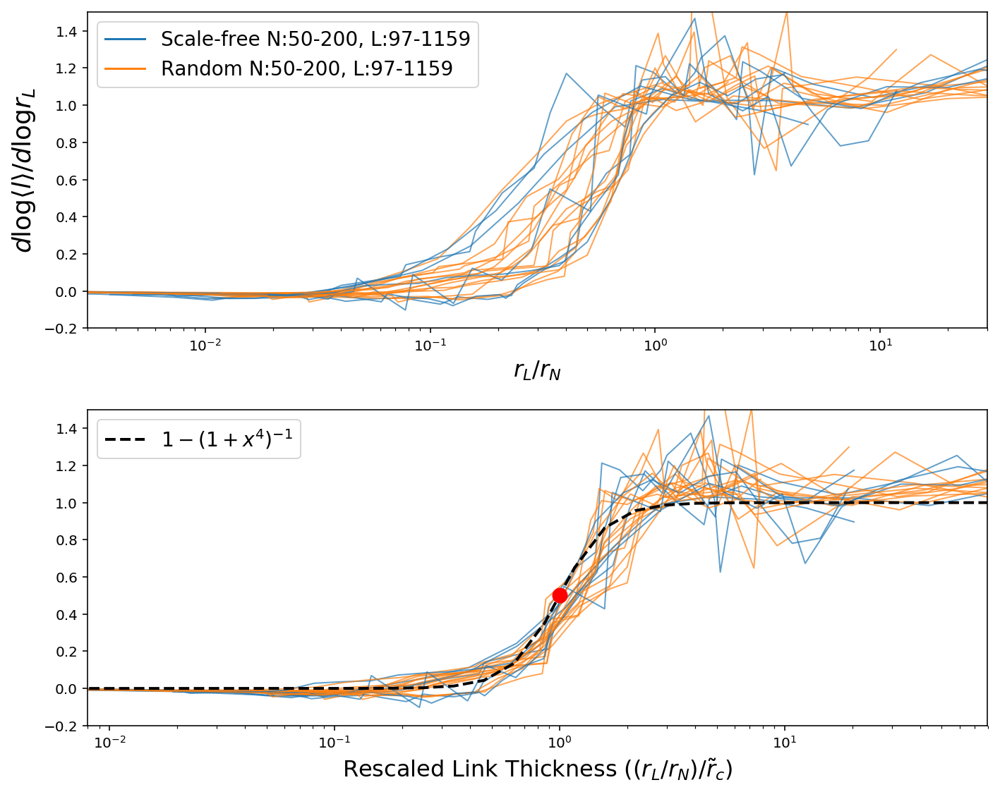

In [298]:
r = linspace(-10,10)
fig = figure(figsize=(10,8))
# fig.subplots_adjust(wspace=4)

a = .7
md = {'BA':[10000,1],'ER':[10000,1]}
nd = {'BA':[10000,1],'ER':[10000,1]}

for k in stats:
    if 'Lat' in k: continue
    if 'fixed' in k: continue
#     if k == 'BA-0-n50-L97': continue
#     if k == 'ER-0-n50-L97': continue

#     if k == 'BA-0-n50-L595': continue
    if k == 'ER-0-n50-L595': continue

    c = (mt['tab:blue'] if 'BA' in k else mt['tab:orange'])
    n,m = (sd(k,'n'),sd(k,'L') ) 
    md[k[:2]][0] = min(m,md[k[:2]][0])
    md[k[:2]][1] = max(m,md[k[:2]][1])
    nd[k[:2]][0] = min(n,nd[k[:2]][0])
    nd[k[:2]][1] = max(n,nd[k[:2]][1])
    
    
    lth = stats[k]
    gr = gradient(log(lth.T[-1]))/gradient(log(lth.T[0]))
    th = lth.T[0]
#     print k
    la = m/n
    x = arange(1.,n)# linspace(.1, 20,150)
    # mom(x,pk(x,la))
    ar = 1/rho_c(n,m,x), (pk(x,la) if 'ER-' in k else (x**-3 if 'BA-' in k else exp(-x**2)))# x**-3 #pk(x,la)
    m0,r0,s = mom(*ar), rs(n,m), sig(*ar)
#     print ('%d: '+'%.2g, '*3) %(m, m0,r0,s)
    r1 = log(th)
    subplot(211)
    plot(th,gr,'-',ms=4,c=c,lw=1.,alpha = a)
#     subplot(132)
#     #plot(-(r1-log(m0))*log(s),2*sigmoid( -log(s)*(r1-log(m0))))
# #     plot(exp(-(r1-log(m0))*log(s)),gr,'-',ms=4,label = k[5:])
#     plot(exp(-log(s)*(r1-log(m0))),gr,'-',ms=4,c=c,lw=1,alpha = a)#label = k[5:],)
    subplot(212)
    #plot(exp((r1-log(m0))),gr,'-',ms=4,c=c,lw=1,alpha = a)#label = k[5:],)
    plot(th/m0,gr,'-',ms=4,c=c,lw=1.,alpha = a)#label = k[5:],)
#   
#     show()
#ylim(-0.01,3)


r = logspace(-10,10,150)

subplot(211)
plot([1],[1],'-', c=mt['tab:blue'], label = 'Scale-free N:%d-%d'%tuple(nd['BA'])+', L:%d-%d'%tuple(md['BA']))
plot([1],[1],'-', c=mt['tab:orange'], label = 'Random N:%d-%d'%tuple(nd['ER'])+', L:%d-%d'%tuple(md['ER']))

legend(fontsize=14)

# plot(r,(erf(log(r/3e-1)/1)+1)/2, 'k--', lw = 2)
# plot([.3],[.5],'ro')
xlim(3e-3,3e1)

xscale('log')
xlabel(r'$r_L/r_N$',fontsize=16)
ylabel(r'${d \log\langle l\rangle }/{d\log r_L}$',fontsize=18 )
ylim(-.2,1.5)
subplot(212)
# plot(r,.5*(erf(log(r)*sqrt(2))+1), 'k--', lw = 2,label=r'erf$[\log (r)]+1$' )
# plot(r,.5*(erf(log(r)*(2))+1), 'k--', lw = 2,label=r'erf$[\log (r)]+1$' )
# plot(r,1*sigmoid(log(r)*4), 'k--', lw = 1 )
plot(r,1*(1-1/(1+r**4)), 'k--', lw = 2,label= r'$1-\left(1+x^{4}\right)^{-1}$')
plot([1],[.5],'ro', ms=10)

xscale('log')
xlim(3e-3/m0,3e1/m0)
# yticks([])
xlabel(r'Rescaled Link Thickness ($(r_L/r_N)/\tilde{r}_c$)',fontsize=16)
ylim(-.2,1.5)
tight_layout()
legend(fontsize=14)

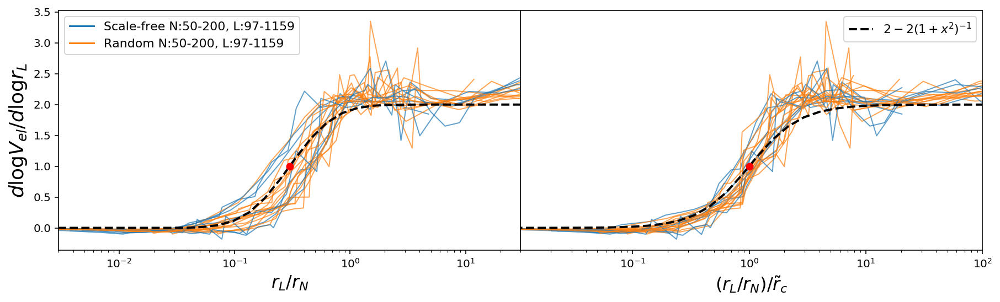

In [289]:
r = linspace(-10,10)
fig = figure(figsize=(15,4))
fig.subplots_adjust(wspace=0)

a = .7
md = {'BA':[10000,1],'ER':[10000,1]}
nd = {'BA':[10000,1],'ER':[10000,1]}

for k in stats:
    if 'Lat' in k: continue
    if 'fixed' in k: continue
#     if k == 'BA-0-n50-L97': continue
#     if k == 'ER-0-n50-L97': continue

#     if k == 'BA-0-n50-L595': continue
    if k == 'ER-0-n50-L595': continue

    c = (mt['tab:blue'] if 'BA' in k else mt['tab:orange'])
    n,m = (sd(k,'n'),sd(k,'L') ) 
    md[k[:2]][0] = min(m,md[k[:2]][0])
    md[k[:2]][1] = max(m,md[k[:2]][1])
    nd[k[:2]][0] = min(n,nd[k[:2]][0])
    nd[k[:2]][1] = max(n,nd[k[:2]][1])
    
    
    lth = stats[k]
    gr = gradient(log(lth.T[1]))/gradient(log(lth.T[0]))
    th = lth.T[0]
#     print k
    la = m/n
    x = arange(1.,n)# linspace(.1, 20,150)
    # mom(x,pk(x,la))
    ar = 1/rho_c(n,m,x), (pk(x,la) if 'ER-' in k else (x**-3 if 'BA-' in k else exp(-x**2)))# x**-3 #pk(x,la)
    m0,r0,s = mom(*ar), rs(n,m), sig(*ar)
#     print ('%d: '+'%.2g, '*3) %(m, m0,r0,s)
    r1 = log(th)
    subplot(121)
    plot(th,gr,'-',ms=4,c=c,lw=1.,alpha = a)
#     subplot(132)
#     #plot(-(r1-log(m0))*log(s),2*sigmoid( -log(s)*(r1-log(m0))))
# #     plot(exp(-(r1-log(m0))*log(s)),gr,'-',ms=4,label = k[5:])
#     plot(exp(-log(s)*(r1-log(m0))),gr,'-',ms=4,c=c,lw=1,alpha = a)#label = k[5:],)
    subplot(122)
    #plot(exp((r1-log(m0))),gr,'-',ms=4,c=c,lw=1,alpha = a)#label = k[5:],)
    plot(th/m0,gr,'-',ms=4,c=c,lw=1.,alpha = a)#label = k[5:],)
#   
#     show()
#ylim(-0.01,3)


r = logspace(-10,10,150)

subplot(121)
plot([1],[1],'-', c=mt['tab:blue'], label = 'Scale-free N:%d-%d'%tuple(nd['BA'])+', L:%d-%d'%tuple(md['BA']))
plot([1],[1],'-', c=mt['tab:orange'], label = 'Random N:%d-%d'%tuple(nd['ER'])+', L:%d-%d'%tuple(md['ER']))

legend(fontsize=11)

plot(r,(erf(log(r/3e-1)/1)+1)/1, 'k--', lw = 2)
plot([.3],[1],'ro')
xlim(3e-3,3e1)

xscale('log')
xlabel(r'$r_L/r_N$',fontsize=16)
ylabel(r'${d \log V_{el} }/{d\log r_L}$',fontsize=18 )

subplot(122)
# plot(r,erf(log(r))+1, 'k--', lw = 2,label=r'erf$[\log (r)]+1$' )
# plot(r,2*sigmoid(log(r)*4), 'k--', lw = 1 )
plot(r,2-2/(1+r**2), 'k--', lw = 2,label= r'$2-2\left(1+x^{2}\right)^{-1}$')
plot([1],[1],'ro')

xscale('log')
xlim(1.1e-2,1e2)
yticks([])
xlabel(r'$(r_L/r_N)/\tilde{r}_c$',fontsize=16)

legend(fontsize=11)

In [164]:
sqrt(4*sqrt(2)/pi/(3./4))

1.549465556168411

$${d \log\langle l\rangle }/{d\log r_L}$$

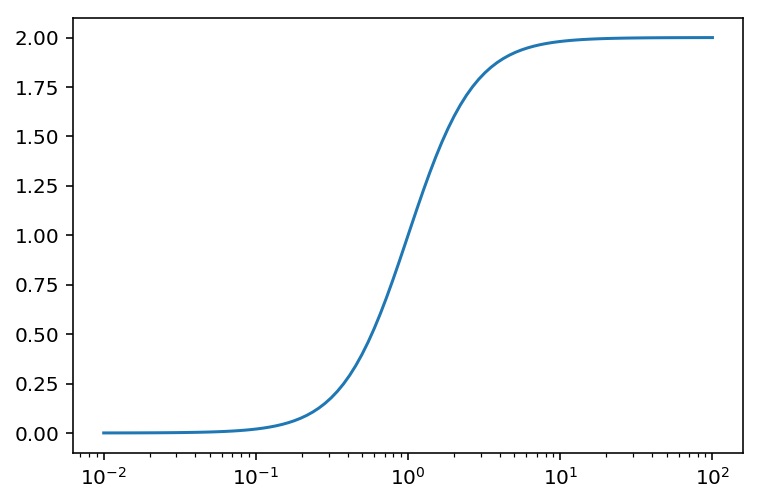

In [401]:
x = logspace(-2,2,100)
plot(x,2-2/(1+x**2))
xscale('log')

Text(0.5,0,'$(r_L/r_N)/\\langle\\tilde{r}_c(k)\\rangle$')

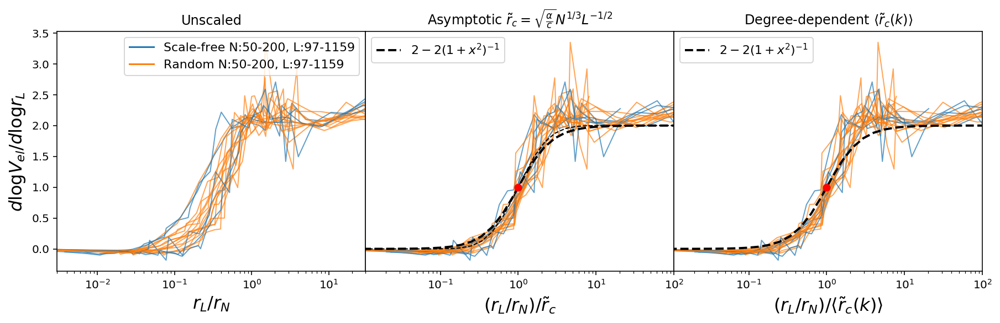

In [288]:
r = linspace(-10,10)
fig = figure(figsize=(15,4))
fig.subplots_adjust(wspace=0)

a = .7

for k in stats:
    if 'Lat' in k: continue
    if 'fixed' in k: continue
    if k == 'BA-0-n50-L97': continue
    if k == 'ER-0-n50-L97': continue

    if k == 'BA-0-n50-L595': continue
    if k == 'ER-0-n50-L595': continue

    c = (mt['tab:blue'] if 'BA' in k else mt['tab:orange'])
    
    n,m = (sd(k,'n'),sd(k,'L') ) 
    lth = stats[k]
    gr = gradient(log(lth.T[1]))/gradient(log(lth.T[0]))
    th = lth.T[0]
#     print k
    la = m/n
    x = arange(1.,n)# linspace(.1, 20,150)
    # mom(x,pk(x,la))
    ar = 1/rho_c(n,m,x), (pk(x,la) if 'ER-' in k else (x**-3 if 'BA-' in k else exp(-x**2)))# x**-3 #pk(x,la)
    m0,r0,s = mom(*ar), rs(n,m), sig(*ar)
#     print ('%d: '+'%.2g, '*3) %(m, m0,r0,s)
    r1 = log(th)
    subplot(131)
    plot(th,gr,'-',ms=4,c=c,lw=1,alpha = a)
    subplot(132)
    #plot(-(r1-log(m0))*log(s),2*sigmoid( -log(s)*(r1-log(m0))))
#     plot(exp(-(r1-log(m0))*log(s)),gr,'-',ms=4,label = k[5:])
#     plot(exp(-log(s)*(r1-log(m0))),gr,'-',ms=4,c=c,lw=1,alpha = a)#label = k[5:],)
    plot(th/(r0),gr,'-',ms=4,c=c,lw=1,alpha = a)#label = k[5:],)
    subplot(133)
    #plot(exp((r1-log(m0))),gr,'-',ms=4,c=c,lw=1,alpha = a)#label = k[5:],)
    plot(th/m0,gr,'-',ms=4,c=c,lw=1,alpha = a)#label = k[5:],)
#   
#     show()
#ylim(-0.01,3)


r = logspace(-10,10,150)

subplot(131)
# plot(r,(erf(log(r/3e-1)/1)+1)/1, 'k--', lw = 1)
# plot([3e-1],[1],'ro')
plot([1],[1],'-', c=mt['tab:blue'], label = 'Scale-free N:%d-%d'%tuple(nd['BA'])+', L:%d-%d'%tuple(md['BA']))
plot([1],[1],'-', c=mt['tab:orange'], label = 'Random N:%d-%d'%tuple(nd['ER'])+', L:%d-%d'%tuple(md['ER']))

legend(fontsize=11)
ylabel(r'$d\log V_{el}/d\log r_L$',fontsize=16)

xlim(3e-3,3e1)

xscale('log')
# xlim(-4,4)

title('Unscaled')
xlabel(r'$r_L/r_N$',fontsize=16)

subplot(132)
xscale('log')
# xlim(-10,10)
# plot(r,(erf(log(r)/4)+1)*1, 'k--', lw = 1)
plot(r,(erf(log(r)/1)+1)*1, 'k--', lw = 1)

plot(r,2-2/(1+r**2), 'k--', lw = 2,label= r'$2-2\left(1+x^{2}\right)^{-1}$')
plot([1],[1],'ro')
# plot(r,(erf(log(r)/1)+1)/2, 'k--', lw = 2)
# xlim(5e-7,5e7)
xlim(1.1e-2,1e2)
yticks([])
title(r'Asymptotic $\tilde{r}_c =\sqrt{\frac{\alpha}{c}}N^{1/3}L^{-1/2} $')
legend(fontsize=11)
xlabel(r'$(r_L/r_N)/\tilde{r}_c$',fontsize=16)

subplot(133)
# plot(r,(erf(log(r)/1)+1)*1, 'k--', lw = 1)
plot(r,2-2/(1+r**2), 'k--', lw = 2,label= r'$2-2\left(1+x^{2}\right)^{-1}$')
plot([1],[1],'ro')

xscale('log')
xlim(1.1e-2,1e2)
yticks([])
legend(fontsize=11)
title(r'Degree-dependent $\langle\tilde{r}_c(k)\rangle$')
xlabel(r'$(r_L/r_N)/\langle\tilde{r}_c(k)\rangle$',fontsize=16)


Text(0.5,0,'$(r_L/r_N)/\\langle\\tilde{r}_c(k)\\rangle$')

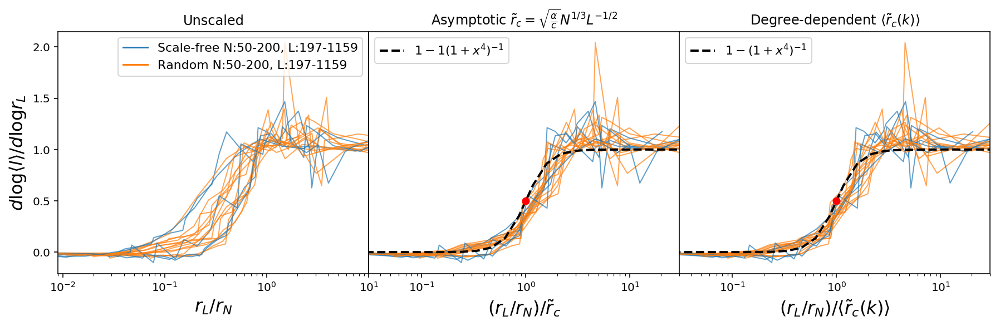

In [138]:
r = linspace(-10,10)
fig = figure(figsize=(15,4))
fig.subplots_adjust(wspace=0)

a = .7
md = {'BA':[10000,1],'ER':[10000,1]}
nd = {'BA':[10000,1],'ER':[10000,1]}

for k in stats:
    if 'Lat' in k: continue
    if 'fixed' in k: continue
    if k == 'BA-0-n50-L97': continue
    if k == 'ER-0-n50-L97': continue

    if k == 'BA-0-n50-L595': continue
    if k == 'ER-0-n50-L595': continue

    c = (mt['tab:blue'] if 'BA' in k else mt['tab:orange'])
    
    n,m = (sd(k,'n'),sd(k,'L') ) 
    md[k[:2]][0] = min(m,md[k[:2]][0])
    md[k[:2]][1] = max(m,md[k[:2]][1])
    nd[k[:2]][0] = min(n,nd[k[:2]][0])
    nd[k[:2]][1] = max(n,nd[k[:2]][1])
    lth = stats[k]
    gr = gradient(log(lth.T[-1]))/gradient(log(lth.T[0]))
    th = lth.T[0]
#     print k
    la = m/n
    x = arange(1.,n)# linspace(.1, 20,150)
    # mom(x,pk(x,la))
    ar = 1/rho_c(n,m,x), (pk(x,la) if 'ER-' in k else (x**-3 if 'BA-' in k else exp(-x**2)))# x**-3 #pk(x,la)
    m0,r0,s = mom(*ar), rs(n,m), sig(*ar)
#     print ('%d: '+'%.2g, '*3) %(m, m0,r0,s)
    r1 = log(th)
    subplot(131)
    plot(th,gr,'-',ms=4,c=c,lw=1,alpha = a)
    subplot(132)
    #plot(-(r1-log(m0))*log(s),2*sigmoid( -log(s)*(r1-log(m0))))
#     plot(exp(-(r1-log(m0))*log(s)),gr,'-',ms=4,label = k[5:])
#     plot(exp(-log(s)*(r1-log(m0))),gr,'-',ms=4,c=c,lw=1,alpha = a)#label = k[5:],)
    plot(th/(r0),gr,'-',ms=4,c=c,lw=1,alpha = a)#label = k[5:],)
    subplot(133)
    #plot(exp((r1-log(m0))),gr,'-',ms=4,c=c,lw=1,alpha = a)#label = k[5:],)
    plot(th/m0,gr,'-',ms=4,c=c,lw=1,alpha = a)#label = k[5:],)
#   
#     show()
#ylim(-0.01,3)


r = logspace(-10,10,150)

subplot(131)
# plot(r,(erf(log(r/3e-1)/1)+1)/1, 'k--', lw = 1)
# plot([3e-1],[1],'ro')
plot([1],[1],'-', c=mt['tab:blue'], label = 'Scale-free N:%d-%d'%tuple(nd['BA'])+', L:%d-%d'%tuple(md['BA']))
plot([1],[1],'-', c=mt['tab:orange'], label = 'Random N:%d-%d'%tuple(nd['ER'])+', L:%d-%d'%tuple(md['ER']))

legend(fontsize=11)


xlim(9e-3,1e1)

xscale('log')
# xlim(-4,4)

title('Unscaled')
xlabel(r'$r_L/r_N$',fontsize=16)
ylabel(r'$d\log\langle l\rangle/d\log r_L$',fontsize=16)

subplot(132)
xscale('log')
# xlim(-10,10)
# plot(r,(erf(log(r)/4)+1)*1, 'k--', lw = 1)
# plot(r,(erf(log(r)/1)+1)*1, 'k--', lw = 1)

plot(r,1*(1-1/(1+r**4)), 'k--', lw = 2,label= r'$1-1\left(1+x^{4}\right)^{-1}$')
plot([1],[.5],'ro')
# plot(r,(erf(log(r)/1)+1)/2, 'k--', lw = 2)
# xlim(5e-7,5e7)
xlim(3.1e-2,.3e2)
yticks([])
title(r'Asymptotic $\tilde{r}_c =\sqrt{\frac{\alpha}{c}}N^{1/3}L^{-1/2} $')
legend(fontsize=11)
xlabel(r'$(r_L/r_N)/\tilde{r}_c$',fontsize=16)

subplot(133)
# plot(r,(erf(log(r)/1)+1)*1, 'k--', lw = 1)
plot(r,1*(1-1/(1+r**4)), 'k--', lw = 2,label= r'$1-\left(1+x^{4}\right)^{-1}$')
plot([1],[.5],'ro')

xscale('log')
xlim(3.1e-2,.3e2)
yticks([])
legend(fontsize=11)
title(r'Degree-dependent $\langle\tilde{r}_c(k)\rangle$')
xlabel(r'$(r_L/r_N)/\langle\tilde{r}_c(k)\rangle$',fontsize=16)


In [109]:
sqrt(4*sqrt(2)/pi/3*4)

1.549465556168411

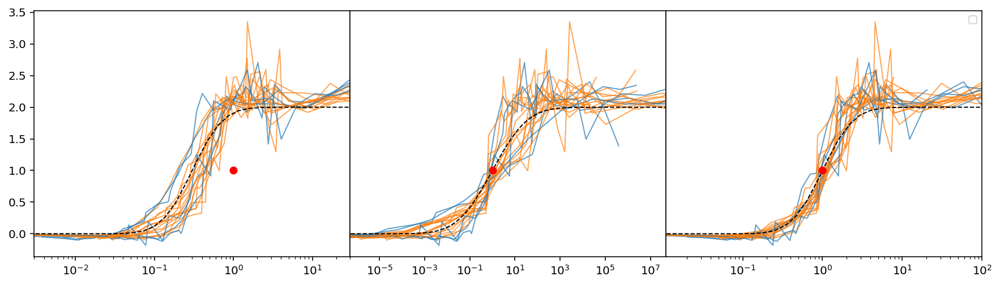

In [85]:
r = linspace(-10,10)
fig = figure(figsize=(15,4))
fig.subplots_adjust(wspace=0)

a = .7

for k in stats:
    if 'Lat' in k: continue
    if 'fixed' in k: continue
    if k == 'BA-0-n50-L97': continue
    if k == 'ER-0-n50-L97': continue

    if k == 'BA-0-n50-L595': continue
    if k == 'ER-0-n50-L595': continue

    c = (mt['tab:blue'] if 'BA' in k else mt['tab:orange'])
    
    n,m = (sd(k,'n'),sd(k,'L') ) 
    lth = stats[k]
    gr = gradient(log(lth.T[1]))/gradient(log(lth.T[0]))
    th = lth.T[0]
#     print k
    la = m/n
    x = arange(1.,n)# linspace(.1, 20,150)
    # mom(x,pk(x,la))
    ar = 1/rho_c(n,m,x), (pk(x,la) if 'ER-' in k else (x**-3 if 'BA-' in k else exp(-x**2)))# x**-3 #pk(x,la)
    m0,r0,s = mom(*ar), rs(n,m), sig(*ar)
#     print ('%d: '+'%.2g, '*3) %(m, m0,r0,s)
    r1 = log(th)
    subplot(131)
    plot(th,gr,'-',ms=4,c=c,lw=1,alpha = a)
    subplot(132)
    #plot(-(r1-log(m0))*log(s),2*sigmoid( -log(s)*(r1-log(m0))))
#     plot(exp(-(r1-log(m0))*log(s)),gr,'-',ms=4,label = k[5:])
    plot(exp(-log(s)*(r1-log(m0))),gr,'-',ms=4,c=c,lw=1,alpha = a)#label = k[5:],)
    subplot(133)
    #plot(exp((r1-log(m0))),gr,'-',ms=4,c=c,lw=1,alpha = a)#label = k[5:],)
    plot(th/m0,gr,'-',ms=4,c=c,lw=1,alpha = a)#label = k[5:],)
#   
#     show()
#ylim(-0.01,3)


r = logspace(-10,10,150)

subplot(131)
plot(r,(erf(log(r/3e-1)/1)+1)/1, 'k--', lw = 1)
plot([1],[1],'ro')
xlim(3e-3,3e1)

xscale('log')
# xlim(-4,4)
subplot(132)
xscale('log')
# xlim(-10,10)
plot(r,(erf(log(r)/4)+1)*1, 'k--', lw = 1)
plot([1],[1],'ro')
# plot(r,(erf(log(r)/1)+1)/2, 'k--', lw = 2)
xlim(5e-7,5e7)

yticks([])

subplot(133)
plot(r,(erf(log(r)/1)+1)*1, 'k--', lw = 1)
plot([1],[1],'ro')

xscale('log')
xlim(1.1e-2,1e2)
yticks([])
legend(fontsize=9)

In [ ]:
r = linspace(-10,10)
figure(figsize=(15,4))
for k in stats:
#     if 'BA' not in k: continue
    c = (mt['tab:blue'] if 'BA' in k else mt['tab:orange'])
    
    n,m = (sd(k,'n'),sd(k,'L') ) 
    lth = stats[k]
    gr = gradient(log(lth.T[1]))/gradient(log(lth.T[0]))
    th = lth.T[0]
#     print k
    la = m/n
    x = arange(1.,n)# linspace(.1, 20,150)
    # mom(x,pk(x,la))
    ar = 1/rho_c(n,m,x), (pk(x,la) if 'ER-' in k else (x**-3 if 'BA-' in k else 1.))# x**-3 #pk(x,la)
    m0,r0,s = mom(*ar), rs(n,m), sig(*ar)
#     print ('%d: '+'%.2g, '*3) %(m, m0,r0,s)
    r1 = log(th)
    subplot(131)
    plot(th,gr,'-',ms=4,c=c,lw=1,alpha = .5)
    subplot(132)
    #plot(-(r1-log(m0))*log(s),2*sigmoid( -log(s)*(r1-log(m0))))
#     plot(exp(-(r1-log(m0))*log(s)),gr,'-',ms=4,label = k[5:])
    plot(s**(-1*(r1-log(m0))),gr,'-',ms=4,c=c,lw=1,alpha = .5)#label = k[5:],)
    subplot(133)
    plot(exp((r1-log(m0))),gr,'-',ms=4,c=c,lw=1,alpha = .5)#label = k[5:],)
#   
#     show()
#ylim(-0.01,3)


r = logspace(-10,10,150)
subplot(131)
plot(r,(erf(log(r/3e-1)/1)+1)/1, 'k--', lw = 1)
plot([1],[1],'ro')
xlim(3e-3,3e1)

xscale('log')
# xlim(-4,4)
subplot(132)
xscale('log')
# xlim(-10,10)
plot(r,(erf(log(r)/4)+1)*1, 'k--', lw = 1)
plot([1],[1],'ro')
# plot(r,(erf(log(r)/1)+1)/2, 'k--', lw = 2)
xlim(1e-10,1e10)
subplot(133)
plot(r,(erf(log(r)/1)+1)*1, 'k--', lw = 1)
plot([1],[1],'ro')

xscale('log')
xlim(1e-2,1e2)
legend(fontsize=9)

In [ ]:
r = linspace(-10,10)
figure(figsize=(12,4))
for k in stats:
#     if 'BA' not in k: continue
    n,m = (sd(k,'n'),sd(k,'L') ) 
    lth = stats[k]
    gr = gradient((lth.T[1]))/lth.T[1]/gradient((lth.T[0]))*lth.T[0]
    th = lth.T[0]
    print k
    la = m/n
    x = arange(1.,n)# linspace(.1, 20,150)
    # mom(x,pk(x,la))
    ar = 1/rho_c(n,m,x), pk(x,la)# x**-3 #pk(x,la)
    m0,r0,s = mom(*ar), rs(n,m), sig(*ar)
    print ('%d: '+'%.2g, '*3) %(m, m0,r0,s)
    r1 = log(th)
    subplot(121)
    plot(th,gr,'.-',ms=4)
    subplot(122)
    #plot(-(r1-log(m0))*log(s),2*sigmoid( -log(s)*(r1-log(m0))))
#     plot(exp(-(r1-log(m0))*log(s)),gr,'-',ms=4,label = k[5:])
#     plot(s**(-(r1-log(m0))),gr,'-',ms=4,label = k[5:])
    plot(exp((r1-log(m0))),gr,'-',ms=4,label = k[5:])
#   
#     show()
#ylim(-0.01,3)


r = logspace(-2,2)
subplot(121)
# plot(r,(erf(log(r)/1)+1)/2, 'k--', lw = 2)
xscale('log')
# xlim(-4,4)
subplot(122)
xscale('log')
# xlim(-10,10)
# plot(r,(erf(log(r)/4)+1)/2, 'k--', lw = 2)
plot(r,(erf(log(r)/1)+1)/2, 'k--', lw = 2)
# plot(r,sigmoid(2*log(r)), 'k--', lw = 2)
legend(fontsize=9)

In [379]:
-1/log(s), s

(0.21846847053925111, 0.010282420965076363)

In [380]:
xyzk

NameError: name 'xyzk' is not defined

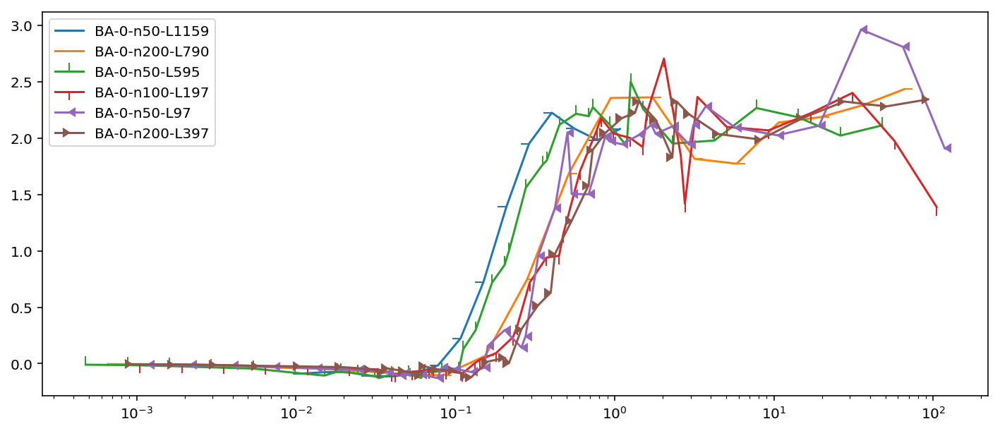

In [423]:
figure(figsize= (12,5))
ii = 0
for k,lth in stats.iteritems(): 
#     if 'BA' in k:continue
#     if k == 'BA-0-n50-L97': continue

    c = (mt['tab:blue'] if 'BA' in k else mt['tab:orange'])
    r_c = 1 #rs(sd(k,'n'),sd(k,'L'))
    plot(lth.T[0]/r_c,gradient(log(lth.T[1]))/gradient(log(lth.T[0]/r_c)), 
         marker=ii %12, 
         ls='-'*(ii/12+1),label = k)
    xscale('log')
    ii +=1
    
legend(fontsize=10)
x = array([1,100])

# plot(5*x,1e1*x,'k')

In [ ]:
r = linspace(-10,10)
figure(figsize=(12,4))
for k in stats:
    if 'BA' not in k: continue
    n,m = (sd(k,'n'),sd(k,'L') ) 
    lth = stats[k]
    gr = gradient(log(lth.T[1]))/gradient(log(lth.T[0]/r_c))
    th = lth.T[0]
    print k
    la = m/n
    x = arange(1.,n)# linspace(.1, 20,150)
    # mom(x,pk(x,la))
    ar = 1/rho_c(n,m,x), x**-3 #pk(x,la)
    m0,r0,s = mom(*ar), rs(n,m), sig(*ar)
    print ('%d: '+'%.2g, '*3) %(m, m0,r0,s)
    r1 = log(th)
    subplot(121)
    plot(r1,gr,'.-')
    subplot(122)
    #plot(-(r1-log(m0))*log(s),2*sigmoid( -log(s)*(r1-log(m0))))
    plot(-(r1-log(m0))*log(s),gr,'.-',label = k[5:])
#     show()
#ylim(-0.01,3)

subplot(121)
xlim(-4,4)
subplot(122)
xlim(-10,10)
# plot(r,erf(r/2)+1, 'k--', lw = 2)
legend(fontsize=9)

# STOP !!

BA-0-n50-L1159
1159: 0.17, 0.11, 0.00057, 
BA-0-n200-L790
790: 0.33, 0.21, 0.022, 
BA-0-n50-L595
595: 0.23, 0.15, 0.0068, 
BA-0-n100-L197
197: 0.53, 0.33, 0.087, 
BA-0-n50-L97
97: 0.61, 0.37, 0.13, 
BA-0-n200-L397
397: 0.47, 0.29, 0.062, 


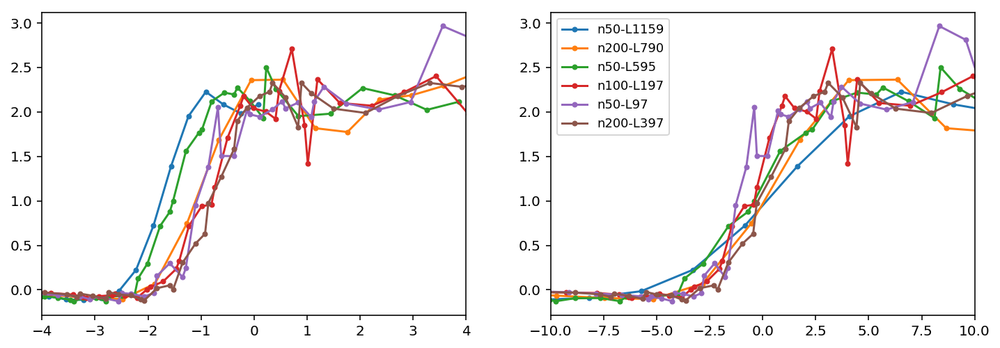

In [424]:
r = linspace(-10,10)
figure(figsize=(12,4))
for k in stats:
    if 'BA' not in k: continue
    n,m = (sd(k,'n'),sd(k,'L') ) 
    lth = stats[k]
    gr = gradient(log(lth.T[1]))/gradient(log(lth.T[0]/r_c))
    th = lth.T[0]
    print k
    la = m/n
    x = arange(1.,n)# linspace(.1, 20,150)
    # mom(x,pk(x,la))
    ar = 1/rho_c(n,m,x), x**-3 #pk(x,la)
    m0,r0,s = mom(*ar), rs(n,m), sig(*ar)
    print ('%d: '+'%.2g, '*3) %(m, m0,r0,s)
    r1 = log(th)
    subplot(121)
    plot(r1,gr,'.-')
    subplot(122)
    #plot(-(r1-log(m0))*log(s),2*sigmoid( -log(s)*(r1-log(m0))))
    plot(-(r1-log(m0))*log(s),gr,'.-',label = k[5:])
#     show()
#ylim(-0.01,3)

subplot(121)
xlim(-4,4)
subplot(122)
xlim(-10,10)
# plot(r,erf(r/2)+1, 'k--', lw = 2)
legend(fontsize=9)

In [323]:
stats.keys()

['BA-0-n50-L1159',
 'BA-0-n200-L790',
 'BA-0-n50-L595',
 'BA-0-n100-L197',
 'BA-0-n50-L97',
 'BA-0-n200-L397']

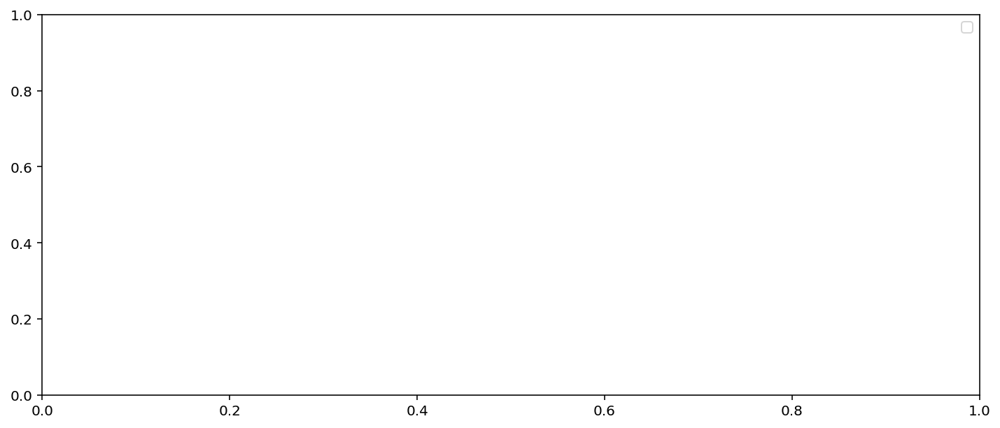

In [324]:
figure(figsize= (12,5))
ii = 0
for k,lth in stats.iteritems(): 
    if 'BA' in k:continue
#     if k == 'BA-0-n50-L97': continue
    n,m = (sd(k,'n'),sd(k,'L') ) 
    lth = stats[k]
    gr = gradient(log(lth.T[1]))/gradient(log(lth.T[0]/r_c))
    th = lth.T[0]
    print k
    la = m/n
    x = arange(1,n)
    
    ar = 1/rho_c(n,m,x),pk(x,la)
    m0,r0,s = mom(*ar), rs(n,m), sig(*ar)

    c = (mt['tab:blue'] if 'BA' in k else mt['tab:orange'])
    r_c = m0 #rs(sd(k,'n'),sd(k,'L'))
    plot(lth.T[0]/r_c,gradient(log(lth.T[1]))/gradient(log(lth.T[0]/r_c)), 
         marker=ii %12, 
         ls='-'*(ii/12+1),label = k)
    xscale('log')
    ii +=1
    
legend(fontsize=10)
x = array([1,100])

#     print ('%d: '+'%.2g, '*3) %(m, m0,r0,s)
#     plot(log(th),gr)
#     plot(r,2*sigmoid( -log(s)*(r-log(m0))))
#     show()


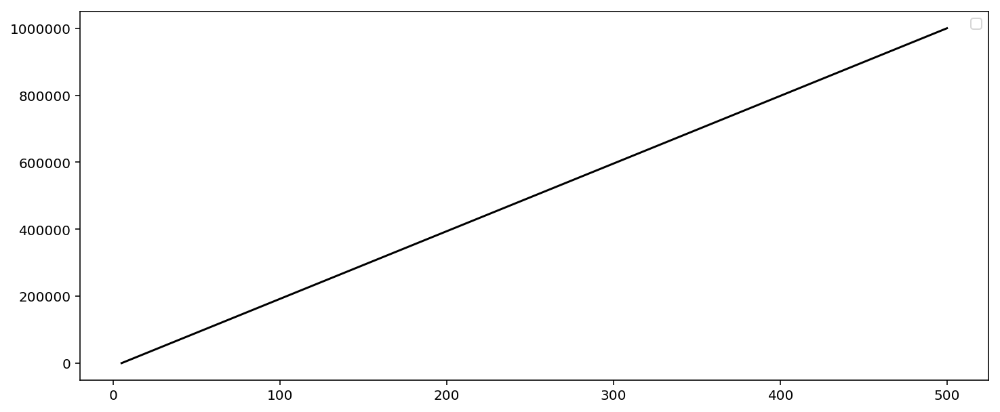

In [325]:
figure(figsize= (12,5))
ii = 0
for k,lth in stats.iteritems(): 
    if 'ER' not in k: continue
    n,m = (sd(k,'n'),sd(k,'L') ) 
    lth = stats[k]
    th = lth.T[0]
    la = ceil( m/float(n))
    x = arange(1.,n)# linspace(.1, 20,150)
    ar = 1/rho_c(n,m,x),pk(x,la)
    m0,r0,s = mom(*ar), rs(n,m), sig(*ar)
    r_c = m0
    c = (mt['tab:blue'] if 'BA' in k else mt['tab:orange'])
    r_c = rs(sd(k,'n'),sd(k,'L'))
    loglog(lth.T[0]/r_c,lth.T[1],  marker=ii %12, ls='-'*(ii/12+1),c=c, label = k)
    
#     loglog(lth.T[0]/r_c,gradient(lth.T[1])/gradient(lth.T[0]/r_c), marker=ii,c=c)
    xscale('log')
    ii +=1
    
legend(fontsize=10)
x = array([1,100])

plot(5*x,(1e1*x)**2,'k')

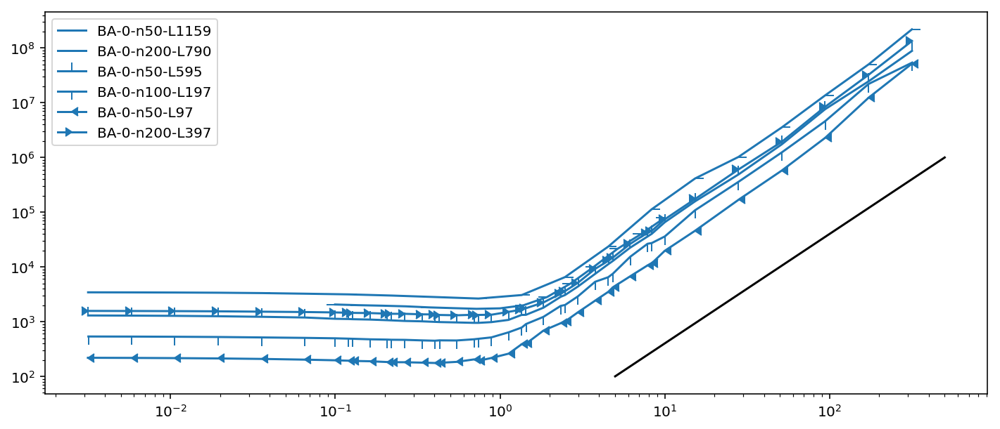

In [326]:
figure(figsize= (12,5))
ii = 0
for k,lth in stats.iteritems(): 
    if 'BA' not in k: continue
    n,m = (sd(k,'n'),sd(k,'L') ) 
    lth = stats[k]
    th = lth.T[0]
    la = ceil( m/float(n))
    x = arange(1.,n)# linspace(.1, 20,150)
    ar = 1/rho_c(n,m,x),pk(x,la)
    m0,r0,s = mom(*ar), rs(n,m), sig(*ar)
    r_c = m0
    c = (mt['tab:blue'] if 'BA' in k else mt['tab:orange'])
    r_c = rs(sd(k,'n'),sd(k,'L'))
    loglog(lth.T[0]/r_c,lth.T[1],  marker=ii %12, ls='-'*(ii/12+1),c=c, label = k)
    
#     loglog(lth.T[0]/r_c,gradient(lth.T[1])/gradient(lth.T[0]/r_c), marker=ii,c=c)
    xscale('log')
    ii +=1
    
legend(fontsize=10)
x = array([1,100])

plot(5*x,(1e1*x)**2,'k')

In [42]:
stats2={ k: get_vars3(k,pth='../../output/phase-finite-032818/',ep=1) for k in ['BA', 'ER', 'Lat']}

stats2_fx ={ k: get_vars3(k,fx =1,pth='../../output/phase-finite-032818/', ep=5.5) for k in ['BA', 'ER', 'Lat']}
# stats2_fx ={ k: get_vars3(k,fx =1, ep=15.5) for k in ['BA', 'ER', 'Lat']}

../../output/phase-finite-032818/ 0 BA-0-n100-L197-th-r0.00105-segs15-ka95.2.json 1 BA-0-n100-L197-th-r0.00192-segs15-ka52.1.json 2 BA-0-n100-L197-th-r0.00351-segs15-ka28.5.json 3 BA-0-n100-L197-th-r0.00644-segs15-ka15.5.json 4 BA-0-n100-L197-th-r0.0118-segs15-ka8.47.json 5 BA-0-n100-L197-th-r0.0216-segs15-ka4.63.json 6 BA-0-n100-L197-th-r0.0331-segs15-ka3.02.json 7 BA-0-n100-L197-th-r0.0397-segs15-ka2.52.json 8 BA-0-n100-L197-th-r0.0421-segs15-ka2.38.json 9 BA-0-n100-L197-th-r0.0537-segs15-ka1.86.json 10 BA-0-n100-L197-th-r0.0684-segs15-ka1.46.json 11 BA-0-n100-L197-th-r0.0727-segs15-ka1.38.json 12 BA-0-n100-L197-th-r0.0872-segs15-ka1.15.json 13 BA-0-n100-L197-th-r0.111-segs15-ka0.901.json 14 BA-0-n100-L197-th-r0.133-segs15-ka0.752.json 15 BA-0-n100-L197-th-r0.142-segs15-ka0.704.json 16 BA-0-n100-L197-th-r0.18-segs15-ka0.556.json 17 BA-0-n100-L197-th-r0.23-segs15-ka0.435.json 18 BA-0-n100-L197-th-r0.244-segs15-ka0.41.json 19 BA-0-n100-L197-th-r0.293-segs15-ka0.341.json 20 BA-0-n100-L1

In [128]:
stats3={ k: get_vars3(k,pth='../../output/phase-finite-032818/',ep=1) \
        for k in ['BA-0-n200-L397', 'ER-0-n197-L397']}

stats3_fx ={ k: get_vars3(k,fx =1,pth='../../output/phase-finite-032818/', ep=5.5) \
            for k in ['BA-0-n200-L397', 'ER-0-n197-L397']}

# stats2_fx ={ k: get_vars3(k,fx =1, ep=15.5) for k in ['BA', 'ER', 'Lat']}

../../output/phase-finite-032818/ 0 BA-0-n200-L397-th-r0.000928-segs15-ka108.json 1 BA-0-n200-L397-th-r0.0017-segs15-ka58.8.json 2 BA-0-n200-L397-th-r0.00312-segs15-ka32.1.json 3 BA-0-n200-L397-th-r0.00572-segs15-ka17.5.json 4 BA-0-n200-L397-th-r0.0105-segs15-ka9.52.json 5 BA-0-n200-L397-th-r0.0192-segs15-ka5.21.json 6 BA-0-n200-L397-th-r0.0294-segs15-ka3.4.json 7 BA-0-n200-L397-th-r0.0352-segs15-ka2.84.json 8 BA-0-n200-L397-th-r0.0374-segs15-ka2.67.json 9 BA-0-n200-L397-th-r0.0477-segs15-ka2.1.json 10 BA-0-n200-L397-th-r0.0607-segs15-ka1.65.json 11 BA-0-n200-L397-th-r0.0645-segs15-ka1.55.json 12 BA-0-n200-L397-th-r0.0774-segs15-ka1.29.json 13 BA-0-n200-L397-th-r0.0986-segs15-ka1.01.json 14 BA-0-n200-L397-th-r0.118-segs15-ka0.847.json 15 BA-0-n200-L397-th-r0.126-segs15-ka0.794.json 16 BA-0-n200-L397-th-r0.16-segs15-ka0.625.json 17 BA-0-n200-L397-th-r0.204-segs15-ka0.49.json 18 BA-0-n200-L397-th-r0.217-segs15-ka0.461.json 19 BA-0-n200-L397-th-r0.26-segs15-ka0.385.json 20 BA-0-n200-L397-

In [29]:
stats2.items()[0][1].keys()

['ka', 'cur', 'lz0', 'l', 'nam', 'a1', 'a2', 't', 'th', 'v', 'lz', 'wz']

In [119]:
def get_rc(k, p_k = lambda x: ones_like(x)):
    n,m = (sd(k,'n'),sd(k,'L') ) 
#     lth = stats[k]
#     gr = gradient(log(lth.T[-1]))/gradient(log(lth.T[0]))
#     th = lth.T[0]
    la = ceil( m/float(n))
    x = arange(1.,n)
    if k.split('-')[0]=='ER':
        p = pk(x,la)
    elif k.split('-')[0]=='BA':
        p = x**-3
    else: 
        p = p_k(x)
    ar = 1/rho_c(n,m,x), p 
    return mom(*ar), sig(*ar)
    

def trans_region(k, y1=0, y2=5, alpha=.3,scaled=True):
    rc ,si = get_rc(k)
    si = 2/log(s) #sqrt(2)/log(s)
    r0 = log(rc)
    c = ('orange' if 'ER' in k else 'blue')
    fill_between(exp([r0-3*si,r0+3*si])/(rc if scaled else 1), [y1]*2, [y2]*2, alpha = alpha , facecolor=c)


(0.002, 200.0)

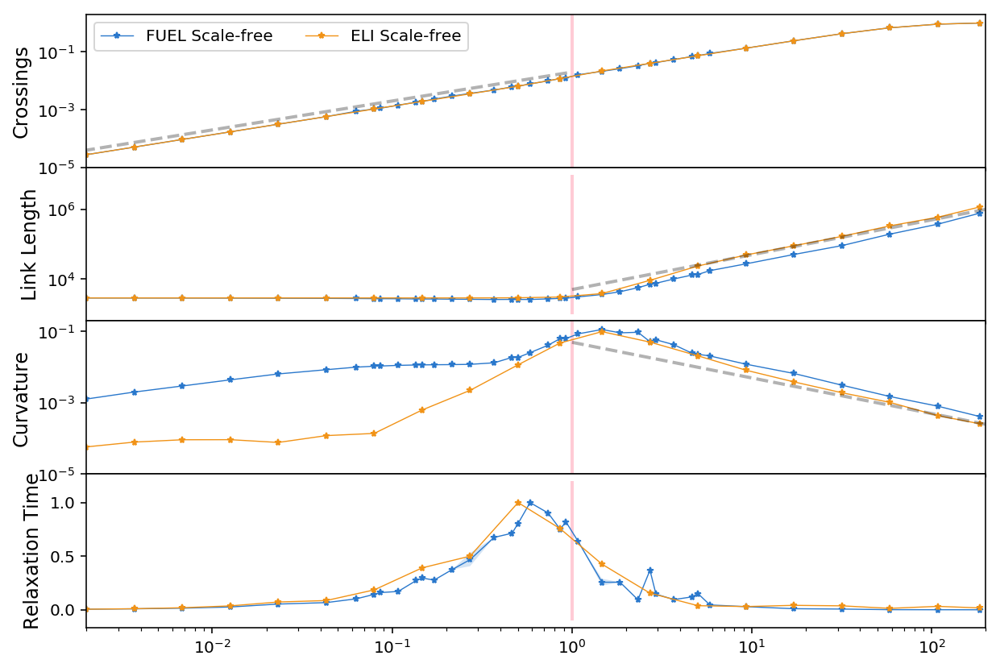

In [311]:

nn = 150#130#55
n1 = 4
fs = 12
x = logspace(0,3,5)
ep,h,h1 = 2e-2, 2e-1,1e-1
mx = (2.0e-3,2.0e2)
# cs = {'BA':(1,0),'ER':(.5,0),'Lat':(.2,10)}
cs = {'BA-0-n200-L397':(1,0),'ER-0-n197-L397':(.5,0),'Lat':(.2,10)}
y=array([1-ep,1+ep])
cl = ['#2a78cc','#f19317']
fig = figure(figsize=(10,7))
fig.subplots_adjust(hspace=0)

p = {'BA-0-n200-L397':'Scale-free', 'ER-0-n197-L397':'Random', 'Lat': 'Lattice'}
mk = {'BA-0-n200-L397':'*', 'ER-0-n197-L397':'o', 'Lat': '|'}

# p = {'BA':'Scale-free', 'ER':'Random', 'Lat': 'Lattice'}
# mk = {'BA':'*', 'ER':'o', 'Lat': '|'}

ms,lw =4,.7
a = .2
for k,t in stats3.items():
#     if 'L397' not in k: continue
    try:
        rc ,si = get_rc(k)
        ii=1
        kw = {'label' : 'FUEL '+p[k],'c':cl[0],'marker':mk[k],'ms':ms,'lw':lw}
        subplot(n1,1,ii);ii+=1
        crs = bin_dat1(t['th']/rc,tanh(.03*cs[k][0]*t['th']),nn,scale='')
        shade(crs[-cs[k][1]:],falpha = a,**kw)
        yscale('log')
        subplot(n1,1,ii);ii+=1
        lz = bin_dat1(t['th']/rc, t['lz'],nn)
        shade(lz,falpha = a,**kw)
        #plot(*lz.T[:2],**kw)
        subplot(n1,1,ii);ii+=1
        c = bin_dat1(t['th']/rc, t['cur'],nn, scale='')#(nn if k != 'ER' else 20))
        shade(c,falpha = a,**kw)
        #plot(*c.T[:2],**kw)
        subplot(n1,1,ii);ii+=1
        #t1 = (t['t']*t['lz']/maximum(1,t['th'])**2)
        t1 = (t['t']/t['lz']**2)#/maximum(1,t['th'])**2)
        t0 = bin_dat1(t['th']/rc, t1/t1.max(),nn, scale='')
        shade(t0,falpha = a,**kw)
        #plot(*t0.T[:2],**kw)
    except TypeError:
        continue
for k,t in stats3_fx.items():
#     if 'L397' not in k: continue
    try:
        rc ,si = get_rc(k)
        
        ii=1
        kw = {'label' : 'ELI '+p[k],'c':cl[1],'marker':mk[k],'ms':ms,'lw':lw}
        subplot(n1,1,ii);ii+=1
        crs = bin_dat1(t['th']/rc,tanh(.03*cs[k][0]*t['th']),nn,scale='')
        shade(crs[-cs[k][1]:],falpha = a,**kw)
        yscale('log')
        subplot(n1,1,ii);ii+=1
        lz = bin_dat1(t['th']/rc, t['lz'],nn)
        shade(lz,falpha = a,**kw)
        #plot(*lz.T[:2],**kw)
        subplot(n1,1,ii);ii+=1
        c = bin_dat1(t['th']/rc, t['cur'],nn, scale='')#(nn if k != 'ER' else 20))
        shade(c,falpha = a,**kw)
        #plot(*c.T[:2],**kw)
        subplot(n1,1,ii);ii+=1
        #t1 = (t['t']*t['lz']/maximum(1,t['th'])**2)
        t1 = (t['t']/t['lz']**1)#/maximum(1,t['th'])**2)
        t0 = bin_dat1(t['th']/rc, t1/t1.max(),nn, scale='')
        shade(t0,falpha = a,**kw)
        #plot(*t0.T[:2],**kw)
    except TypeError:
        continue

a = .3

x1 = logspace(-3,0,5)
ii = 1
subplot(n1,1,ii);ii+=1
fill_between(y,[5e0]*2, [.1e-4]*2, facecolor = '#ff5577', alpha = a)
plot(x1,2e-2*x1, 'k--', alpha = .3, lw=2)
ylabel('Crossings',fontsize=fs)
legend(ncol=2)
xscale('log')
yscale('log')
ylim(.1e-4,2e0)
xlim(*mx)
xticks([])

subplot(n1,1,ii);ii+=1
fill_between(y,[1e3]*2, [1e7]*2, facecolor = '#ff5577', alpha = a)
plot(x,5e3*x, 'k--', alpha = .3, lw=2)
ylabel('Link Length',fontsize=fs)
# legend(ncol=2)
xscale('log')
yscale('log')
# ylim(.7e3,h)
xlim(*mx)
xticks([])

subplot(n1,1,ii);ii+=1
fill_between(y,[2e-1]*2, [1e-5]*2, facecolor = '#ff5577', alpha = a)
plot(x,5e-2/x, 'k--', alpha = .3, lw=2)
# plot(x,8e-1/x, 'k--', alpha = .3, lw=2)
ylabel('Curvature',fontsize=fs)
xscale('log')
yscale('log')
# ylim(h1,5.2e2)
xlim(*mx)
xticks([])
ylim(1e-5,2e-1)

subplot(n1,1,ii);ii+=1
fill_between(y,[1.2]*2, [-1e-1]*2, facecolor = '#ff5577', alpha = a)
ylabel('Relaxation Time',fontsize=fs)
xscale('log')
# yscale('log')
#ylim(1e0,2.5e4)
# ylim(0e0,.5e4)
# ylim(0,1.1)
# ylim(1e-3,2)
xlim(*mx)
# yscale('log')

(0.01, 200.0)

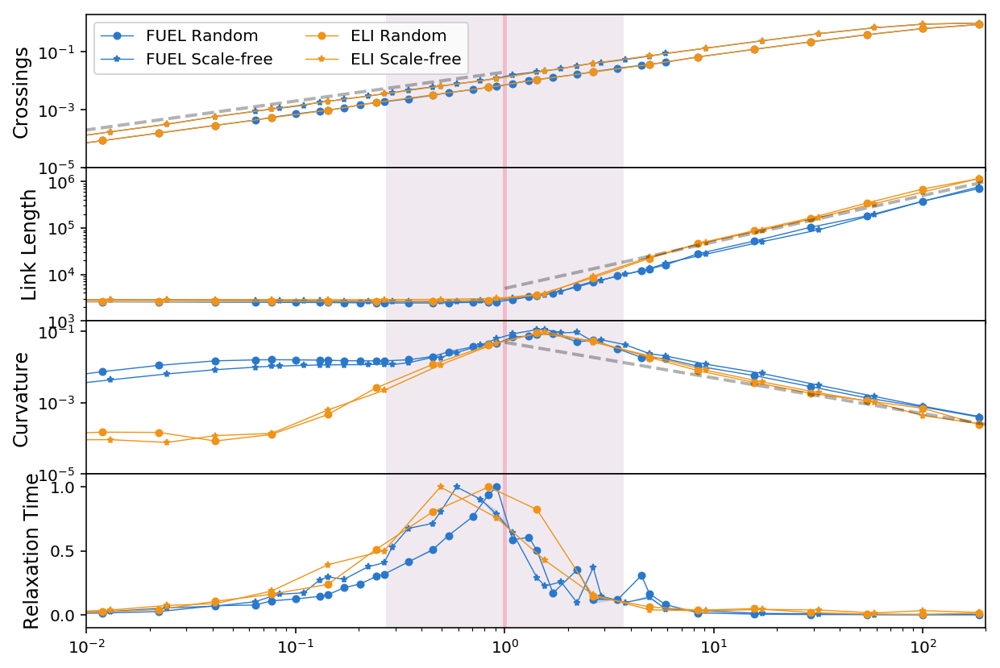

In [151]:

nn = 130#130#55
n1 = 4
fs = 12
x = logspace(0,3,5)
ep,h,h1 = 2e-2, 2e-1,1e-1
mx = (1.0e-2,2.0e2)
# cs = {'BA':(1,0),'ER':(.5,0),'Lat':(.2,10)}
cs = {'BA-0-n200-L397':(1,0),'ER-0-n197-L397':(.5,0),'Lat':(.2,10)}
y=array([1-ep,1+ep])
cl = ['#2a78cc','#f19317']
fig = figure(figsize=(10,7))
fig.subplots_adjust(hspace=0)

p = {'BA-0-n200-L397':'Scale-free', 'ER-0-n197-L397':'Random', 'Lat': 'Lattice'}
mk = {'BA-0-n200-L397':'*', 'ER-0-n197-L397':'o', 'Lat': '|'}

# p = {'BA':'Scale-free', 'ER':'Random', 'Lat': 'Lattice'}
# mk = {'BA':'*', 'ER':'o', 'Lat': '|'}

ms,lw =4,.7
a = .2
for k,t in stats3.items():
#     if 'L397' not in k: continue
    try:
        rc ,si = get_rc(k)
        ii=1
        kw = {'label' : 'FUEL '+p[k],'c':cl[0],'marker':mk[k],'ms':ms,'lw':lw}
        subplot(n1,1,ii);ii+=1
        crs = bin_dat1(t['th']/rc,tanh(.03*cs[k][0]*t['th']),nn,scale='')
        shade(crs[-cs[k][1]:],falpha = a,**kw)
        yscale('log')
        subplot(n1,1,ii);ii+=1
        lz = bin_dat1(t['th']/rc, t['lz'],nn)
        shade(lz,falpha = a,**kw)
        #plot(*lz.T[:2],**kw)
        subplot(n1,1,ii);ii+=1
        c = bin_dat1(t['th']/rc, t['cur'],nn, scale='')#(nn if k != 'ER' else 20))
        shade(c,falpha = a,**kw)
        #plot(*c.T[:2],**kw)
        subplot(n1,1,ii);ii+=1
        #t1 = (t['t']*t['lz']/maximum(1,t['th'])**2)
        t1 = (t['t']/t['lz']**2)#/maximum(1,t['th'])**2)
        t0 = bin_dat1(t['th']/rc, t1/t1.max(),nn, scale='')
        shade(t0,falpha = a,**kw)
        #plot(*t0.T[:2],**kw)
    except TypeError:
        continue
for k,t in stats3_fx.items():
#     if 'L397' not in k: continue
    try:
        rc ,si = get_rc(k)
        
        ii=1
        kw = {'label' : 'ELI '+p[k],'c':cl[1],'marker':mk[k],'ms':ms,'lw':lw}
        subplot(n1,1,ii);ii+=1
        crs = bin_dat1(t['th']/rc,tanh(.03*cs[k][0]*t['th']),nn,scale='')
        shade(crs[-cs[k][1]:],falpha = a,**kw)
        yscale('log')
        subplot(n1,1,ii);ii+=1
        lz = bin_dat1(t['th']/rc, t['lz'],nn)
        shade(lz,falpha = a,**kw)
        #plot(*lz.T[:2],**kw)
        subplot(n1,1,ii);ii+=1
        c = bin_dat1(t['th']/rc, t['cur'],nn, scale='')#(nn if k != 'ER' else 20))
        shade(c,falpha = a,**kw)
        #plot(*c.T[:2],**kw)
        subplot(n1,1,ii);ii+=1
        #t1 = (t['t']*t['lz']/maximum(1,t['th'])**2)
        t1 = (t['t']/t['lz']**1)#/maximum(1,t['th'])**2)
        t0 = bin_dat1(t['th']/rc, t1/t1.max(),nn, scale='')
        shade(t0,falpha = a,**kw)
        #plot(*t0.T[:2],**kw)
    except TypeError:
        continue

a = .3



x1 = logspace(-3,0,5)
ii = 1
subplot(n1,1,ii);ii+=1
fill_between(y,[5e0]*2, [.1e-4]*2, facecolor = '#ff5577', alpha = a)
plot(x1,2e-2*x1, 'k--', alpha = .3, lw=2)
trans_region('ER-0-n197-L397',y1=1e-5,y2=2e0, alpha = a/5)
trans_region('BA-0-n200-L397',y1=1e-5,y2=2e0, alpha = a/5)
ylim(1e-5,1e0)

ylabel('Crossings',fontsize=fs)
legend(ncol=2)
xscale('log')
yscale('log')
ylim(.1e-4,2e0)
xlim(*mx)
xticks([])

subplot(n1,1,ii);ii+=1
fill_between(y,[1e3]*2, [1e7]*2, facecolor = '#ff5577', alpha = a)
plot(x,5e3*x, 'k--', alpha = .3, lw=2)
trans_region('ER-0-n197-L397',y1=1e2,y2=1e8, alpha = a/5)
trans_region('BA-0-n200-L397',y1=1e2,y2=1e8, alpha = a/5)

ylabel('Link Length',fontsize=fs)
# legend(ncol=2)
xscale('log')
yscale('log')
ylim(1e3,2e6)
xlim(*mx)
xticks([])

subplot(n1,1,ii);ii+=1
fill_between(y,[2e-1]*2, [1e-5]*2, facecolor = '#ff5577', alpha = a)
plot(x,5e-2/x, 'k--', alpha = .3, lw=2)
# plot(x,8e-1/x, 'k--', alpha = .3, lw=2)
trans_region('ER-0-n197-L397',y1=1e-5,y2=2e-1, alpha = a/5)
trans_region('BA-0-n200-L397',y1=1e-5,y2=2e-1, alpha = a/5)

ylabel('Curvature',fontsize=fs)
xscale('log')
yscale('log')
# ylim(h1,5.2e2)
xlim(*mx)
xticks([])
ylim(1e-5,2e-1)

subplot(n1,1,ii);ii+=1
fill_between(y,[1.2]*2, [-1e-1]*2, facecolor = '#ff5577', alpha = a)
trans_region('ER-0-n197-L397',y1=-.1, alpha = a/5)
trans_region('BA-0-n200-L397',y1=-.1, alpha = a/5)
ylabel('Relaxation Time',fontsize=fs)
xscale('log')
# yscale('log')
ylim(-1e-1,1.1)
xlim(*mx)
# yscale('log')

In [117]:
stats4={ k: get_vars3(k,pth='../../output/phase-RGG/',ep=1) \
        for k in ['RGG2-n100-L848','RGG3-n144-L331']}

stats4_fx ={ k: get_vars3(k,fx =1,pth='../../output/phase-RGG/',ep=15.5) \
        for k in ['RGG2-n100-L848','RGG3-n144-L331']}

stats4_fx.update({ k: get_vars3(k,fx =1,pth='../../output/phase-finite-040518/',ep=15.5) \
        for k in ['ER-0-n197-L397']})


# stats2_fx ={ k: get_vars3(k,fx =1, ep=15.5) for k in ['BA', 'ER', 'Lat']}

No Files found!!
No Files found!!
../../output/phase-RGG/ 0 RGG2-n100-L848-th-r0.000159-segs15-ka629-fixed.json 1 RGG2-n100-L848-th-r0.000266-segs15-ka376-fixed.json 2 RGG2-n100-L848-th-r0.000444-segs15-ka225-fixed.json 3 RGG2-n100-L848-th-r0.00074-segs15-ka135-fixed.json 4 RGG2-n100-L848-th-r0.00123-segs15-ka81.3-fixed.json 5 RGG2-n100-L848-th-r0.00206-segs15-ka48.5-fixed.json 6 RGG2-n100-L848-th-r0.00343-segs15-ka29.2-fixed.json 7 RGG2-n100-L848-th-r0.00504-segs15-ka19.8-fixed.json 8 RGG2-n100-L848-th-r0.00573-segs15-ka17.5-fixed.json 9 RGG2-n100-L848-th-r0.00826-segs15-ka12.1-fixed.json 10 RGG2-n100-L848-th-r0.00956-segs15-ka10.5-fixed.json 11 RGG2-n100-L848-th-r0.0101-segs15-ka9.9-fixed.json 12 RGG2-n100-L848-th-r0.0135-segs15-ka7.41-fixed.json 13 RGG2-n100-L848-th-r0.0159-segs15-ka6.29-fixed.json 14 RGG2-n100-L848-th-r0.0186-segs15-ka5.38-fixed.json 15 RGG2-n100-L848-th-r0.0221-segs15-ka4.52-fixed.json 16 RGG2-n100-L848-th-r0.0343-segs15-ka2.92-fixed.json 17 RGG2-n100-L848-th-r0.0

ER-0-n197-L397 0.7726466237866269
RGG3-n144-L331 0.8443686343337155
RGG2-n100-L848 0.5722106553587182


Text(0.5,0,'$r_L/r_N$')

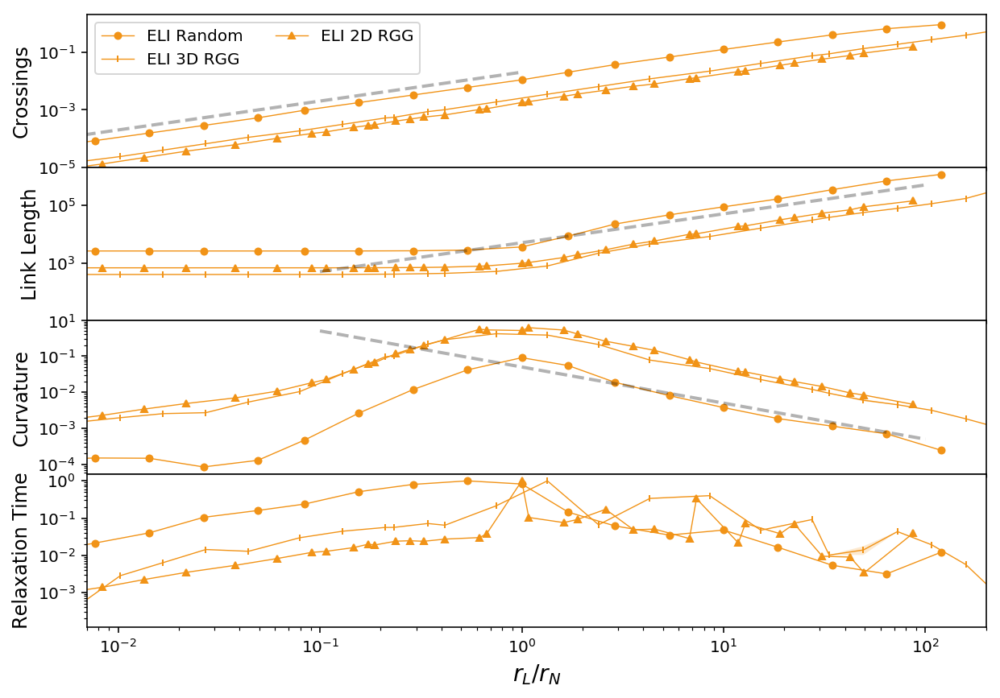

In [131]:

nn = 130#130#55
n1 = 4
fs = 12
x = logspace(-1,2,5)
ep,h,h1 = 2e-2, 2e-1,1e-1
mx = (.7e-2,2.0e2)
# cs = {'BA':(1,0),'ER':(.5,0),'Lat':(.2,10)}
cs = {'BA-0-n200-L397':(1,0),'ER-0-n197-L397':(.5,0),'Lat':(.2,10), 
      'RGG2-n100-L848':(1,0),
     'RGG3-n144-L331':(1,0)}
y=array([1-ep,1+ep])
cl = ['#2a78cc','#f19317']
fig = figure(figsize=(10,7))
fig.subplots_adjust(hspace=0)

p = {'BA-0-n200-L397':'Scale-free', 'ER-0-n197-L397':'Random', 'Lat': 'Lattice', 
     'RGG2-n100-L848':'2D RGG', 'RGG3-n144-L331':'3D RGG'}
mk = {'BA-0-n200-L397':'*', 'ER-0-n197-L397':'o', 'Lat': '|', 'RGG2-n100-L848':'^',
     'RGG3-n144-L331':'|'}

# p = {'BA':'Scale-free', 'ER':'Random', 'Lat': 'Lattice'}
# mk = {'BA':'*', 'ER':'o', 'Lat': '|'}

ms,lw =4,.7
a = .2
for k,t in stats4.items():
#     if 'L397' not in k: continue
    try:
        rc ,si = get_rc('ER-'+k)
        rc=1
        ii=1
        kw = {'label' : 'FUEL '+p[k],'c':cl[0],'marker':mk[k],'ms':ms,'lw':lw}
        subplot(n1,1,ii);ii+=1
        crs = bin_dat1(t['th']/rc,tanh(.03*cs[k][0]*t['th']),nn,scale='')
        shade(crs[-cs[k][1]:],falpha = a,**kw)
        yscale('log')
        subplot(n1,1,ii);ii+=1
        lz = bin_dat1(t['th']/rc, t['lz'],nn)
        shade(lz,falpha = a,**kw)
        #plot(*lz.T[:2],**kw)
        subplot(n1,1,ii);ii+=1
        c = bin_dat1(t['th']/rc, t['cur'],nn, scale='')#(nn if k != 'ER' else 20))
        shade(c,falpha = a,**kw)
        #plot(*c.T[:2],**kw)
        subplot(n1,1,ii);ii+=1
        #t1 = (t['t']*t['lz']/maximum(1,t['th'])**2)
        t1 = (t['t']/t['lz']**2)#/maximum(1,t['th'])**2)
        t0 = bin_dat1(t['th']/rc, t1/t1.max(),nn, scale='')
        shade(t0,falpha = a,**kw)
        #plot(*t0.T[:2],**kw)
    except TypeError:
        continue
for k,t in stats4_fx.items():
#     if 'L397' not in k: continue
    try:
        rc ,si = get_rc('ER'+k)
        print k, rc
        #rc=1
        if 'ER' not in k:
            rc/=10
        ii=1
        kw = {'label' : 'ELI '+p[k],'c':cl[1],'marker':mk[k],'ms':ms,'lw':lw}
        subplot(n1,1,ii);ii+=1
        crs = bin_dat1(t['th']/rc,tanh(.03*cs[k][0]*t['th']),nn,scale='')
        shade(crs[-cs[k][1]:],falpha = a,**kw)
        yscale('log')
        subplot(n1,1,ii);ii+=1
        lz = bin_dat1(t['th']/rc, t['lz'],nn)
        shade(lz,falpha = a,**kw)
        #plot(*lz.T[:2],**kw)
        subplot(n1,1,ii);ii+=1
        c = bin_dat1(t['th']/rc, t['cur'],nn, scale='')#(nn if k != 'ER' else 20))
        shade(c,falpha = a,**kw)
        #plot(*c.T[:2],**kw)
        subplot(n1,1,ii);ii+=1
        #t1 = (t['t']*t['lz']/maximum(1,t['th'])**2)
        t1 = (t['t']/t['lz']**1)#/maximum(1,t['th'])**2)
        t0 = bin_dat1(t['th']/rc, t1/t1.max(),nn, scale='')
        shade(t0,falpha = a,**kw)
        #plot(*t0.T[:2],**kw)
    except TypeError:
        continue

a = .3



x1 = logspace(-3,0,5)
ii = 1
subplot(n1,1,ii);ii+=1
# fill_between(y,[5e0]*2, [.1e-4]*2, facecolor = '#ff5577', alpha = a)
plot(x1,2e-2*x1, 'k--', alpha = .3, lw=2)
# trans_region('ER-0-n197-L397',y1=1e-5,y2=2e0, alpha = a/5)
# trans_region('BA-0-n200-L397',y1=1e-5,y2=2e0, alpha = a/5)
ylim(1e-5,1e0)

ylabel('Crossings',fontsize=fs)
legend(ncol=2)
xscale('log')
yscale('log')
ylim(.1e-4,2e0)
xlim(*mx)
xticks([])

subplot(n1,1,ii);ii+=1
# fill_between(y,[1e3]*2, [1e7]*2, facecolor = '#ff5577', alpha = a)
plot(x,5e3*x, 'k--', alpha = .3, lw=2)
# trans_region('ER-0-n197-L397',y1=1e2,y2=1e8, alpha = a/5)
# trans_region('BA-0-n200-L397',y1=1e2,y2=1e8, alpha = a/5)

ylabel('Link Length',fontsize=fs)
# legend(ncol=2)
xscale('log')
yscale('log')
ylim(1e1,2e6)
xlim(*mx)
xticks([])

subplot(n1,1,ii);ii+=1
# fill_between(y,[2e-1]*2, [1e-5]*2, facecolor = '#ff5577', alpha = a)
plot(x,5e-2/x, 'k--', alpha = .3, lw=2)
# plot(x,8e-1/x, 'k--', alpha = .3, lw=2)
# trans_region('ER-0-n197-L397',y1=1e-5,y2=2e-1, alpha = a/5)
# trans_region('BA-0-n200-L397',y1=1e-5,y2=2e-1, alpha = a/5)

ylabel('Curvature',fontsize=fs)
xscale('log')
yscale('log')
# ylim(h1,5.2e2)
xlim(*mx)
xticks([])
# ylim(1e-3,2e0)

subplot(n1,1,ii);ii+=1
# fill_between(y,[1.2]*2, [-1e-1]*2, facecolor = '#ff5577', alpha = a)
# trans_region(k,y1=-.1, alpha = a/5)
ylabel('Relaxation Time',fontsize=fs)
xscale('log')
# yscale('log')
# ylim(1e-1,1.2)
xlim(*mx)
yscale('log')
xlabel(r'$r_L/r_N$',fontsize=14)

'RGG2-n100-L848'

(0.01, 200.0)

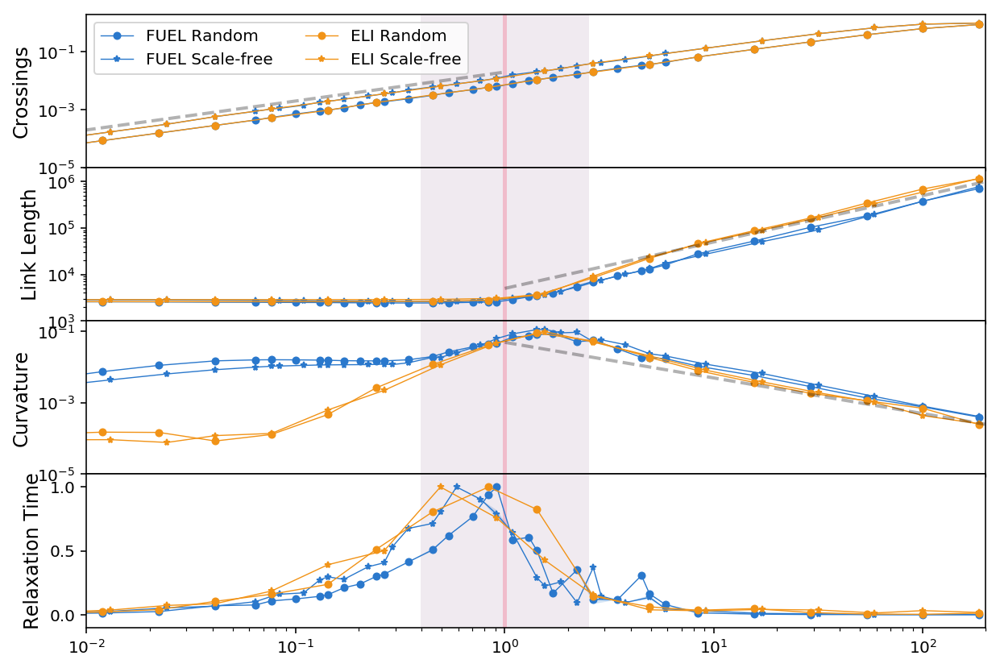

In [450]:

nn = 130#130#55
n1 = 4
fs = 12
x = logspace(0,3,5)
ep,h,h1 = 2e-2, 2e-1,1e-1
mx = (1.0e-2,2.0e2)
# cs = {'BA':(1,0),'ER':(.5,0),'Lat':(.2,10)}
cs = {'BA-0-n200-L397':(1,0),'ER-0-n197-L397':(.5,0),'Lat':(.2,10)}
y=array([1-ep,1+ep])
cl = ['#2a78cc','#f19317']
fig = figure(figsize=(10,7))
fig.subplots_adjust(hspace=0)

p = {'BA-0-n200-L397':'Scale-free', 'ER-0-n197-L397':'Random', 'Lat': 'Lattice'}
mk = {'BA-0-n200-L397':'*', 'ER-0-n197-L397':'o', 'Lat': '|'}

# p = {'BA':'Scale-free', 'ER':'Random', 'Lat': 'Lattice'}
# mk = {'BA':'*', 'ER':'o', 'Lat': '|'}

ms,lw =4,.7
a = .2
for k,t in stats3.items():
#     if 'L397' not in k: continue
    try:
        rc ,si = get_rc(k)
        ii=1
        kw = {'label' : 'FUEL '+p[k],'c':cl[0],'marker':mk[k],'ms':ms,'lw':lw}
        subplot(n1,1,ii);ii+=1
        crs = bin_dat1(t['th']/rc,tanh(.03*cs[k][0]*t['th']),nn,scale='')
        shade(crs[-cs[k][1]:],falpha = a,**kw)
        yscale('log')
        subplot(n1,1,ii);ii+=1
        lz = bin_dat1(t['th']/rc, t['lz'],nn)
        shade(lz,falpha = a,**kw)
        #plot(*lz.T[:2],**kw)
        subplot(n1,1,ii);ii+=1
        c = bin_dat1(t['th']/rc, t['cur'],nn, scale='')#(nn if k != 'ER' else 20))
        shade(c,falpha = a,**kw)
        #plot(*c.T[:2],**kw)
        subplot(n1,1,ii);ii+=1
        #t1 = (t['t']*t['lz']/maximum(1,t['th'])**2)
        t1 = (t['t']/t['lz']**2)#/maximum(1,t['th'])**2)
        t0 = bin_dat1(t['th']/rc, t1/t1.max(),nn, scale='')
        shade(t0,falpha = a,**kw)
        #plot(*t0.T[:2],**kw)
    except TypeError:
        continue
for k,t in stats3_fx.items():
#     if 'L397' not in k: continue
    try:
        rc ,si = get_rc(k)
        
        ii=1
        kw = {'label' : 'ELI '+p[k],'c':cl[1],'marker':mk[k],'ms':ms,'lw':lw}
        subplot(n1,1,ii);ii+=1
        crs = bin_dat1(t['th']/rc,tanh(.03*cs[k][0]*t['th']),nn,scale='')
        shade(crs[-cs[k][1]:],falpha = a,**kw)
        yscale('log')
        subplot(n1,1,ii);ii+=1
        lz = bin_dat1(t['th']/rc, t['lz'],nn)
        shade(lz,falpha = a,**kw)
        #plot(*lz.T[:2],**kw)
        subplot(n1,1,ii);ii+=1
        c = bin_dat1(t['th']/rc, t['cur'],nn, scale='')#(nn if k != 'ER' else 20))
        shade(c,falpha = a,**kw)
        #plot(*c.T[:2],**kw)
        subplot(n1,1,ii);ii+=1
        #t1 = (t['t']*t['lz']/maximum(1,t['th'])**2)
        t1 = (t['t']/t['lz']**1)#/maximum(1,t['th'])**2)
        t0 = bin_dat1(t['th']/rc, t1/t1.max(),nn, scale='')
        shade(t0,falpha = a,**kw)
        #plot(*t0.T[:2],**kw)
    except TypeError:
        continue

a = .3



x1 = logspace(-3,0,5)
ii = 1
subplot(n1,1,ii);ii+=1
fill_between(y,[5e0]*2, [.1e-4]*2, facecolor = '#ff5577', alpha = a)
plot(x1,2e-2*x1, 'k--', alpha = .3, lw=2)
trans_region('ER-0-n197-L397',y1=1e-5,y2=2e0, alpha = a/5)
trans_region('BA-0-n200-L397',y1=1e-5,y2=2e0, alpha = a/5)
ylim(1e-5,1e0)

ylabel('Crossings',fontsize=fs)
legend(ncol=2)
xscale('log')
yscale('log')
ylim(.1e-4,2e0)
xlim(*mx)
xticks([])

subplot(n1,1,ii);ii+=1
fill_between(y,[1e3]*2, [1e7]*2, facecolor = '#ff5577', alpha = a)
plot(x,5e3*x, 'k--', alpha = .3, lw=2)
trans_region('ER-0-n197-L397',y1=1e2,y2=1e8, alpha = a/5)
trans_region('BA-0-n200-L397',y1=1e2,y2=1e8, alpha = a/5)

ylabel('Link Length',fontsize=fs)
# legend(ncol=2)
xscale('log')
yscale('log')
ylim(1e3,2e6)
xlim(*mx)
xticks([])

subplot(n1,1,ii);ii+=1
fill_between(y,[2e-1]*2, [1e-5]*2, facecolor = '#ff5577', alpha = a)
plot(x,5e-2/x, 'k--', alpha = .3, lw=2)
# plot(x,8e-1/x, 'k--', alpha = .3, lw=2)
trans_region('ER-0-n197-L397',y1=1e-5,y2=2e-1, alpha = a/5)
trans_region('BA-0-n200-L397',y1=1e-5,y2=2e-1, alpha = a/5)

ylabel('Curvature',fontsize=fs)
xscale('log')
yscale('log')
# ylim(h1,5.2e2)
xlim(*mx)
xticks([])
ylim(1e-5,2e-1)

subplot(n1,1,ii);ii+=1
fill_between(y,[1.2]*2, [-1e-1]*2, facecolor = '#ff5577', alpha = a)
trans_region('ER-0-n197-L397',y1=-.1, alpha = a/5)
trans_region('BA-0-n200-L397',y1=-.1, alpha = a/5)
ylabel('Relaxation Time',fontsize=fs)
xscale('log')
# yscale('log')
ylim(-1e-1,1.1)
xlim(*mx)
# yscale('log')

(0.002, 200.0)

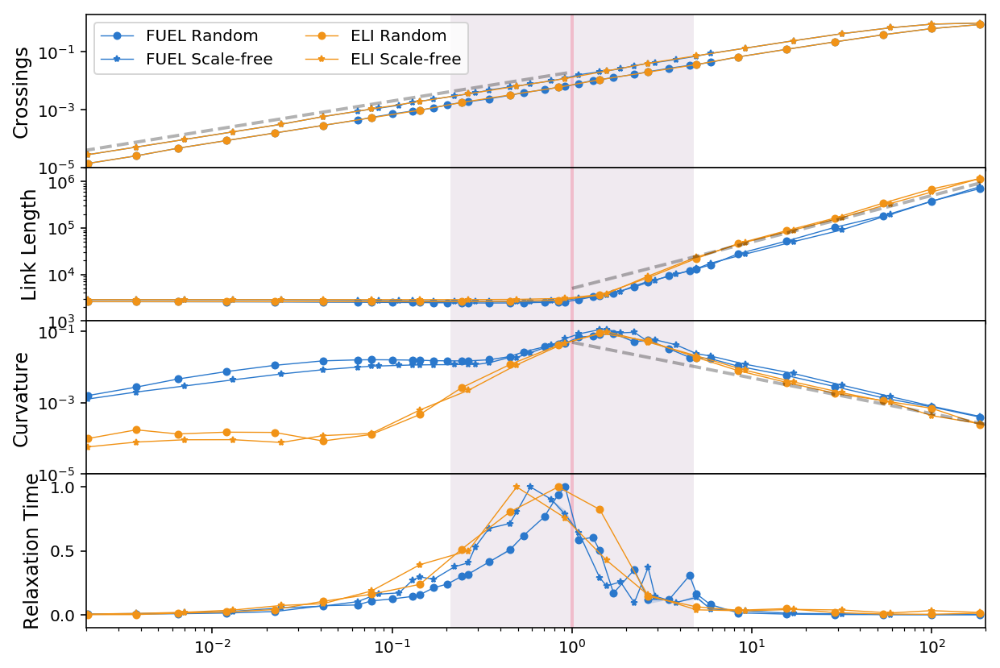

In [47]:

nn = 130#130#55
n1 = 4
fs = 12
x = logspace(0,3,5)
ep,h,h1 = 2e-2, 2e-1,1e-1
mx = (2.0e-3,2.0e2)
# cs = {'BA':(1,0),'ER':(.5,0),'Lat':(.2,10)}
cs = {'BA-0-n200-L397':(1,0),'ER-0-n197-L397':(.5,0),'Lat':(.2,10)}
y=array([1-ep,1+ep])
cl = ['#2a78cc','#f19317']
fig = figure(figsize=(10,7))
fig.subplots_adjust(hspace=0)

p = {'BA-0-n200-L397':'Scale-free', 'ER-0-n197-L397':'Random', 'Lat': 'Lattice'}
mk = {'BA-0-n200-L397':'*', 'ER-0-n197-L397':'o', 'Lat': '|'}

# p = {'BA':'Scale-free', 'ER':'Random', 'Lat': 'Lattice'}
# mk = {'BA':'*', 'ER':'o', 'Lat': '|'}

ms,lw =4,.7
a = .2
for k,t in stats3.items():
#     if 'L397' not in k: continue
    try:
        rc ,si = get_rc(k)
        ii=1
        kw = {'label' : 'FUEL '+p[k],'c':cl[0],'marker':mk[k],'ms':ms,'lw':lw}
        subplot(n1,1,ii);ii+=1
        crs = bin_dat1(t['th']/rc,tanh(.03*cs[k][0]*t['th']),nn,scale='')
        shade(crs[-cs[k][1]:],falpha = a,**kw)
        yscale('log')
        subplot(n1,1,ii);ii+=1
        lz = bin_dat1(t['th']/rc, t['lz'],nn)
        shade(lz,falpha = a,**kw)
        #plot(*lz.T[:2],**kw)
        subplot(n1,1,ii);ii+=1
        c = bin_dat1(t['th']/rc, t['cur'],nn, scale='')#(nn if k != 'ER' else 20))
        shade(c,falpha = a,**kw)
        #plot(*c.T[:2],**kw)
        subplot(n1,1,ii);ii+=1
        #t1 = (t['t']*t['lz']/maximum(1,t['th'])**2)
        t1 = (t['t']/t['lz']**2)#/maximum(1,t['th'])**2)
        t0 = bin_dat1(t['th']/rc, t1/t1.max(),nn, scale='')
        shade(t0,falpha = a,**kw)
        #plot(*t0.T[:2],**kw)
    except TypeError:
        continue
for k,t in stats3_fx.items():
#     if 'L397' not in k: continue
    try:
        rc ,si = get_rc(k)
        
        ii=1
        kw = {'label' : 'ELI '+p[k],'c':cl[1],'marker':mk[k],'ms':ms,'lw':lw}
        subplot(n1,1,ii);ii+=1
        crs = bin_dat1(t['th']/rc,tanh(.03*cs[k][0]*t['th']),nn,scale='')
        shade(crs[-cs[k][1]:],falpha = a,**kw)
        yscale('log')
        subplot(n1,1,ii);ii+=1
        lz = bin_dat1(t['th']/rc, t['lz'],nn)
        shade(lz,falpha = a,**kw)
        #plot(*lz.T[:2],**kw)
        subplot(n1,1,ii);ii+=1
        c = bin_dat1(t['th']/rc, t['cur'],nn, scale='')#(nn if k != 'ER' else 20))
        shade(c,falpha = a,**kw)
        #plot(*c.T[:2],**kw)
        subplot(n1,1,ii);ii+=1
        #t1 = (t['t']*t['lz']/maximum(1,t['th'])**2)
        t1 = (t['t']/t['lz']**1)#/maximum(1,t['th'])**2)
        t0 = bin_dat1(t['th']/rc, t1/t1.max(),nn, scale='')
        shade(t0,falpha = a,**kw)
        #plot(*t0.T[:2],**kw)
    except TypeError:
        continue

a = .3



x1 = logspace(-3,0,5)
ii = 1
subplot(n1,1,ii);ii+=1
fill_between(y,[5e0]*2, [.1e-4]*2, facecolor = '#ff5577', alpha = a)
plot(x1,2e-2*x1, 'k--', alpha = .3, lw=2)
trans_region('ER-0-n197-L397',y1=1e-5,y2=2e0, alpha = a/5)
trans_region('BA-0-n200-L397',y1=1e-5,y2=2e0, alpha = a/5)
ylim(1e-5,1e0)

ylabel('Crossings',fontsize=fs)
legend(ncol=2)
xscale('log')
yscale('log')
ylim(.1e-4,2e0)
xlim(*mx)
xticks([])

subplot(n1,1,ii);ii+=1
fill_between(y,[1e3]*2, [1e7]*2, facecolor = '#ff5577', alpha = a)
plot(x,5e3*x, 'k--', alpha = .3, lw=2)
trans_region('ER-0-n197-L397',y1=1e2,y2=1e8, alpha = a/5)
trans_region('BA-0-n200-L397',y1=1e2,y2=1e8, alpha = a/5)

ylabel('Link Length',fontsize=fs)
# legend(ncol=2)
xscale('log')
yscale('log')
ylim(1e3,2e6)
xlim(*mx)
xticks([])

subplot(n1,1,ii);ii+=1
fill_between(y,[2e-1]*2, [1e-5]*2, facecolor = '#ff5577', alpha = a)
plot(x,5e-2/x, 'k--', alpha = .3, lw=2)
# plot(x,8e-1/x, 'k--', alpha = .3, lw=2)
trans_region('ER-0-n197-L397',y1=1e-5,y2=2e-1, alpha = a/5)
trans_region('BA-0-n200-L397',y1=1e-5,y2=2e-1, alpha = a/5)

ylabel('Curvature',fontsize=fs)
xscale('log')
yscale('log')
# ylim(h1,5.2e2)
xlim(*mx)
xticks([])
ylim(1e-5,2e-1)

subplot(n1,1,ii);ii+=1
fill_between(y,[1.2]*2, [-1e-1]*2, facecolor = '#ff5577', alpha = a)
trans_region('ER-0-n197-L397',y1=-.1, alpha = a/5)
trans_region('BA-0-n200-L397',y1=-.1, alpha = a/5)
ylabel('Relaxation Time',fontsize=fs)
xscale('log')
# yscale('log')
ylim(-1e-1,1.1)
xlim(*mx)
# yscale('log')

(0.002, 200.0)

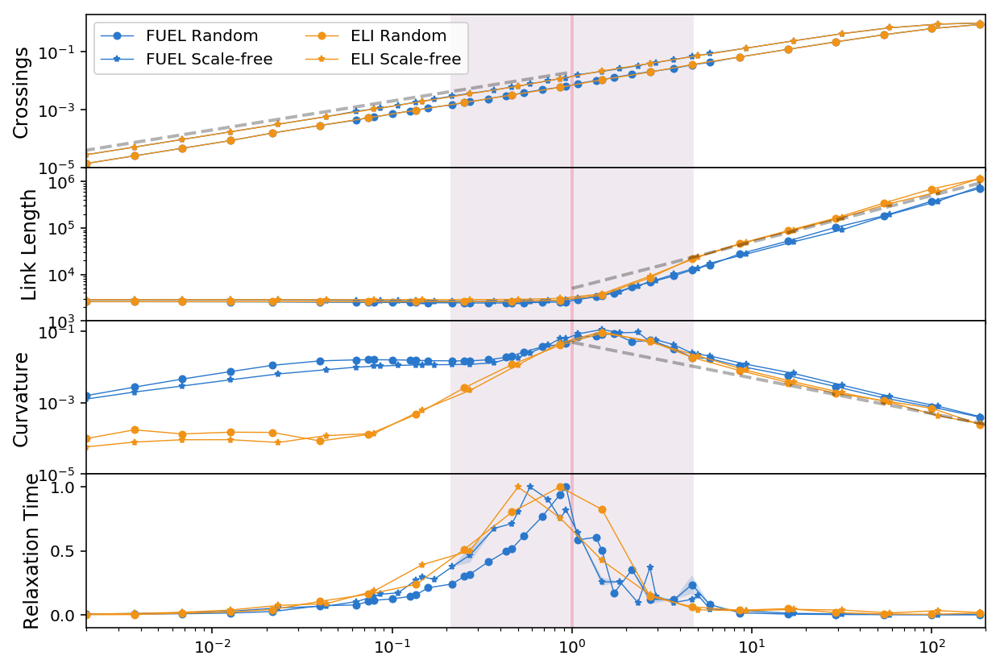

In [44]:

nn = 150#130#55
n1 = 4
fs = 12
x = logspace(0,3,5)
ep,h,h1 = 2e-2, 2e-1,1e-1
mx = (2.0e-3,2.0e2)
# cs = {'BA':(1,0),'ER':(.5,0),'Lat':(.2,10)}
cs = {'BA-0-n200-L397':(1,0),'ER-0-n197-L397':(.5,0),'Lat':(.2,10)}
y=array([1-ep,1+ep])
cl = ['#2a78cc','#f19317']
fig = figure(figsize=(10,7))
fig.subplots_adjust(hspace=0)

p = {'BA-0-n200-L397':'Scale-free', 'ER-0-n197-L397':'Random', 'Lat': 'Lattice'}
mk = {'BA-0-n200-L397':'*', 'ER-0-n197-L397':'o', 'Lat': '|'}

# p = {'BA':'Scale-free', 'ER':'Random', 'Lat': 'Lattice'}
# mk = {'BA':'*', 'ER':'o', 'Lat': '|'}

ms,lw =4,.7
a = .2
for k,t in stats3.items():
#     if 'L397' not in k: continue
    try:
        rc ,si = get_rc(k)
        ii=1
        kw = {'label' : 'FUEL '+p[k],'c':cl[0],'marker':mk[k],'ms':ms,'lw':lw}
        subplot(n1,1,ii);ii+=1
        crs = bin_dat1(t['th']/rc,tanh(.03*cs[k][0]*t['th']),nn,scale='')
        shade(crs[-cs[k][1]:],falpha = a,**kw)
        yscale('log')
        subplot(n1,1,ii);ii+=1
        lz = bin_dat1(t['th']/rc, t['lz'],nn)
        shade(lz,falpha = a,**kw)
        #plot(*lz.T[:2],**kw)
        subplot(n1,1,ii);ii+=1
        c = bin_dat1(t['th']/rc, t['cur'],nn, scale='')#(nn if k != 'ER' else 20))
        shade(c,falpha = a,**kw)
        #plot(*c.T[:2],**kw)
        subplot(n1,1,ii);ii+=1
        #t1 = (t['t']*t['lz']/maximum(1,t['th'])**2)
        t1 = (t['t']/t['lz']**2)#/maximum(1,t['th'])**2)
        t0 = bin_dat1(t['th']/rc, t1/t1.max(),nn, scale='')
        shade(t0,falpha = a,**kw)
        #plot(*t0.T[:2],**kw)
    except TypeError:
        continue
for k,t in stats3_fx.items():
#     if 'L397' not in k: continue
    try:
        rc ,si = get_rc(k)
        
        ii=1
        kw = {'label' : 'ELI '+p[k],'c':cl[1],'marker':mk[k],'ms':ms,'lw':lw}
        subplot(n1,1,ii);ii+=1
        crs = bin_dat1(t['th']/rc,tanh(.03*cs[k][0]*t['th']),nn,scale='')
        shade(crs[-cs[k][1]:],falpha = a,**kw)
        yscale('log')
        subplot(n1,1,ii);ii+=1
        lz = bin_dat1(t['th']/rc, t['lz'],nn)
        shade(lz,falpha = a,**kw)
        #plot(*lz.T[:2],**kw)
        subplot(n1,1,ii);ii+=1
        c = bin_dat1(t['th']/rc, t['cur'],nn, scale='')#(nn if k != 'ER' else 20))
        shade(c,falpha = a,**kw)
        #plot(*c.T[:2],**kw)
        subplot(n1,1,ii);ii+=1
        #t1 = (t['t']*t['lz']/maximum(1,t['th'])**2)
        t1 = (t['t']/t['lz']**1)#/maximum(1,t['th'])**2)
        t0 = bin_dat1(t['th']/rc, t1/t1.max(),nn, scale='')
        shade(t0,falpha = a,**kw)
        #plot(*t0.T[:2],**kw)
    except TypeError:
        continue

a = .3



x1 = logspace(-3,0,5)
ii = 1
subplot(n1,1,ii);ii+=1
fill_between(y,[5e0]*2, [.1e-4]*2, facecolor = '#ff5577', alpha = a)
plot(x1,2e-2*x1, 'k--', alpha = .3, lw=2)
trans_region('ER-0-n197-L397',y1=1e-5,y2=2e0, alpha = a/5,scaled=1)
trans_region('BA-0-n200-L397',y1=1e-5,y2=2e0, alpha = a/5,scaled=1)
ylim(1e-5,1e0)

ylabel('Crossings',fontsize=fs)
legend(ncol=2)
xscale('log')
yscale('log')
ylim(.1e-4,2e0)
xlim(*mx)
xticks([])

subplot(n1,1,ii);ii+=1
fill_between(y,[1e3]*2, [1e7]*2, facecolor = '#ff5577', alpha = a)
plot(x,5e3*x, 'k--', alpha = .3, lw=2)
trans_region('ER-0-n197-L397',y1=1e2,y2=1e8, alpha = a/5,scaled=1)
trans_region('BA-0-n200-L397',y1=1e2,y2=1e8, alpha = a/5,scaled=1)

ylabel('Link Length',fontsize=fs)
# legend(ncol=2)
xscale('log')
yscale('log')
ylim(1e3,2e6)
xlim(*mx)
xticks([])

subplot(n1,1,ii);ii+=1
fill_between(y,[2e-1]*2, [1e-5]*2, facecolor = '#ff5577', alpha = a)
plot(x,5e-2/x, 'k--', alpha = .3, lw=2)
# plot(x,8e-1/x, 'k--', alpha = .3, lw=2)
trans_region('ER-0-n197-L397',y1=1e-5,y2=2e-1, alpha = a/5,scaled=1)
trans_region('BA-0-n200-L397',y1=1e-5,y2=2e-1, alpha = a/5,scaled=1)

ylabel('Curvature',fontsize=fs)
xscale('log')
yscale('log')
# ylim(h1,5.2e2)
xlim(*mx)
xticks([])
ylim(1e-5,2e-1)

subplot(n1,1,ii);ii+=1
fill_between(y,[1.2]*2, [-1e-1]*2, facecolor = '#ff5577', alpha = a)
trans_region('ER-0-n197-L397',y1=-.1, alpha = a/5,scaled=1)
trans_region('BA-0-n200-L397',y1=-.1, alpha = a/5,scaled=1)
ylabel('Relaxation Time',fontsize=fs)
xscale('log')
# yscale('log')
ylim(-1e-1,1.1)
xlim(*mx)
# yscale('log')

In [ ]:
rc ,si = get_rc(k)
si = sqrt(2)/log(s)
r0 = log(rc)


In [1172]:
k,sd(k,'n'),sd(k,'L')

('BA-0-n200-L397', 200, 397)

Lat-0-n500-L1309
1309: 0.16, 0.22, 0.1, 
Lat-0-n700-L1860
1860: 0.14, 0.21, 0.1, 
Lat-0-n600-L1580
1580: 0.15, 0.21, 0.1, 
Lat-0-n150-L359
359: 0.24, 0.28, 0.1, 
Lat-0-n400-L1030
1030: 0.17, 0.23, 0.1, 
Lat-0-n300-L760
760: 0.19, 0.24, 0.1, 


(-0.01, 3)

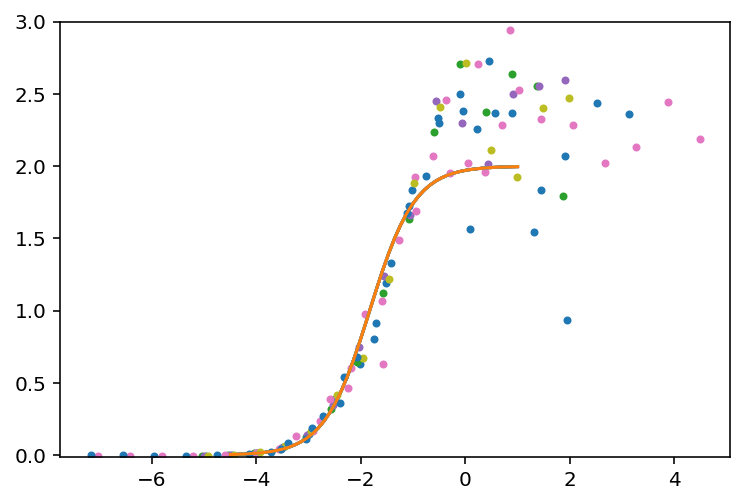

In [984]:
p = poly1d((4*sqrt(2)/2, 0, -6, sqrt(3)))
pm = p.roots.max()

for k in stats:
    if 'Lat' not in k: continue
    n,m = (sd(k,'n'),sd(k,'L') ) 
    lth = stats[k]
    gr = gradient(log(lth.T[1]))/gradient(log(lth.T[0]))
    th = lth.T[0]
    print k
    la = ceil( m/float(n))
    x = arange(1.,n)# linspace(.1, 20,150)
    # mom(x,pk(x,la))
    r_c = 2*m**(-.5)*n**(1./6)
    ar = r_c, pk(x,la) #rho_c(n,m,x), x**-3 #pk(x,la)
    m0,r0,s = mom(*ar), rs(n,m), .1 #sig(*ar)
    print ('%d: '+'%.2g, '*3) %(m, m0,r0,s)
    plot(log(th),gr, '.')
    plot(r,2*sigmoid( -log(s)*(r-log(.16))))

#     plot(r,2*sigmoid( -log(s)*(r-log(m0))))
#     show()
ylim(-0.01,3)

ER-0-n50-L1159
1159: 0.18, 0.11, 0.0037, 
ER-0-n200-L790
790: 0.33, 0.21, 0.008, 
ER-0-n197-L397
397: 0.49, 0.29, 0.06, 
ER-0-n50-L595
595: 0.25, 0.15, 0.0075, 
ER-0-n197-L397-fixed
397: 0.49, 0.29, 0.06, 


(-0.01, 3)

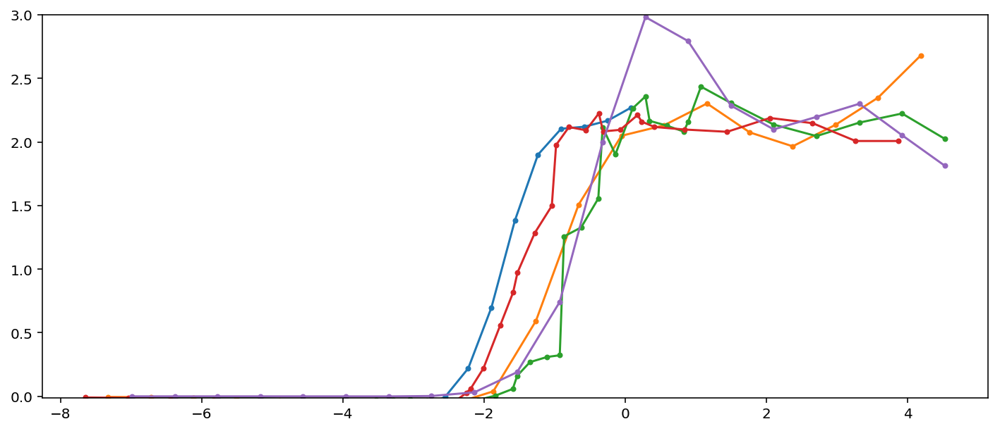

In [49]:
figure(figsize= (12,5))
r = linspace(-4,4)
for k in stats:
    if 'ER' not in k: continue
    n,m = (sd(k,'n'),sd(k,'L') ) 
    if m < 200: continue
    lth = stats[k]
    gr = gradient(log(lth.T[1]))/gradient(log(lth.T[0]))
    th = lth.T[0]
    print k
    la = ceil( m/float(n))
    x = arange(1.,n)# linspace(.1, 20,150)
    ar = 1/rho_c(n,m,x),pk(x,la)
    m0,r0,s = mom(*ar), rs(n,m), sig(*ar)
    print ('%d: '+'%.2g, '*3) %(m, m0,r0,s)
    plot(log(th/1.),gr, '.-')
#     plot(r,2*sigmoid( -log(s)*(r-log(m0))))
#     show()
ylim(-0.01,3)

ER-0-n50-L1159
1159: 0.18, 0.11, 0.0037, 
ER-0-n200-L790
790: 0.33, 0.21, 0.008, 
ER-0-n197-L397
397: 0.49, 0.29, 0.06, 
ER-0-n50-L595
595: 0.25, 0.15, 0.0075, 
ER-0-n197-L397-fixed
397: 0.49, 0.29, 0.06, 


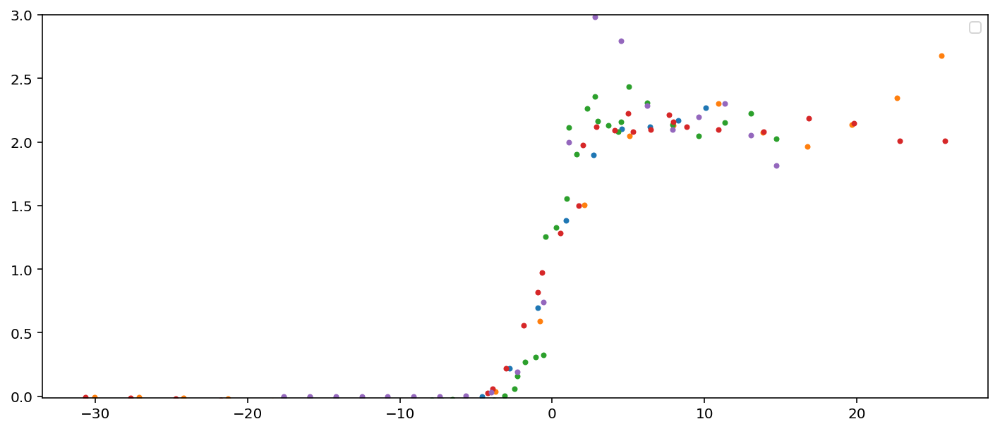

In [87]:
figure(figsize= (12,5))
r = linspace(-4,4)
for k in stats:
    if 'ER' not in k: continue
    n,m = (sd(k,'n'),sd(k,'L') ) 
    if m < 200: continue
    lth = stats[k]
    gr = gradient(log(lth.T[1]))/gradient(log(lth.T[0]))
    th = lth.T[0]
    print k
    la = ceil( m/float(n))
    x = arange(1.,n)# linspace(.1, 20,150)
    ar = 1/rho_c(n,m,x),pk(x,la)
    m0,r0,s = mom(*ar), rs(n,m), sig(*ar)
    print ('%d: '+'%.2g, '*3) %(m, m0,r0,s)
#     plot(log(th/m0),gr, '.-',label = k)
#     plot(r,2*sigmoid( -log(s)*(r-log(m0))))
    r1 = log(th)
    #plot(-(r1-log(m0))*log(s),2*sigmoid( -log(s)*(r1-log(m0))))
    plot(-(r1-log(m0))*log(s),gr,'.')
#     show()
ylim(-0.01,3)
legend()

BA-0-n100-L197
197: 0.53, 0.33, 0.087, 
BA-0-n50-L1159
1159: 0.17, 0.11, 0.00057, 
BA-0-n50-L595
595: 0.23, 0.15, 0.0068, 
BA-0-n200-L397-fixed
397: 0.47, 0.29, 0.062, 
BA-0-n200-L397
397: 0.47, 0.29, 0.062, 
BA-0-n200-L790
790: 0.33, 0.21, 0.022, 
BA-0-n50-L97
97: 0.61, 0.37, 0.13, 
BA-0-n50-L97-fixed
97: 0.61, 0.37, 0.13, 
BA-0-n100-L197-fixed
197: 0.53, 0.33, 0.087, 


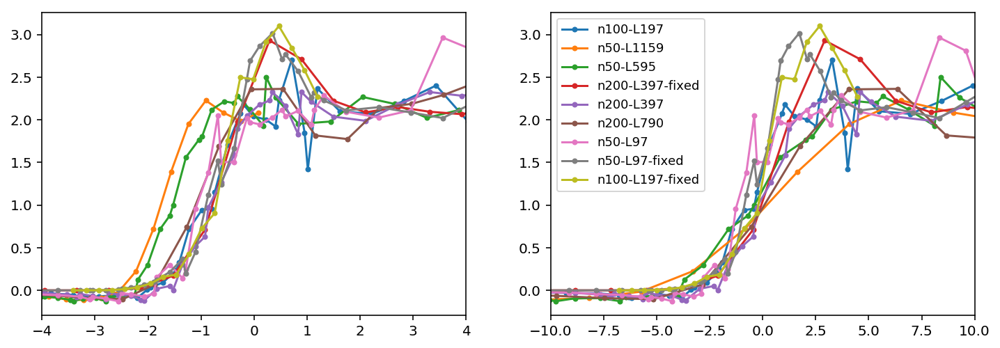

In [107]:
r = linspace(-10,10)
figure(figsize=(12,4))
for k in stats:
    if 'BA' not in k: continue
    n,m = (sd(k,'n'),sd(k,'L') ) 
    lth = stats[k]
    gr = gradient(log(lth.T[1]))/gradient(log(lth.T[0]/r_c))
    th = lth.T[0]
    print k
    la = m/n
    x = arange(1.,n)# linspace(.1, 20,150)
    # mom(x,pk(x,la))
    ar = 1/rho_c(n,m,x), x**-3 #pk(x,la)
    m0,r0,s = mom(*ar), rs(n,m), sig(*ar)
    print ('%d: '+'%.2g, '*3) %(m, m0,r0,s)
    r1 = log(th)
    subplot(121)
    plot(r1,gr,'.-')
    subplot(122)
    #plot(-(r1-log(m0))*log(s),2*sigmoid( -log(s)*(r1-log(m0))))
    plot(-(r1-log(m0))*log(s),gr,'.-',label = k[5:])
#     show()
#ylim(-0.01,3)

subplot(121)
xlim(-4,4)
subplot(122)
xlim(-10,10)
# plot(r,erf(r/2)+1, 'k--', lw = 2)
legend(fontsize=9)

(-3, 1)

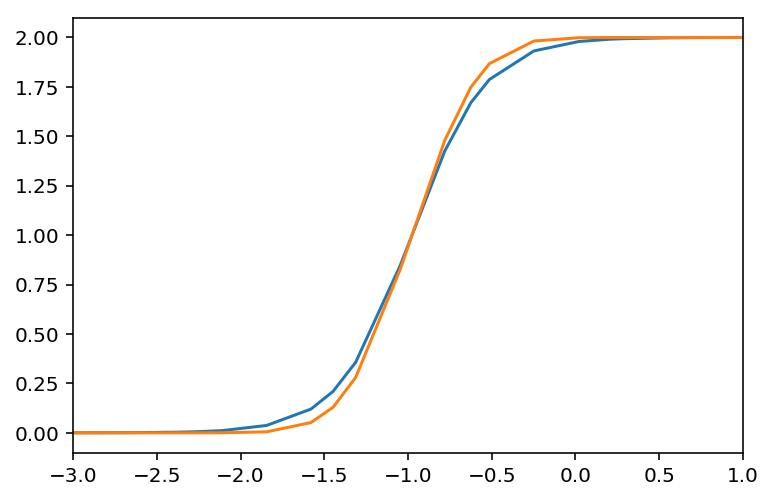

In [147]:
r1 = log(th)
plot(r1,2*sigmoid( -log(s)*(r1-log(m0))))
plot(r1,1*(erf(-(r1-log(m0))*(log(s)/2) )+1))
xlim(-3,1)

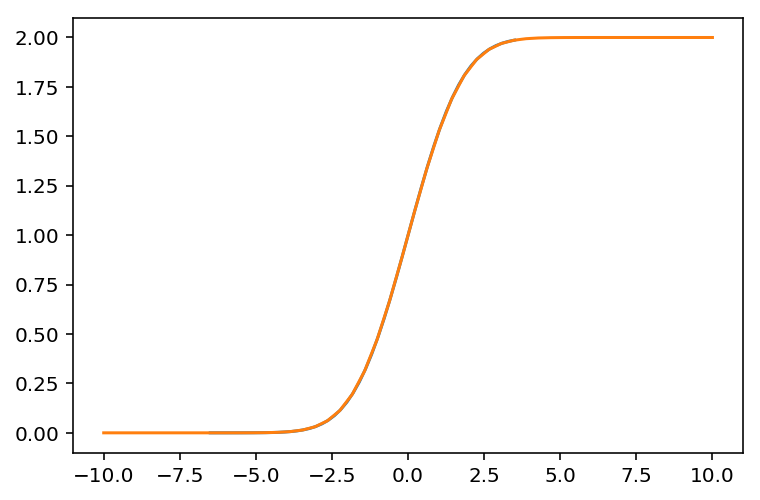

In [80]:
r = linspace(-10,10)
x0,s0 = 3., 2.
plot((r-x0)/s0,erf((r-x0)/(2*s0))+1)
plot(r, erf(r/2)+1)
# plot(r,2*sigmoid(r))

0.060378312311551316

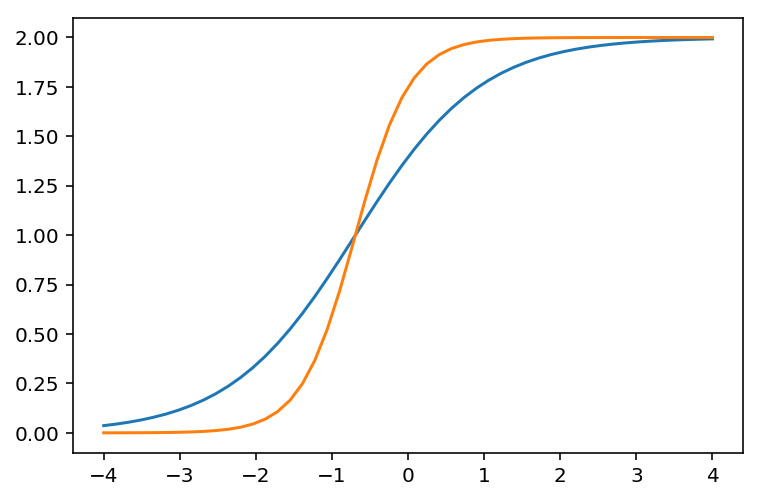

In [62]:
a1 = 2*sigmoid( -log(.3)*(r-log(.5)))
a2 = 2*sigmoid( -log(s)*(r-log(.5)))
plot(r,a1)
plot(r,a2)



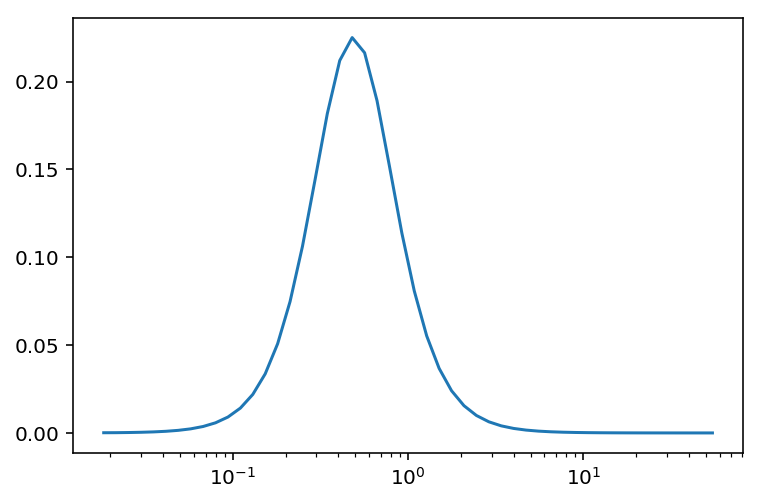

In [1042]:
y = 2*sigmoid( -log(s)*(r-log(m0)))
plot(exp(r),gradient(y))
xscale('log')

In [1050]:
log(s)

-2.807125306211154

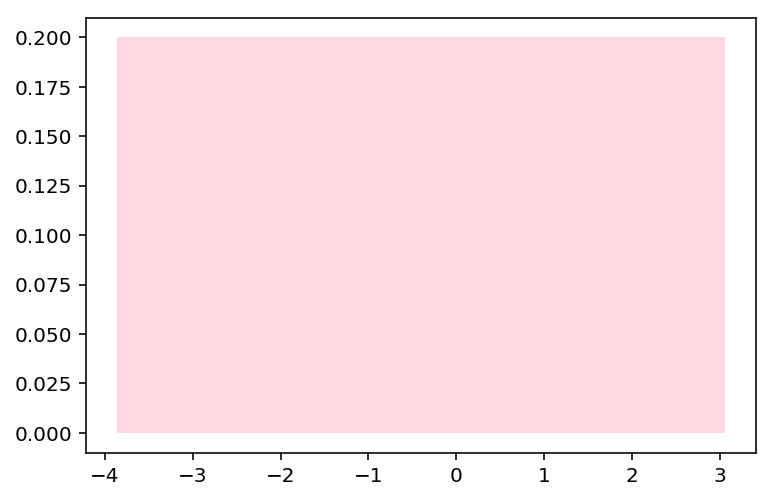

In [1069]:
fill_between([log(m0/s**2),log(m0*s**2)], [0]*2, [.2]*2, alpha = .6, facecolor='pink')

In [1100]:
m0-s,s

(0.4917124701206855, 0.1769985052374024)

ER-0-n97-L197-fixed


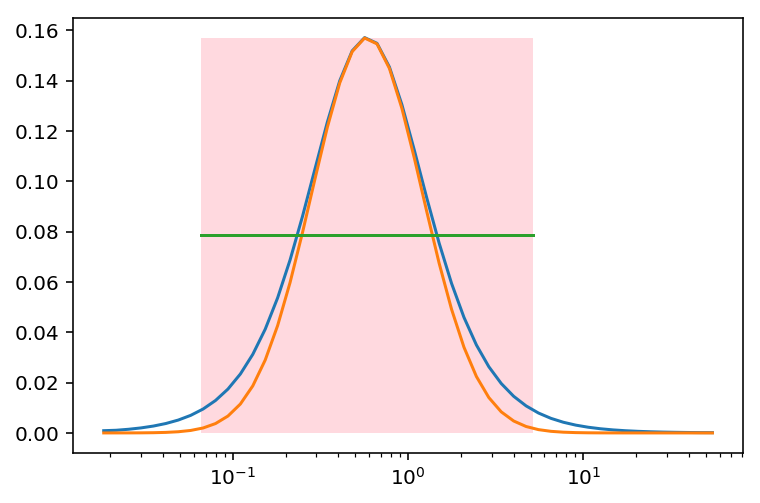

ER-0-n50-L1159


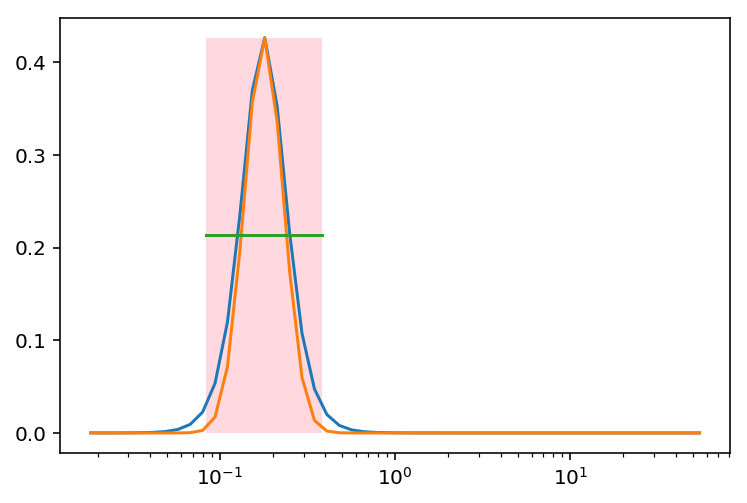

ER-0-n200-L790


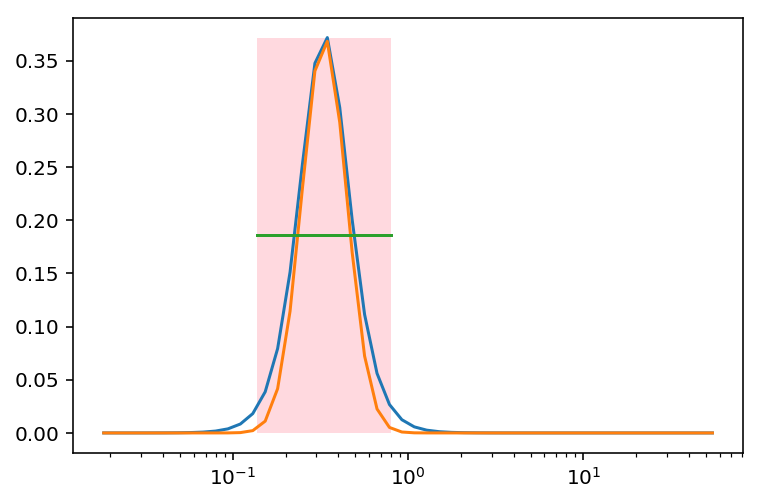

ER-0-n197-L397


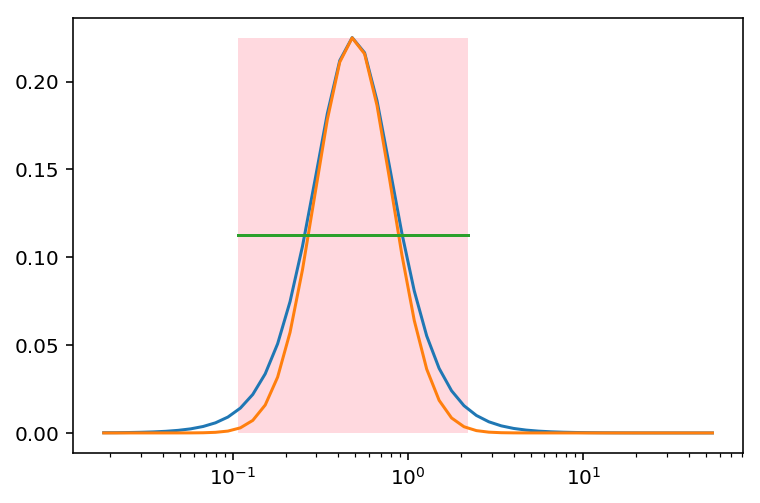

ER-0-n50-L595


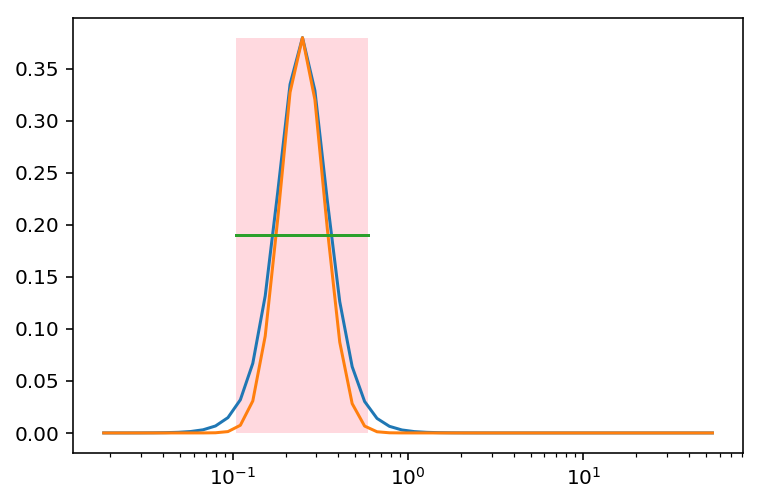

ER-0-n197-L397-fixed


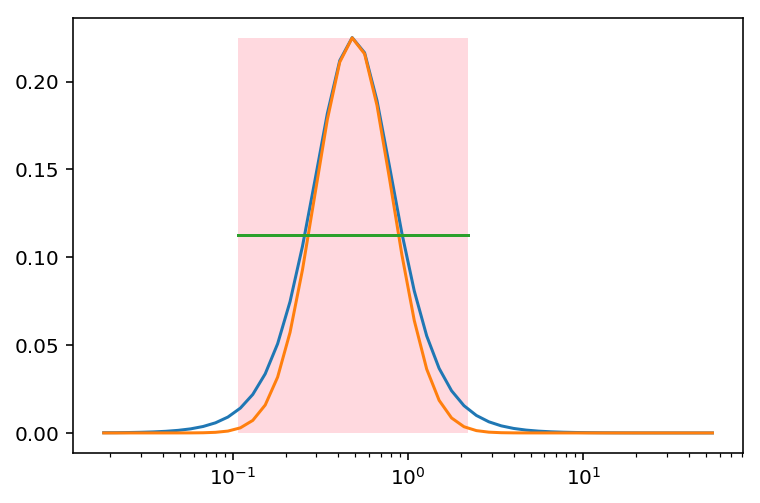

ER-0-n97-L197


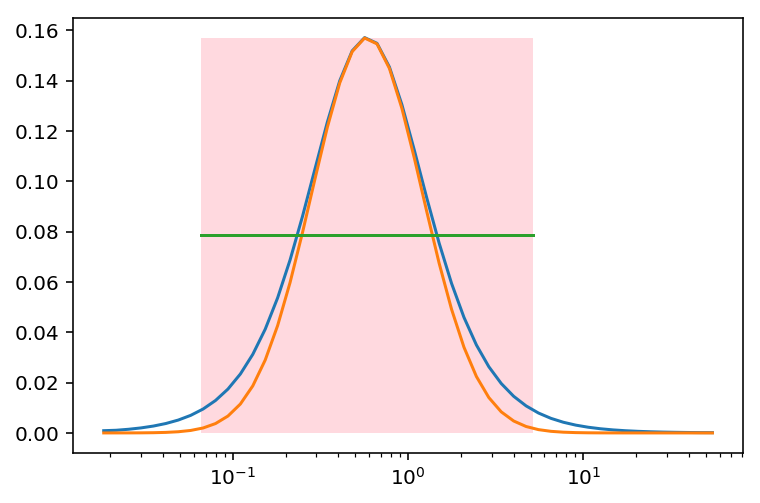

ER-0-n50-L97


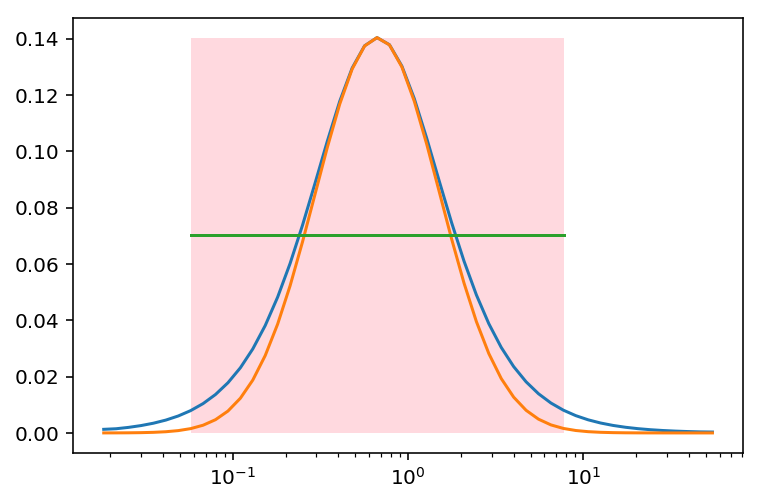

ER-0-n50-L97-fixed


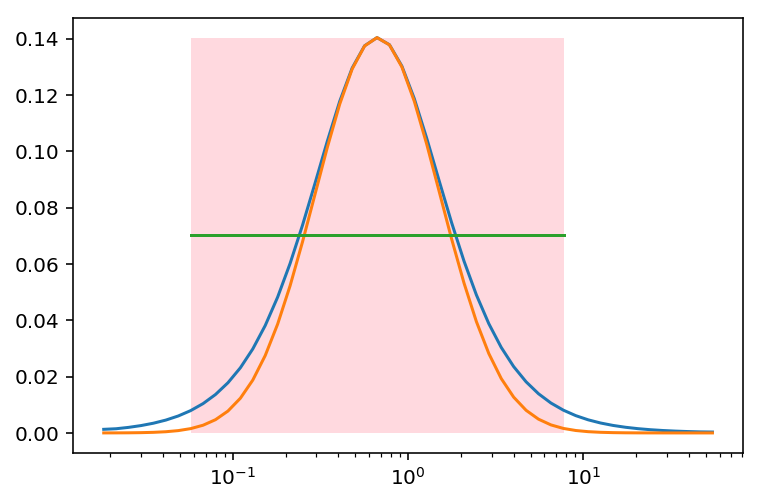

In [1124]:
# figure(figsize= (12,5))
r = linspace(-4,4)
for k in stats:
    if 'ER' not in k: continue
    n,m = (sd(k,'n'),sd(k,'L') ) 
    lth = stats[k]
    gr = gradient(log(lth.T[1]))/gradient(log(lth.T[0]))
    th = lth.T[0]
    print k
    la = ceil( m/float(n))
    x = arange(1.,n)# linspace(.1, 20,150)
    ar = 1/rho_c(n,m,x),pk(x,la)
    m0,r0,s = mom(*ar), rs(n,m), sig(*ar)
    y = 2*sigmoid( -log(s)*(r-log(m0)))

    dy = gradient(y)
    plot(exp(r),dy)
    si = sqrt(2)/log(s)
    r0 = log(m0)
    plot(exp(r),exp(-(r-r0)**2/(2*si**2) )*dy.max())
    plot(exp([r0-3*si,r0+3*si]), [dy.max()/2]*2)
    fill_between(exp([r0-3*si,r0+3*si]), [0]*2, [dy.max()]*2, alpha = .6, facecolor='pink')

#     plot(exp(r),exp(-(r-log(m0))**2*(log(s)**2/4) )*dy.max())
    
    xscale('log')
    show()
#     break

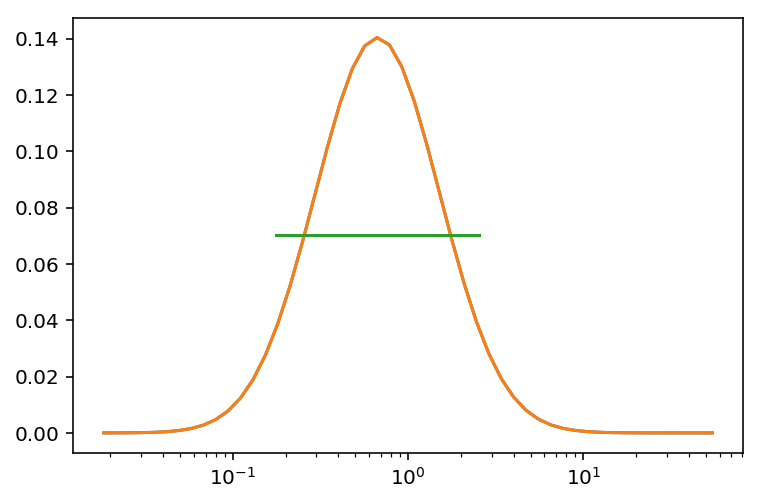

In [1116]:
si = 2/log(s)**2
r0 = log(m0)
plot(exp(r),exp(-(r-r0)**2/(2*si) )*dy.max())
plot(exp([r0-2*si,r0+2*si]), [dy.max()/2]*2)
plot(exp(r),exp(-(r-log(m0))**2*(log(s)**2/4) )*dy.max())
xscale('log')


In [1106]:
log(m0), log(m0**(-sqrt(2)/log(s)))

(-0.40240333707934534, -0.3286438315110357)

ER-0-n97-L197-fixed
197: 0.58, 0.33, 0.14, 
ER-0-n50-L1159
1159: 0.18, 0.11, 0.0037, 
ER-0-n200-L790
790: 0.33, 0.21, 0.008, 
ER-0-n197-L397
397: 0.49, 0.29, 0.06, 
ER-0-n50-L595
595: 0.25, 0.15, 0.0075, 
ER-0-n197-L397-fixed
397: 0.49, 0.29, 0.06, 
ER-0-n97-L197
197: 0.58, 0.33, 0.14, 
ER-0-n50-L97
97: 0.67, 0.37, 0.18, 
ER-0-n50-L97-fixed
97: 0.67, 0.37, 0.18, 


(-0.01, 3)

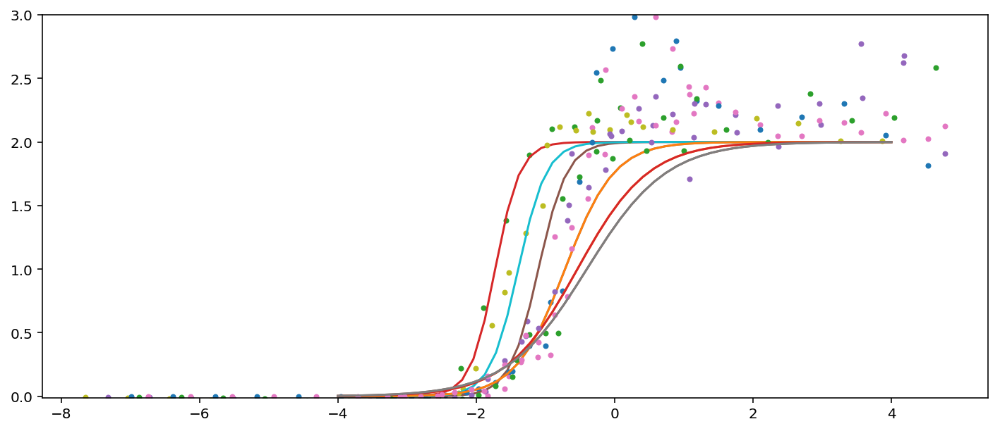

In [1006]:
figure(figsize= (12,5))
r = linspace(-4,4)
for k in stats:
    if 'ER' not in k: continue
    n,m = (sd(k,'n'),sd(k,'L') ) 
    lth = stats[k]
    gr = gradient(log(lth.T[1]))/gradient(log(lth.T[0]))
    th = lth.T[0]
    print k
    la = ceil( m/float(n))
    x = arange(1.,n)# linspace(.1, 20,150)
    ar = 1/rho_c(n,m,x),pk(x,la)
    m0,r0,s = mom(*ar), rs(n,m), sig(*ar)
    print ('%d: '+'%.2g, '*3) %(m, m0,r0,s)
    plot(log(th),gr, '.')
    plot(r,2*sigmoid( -log(s)*(r-log(m0))))
#     show()
ylim(-0.01,3)

ER-0-n50-L1159
1159: 0.18, 0.11, 0.0037, 
ER-0-n200-L790
790: 0.33, 0.21, 0.008, 
ER-0-n197-L397
397: 0.49, 0.29, 0.06, 
ER-0-n50-L595
595: 0.25, 0.15, 0.0075, 
ER-0-n197-L397-fixed
397: 0.49, 0.29, 0.06, 


(-0.01, 3)

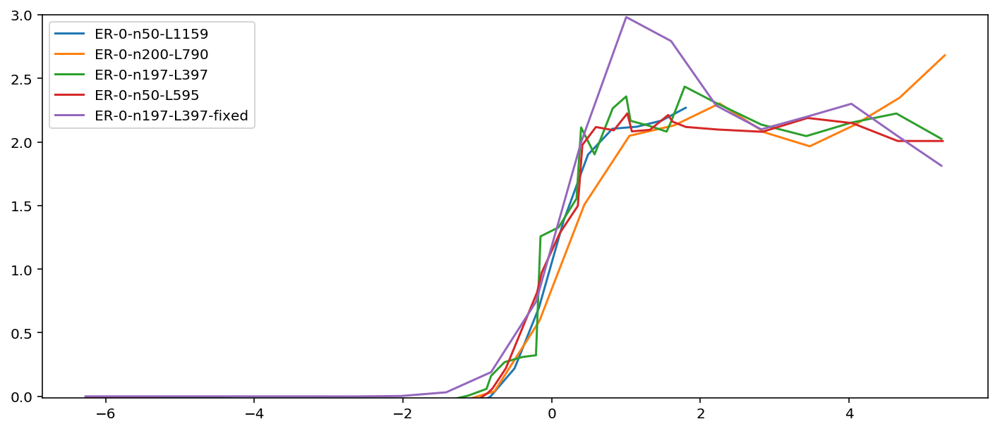

In [1023]:
figure(figsize= (12,5))
r = linspace(-4,4)
for k in stats:
    if 'ER' not in k: continue
    n,m = (sd(k,'n'),sd(k,'L') ) 
    if m < 200: continue
    lth = stats[k]
    gr = gradient(log(lth.T[1]))/gradient(log(lth.T[0]))
    th = lth.T[0]
    print k
    la = ceil( m/float(n))
    x = arange(1.,n)# linspace(.1, 20,150)
    ar = 1/rho_c(n,m,x),pk(x,la)
    m0,r0,s = mom(*ar), rs(n,m), sig(*ar)
    print ('%d: '+'%.2g, '*3) %(m, m0,r0,s)
    plot(log(th/m0),gr,label=k)
    legend()
#     plot(r,2*sigmoid( -log(s)*(r-log(m0))))
#     show()
ylim(-0.01,3)

ER-0-n97-L197-fixed
ER-0-n50-L1159
ER-0-n200-L790
ER-0-n197-L397
ER-0-n50-L595
ER-0-n197-L397-fixed
ER-0-n97-L197
ER-0-n50-L97
ER-0-n50-L97-fixed


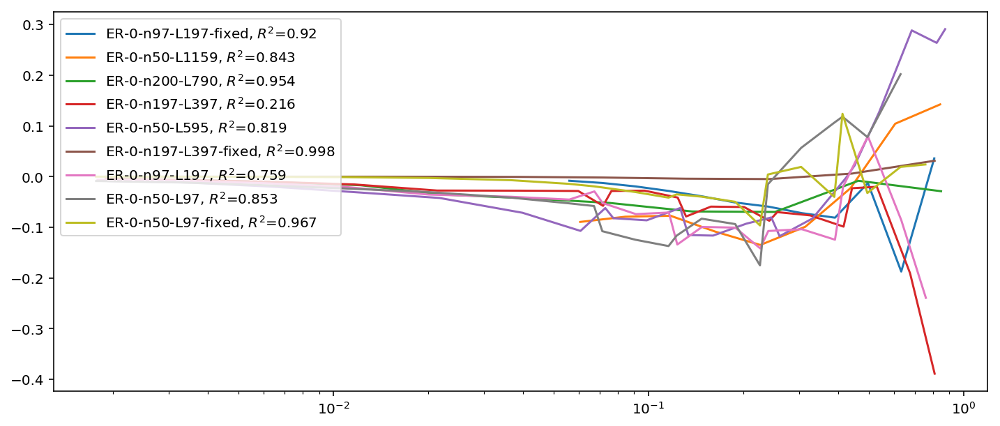

In [1032]:
figure(figsize= (12,5))
r = linspace(-4,4)
for k in stats:
    if 'ER' not in k: continue
    n,m = (sd(k,'n'),sd(k,'L') ) 
    lth = stats[k]
    gr = gradient(log(lth.T[1]))/gradient(log(lth.T[0]))
    th = lth.T[0]
    print k
    la = ceil( m/float(n))
    x = arange(1.,n)# linspace(.1, 20,150)
    ar = 1/rho_c(n,m,x),pk(x,la)
    m0,r0,s = mom(*ar), rs(n,m), sig(*ar)
#     print ('%d: '+'%.2g, '*3) %(m, m0,r0,s)
#     plot(log(th),gr, '.')
#     plot(r,2*sigmoid( -log(s)*(r-log(m0))))
#     show()
# ylim(-0.01,3)
    ix = where(gr<=1)
    r2 = 1-((gr[ix]- 2*sigmoid( -log(s)*(log(th[ix]) -log(m0))))**2).sum()/((gr[ix]-gr[ix].mean())**2).sum()
    plot(th[ix]/m0, gr[ix]-( 2*sigmoid( -log(s)*(log(th[ix]) -log(m0)))), 
         label= k+r', $R^2$'+'=%.3g' %r2) #/gr )
xscale('log')
legend()

In [1030]:
((gr[ix]-gr[ix].mean())**2).sum(), var(gr[ix])*len(gr[ix])

(1.1561606107701397, 1.1561606107701397)

In [1021]:
((gr[ix]- 2*sigmoid( -log(s)*(log(th[ix]) -log(m0))))**2).sum()/((gr[ix]-1)**2).sum(), ((gr[ix]- 1)**2).sum()/((gr[ix]-1)**2).sum()

(0.0021766896967672176, 1.0)

(-6, 6)

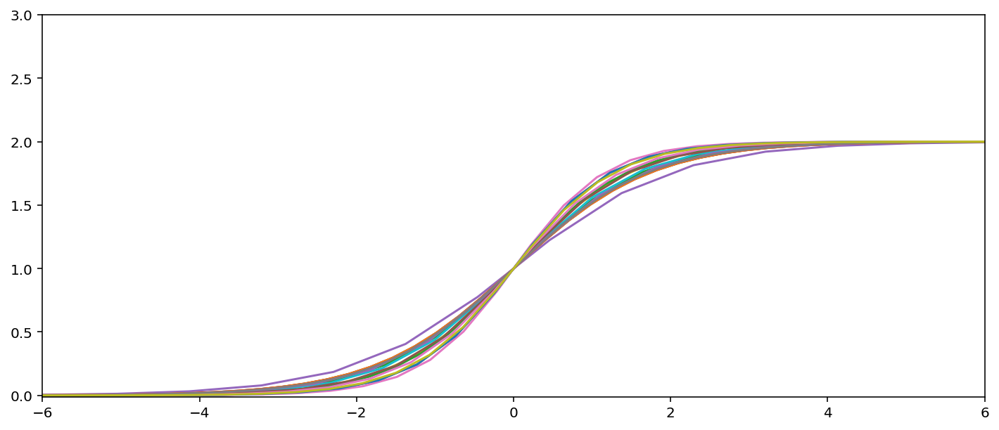

In [244]:
figure(figsize= (12,5))
r = linspace(-4,4)
for k in stats:
    if 'ER' not in k: continue
    n,m = (sd(k,'n'),sd(k,'L') ) 
    lth = stats[k]
    gr = gradient(log(lth.T[1]))/gradient(log(lth.T[0]))
    th = lth.T[0]
#     print k
    la = ceil( m/float(n))
    x = arange(1.,n)# linspace(.1, 20,150)
    ar = 1/rho_c(n,m,x),pk(x,la)
    m0,r0,s = mom(*ar), rs(n,m), sig(*ar)
#     print ('%d: '+'%.2g, '*3) %(m, m0,r0,s)
#     plot(log(th),gr, '.')
#     plot(r,2*sigmoid( -log(s)*(r-log(m0))))
    plot(r/m0,2*sigmoid( -log(s)*(r)))

#     show()
ylim(-0.01,3)
xlim(-6,6)

In [950]:
m0, r_c

(0.18770538927324235, 0.18770538927324232)

In [981]:
1/poly1d((1, 0,-6,6.**1.5/8)).roots.max()

0.4387865502262646

In [972]:
1/sqrt(8)/2, 1/sqrt(6)

(0.17677669529663687, 0.4082482904638631)

In [945]:
1*6**(-.5)*1**(1./3)

0.408248290463863

In [936]:
la

3.0

In [257]:
mc = mpl.colors.TABLEAU_COLORS

In [258]:
ci = mc.keys()#['tab:blue']


BA-0-n100-L197
197: 0.53, 0.33, 0.087, 
BA-0-n200-L397
397: 0.47, 0.29, 0.062, 
BA-0-n200-L790
790: 0.33, 0.21, 0.022, 
BA-0-n50-L1159
1159: 0.17, 0.11, 0.00057, 
BA-0-n50-L595
595: 0.23, 0.15, 0.0068, 
BA-0-n50-L949
949: 0.19, 0.12, 0.0012, 
BA-0-n50-L97
97: 0.61, 0.37, 0.13, 


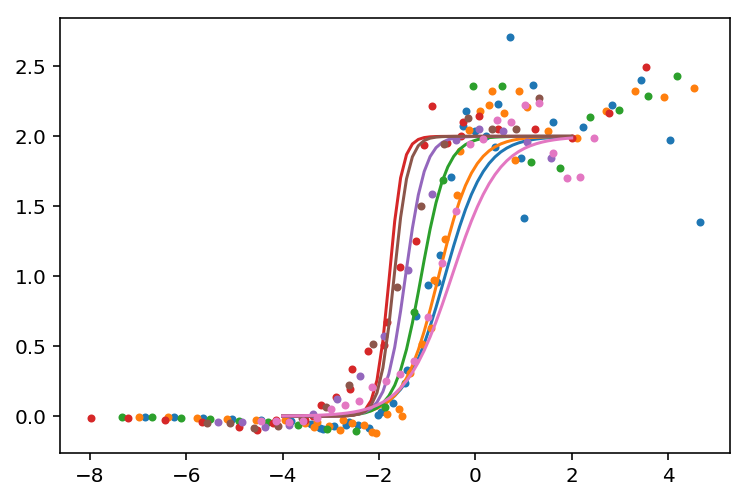

In [261]:
r = linspace(-4,2)
ii = 0
for k in sorted(stats):
    if 'BA' not in k: continue
    if 'fixed' in k: continue
#     if '197' in k: continue
    n,m = (sd(k,'n'),sd(k,'L') ) 
    lth = stats[k]
    gr = gradient(log(lth.T[1]))/gradient(log(lth.T[0]))
    th = lth.T[0]
    print k
    la = m/n*1
    x = arange(1,n)# linspace(.1, 20,150)
    # mom(x,pk(x,la))
    ar = 1/rho_c(n,m,x), x**(-3.) # pk(x,la)
    m0,r0,s = mom(*ar), rs(n,m), sig(*ar)
    print ('%d: '+'%.2g, '*3) %(m, m0,r0,s)
    plot(log(th),gr,'.',lw=.5,c=mc[ci[ii%len(ci)]])
    plot(r,2*sigmoid( -(r-log(m0))*log(s)),c=mc[ci[ii%len(ci)]])
    ii+=1
    #show()


BA-0-n100-L197
197: 0.53, 0.33, 0.087, 
BA-0-n200-L397
397: 0.47, 0.29, 0.062, 
BA-0-n200-L790
790: 0.33, 0.21, 0.022, 
BA-0-n50-L1159
1159: 0.17, 0.11, 0.00057, 
BA-0-n50-L595
595: 0.23, 0.15, 0.0068, 
BA-0-n50-L949
949: 0.19, 0.12, 0.0012, 
BA-0-n50-L97
97: 0.61, 0.37, 0.13, 


(-20, 20)

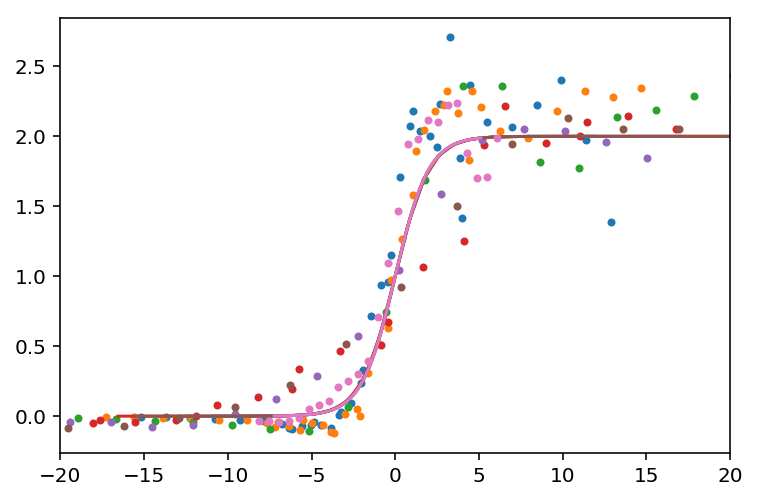

In [263]:
r = linspace(-4,2)
ii = 0
for k in sorted(stats):
    if 'BA' not in k: continue
    if 'fixed' in k: continue
#     if '197' in k: continue
    n,m = (sd(k,'n'),sd(k,'L') ) 
    lth = stats[k]
    gr = gradient(log(lth.T[1]))/gradient(log(lth.T[0]))
    th = lth.T[0]
    print k
    la = m/n*1
    x = arange(1,n)# linspace(.1, 20,150)
    # mom(x,pk(x,la))
    ar = 1/rho_c(n,m,x), x**(-3.) # pk(x,la)
    m0,r0,s = mom(*ar), rs(n,m), sig(*ar)
    print ('%d: '+'%.2g, '*3) %(m, m0,r0,s)
    plot(-(log(th)-log(m0))*log(s),gr,'.',lw=.5,c=mc[ci[ii%len(ci)]])
    plot(-(r-log(m0))*log(s),2*sigmoid( -(r-log(m0))*log(s)),c=mc[ci[ii%len(ci)]])
    ii+=1
    #show()
xlim(-20,20)

BA-0-n100-L197
197: 0.53, 0.33, 0.087, 


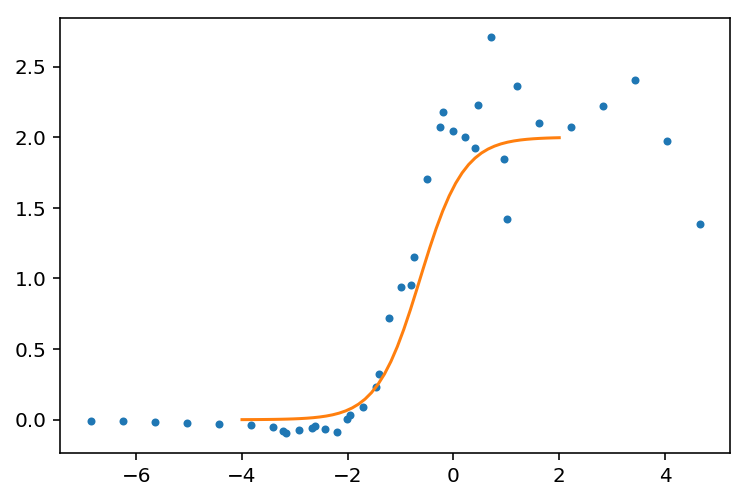

BA-0-n100-L197-fixed
197: 0.53, 0.33, 0.087, 


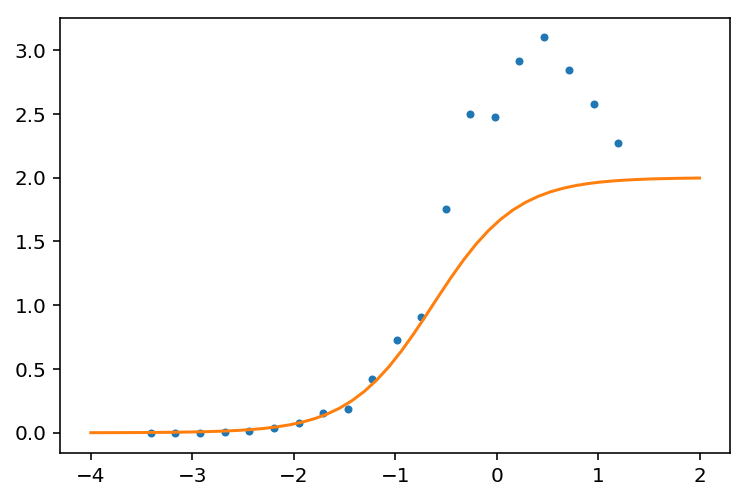

BA-0-n200-L397
397: 0.47, 0.29, 0.062, 


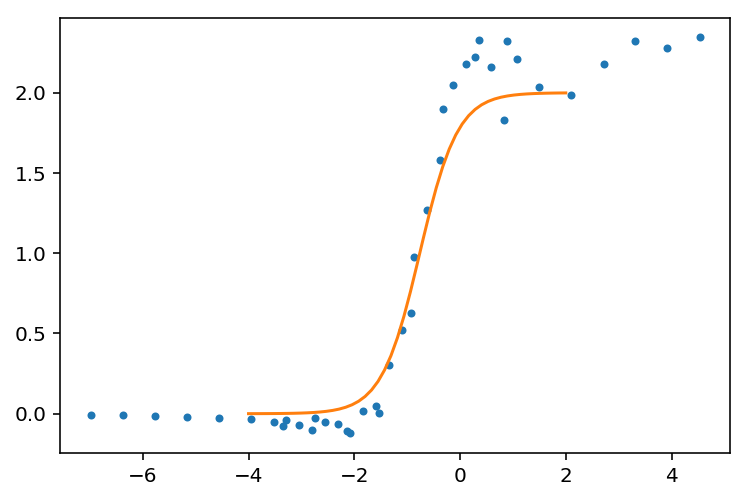

BA-0-n200-L397-fixed
397: 0.47, 0.29, 0.062, 


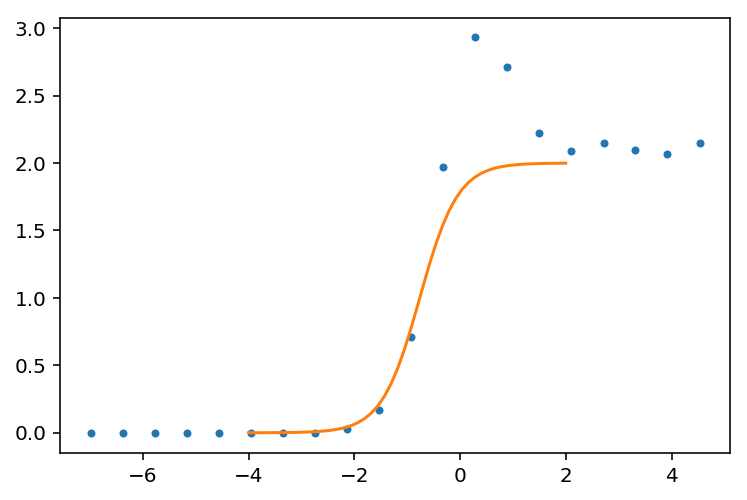

BA-0-n200-L790
790: 0.33, 0.21, 0.022, 


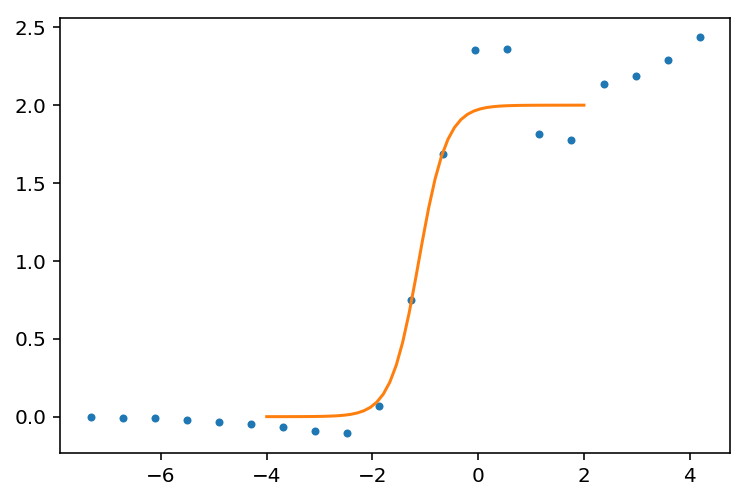

BA-0-n50-L1159
1159: 0.17, 0.11, 0.00057, 


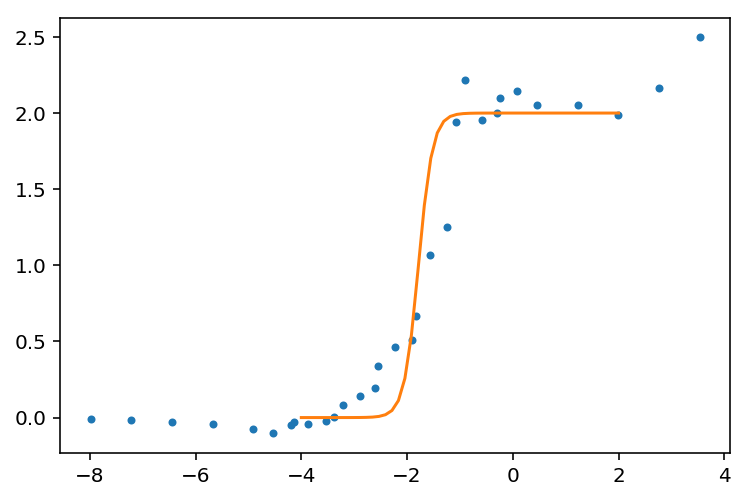

BA-0-n50-L595
595: 0.23, 0.15, 0.0068, 


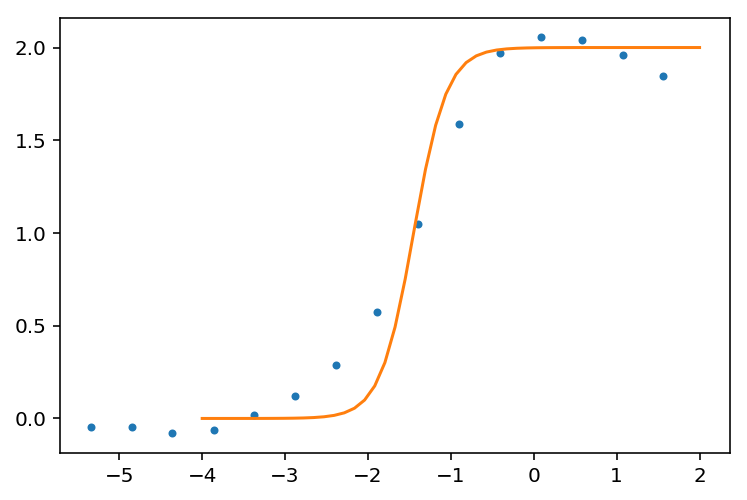

BA-0-n50-L949
949: 0.19, 0.12, 0.0012, 


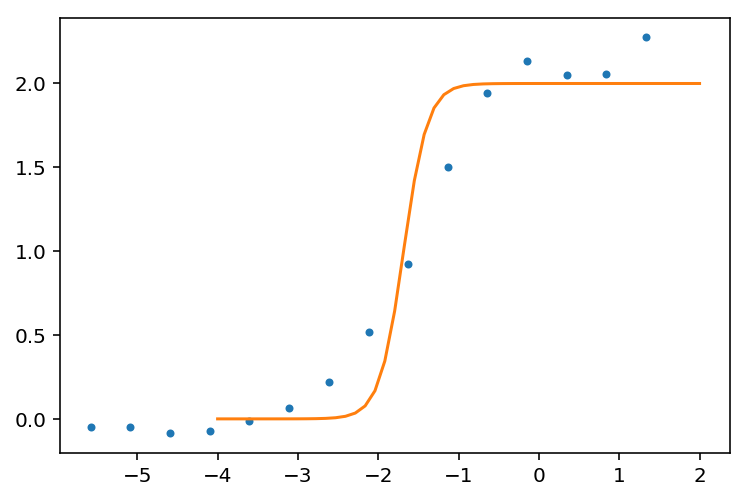

BA-0-n50-L97
97: 0.61, 0.37, 0.13, 


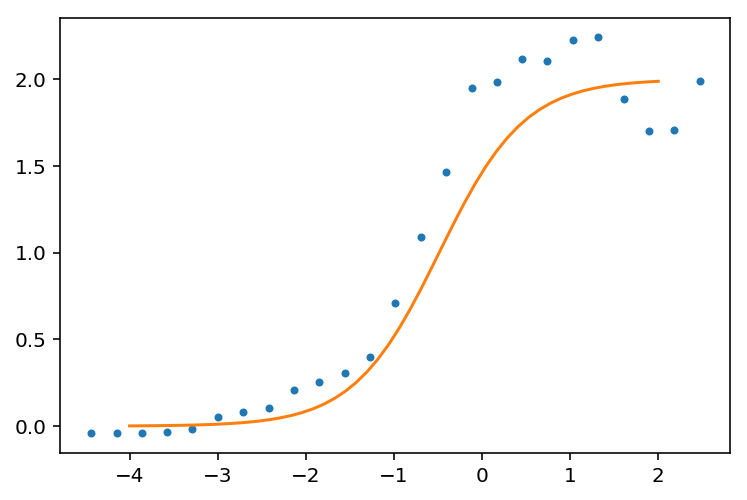

BA-0-n50-L97-fixed
97: 0.61, 0.37, 0.13, 


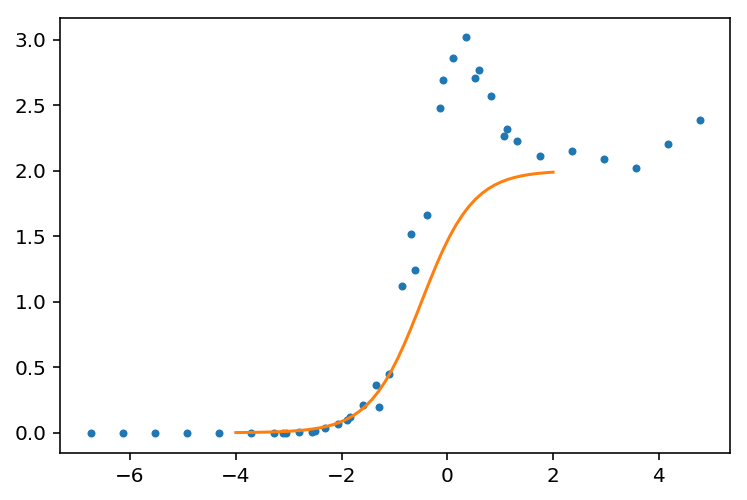

In [243]:
r = linspace(-4,2)
for k in sorted(stats):
    if 'BA' not in k: continue
#     if '197' in k: continue
    n,m = (sd(k,'n'),sd(k,'L') ) 
    lth = stats[k]
    gr = gradient(log(lth.T[1]))/gradient(log(lth.T[0]))
    th = lth.T[0]
    print k
    la = m/n*1
    x = arange(1,n)# linspace(.1, 20,150)
    # mom(x,pk(x,la))
    ar = 1/rho_c(n,m,x), x**(-3.) # pk(x,la)
    m0,r0,s = mom(*ar), rs(n,m), sig(*ar)
    print ('%d: '+'%.2g, '*3) %(m, m0,r0,s)
    plot(log(th),gr,'.',lw=.5)
    plot(r,2*sigmoid( -(r-log(m0))*log(s)))
    show()


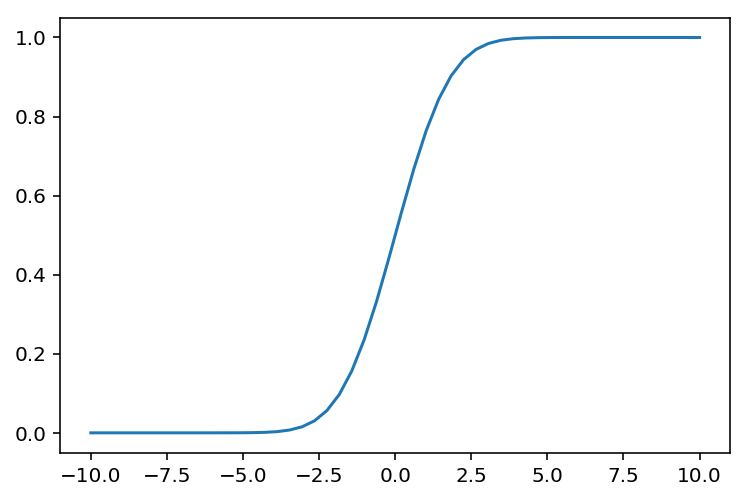

In [157]:
r = linspace(-10,10)
# plot(r, gradient(sigmoid(r))/gradient(r) +0*sigmoid(r) )
plot(r,(1+erf(r/2))/2)

BA-0-n100-L197
197: 0.53, 0.33, 0.087, 
BA-0-n200-L397
397: 0.47, 0.29, 0.062, 
BA-0-n200-L790
790: 0.33, 0.21, 0.022, 
BA-0-n50-L1159
1159: 0.17, 0.11, 0.00057, 
BA-0-n50-L595
595: 0.23, 0.15, 0.0068, 
BA-0-n50-L949
949: 0.19, 0.12, 0.0012, 
BA-0-n50-L97
97: 0.61, 0.37, 0.13, 


(-20, 20)

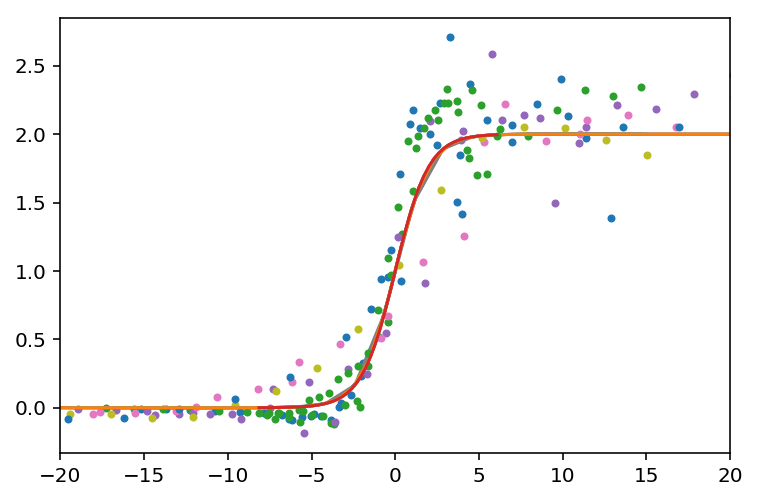

In [304]:
r = linspace(-6,6)
for k in sorted(stats):
    if 'BA' not in k: continue
#     if '197' in k: continue
    if 'fixed' in k: continue
    n,m = (sd(k,'n'),sd(k,'L') ) 
    lth = stats[k]
    gr = gradient(log(lth.T[1]))/gradient(log(lth.T[0]))
    th = lth.T[0]
    print k
    la = m/n*1
    x = arange(1,n)# linspace(.1, 20,150)
    # mom(x,pk(x,la))
    ar = 1/rho_c(n,m,x), x**(-3.) # pk(x,la)
    m0,r0,s = mom(*ar), rs(n,m), sig(*ar)
    print ('%d: '+'%.2g, '*3) %(m, m0,r0,s)
    #plot(log(th),gr,'.',lw=.5)
    #plot(r,2*sigmoid( -(r-log(m0))*log(s)))
    r1 = -(log(th)-log(m0))*log(s)
    plot( r1,gr,'.',lw=.5)
    r = linspace(min((r1)),max((r1)))
    x1 = -(r-log(m0))*log(s)
#     plot(r,2/(1+exp( -x1)))
#     plot(r, (1-erf((r-log(m0))*log(s)/2)))
    
    plot(r,2*sigmoid(r))
#     show()
xlim(-20,20)

In [138]:
min(log(th)),max(log(th))

(-6.8589651148127055, 4.653960350157523)

ER-0-n97-L197-fixed
197: 0.54, 0.33, 0.062, 


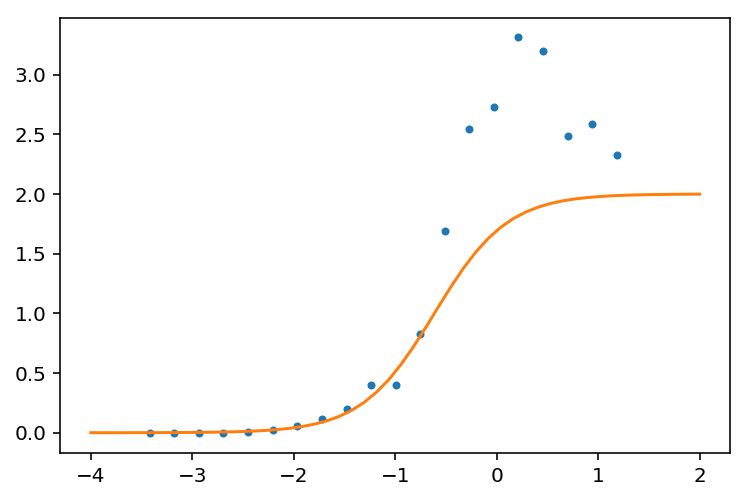

ER-1-n198-L397
397: 0.47, 0.29, 0.024, 


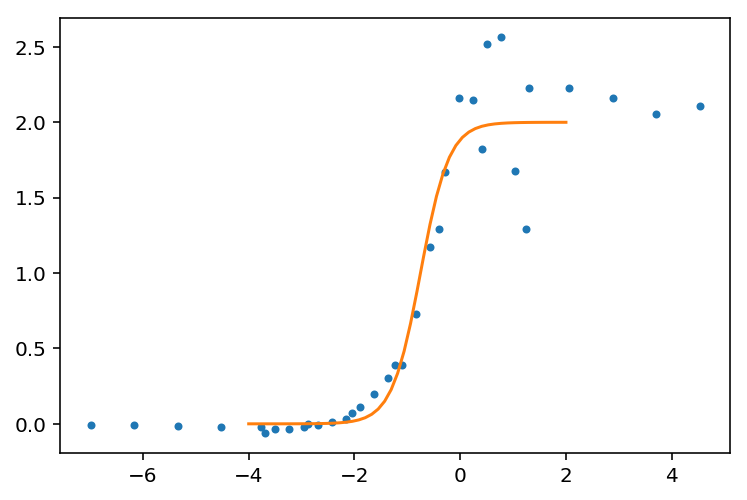

ER-0-n50-L595
595: 0.25, 0.15, 0.0065, 


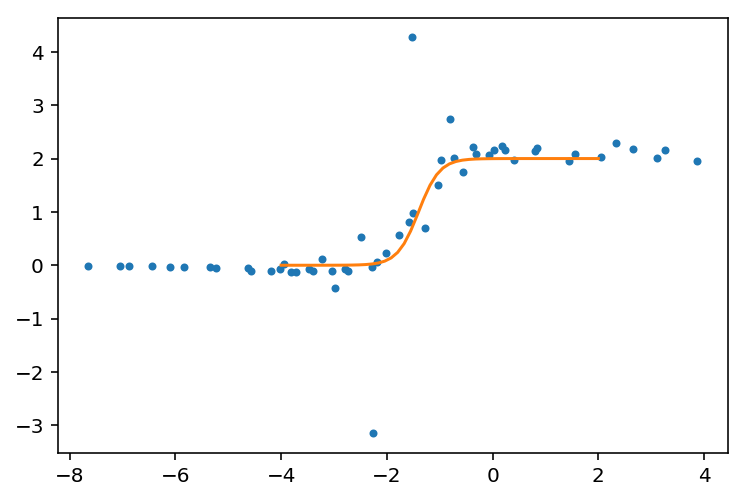

ER-1-n96-L197
197: 0.54, 0.33, 0.061, 


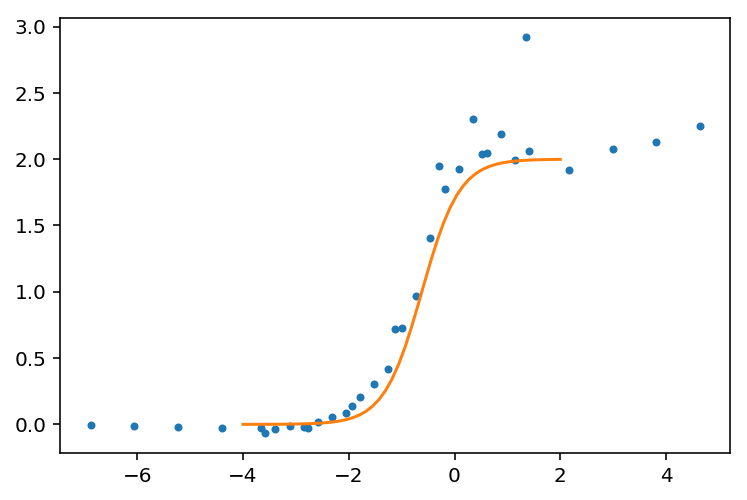

ER-0-n50-L1159
1159: 0.18, 0.11, 0.0035, 


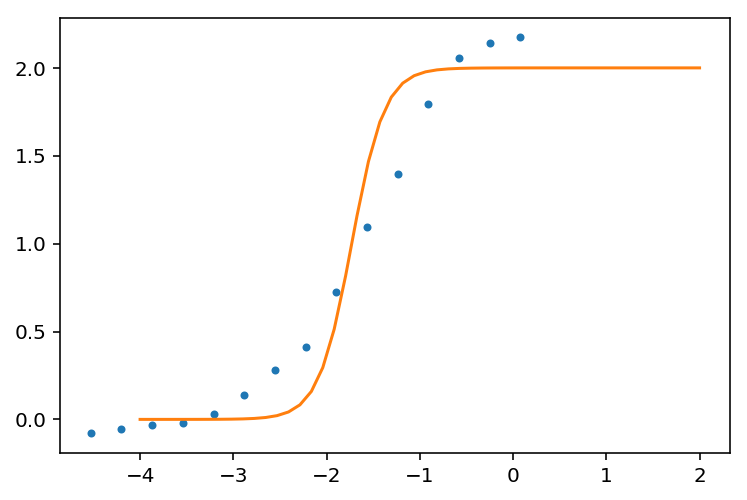

ER-0-n200-L790
790: 0.33, 0.21, 0.0056, 


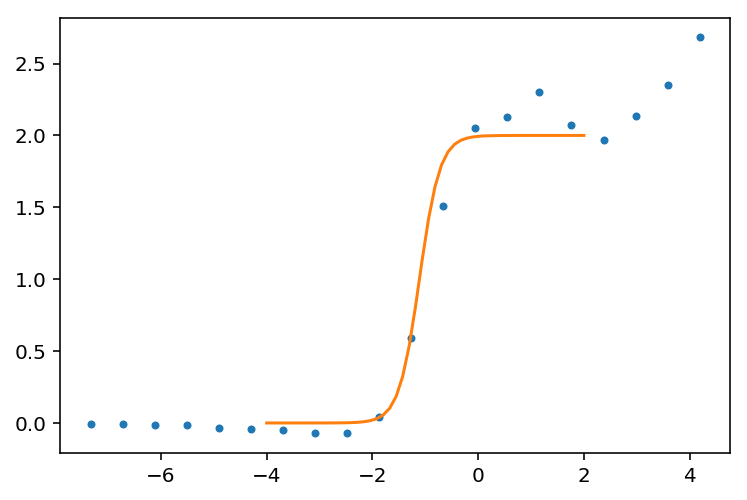

ER-1-n200-L594
594: 0.38, 0.24, 0.0069, 


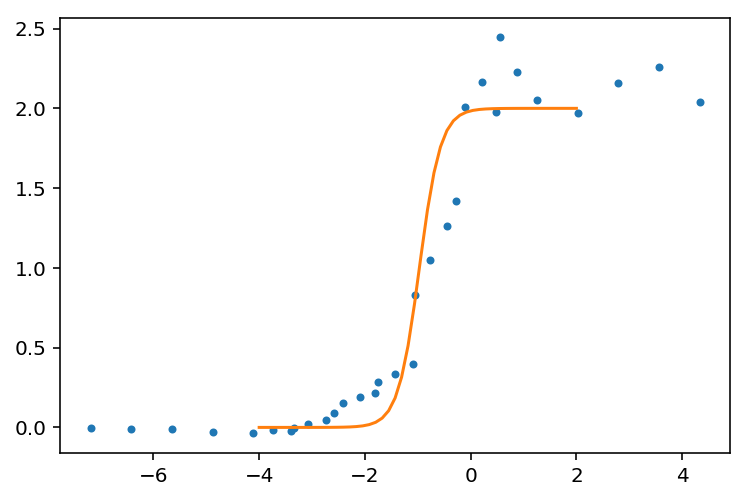

ER-0-n197-L397
397: 0.47, 0.29, 0.024, 


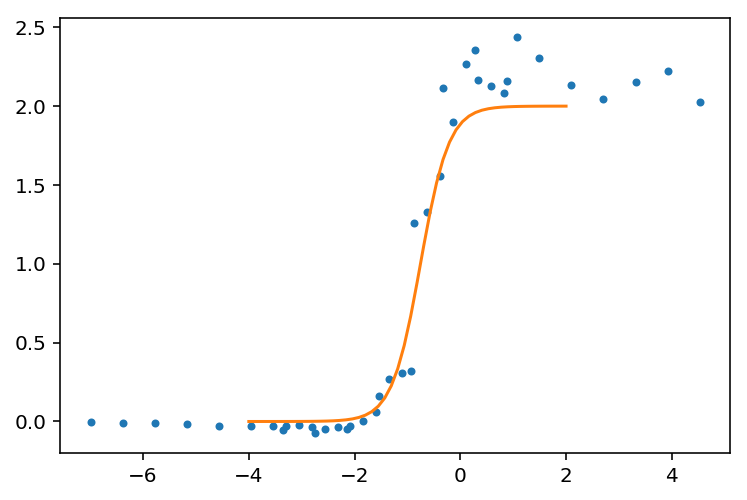

ER-0-n50-L348
348: 0.32, 0.2, 0.011, 


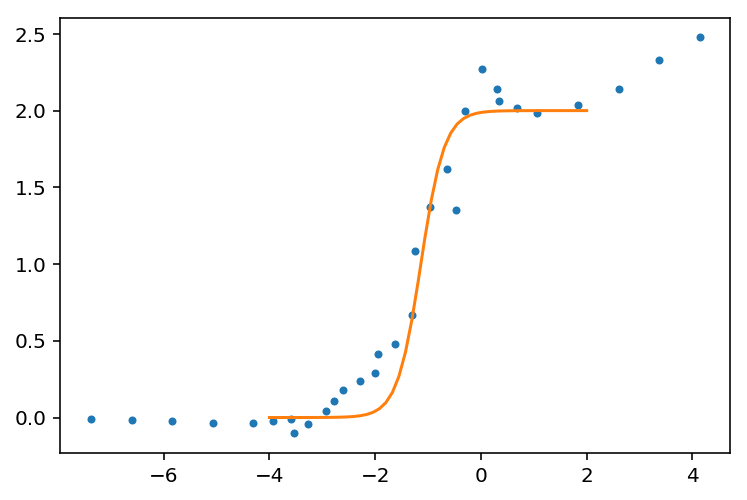

ER-1-n100-L945
945: 0.24, 0.15, 0.0048, 


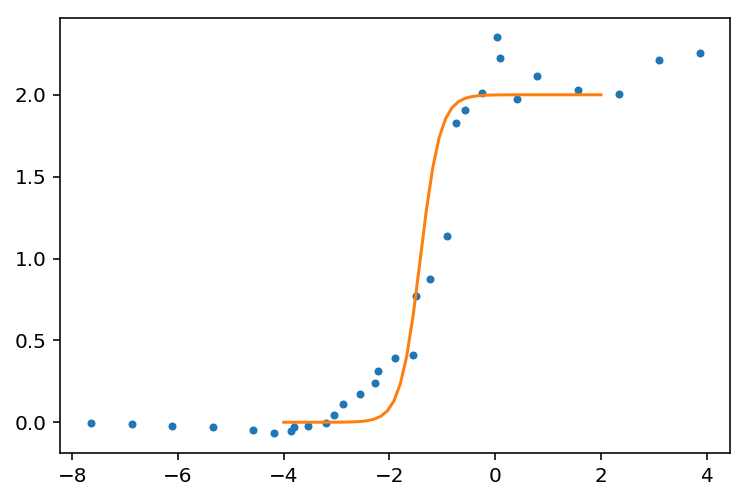

ER-1-n200-L790
790: 0.33, 0.21, 0.0056, 


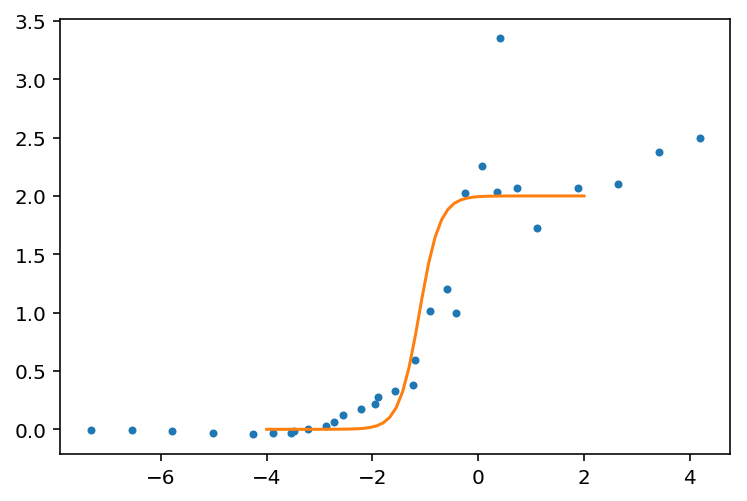

ER-0-n97-L197
197: 0.54, 0.33, 0.062, 


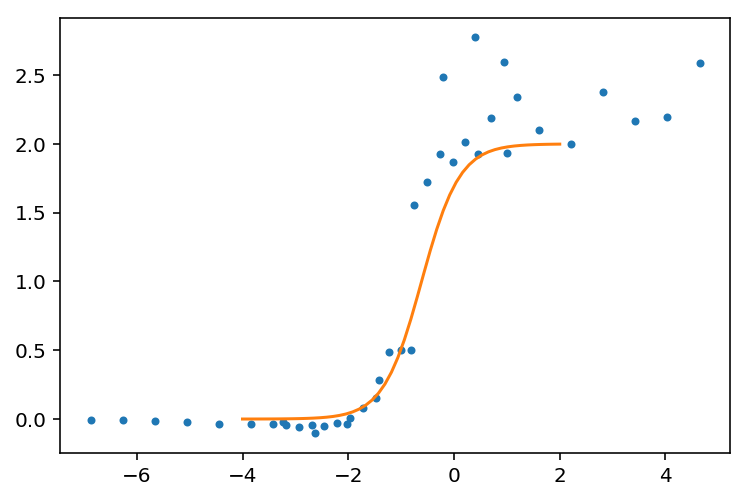

ER-0-n197-L397-fixed
397: 0.47, 0.29, 0.024, 


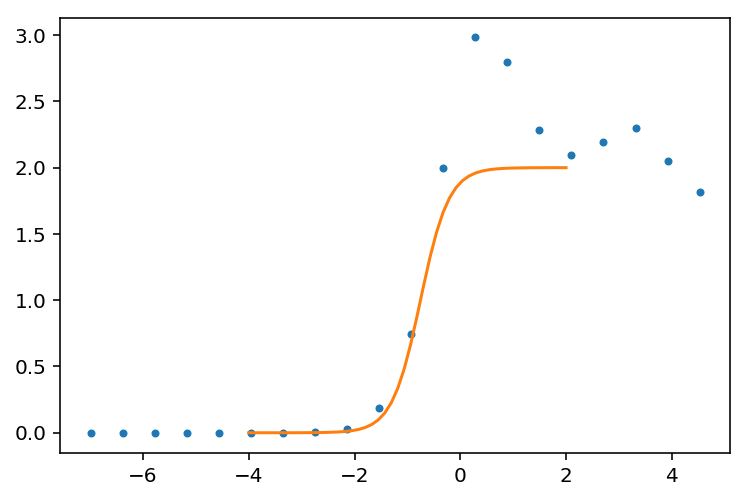

ER-0-n50-L97-fixed
97: 0.61, 0.37, 0.057, 


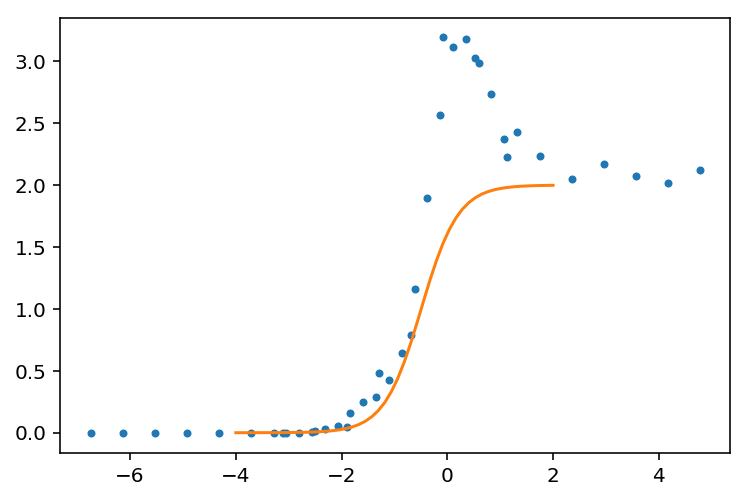

ER-1-n100-L1122
1122: 0.22, 0.14, 0.0042, 


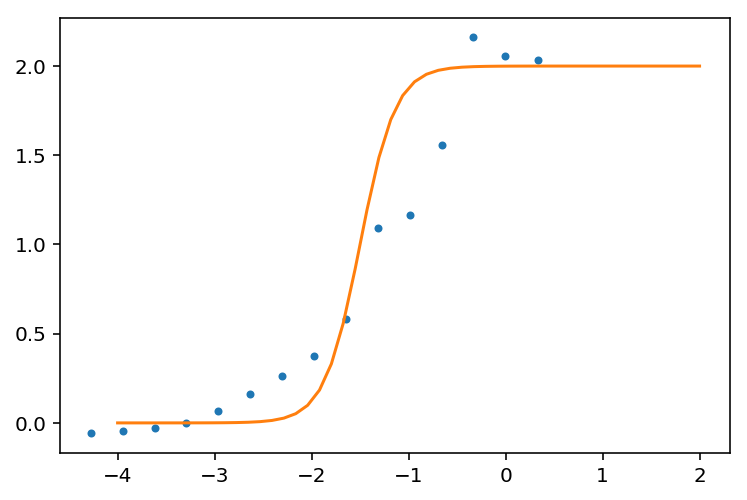

ER-1-n100-L764
764: 0.27, 0.17, 0.0058, 


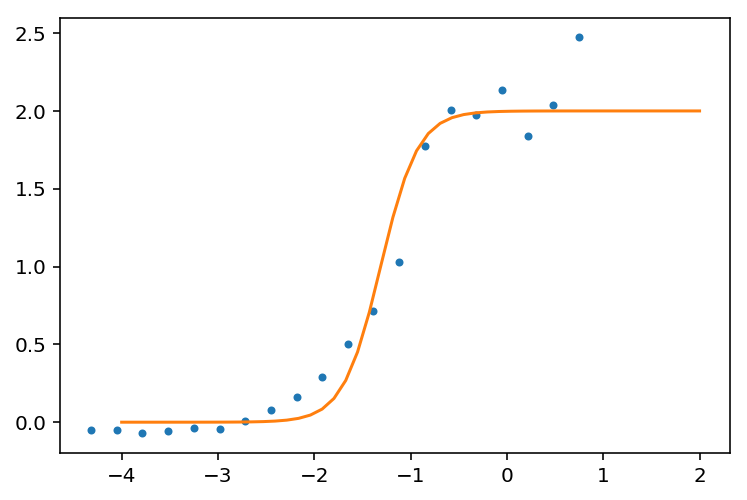

ER-1-n100-L579
579: 0.31, 0.19, 0.0074, 


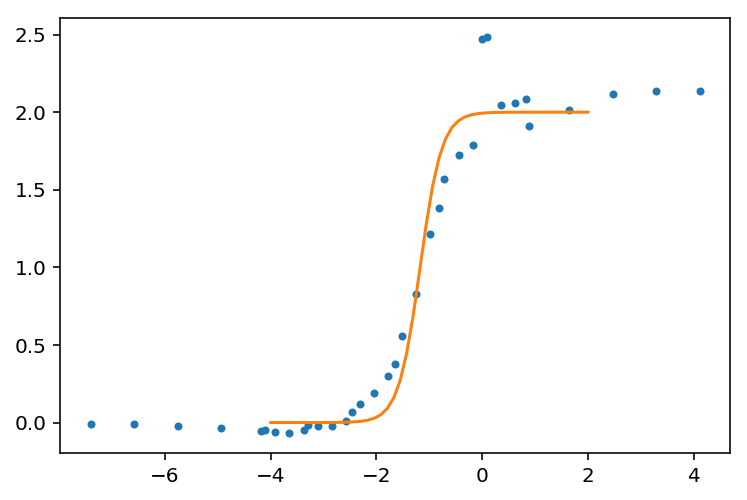

ER-0-n50-L97
97: 0.61, 0.37, 0.057, 


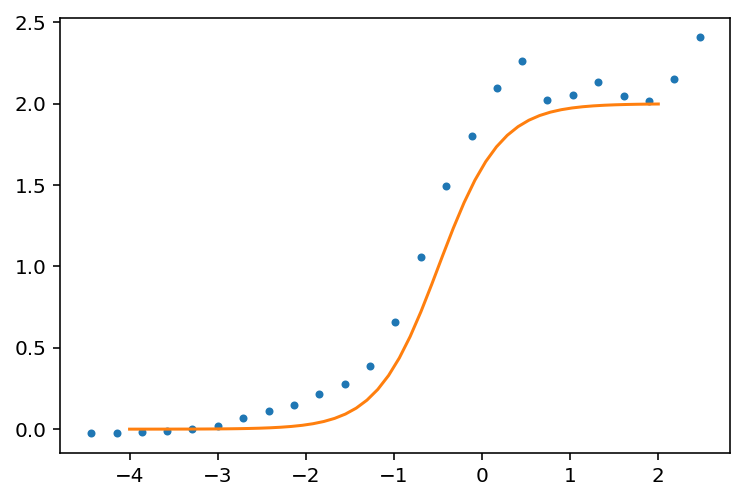

ER-1-n100-L390
390: 0.38, 0.24, 0.01, 


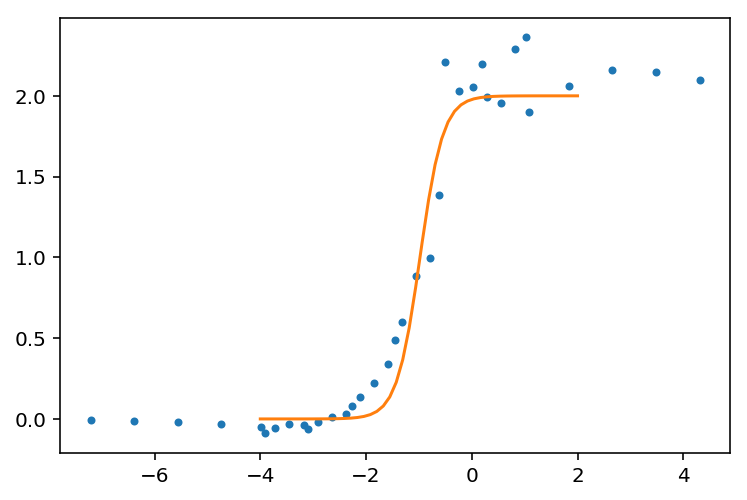

In [78]:
r = linspace(-4,2)
for k in stats:
    if 'ER' not in k: continue
#     if '197' in k: continue
    n,m = (sd(k,'n'),sd(k,'L') ) 
    lth = stats[k]
    gr = gradient(log(lth.T[1]))/gradient(log(lth.T[0]))
    th = lth.T[0]
    print k
    la = m/n*1
    x = arange(1,n)# linspace(.1, 20,150)
    # mom(x,pk(x,la))
    ar = 1/rho_c(n,m,x),pk(x,la)
    m0,r0,s = mom(*ar), rs(n,m), sig(*ar)
    print ('%d: '+'%.2g, '*3) %(m, m0,r0,s)
    plot(log(th),gr,'.',lw=.5)
    plot(r,2*sigmoid( -(r-log(m0))*log(s)))
    show()


ER-0-n97-L197-fixed
197: 0.54, 0.33, 0.062, 


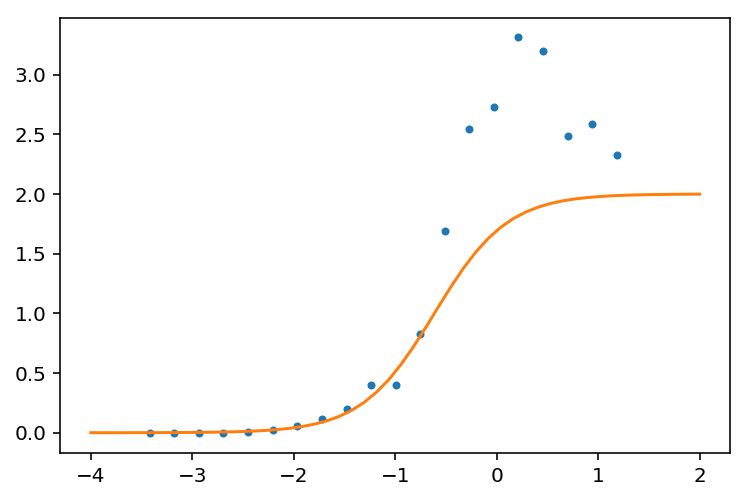

ER-1-n198-L397
397: 0.47, 0.29, 0.024, 


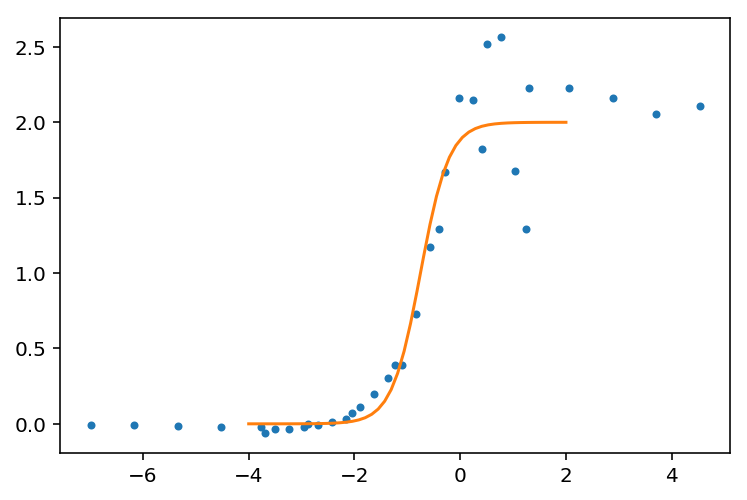

ER-0-n50-L595
595: 0.25, 0.15, 0.0065, 


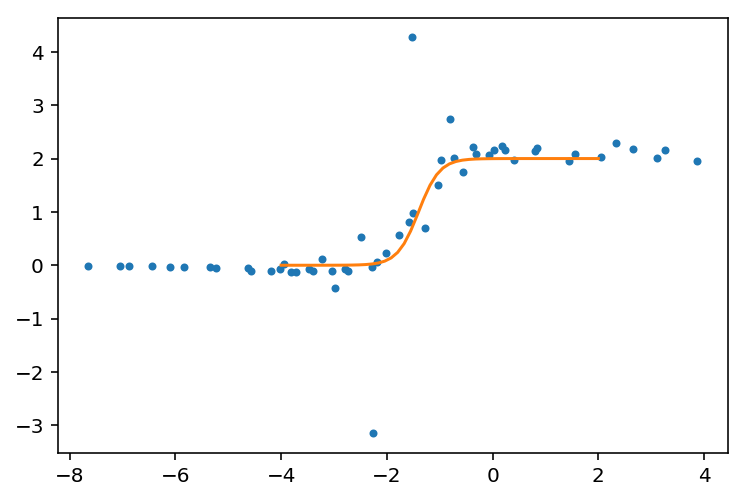

ER-1-n96-L197
197: 0.54, 0.33, 0.061, 


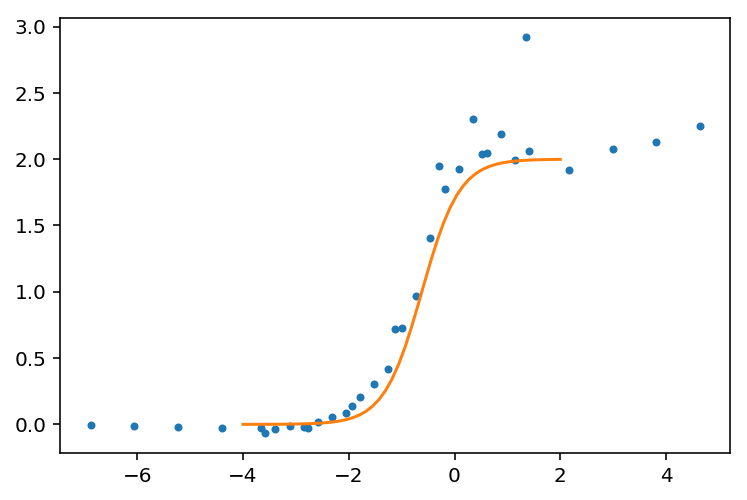

ER-0-n50-L1159
1159: 0.18, 0.11, 0.0035, 


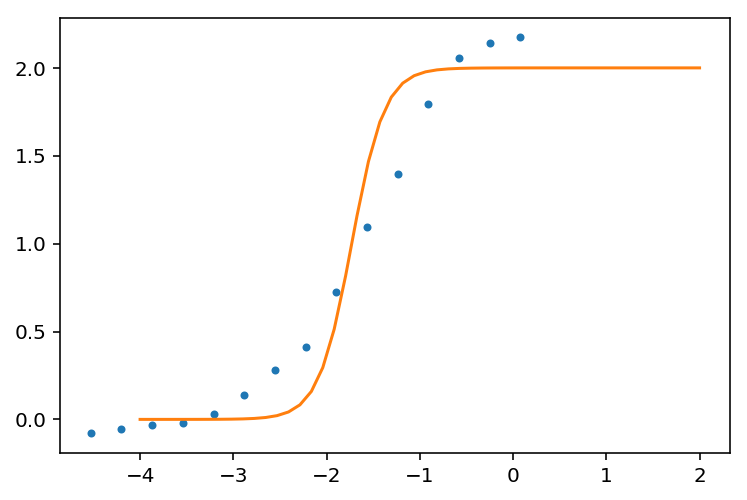

ER-0-n200-L790
790: 0.33, 0.21, 0.0056, 


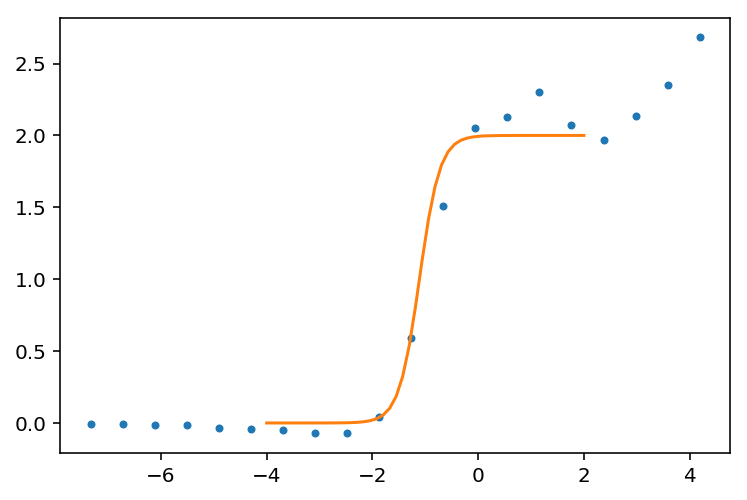

ER-1-n200-L594
594: 0.38, 0.24, 0.0069, 


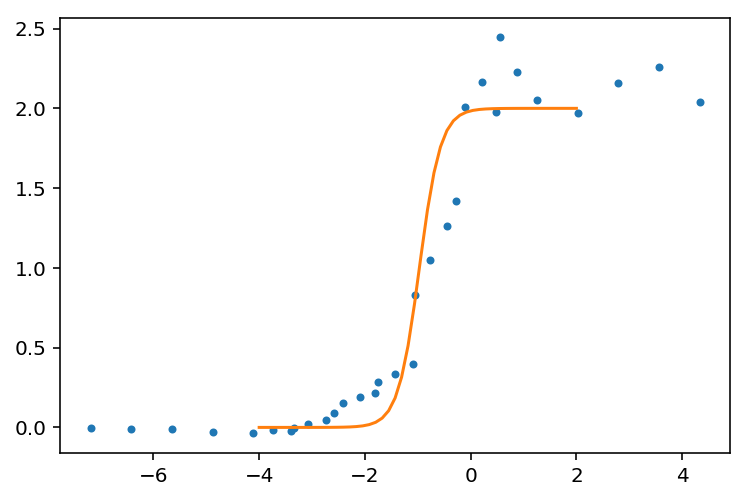

ER-0-n197-L397
397: 0.47, 0.29, 0.024, 


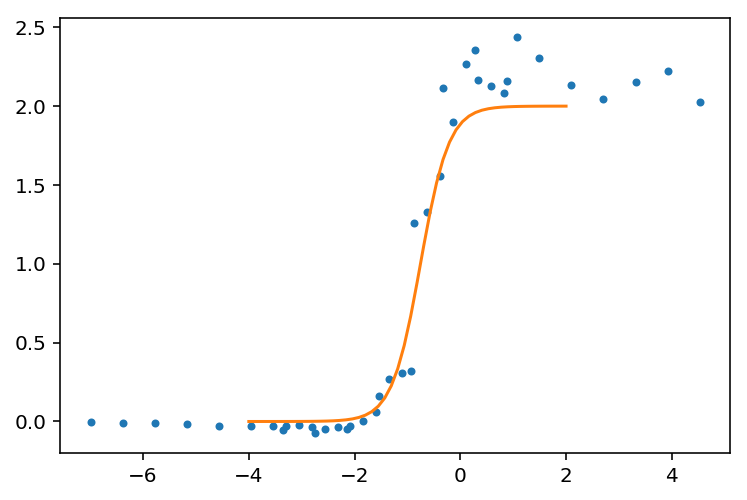

ER-0-n50-L348
348: 0.32, 0.2, 0.011, 


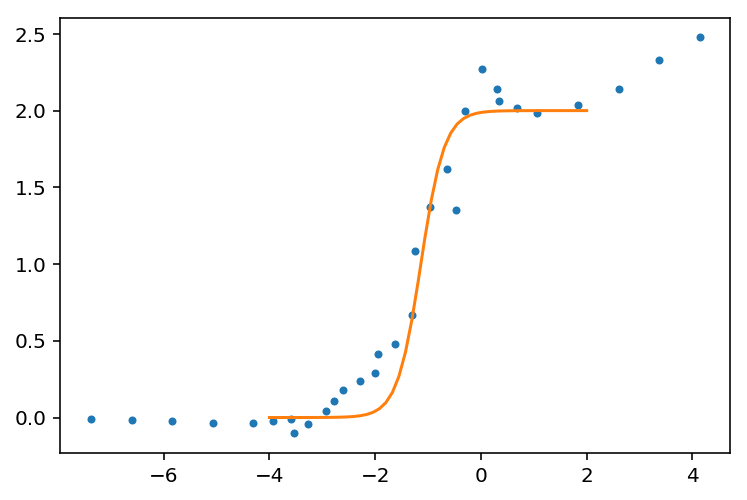

ER-1-n100-L945
945: 0.24, 0.15, 0.0048, 


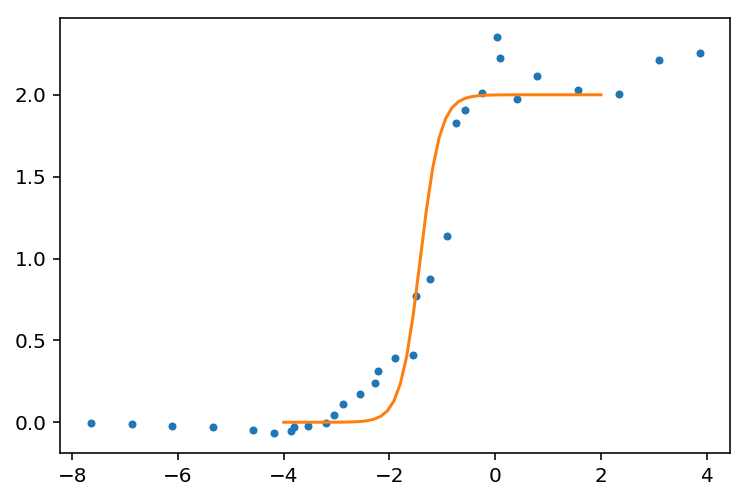

ER-1-n200-L790
790: 0.33, 0.21, 0.0056, 


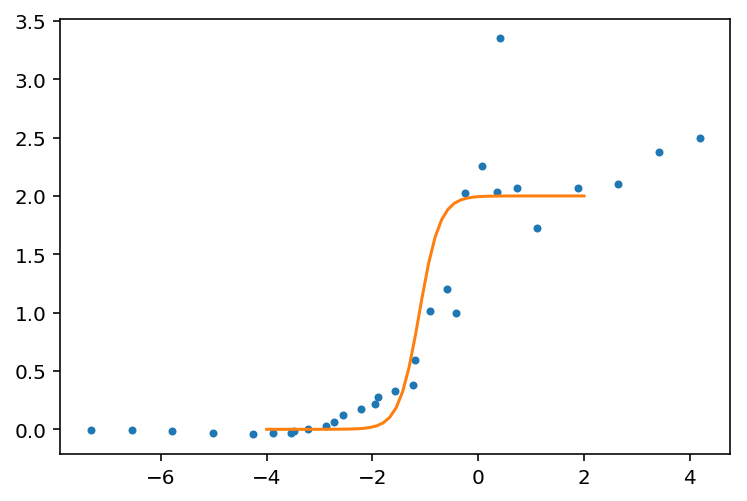

ER-0-n97-L197
197: 0.54, 0.33, 0.062, 


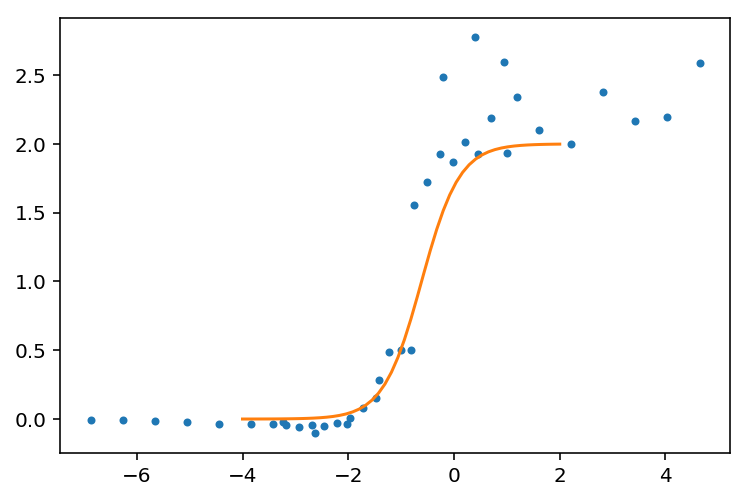

ER-0-n197-L397-fixed
397: 0.47, 0.29, 0.024, 


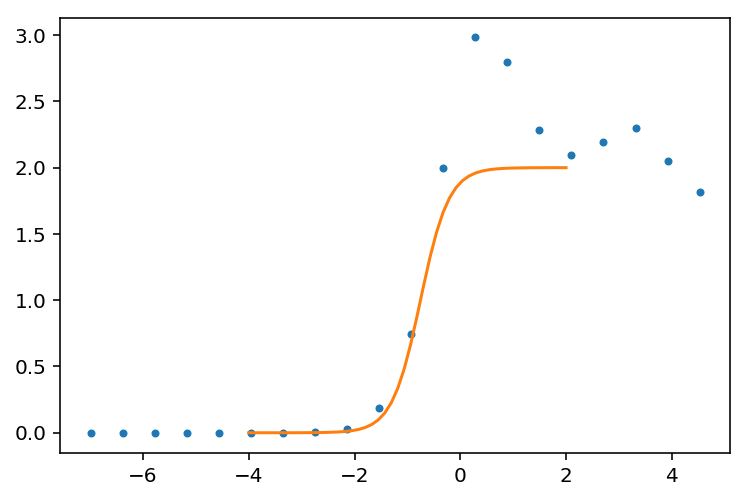

ER-0-n50-L97-fixed
97: 0.61, 0.37, 0.057, 


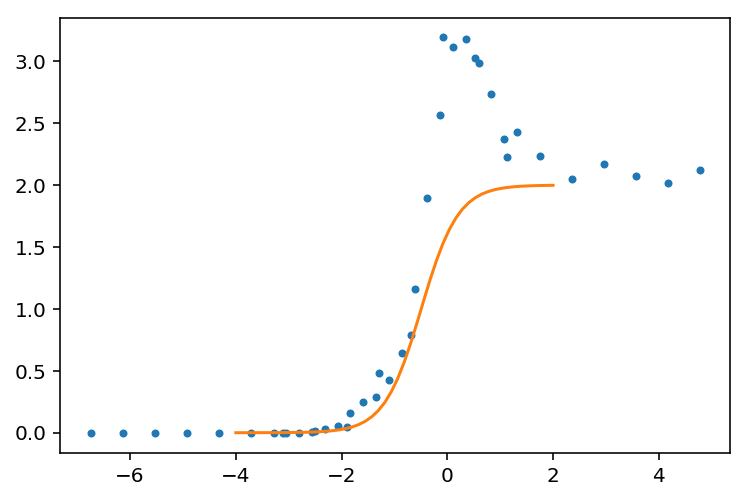

ER-1-n100-L1122
1122: 0.22, 0.14, 0.0042, 


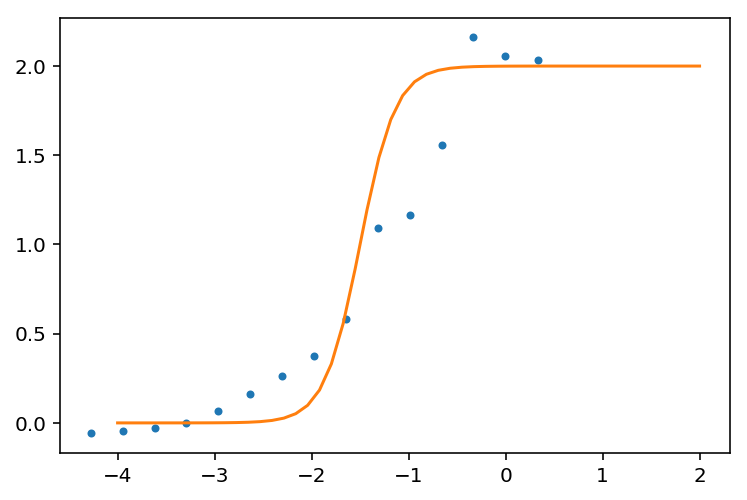

ER-1-n100-L764
764: 0.27, 0.17, 0.0058, 


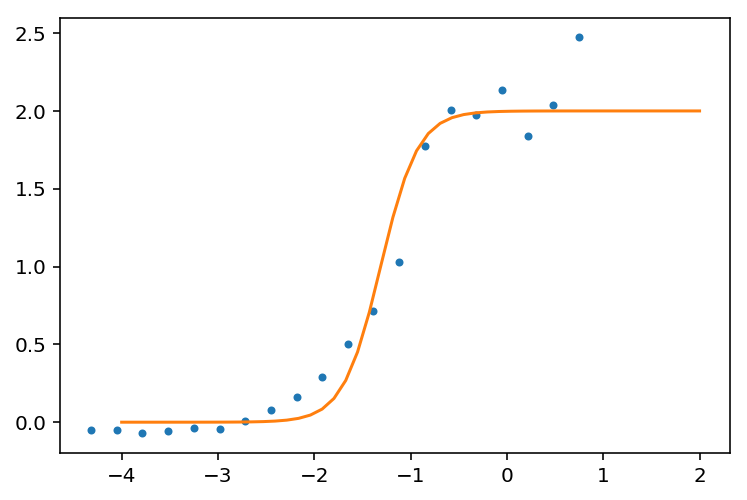

ER-1-n100-L579
579: 0.31, 0.19, 0.0074, 


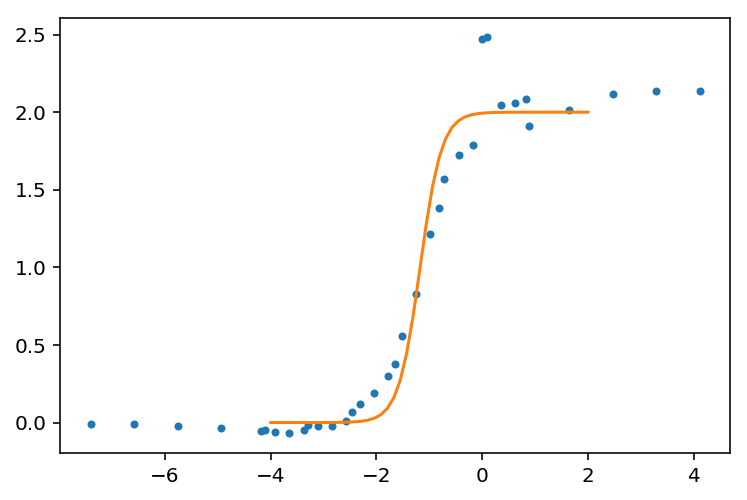

ER-0-n50-L97
97: 0.61, 0.37, 0.057, 


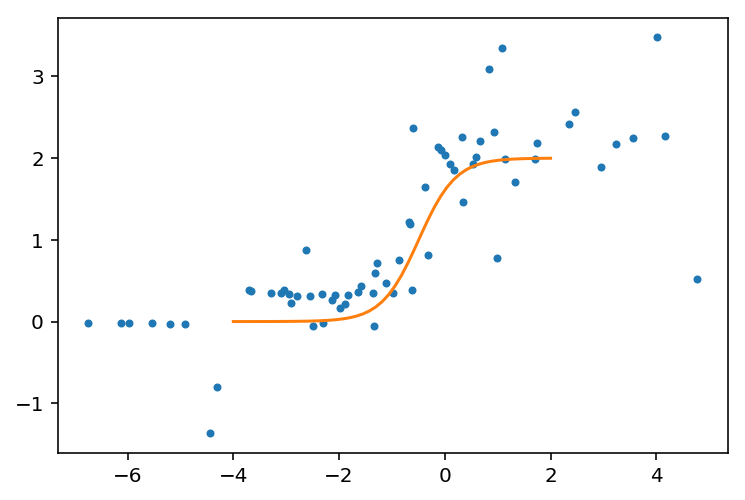

ER-1-n100-L390
390: 0.38, 0.24, 0.01, 


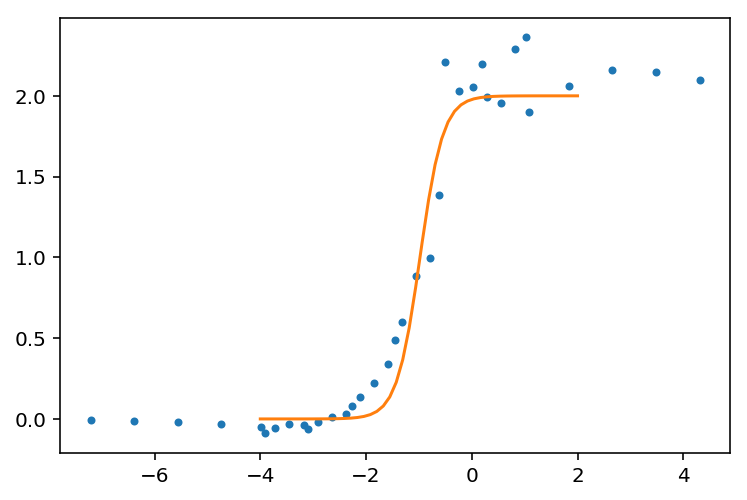

In [63]:
r = linspace(-4,2)
for k in stats:
    if 'ER' not in k: continue
#     if '197' in k: continue
    n,m = (sd(k,'n'),sd(k,'L') ) 
    lth = stats[k]
    gr = gradient(log(lth.T[1]))/gradient(log(lth.T[0]))
    th = lth.T[0]
    print k
    la = m/n*1
    x = arange(1,n)# linspace(.1, 20,150)
    # mom(x,pk(x,la))
    ar = 1/rho_c(n,m,x),pk(x,la)
    m0,r0,s = mom(*ar), rs(n,m), sig(*ar)
    print ('%d: '+'%.2g, '*3) %(m, m0,r0,s)
    plot(log(th),gr,'.',lw=.5)
    plot(r,2*sigmoid( -(r-log(m0))*log(s)))
    show()


In [56]:
# r = linspace(-4,2)
# for k in stats:
#     if 'ER' not in k: continue
# #     if '197' in k: continue
#     n,m = (sd(k,'n'),sd(k,'L') ) 
#     lth = stats[k]
#     gr = gradient(log(lth.T[1]))/gradient(log(lth.T[0]))
#     th = lth.T[0]
#     print k
#     la = m/n*1
#     x = arange(1,n)# linspace(.1, 20,150)
#     # mom(x,pk(x,la))
#     ar = 1/rho_c(n,m,x),pk(x,la)
#     m0,r0,s = mom(*ar), rs(n,m), sig(*ar)
#     print ('%d: '+'%.2g, '*3) %(m, m0,r0,s)
#     plot(log(th),gr)
#     plot(r,2*sigmoid( -(r-log(m0))*log(s)))
#     show()


ER-0-n97-L197-fixed
197: 0.54, 0.33, 0.062, 


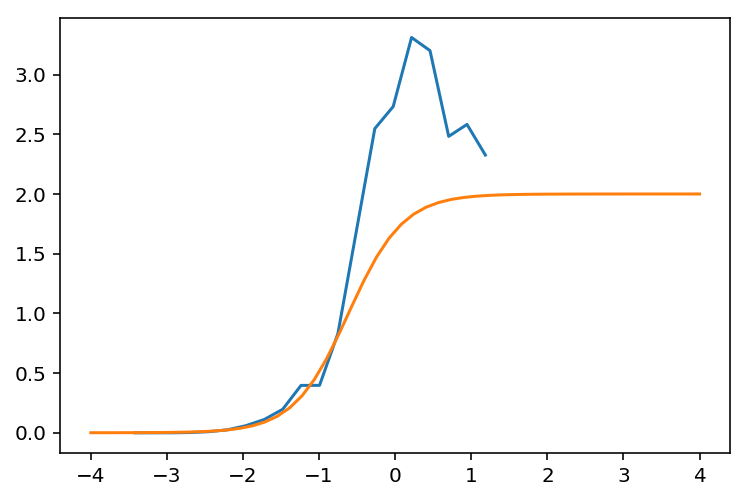

ER-0-n50-L1159
1159: 0.18, 0.11, 0.0035, 


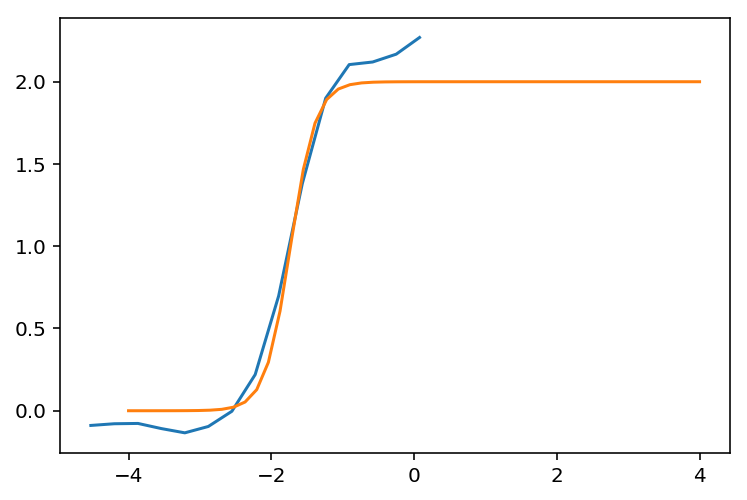

ER-0-n200-L790
790: 0.33, 0.21, 0.0056, 


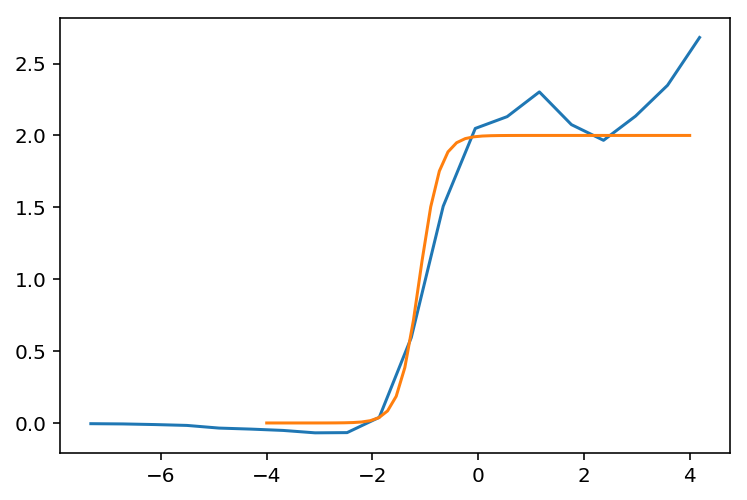

ER-0-n197-L397
397: 0.47, 0.29, 0.024, 


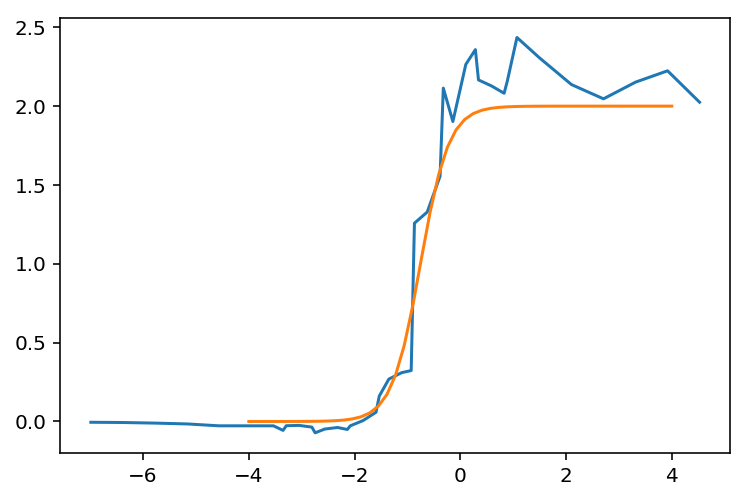

ER-0-n50-L595
595: 0.25, 0.15, 0.0065, 


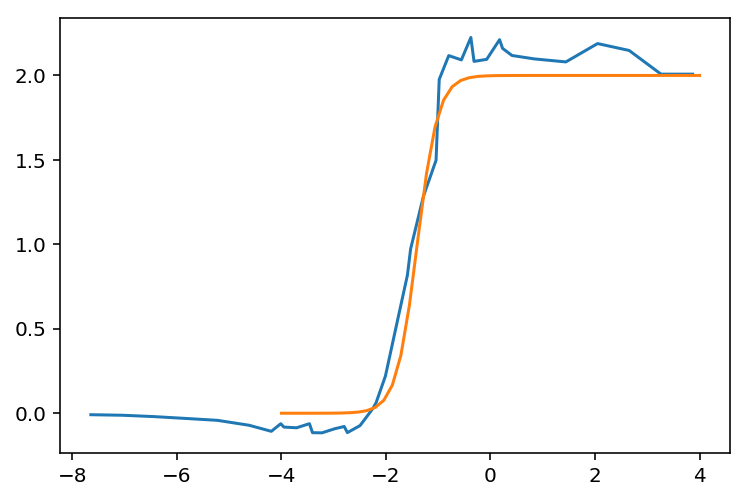

ER-0-n197-L397-fixed
397: 0.47, 0.29, 0.024, 


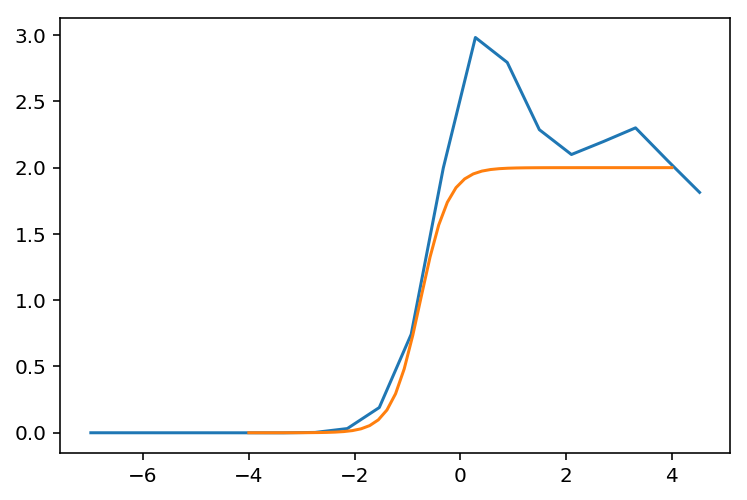

ER-0-n97-L197
197: 0.54, 0.33, 0.062, 


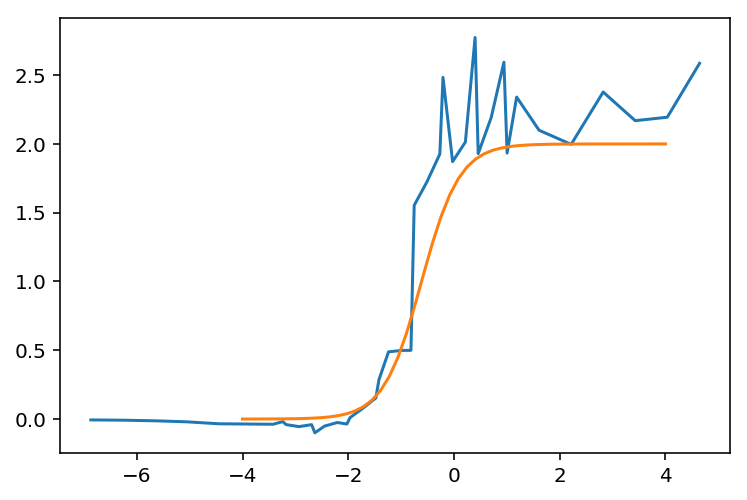

ER-0-n50-L97
97: 0.61, 0.37, 0.057, 


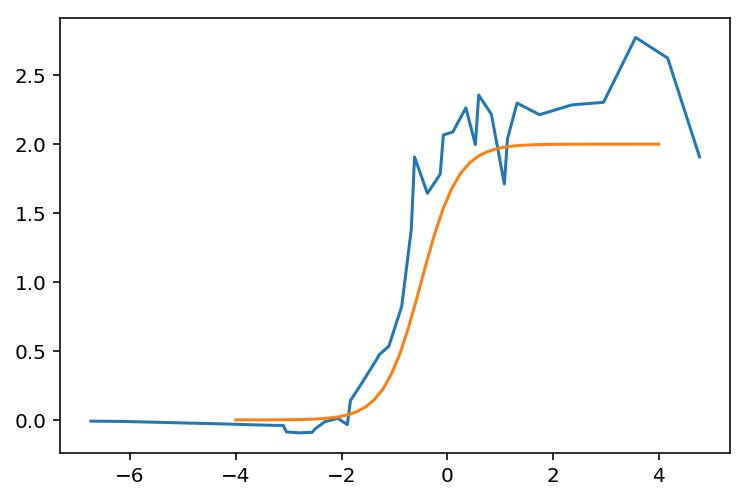

ER-0-n50-L97-fixed
97: 0.61, 0.37, 0.057, 


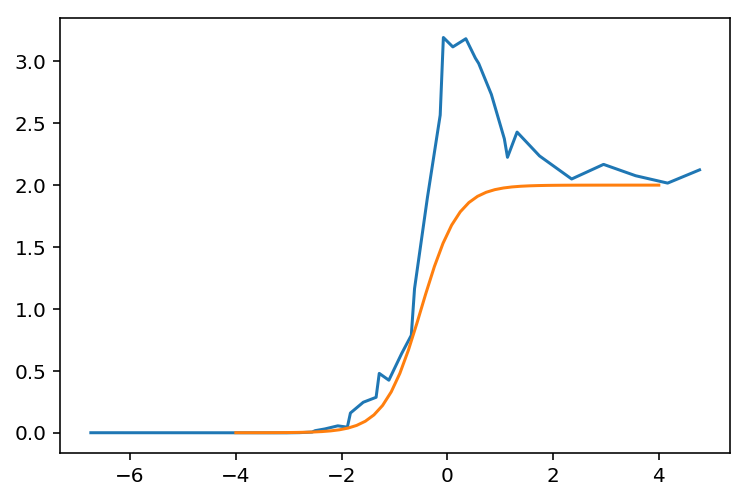

In [1033]:
for k in stats:
    if 'ER' not in k: continue
#     if '197' in k: continue
    n,m = (sd(k,'n'),sd(k,'L') ) 
    lth = stats[k]
    gr = gradient(log(lth.T[1]))/gradient(log(lth.T[0]))
    th = lth.T[0]
    print k
    la = m/n*1
    x = arange(1,n)# linspace(.1, 20,150)
    # mom(x,pk(x,la))
    ar = 1/rho_c(n,m,x),pk(x,la)
    m0,r0,s = mom(*ar), rs(n,m), sig(*ar)
    print ('%d: '+'%.2g, '*3) %(m, m0,r0,s)
    plot(log(th),gr)
    plot(r,2*sigmoid( -log(s)*(r-log(m0))))
    show()


ER-0-n97-L197-fixed
197: 0.54, 0.33, 0.062, 


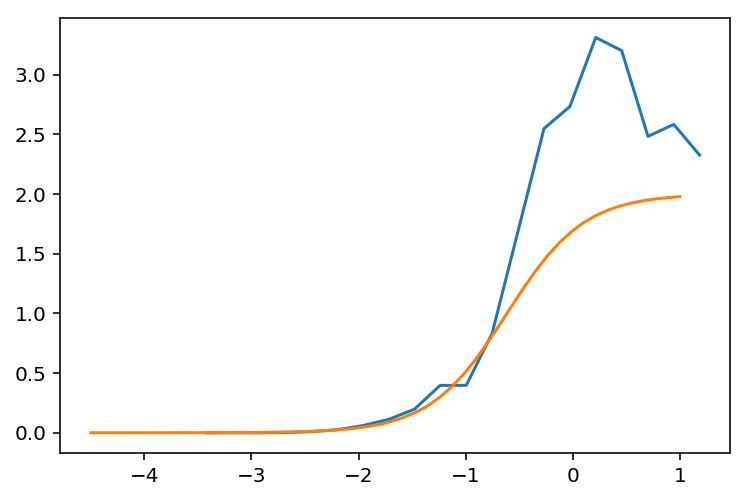

ER-0-n50-L1159
1159: 0.18, 0.11, 0.0035, 


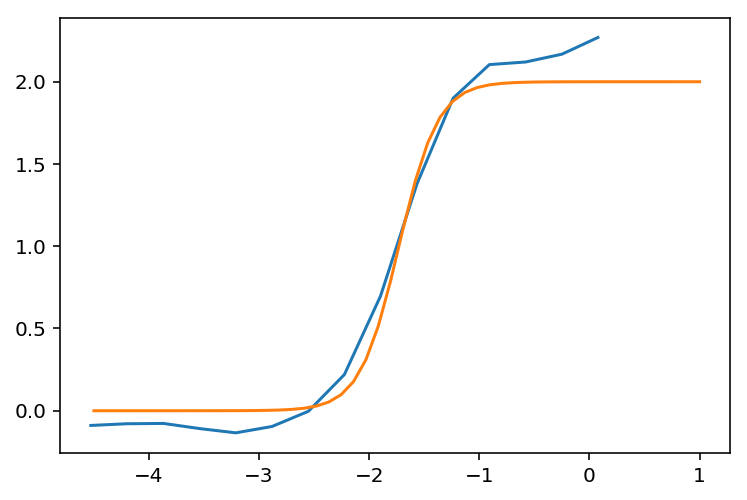

ER-0-n200-L790
790: 0.33, 0.21, 0.0056, 


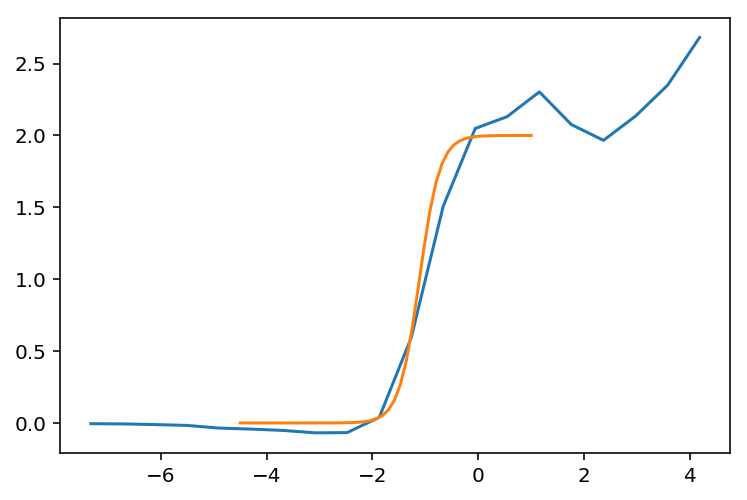

ER-0-n197-L397
397: 0.47, 0.29, 0.024, 


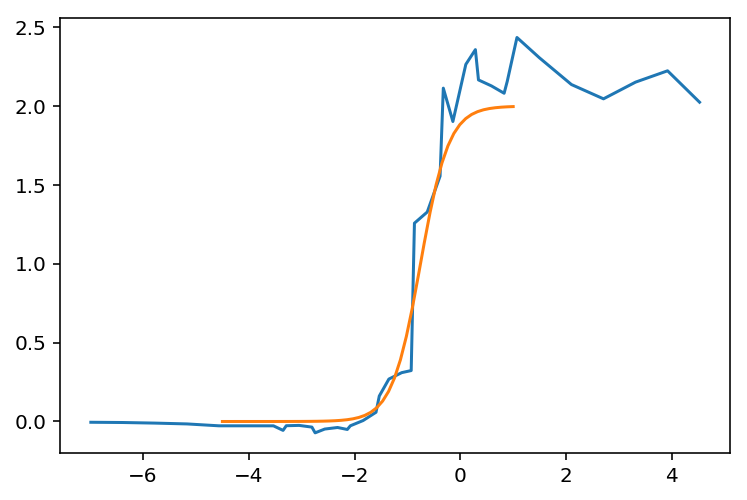

ER-0-n50-L595
595: 0.25, 0.15, 0.0065, 


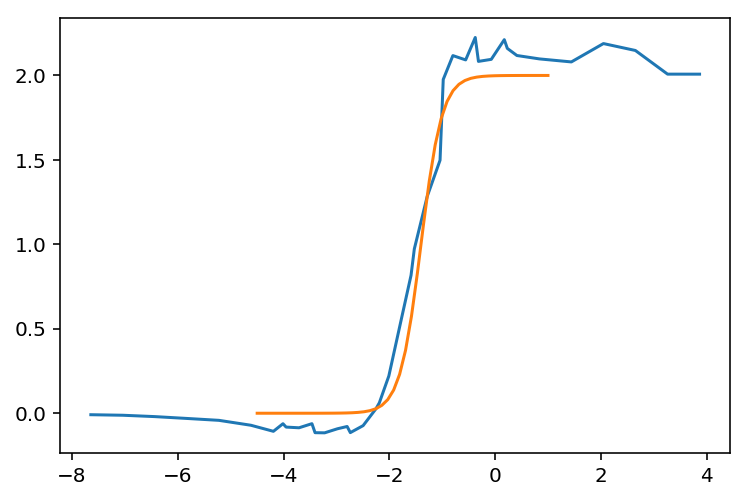

ER-0-n197-L397-fixed
397: 0.47, 0.29, 0.024, 


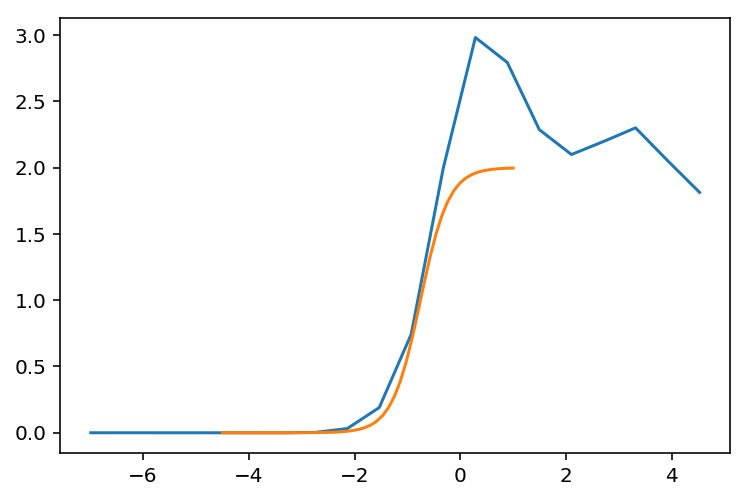

ER-0-n97-L197
197: 0.54, 0.33, 0.062, 


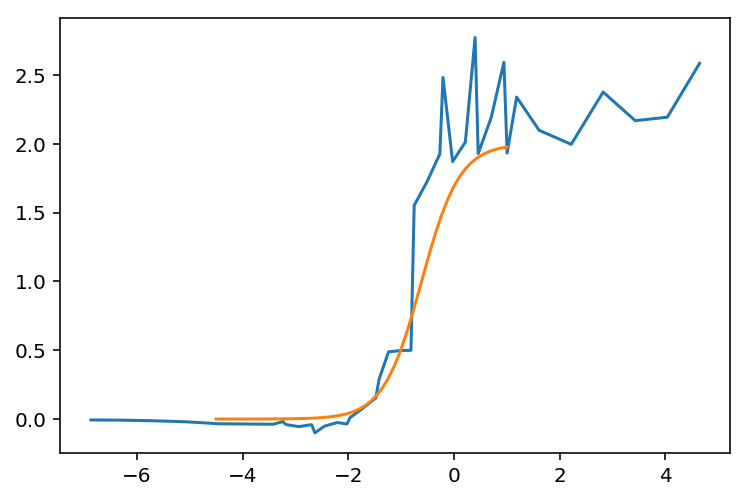

ER-0-n50-L97
97: 0.61, 0.37, 0.057, 


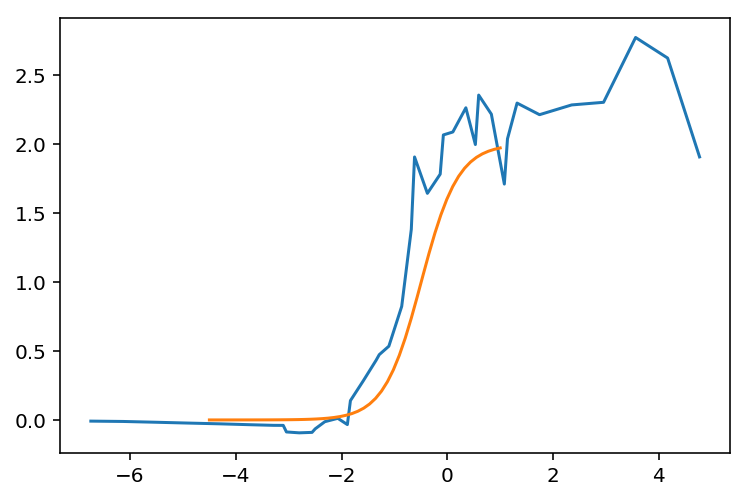

ER-0-n50-L97-fixed
97: 0.61, 0.37, 0.057, 


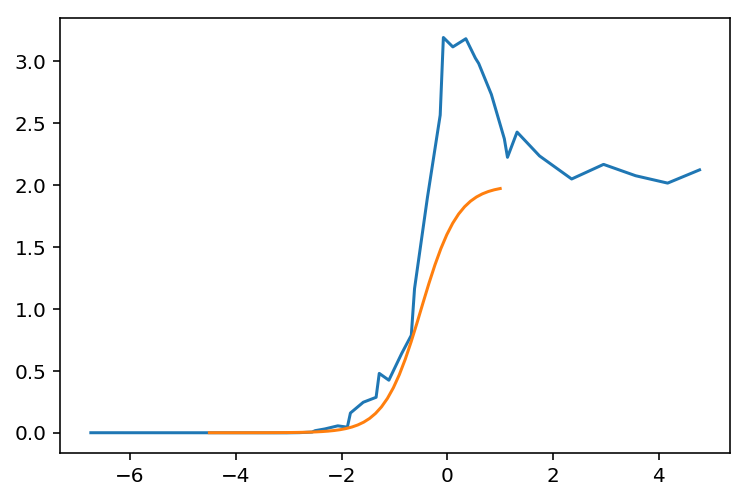

In [959]:
for k in stats:
    if 'ER' not in k: continue
    n,m = (sd(k,'n'),sd(k,'L') ) 
    lth = stats[k]
    gr = gradient(log(lth.T[1]))/gradient(log(lth.T[0]))
    th = lth.T[0]
    print k
    la = m/n
    x = arange(1,n)# linspace(.1, 20,150)
    # mom(x,pk(x,la))
    ar = 1/rho_c(n,m,x),pk(x,la)
    m0,r0,s = mom(*ar), rs(n,m), sig(*ar)
    print ('%d: '+'%.2g, '*3) %(m, m0,r0,s)
    plot(log(th),gr)
    plot(r,2*sigmoid( -log(s)*(r-log(m0))))
    show()


SyntaxError: invalid syntax (<ipython-input-97-38d4985ebccb>, line 1)

BA-0-n100-L197
197: 0.53, 0.33, 0.087, 


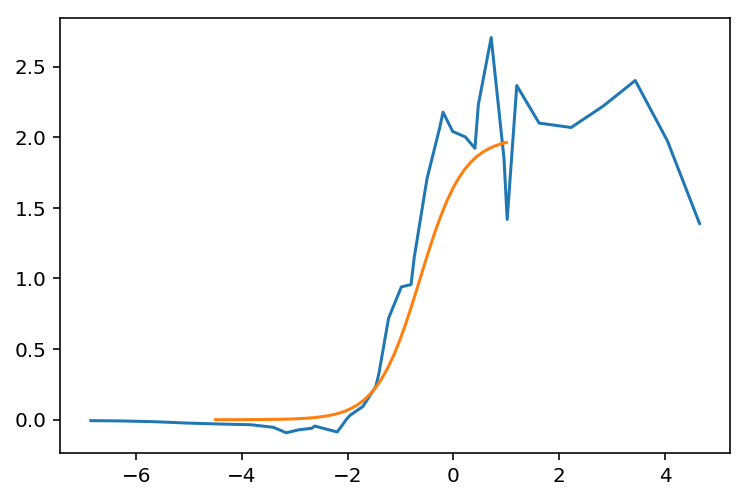

BA-0-n50-L1159
1159: 0.17, 0.11, 0.00057, 


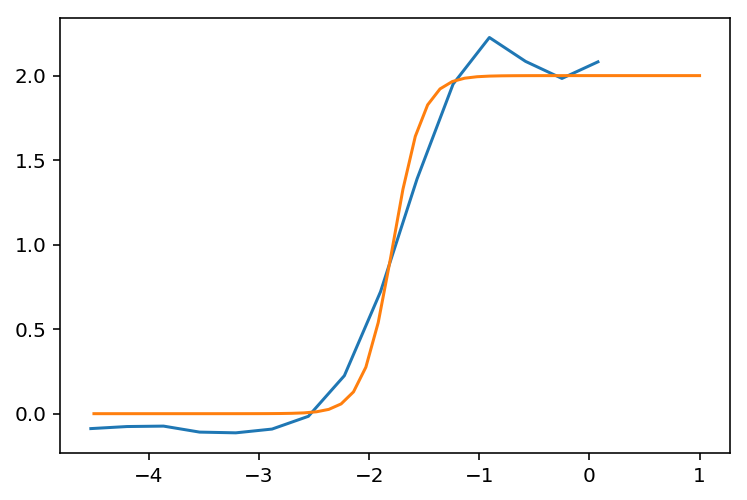

BA-0-n50-L595
595: 0.23, 0.15, 0.0068, 


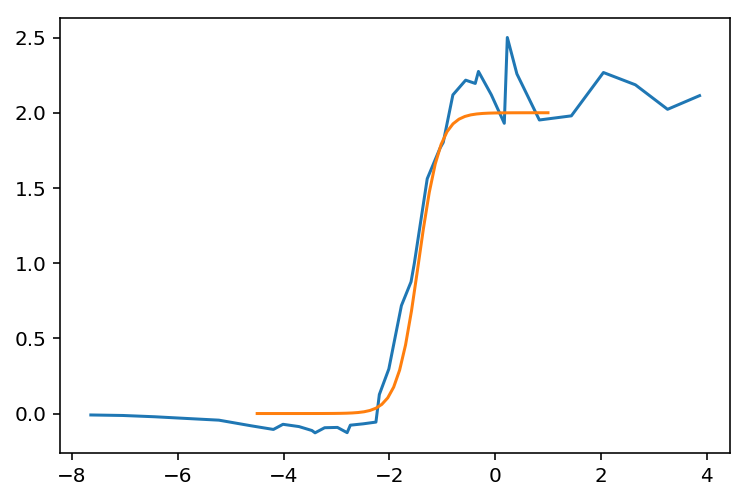

BA-0-n200-L397-fixed
397: 0.47, 0.29, 0.062, 


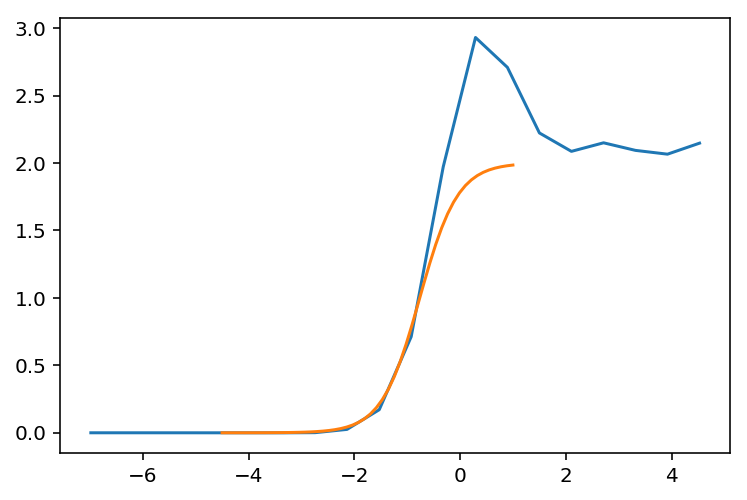

BA-0-n200-L397
397: 0.47, 0.29, 0.062, 


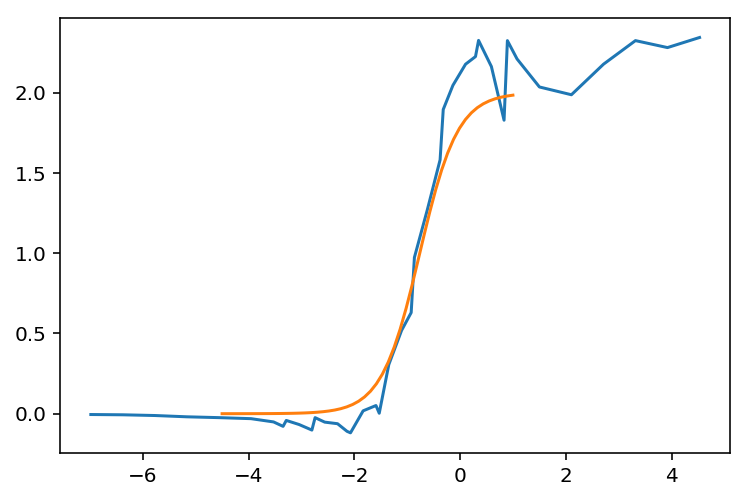

BA-0-n200-L790
790: 0.33, 0.21, 0.022, 


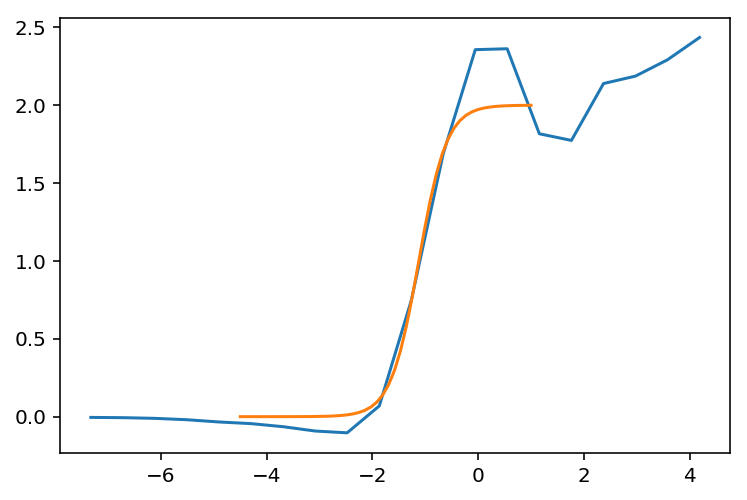

BA-0-n50-L97
97: 0.61, 0.37, 0.13, 


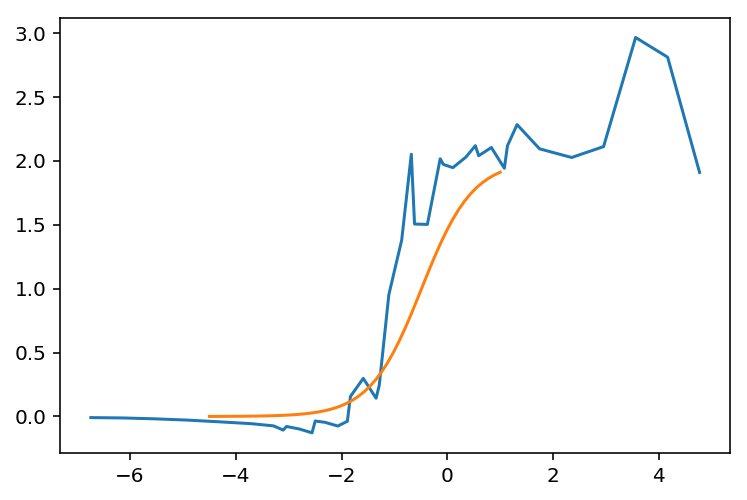

BA-0-n50-L97-fixed
97: 0.61, 0.37, 0.13, 


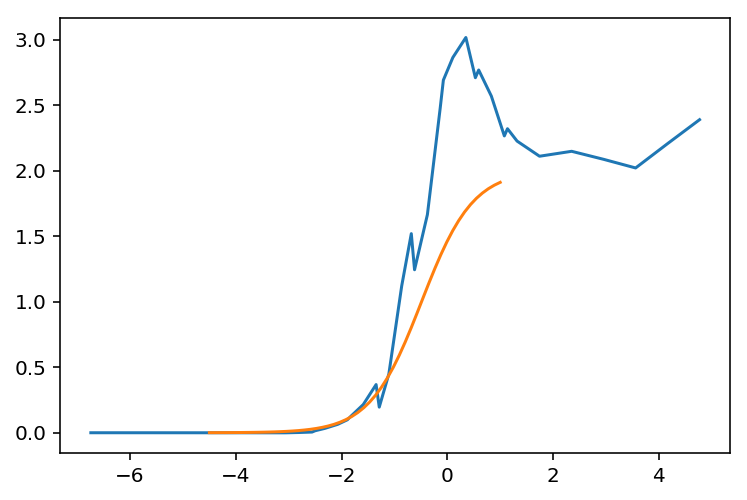

BA-0-n100-L197-fixed
197: 0.53, 0.33, 0.087, 


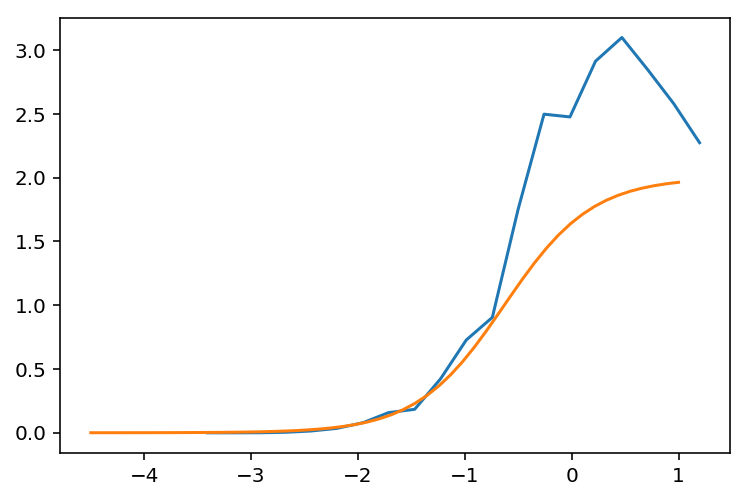

In [915]:
for k in stats:
    if 'BA' not in k: continue
    n,m = (sd(k,'n'),sd(k,'L') ) 
    lth = stats[k]
    gr = gradient(log(lth.T[1]))/gradient(log(lth.T[0]/r_c))
    th = lth.T[0]
    print k
    la = m/n
    x = arange(1.,n)# linspace(.1, 20,150)
    # mom(x,pk(x,la))
    ar = 1/rho_c(n,m,x), x**-3 #pk(x,la)
    m0,r0,s = mom(*ar), rs(n,m), sig(*ar)
    print ('%d: '+'%.2g, '*3) %(m, m0,r0,s)
    plot(log(th),gr)
    plot(r,2*sigmoid( -log(s)*(r-log(m0))))
    show()


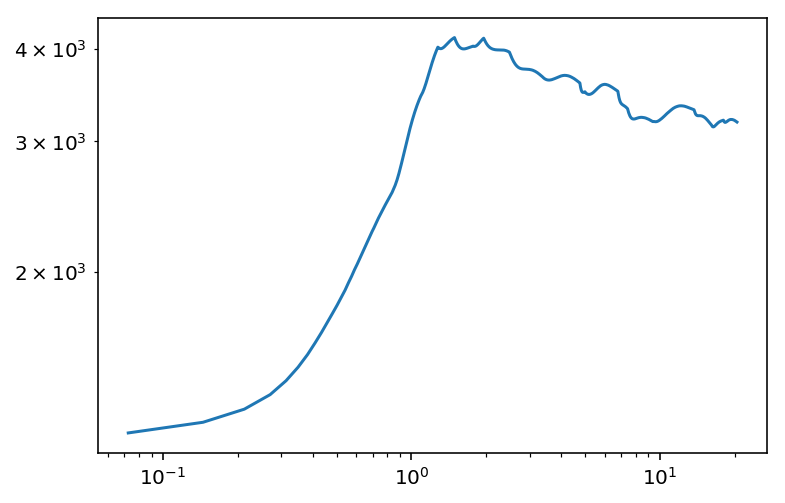

In [753]:
tv = loadtxt('../../output/phase-finite-032818-1/BA-1-n100-L197-th-r1.45-segs15-ka0.069-tv.txt')
loglog(*tv.T)

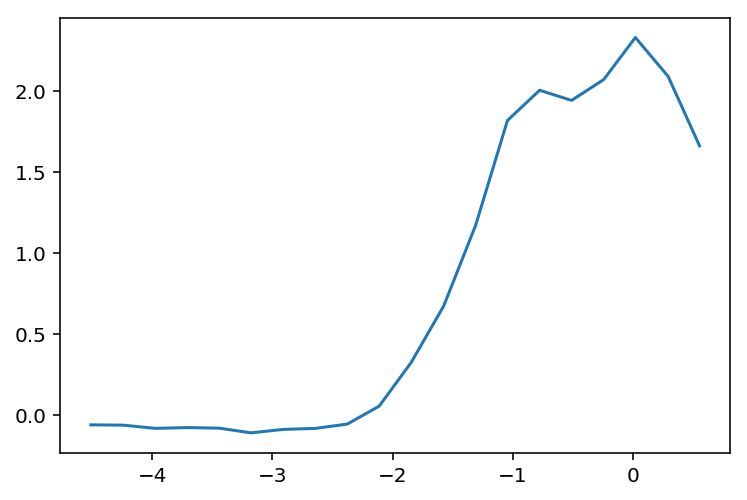

In [693]:
lth = stats['ER-1-n100-L1122']
gr = gradient(log(lth.T[1]))/gradient(log(lth.T[0]/r_c))
th = lth.T[0]
plot(log(th),gr)

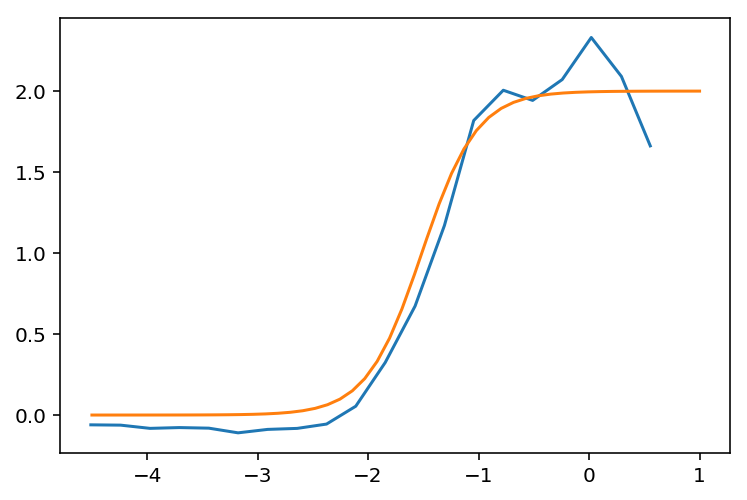

In [703]:
r = linspace(-4.5,1)
plot(log(th),gr)
plot(r,tanh(2*(r-log(.22)))+1)

In [709]:
sigmoid = lambda x: .5*(1+tanh(x/2.))

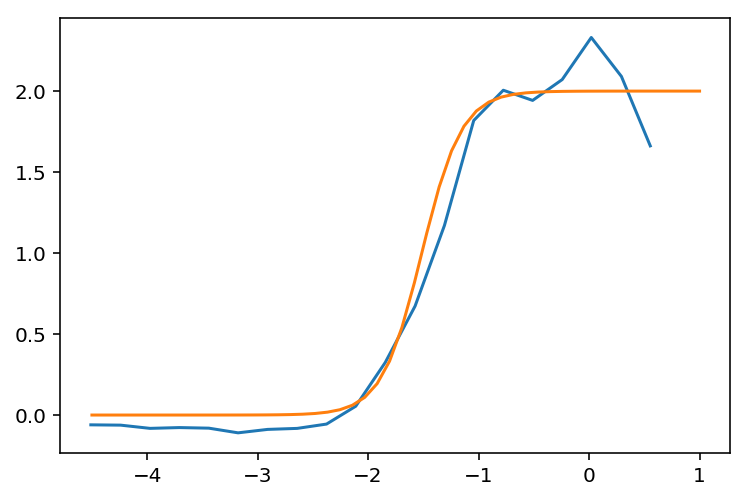

In [722]:
r = linspace(-4.5,1)
plot(log(th),gr)
plot(r,2*sigmoid( -log(0.004)*(r-log(.22))))

In [721]:
log(0.004)

-5.521460917862246

$$ p(k;\lambda) = \exp\left[ k \ln \lambda - \lambda- \ln \Gamma(k+1)\right]$$

$$ \ln \Gamma(k+1) \approx \left(k+{1\over2}\right) \ln (k+1) - (k+1) +{1\over 2} \ln (2\pi)$$

$$ p(k;\lambda) = \exp\left[ \left(k+{1\over2}\right) \ln {\lambda\over k+1 } - \lambda  + (k+1) -{1\over 2} \ln (2\pi\lambda ) \right] $$
$$ p(k;\lambda) =  \left({\lambda\over k+1 }\right)^{k+{1\over2}}   { e^{- \lambda + k+1}\over \sqrt{ 2\pi\lambda }} $$


In [657]:
pk = lambda k,l : (l/(k+1.))**(k+.5)*exp(-l+k+1.)/sqrt(2*pi*l)

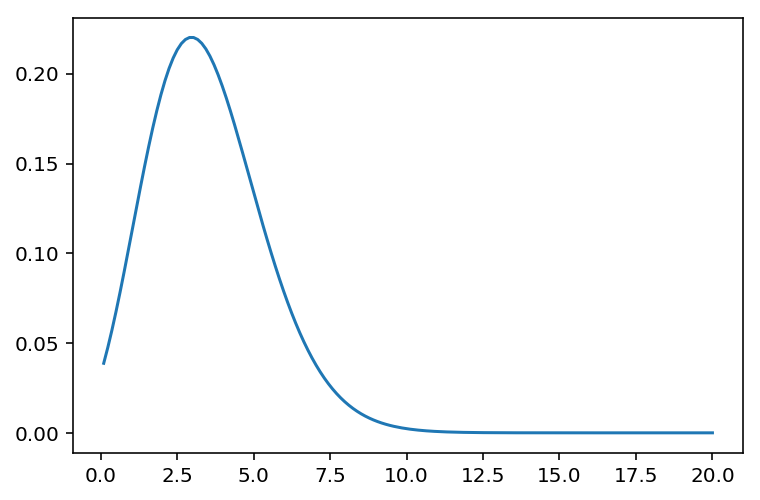

In [352]:
la = 3.5
x = linspace(.1, 20,150)
plot(x,pk(x,la))

In [632]:
mom = lambda A,p: (A*p).sum()/p.sum()
sig = lambda A,p: sqrt(mom(A**2,p)-mom(A,p)**2)

In [607]:
A1 = lambda b,c: 9*c + sqrt(3)*abs(-4*b**3 + 27*c**2)**(1./2)*(-1j)**sign(-4*b**3 + 27*c**2)
so = lambda x,b: (8*2**(1./3)*3**(2./3)*b + 12**(1./3)*x**(2./3)*\
             (1 + sqrt(3)*1j)**2)/(12*x**(1./3)*(1 + sqrt(3)*1j))
so1 = lambda b,c: so(A1(b,c),b)

In [608]:
so1(2,1)

(0.618033988749895-1.600813445123629e-16j)

In [620]:
mom = lambda A,p: (A*p).sum()/p.sum()
sig = lambda A,p: sqrt(mom(A**2,p)-mom(A,p)**2)

A1 = lambda a,b: 9*b + sqrt(3)*abs(-4*a**3 + 27*b**2)**(1./2)*(1j)**sign(-4*a**3 + 27*b**2)
so = lambda x,a: (8*2**(1./3)*3**(2./3)*a + 12**(1./3)*x**(2./3)*\
             (1 + sqrt(3)*1j)**2)/(12*x**(1./3)*(1 + sqrt(3)*1j))
so1 = lambda a,b: so(A1(a,b),a)

def rho_c(N,L,k):
    al,c = 4*2**.5/pi, 3./4 
    a = c/al*N**(-2./3)*L
    b = k**(3./2)/(3*al)
    return real(so1(a,b))

In [631]:
for b in range(2,10):
    p = poly1d((1,0,-b,1))
    print '{0:.2f}, {1:.2f}'.format(so1(b,1),p.roots.max())

1.00-0.00j, 1.00
1.53-0.00j, 1.53
1.86-0.00j, 1.86
2.13-0.00j, 2.13
2.36+0.00j, 2.36
2.57-0.00j, 2.57
2.76+0.00j, 2.76
2.94-0.00j, 2.94


In [633]:
def rho_c(N,L,k):
    al,c = 4*2**.5/pi, 3./4 
    a = c/al*N**(-2./3)*L
    b = k**(3./2)/(3*al)
    return real(so1(a,b))

In [640]:
la = m/n
a,b,c  = 2**(5./2)/pi, -3./4*n**(-2./3)*m, 1*mom(k,pk(x,la))/3
    
pm0 = poly1d((a,0,b,0)).roots.max()
1/rho_c(n,m,0), rs(n,m), 1/pm0

(0.20761463786601173, 0.13399112812769493, 0.20761463786601167)

In [671]:
n,m = 100,390
for m in 100*arange(2,13,2):
    la = m/n
    x = arange(1,n)# linspace(.1, 20,150)
    # mom(x,pk(x,la))
    ar = 1/rho_c(n,m,x),pk(x,la)
    print ('%d: '+'%.2g, '*3) %(m, mom(*ar), rs(n,m), sig(*ar))

200: 0.54, 0.33, 0.063, 
400: 0.38, 0.23, 0.016, 
600: 0.31, 0.19, 0.0087, 
800: 0.26, 0.16, 0.0062, 
1000: 0.24, 0.15, 0.0049, 
1200: 0.22, 0.13, 0.004, 


'{:.2f}'

In [365]:
n,m = 100,390
x = arange(1,n)# linspace(.1, 20,150)

k = x**(3./2)
la = m/n
mom(k,pk(x,la)), sig(k,pk(x,la))

for m in 100*arange(2,13,2):
    la = m/n
    print m,'%.1f' %sig(k,pk(x,la))



200 3.2
400 6.2
600 9.3
800 12.3
1000 15.3
1200 18.3


In [433]:
r = linspace(-0.1, 6,100)

a,b,c  = 2**(5./2), -3./4*n**(-2./3)*m, 1*mom(k,pk(x,la))/3
# a,b,c  = 1, -n**(-2./3)*m, 0*mom(k,pk(x,la))/3

n**(-2./3)*m, mom(k,pk(x,la))

(55.69906600335335, 42.83615153668656)

In [434]:
p = poly1d((a,0,b,c))

In [435]:
p.roots

array([-2.87451459,  2.52702654,  0.34748806])

In [436]:
pm = p.roots.max()

In [437]:
1/pm, rs(n,m), 1/(n**(-1./3)*m**.5)

(0.39572200165217813, 0.13399112812769493, 0.13399112812769493)

In [638]:
n = 100
x = arange(1,n)# linspace(.1, 20,150)
k = x**(3./2)

print 'L\tr_c\tr_c0\tr_c_old' 
for m in 100*arange(2,13,2):
    la = m/n
    a,b,c  = 2**(5./2)/pi, -3./4*n**(-2./3)*m, 1*mom(k,pk(x,la))/3
    pm = poly1d((a,0,b,c)).roots.max()
    pm0 = poly1d((a,0,b,0)).roots.max()
    print '%d \t%.2f \t%.2f \t%.2f' %(m, 1/pm,1/pm0,1*rs(n,m)) 
    

L	r_c	r_c0	r_c_old
200 	0.54 	0.51 	0.33
400 	0.37 	0.36 	0.23
600 	0.31 	0.29 	0.19
800 	0.26 	0.25 	0.16
1000 	0.24 	0.23 	0.15
1200 	0.22 	0.21 	0.13


In [473]:
sqrt(a/pi /(3./4))

0.8741923268562484

In [510]:
n = 100
x = arange(1,n)# linspace(.1, 20,150)
k = x**(3./2)

print 'L\tr_c\tr_c0\ts/m' 
for m in 100*arange(2,13,2):
    la = m/n
    mo, s = mom(k,pk(x,la)), sig(k,pk(x,la))
    a,b,c  = 2**(5./2), -3./4*n**(-2./3)*m, (mo+2*s)/3
    pm = poly1d((a,0,b,c)).roots.max()
    a,b,c  = 2**(5./2)/pi, -3./4*n**(-2./3)*m, (mo-2*s)/3
    pm0 = poly1d((a,0,b,c)).roots.max()
    print '%d \t%.2f \t%.2f \t%.2f' %(m,1/pm,1/pm0, s/mo)
    #'%d \t%.2f \t%.2f \t%.2f' %(m, 1/pm,1/pm0,3*rs(n,m)) 
    

L	r_c	r_c0	s/m
200 	1.40 	0.49 	0.83
400 	0.84 	0.35 	0.70
600 	0.65 	0.29 	0.59
800 	0.54 	0.25 	0.52
1000 	0.48 	0.23 	0.47
1200 	0.43 	0.21 	0.43


/home/nidami/tf_gpu/lib/python2.7/site-packages/ipykernel_launcher.py:13: ComplexWarning: Casting complex values to real discards the imaginary part
  del sys.path[0]


In [512]:
n = 100
x = arange(1,n)# linspace(.1, 20,150)
k = x**(3./2)

print 'L\tr_c\tr_c0\ts/m' 
for m in 100*arange(2,13,2):
    la = m/n
    mo, s = mom(k,pk(x,la)), sig(k,pk(x,la))
    a,b,c  = 2**(5./2)/pi, -3./4*n**(-2./3)*m, (mo+2*s)/3
    pm = poly1d((a,0,b,c)).roots.max()
    a,b,c  = 2**(5./2)/pi, -3./4*n**(-2./3)*m, (mo-2*s)/3
    pm0 = poly1d((a,0,b,c)).roots.max()
    r0 = rs(n,m)
    print '%d \t%.2f \t%.2f \t%.2f' %(m,1/pm/r0,1/pm0/r0, s/mo)
    #'%d \t%.2f \t%.2f \t%.2f' %(m, 1/pm,1/pm0,3*rs(n,m)) 
    

L	r_c	r_c0	s/m
200 	1.85 	1.51 	0.83
400 	1.74 	1.53 	0.70
600 	1.71 	1.54 	0.59
800 	1.69 	1.55 	0.52
1000 	1.68 	1.55 	0.47
1200 	1.67 	1.56 	0.43


In [513]:
n = 100
x = arange(1,n)# linspace(.1, 20,150)
k = x**(3./2)

print 'L\tr_c\tr_c0\ts/m' 
for m in 100*arange(2,13,2):
    la = m/n
    mo, s = mom(k,pk(x,la)), sig(k,pk(x,la))
    a,b,c  = 2**(5./2)/pi, -3./4*n**(-2./3)*m, (mo)/3
    pm = poly1d((a,0,b,c)).roots.max()
    a,b,c  = 2**(5./2)/pi, -3./4*n**(-2./3)*m, (s)/3
    pm0 = poly1d((a,0,b,c)).roots.max()
    r0 = rs(n,m)
    print '%d \t%.2f \t%.2f \t%.2f' %(m,1/pm/r0,1/pm0/r0, s/mo)
    #'%d \t%.2f \t%.2f \t%.2f' %(m, 1/pm,1/pm0,3*rs(n,m)) 
    

L	r_c	r_c0	s/m
200 	1.63 	1.62 	0.83
400 	1.62 	1.59 	0.70
600 	1.61 	1.59 	0.59
800 	1.61 	1.58 	0.52
1000 	1.61 	1.58 	0.47
1200 	1.61 	1.57 	0.43


In [451]:
n = 100
x = arange(1.,n)# linspace(.1, 20,150)
k = x**(3./2)

print 'L\tr_c\tr_c0\tr_c_old' 
for m in 100*arange(2,13,2):
    la = m/n
    a,b,c  = 2**(5./2)/pi, -3./4*n**(-2./3)*m, 1*mom(k,x**-3)/3
    pm = poly1d((a,0,b,c)).roots.max()
    pm0 = poly1d((a,0,b,0)).roots.max()
    print '%d \t%.2f \t%.2f \t%.2f' %(m, 1/pm,1/pm0,3*rs(n,m)) 
    

L	r_c	r_c0	r_c_old
200 	0.95 	0.90 	0.98
400 	0.65 	0.64 	0.70
600 	0.52 	0.52 	0.57
800 	0.45 	0.45 	0.49
1000 	0.40 	0.40 	0.44
1200 	0.37 	0.37 	0.40


In [508]:
n = 100
x = arange(1.,n)# linspace(.1, 20,150)
k = x**(3./2)

print 'L\tr_c\tr_c0\ts/m' 
for m in 100*arange(2,13,2):
    la = m/n
    mo, s = mom(k,x**-3), sig(k,x**-3)
    a,b,c  = 2**(5./2)/pi, -3./4*n**(-2./3)*m, (mo+2*s)/3
    pm = poly1d((a,0,b,c)).roots.max()
    a,b,c  = 2**(5./2)/pi, -3./4*n**(-2./3)*m, (mo-2*s)/3
    pm0 = poly1d((a,0,b,c)).roots.max()
    print '%d \t%.2f \t%.2f \t%.2f' %(m,1/pm,1/pm0, s/mo)
    #'%d \t%.2f \t%.2f \t%.2f' %(m, 1/pm,1/pm0,3*rs(n,m)) 
    

L	r_c	r_c0	s/m
200 	0.74 	0.44 	4.41
400 	0.40 	0.34 	4.41
600 	0.31 	0.28 	4.41
800 	0.26 	0.25 	4.41
1000 	0.23 	0.22 	4.41
1200 	0.21 	0.20 	4.41


/home/nidami/tf_gpu/lib/python2.7/site-packages/ipykernel_launcher.py:13: ComplexWarning: Casting complex values to real discards the imaginary part
  del sys.path[0]


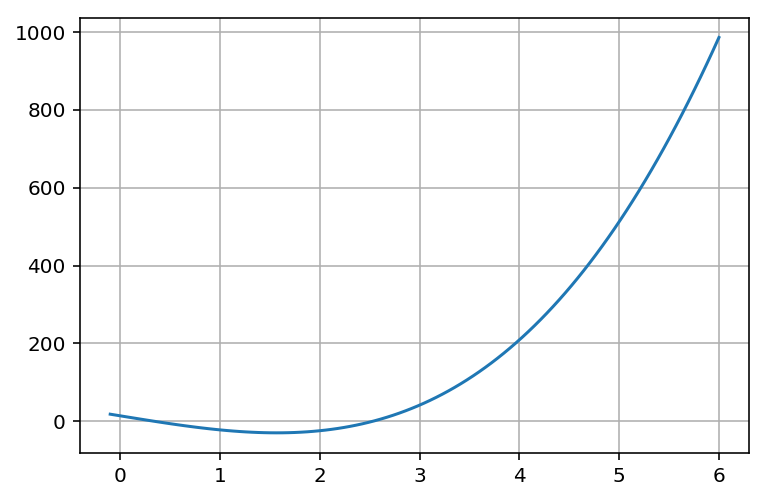

In [409]:
plot(r, a*r**3 + b*r + c)
grid()

In [333]:
2**(5/4.)*(3./4)**(-.5)

2.7463561918761568

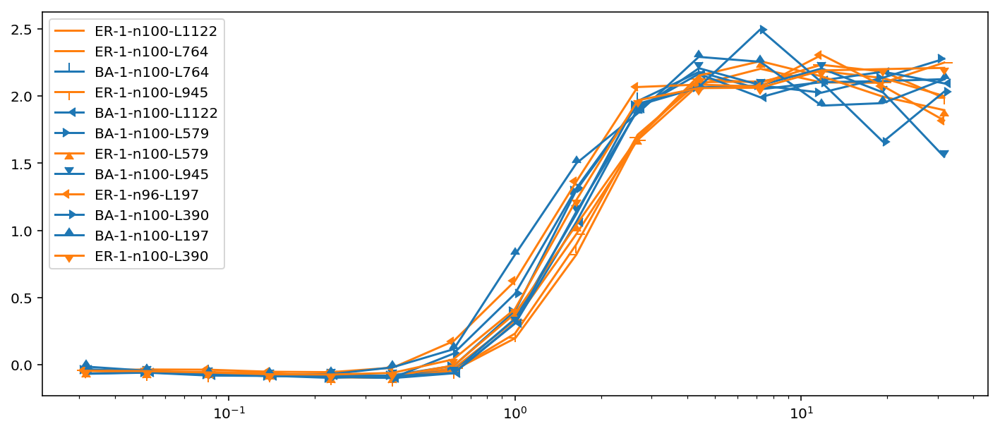

In [334]:
figure(figsize= (12,5))
ii = 0
for k,lth in stats.iteritems(): 
#     if k == 'BA-0-n50-L97': continue
    c = (mt['tab:blue'] if 'BA' in k else mt['tab:orange'])
    r_c = rs(sd(k,'n'),sd(k,'L'))
    plot(lth.T[0]/r_c,gradient(log(lth.T[1]))/gradient(log(lth.T[0]/r_c)), 
         marker=ii %12, 
         ls='-'*(ii/12+1),c=c,label = k)
    xscale('log')
    ii +=1
    
legend(fontsize=10)
x = array([1,100])

# plot(5*x,1e1*x,'k')

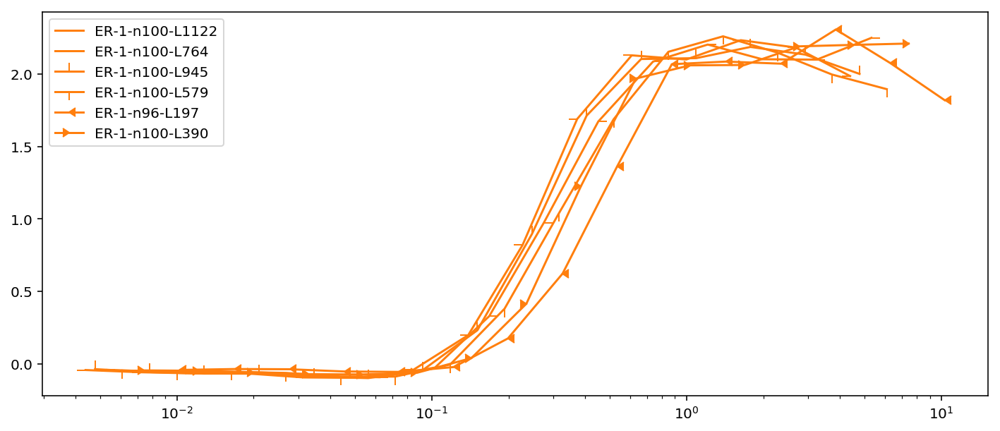

In [453]:
figure(figsize= (12,5))
ii = 0
for k,lth in stats.iteritems(): 
    if 'BA' in k:continue
#     if k == 'BA-0-n50-L97': continue

    c = (mt['tab:blue'] if 'BA' in k else mt['tab:orange'])
    r_c = 1 #rs(sd(k,'n'),sd(k,'L'))
    plot(lth.T[0]/r_c,gradient(log(lth.T[1]))/gradient(log(lth.T[0]/r_c)), 
         marker=ii %12, 
         ls='-'*(ii/12+1),c=c,label = k)
    xscale('log')
    ii +=1
    
legend(fontsize=10)
x = array([1,100])

# plot(5*x,1e1*x,'k')

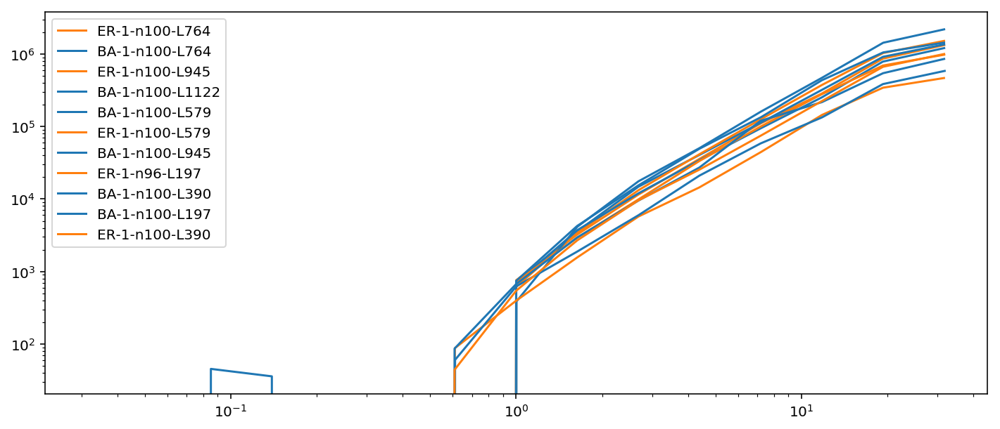

In [285]:
figure(figsize= (12,5))
ii = 0
for k,lth in stats.iteritems(): 
    c = (mt['tab:blue'] if 'BA' in k else mt['tab:orange'])
    r_c = rs(sd(k,'n'),sd(k,'L'))
    plot(lth.T[0]/r_c,gradient((lth.T[1]))/gradient(log(lth.T[0]/r_c)), 
         # marker=ii %12, 
         ls='-'*(ii/12+1),c=c,label = k)
    xscale('log')
    yscale('log')
    ii +=1
    
legend(fontsize=10)
x = array([1,100])

# plot(5*x,1e1*x,'k')

In [287]:
[i for i in os.listdir('../../output/phase-finite-032818/') if 'Lat' in i and 'seg' not in i and 'txt' not in  i]

['Lat-0-n500-L1309.json',
 'Lat-0-n600-L1580.json',
 'Lat-0-n700-L1860.json',
 'Lat-0-n300-L760.json',
 'Lat-0-n150-L359.json',
 'Lat-0-n400-L1030.json']

In [292]:
760/300., 359/150., 1030./400

(2.533333333333333, 2.3933333333333335, 2.575)

In [164]:
.3**2, .3/10, 1/ sqrt(50)

(0.09, 0.03, 0.1414213562373095)

In [165]:
#./run_all_th4.py ../../output/phase-finite-032418/BA-0-n100-L197.json 0 "{'fixed':0}"
#./run_all_th4.py ../../output/phase-finite-032418/ER-0-n97-L197.json 2 "{'fixed':0}"
#./run_all_th4.py ../../output/phase-finite-032418/BA-0-n50-L97.json 1 "{'fixed':0}"
#./run_all_th4.py ../../output/phase-finite-032418/ER-0-n50-L97.json 3 "{'fixed':0}"

#./run_all_th4.py ../../output/phase-finite-032418/BA-0-n200-L397.json 1 "{'fixed':0}"
#./run_all_th4.py ../../output/phase-finite-032418/ER-0-n197-L397.json 3 "{'fixed':0}"